In [16]:
from collections import defaultdict
from itertools import combinations

import json
import requests

In [17]:
def map_nodes(current_map):
    # mostly a helper for the functions that follow
    node_list = defaultdict(list)

    for node in current_map['nodes']:
        node_list[node['type']].append(node['nodeID'])

    return node_list

In [18]:
def find_premises(current_map, nodes):
    non_premises = []

    for edge in current_map['edges']:
        if edge['fromID'] in nodes['RA'] and edge['toID'] in nodes['I']:
            non_premises.append(edge['toID'])

    premises = [x for x in nodes['I'] if x not in non_premises]

    return ';'.join(premises)

In [19]:
def find_rules(current_map, nodes):
    rules = ''
    
    # iterating through the RA nodes
    for x, node in enumerate(nodes['RA'], start=1):
        from_nodes = []
        to_node = None
        
        for edge in current_map['edges']:
            # if the edge is pointing to a RA node and from an I node, save it
            if edge['toID'] == node and edge['fromID'] in nodes['I']:
                from_nodes.append(edge['fromID'])
            
            # likewise if edge is from an RA node and pointing to an I node, save it
            if edge['fromID'] == node and edge['toID'] in nodes['I']:
                to_node = edge['toID']
            
        if len(from_nodes) != 0 and to_node is not None:
            rules = rules + '[r' + str(x) + '] ' + ','.join(from_nodes) + '=>' + to_node + ';'

    return rules

In [20]:
def find_contrariness(current_map, nodes):
    contrariness = ''
    pairs = []

    for node in nodes['CA']:

        f_node, t_node = None, None
        for x in current_map['edges']:
            if x['toID'] == node and x['fromID'] in nodes['I']:
                f_node = x['fromID']

            if x['fromID'] == node and x['toID'] in nodes['I']:
                t_node = x['toID']

            if f_node is not None and t_node is not None:
                pairs.append((f_node, t_node))
                break

    excess = []
    for a, b in combinations(pairs, 2):
        if set(a) == set(b):
            contrariness += str(a[0]) + '-' + str(a[1]) + ';'
            excess.append(b)

    pairs = [x for x in pairs if x not in set(excess)]

    for f_node, t_node in pairs:
        contrariness += (str(f_node) + '^' + str(t_node) + ';')

    return contrariness

In [43]:
def get_web_input(current_map, node_list):
    webservice_input = {'transposition': True,
                        'premises': '',
                        'link': 'last',
                        'rules': '',
                        'kbPrefs': '',
                        'semantics': 'preferred',
                        'contrariness': '',
                        'rulePrefs': ''}

    funcs = [find_premises, find_rules, find_contrariness]
    keys = ['premises', 'rules', 'contrariness']
    
    for f, k in zip(funcs, keys):
        webservice_input[k] = f(current_map, node_list)

    print(webservice_input)
    return json.dumps(webservice_input)

In [27]:
def rename_nodes(input_str, node_list):
    # rename all the nodes to shorter strings
    new_names = {}
    for i, node_num in enumerate(node_list['I'], start=1):
        new_names[node_num] = 'Q' + str(i)
    
    print(new_names)
    for k, v in new_names.items():
        input_str = input_str.replace(k, v)
        
    return input_str

In [56]:
test_link = "http://www.aifdb.org/json/6259"

r = requests.get(test_link)
if r.status_code == requests.codes.ok:
    print('download success')

# test to see we get the string we are looking for
result = convert_to_abstract(r.json())
print(result)

download success
116414
116418
116426
116434
{'transposition': True, 'premises': '43442;43448;43462;43474;43478;43494;116443;116450', 'link': 'last', 'rules': '[r1] 43462=>43453;[r2] 43474=>43488;[r4] 43474=>43468;[r5] 43494=>43488;[r6] 43488=>43500;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '43448^43442;43453^43448;43462^43468;43474^43478;', 'rulePrefs': ''}
{'43442': 'Q0', '43448': 'Q1', '43453': 'Q2', '43462': 'Q3', '43468': 'Q4', '43474': 'Q5', '43478': 'Q6', '43488': 'Q7', '43494': 'Q8', '43500': 'Q9', '116443': 'Q10', '116450': 'Q11'}
<Response [200]>
200
{"defeats":["A2>A6","A3>A0","A5>A7","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}


In [75]:
test_link = "http://www.aifdb.org/json/9338"

r = requests.get(test_link)
if r.status_code == requests.codes.ok:
    print('download success')

# test to see we get the string we are looking for
result = convert_to_abstract(r.json())
print(result)

download success
177160
177161
177162
177163
177166
177173
177177
177184
177186
177191
{'transposition': True, 'premises': '177139;177144;177147;177149;177153;177156;177158;177159;177164;177167;177169;177176;177181;177183;177185;177187;177189;177190', 'link': 'last', 'rules': '[r1] 177144=>177143;[r2] 177139=>177143;[r3] 177153=>177150;[r4] 177156=>177155;[r5] 177164=>177165;[r6] 177164=>177168;[r9] 177181=>177180;[r10] 177190=>177192;[r11] 177189=>177192;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '177155-177143;177159^177156;177158^177156;177155^177143;177165^177159;177168^177159;177176^177169;177183^177168;177189^177144;', 'rulePrefs': ''}
{'177139': 'Q0', '177143': 'Q1', '177144': 'Q2', '177147': 'Q3', '177149': 'Q4', '177150': 'Q5', '177153': 'Q6', '177155': 'Q7', '177156': 'Q8', '177158': 'Q9', '177159': 'Q10', '177164': 'Q11', '177165': 'Q12', '177167': 'Q13', '177168': 'Q14', '177169': 'Q15', '177174': 'Q16', '177176': 'Q17', '177180': 'Q18', '177181': 'Q19', '1

In [110]:
# convert abstract format to aspartix/trivial graph format
def convert_to_tgf(result):
    graph_tgf = ''

    for argument in result['arguments']:
        graph_tgf += argument + '\n'

    graph_tgf += '#\n'

    for attack in result['defeats']:
        graph_tgf += attack.split('>')[0] + ' ' + attack.split('>')[1] + '\n'

    return graph_tgf

In [131]:
# count the number of conflict cycles
def count_cycles(abstract):
    count = 0
    involved = []
    
    for attack in abstract['defeats']:
        involved.append(attack.split('>'))
    print(involved)
        
    for a, b in combinations(involved, 2):
        if set(a) == set(b):
            count += 1
    
    return count

def count_edges(abstract):
    return len(abstract['defeats'])

def count_nodes(abstract):
    return len(abstract['arguments'])

def calculate_density(abstract):
    e = count_edges(abstract)
    v = count_nodes(abstract)
    
    try:
        return e / (v * (v - 1))
    except ZeroDivisionError:
        return 0

# average degree?q

In [132]:
# stats functions
# do all in one go so that don't have to check database over and over again

# 1 get names of collections
# 2 get all docs
# 3 count nodes, edges, sparsity, evaluation time
# -> save as dictionary? throw in to mongo as well (why not?)
# 4 draw graphs based on results
# 5 

# import missing libs
import pymongo
import time

mongo = pymongo.MongoClient()
collection_names = mongo['arguments'].collection_names()

current_number = 0

for col in collection_names:
    cursor = mongo['arguments'][col].find()
    
    for argument in cursor:
        print(argument['_id'])
        current_number += 1
        current_percentage = current_number / 11744 * 100
        if current_percentage % 10 == 0:
            print('--------------------------------------------------------' + 
                  str(current_percentage) + '%' +
                 '--------------------------------------------------------')
            
        node_list = map_nodes(argument)        
        input_string = rename_nodes(get_web_input(argument, node_list))
        print(input_string)
        if input_string is not None:
            abstract_form = convert_to_abstract(input_string)
            if abstract_form is not None:
                _modified_map = {}
                _modified_map['abstract'] = abstract_form

                _modified_map['tgf_form'] = convert_to_tgf(json.loads(abstract_form))
                _modified_map['node_count'] = count_nodes(json.loads(abstract_form))
                _modified_map['edge_count'] = count_edges(json.loads(abstract_form))
                _modified_map['cycles_count'] = count_cycles(json.loads(abstract_form))
                _modified_map['sparsity'] = calculate_sparsity(json.loads(abstract_form))
                _modified_map['_id'] = argument['_id']

                start = time.time()
                evaluate(input_string)
                time_taken = time.time() - start
                _modified_map['evaluation_time'] = time_taken

                print(_modified_map)
                print('+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')

                mongo['abstract']['tgf_stats'].replace_one({'_id': argument['_id']}, _modified_map, upsert=True)

8880
{'transposition': True, 'premises': '165010;165011', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'165010': 'Q0', '165011': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8880', 'evaluation_time': 0.02353191375732422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8863
{'transposition': True, 'premises': '164926;164927', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'164926': 'Q0', '164927': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rule

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8843', 'evaluation_time': 0.025035619735717773}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8870
{'transposition': True, 'premises': '164980;164981', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'164980': 'Q0', '164981': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8870', 'evaluation_time': 0.026061296463012695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8851
{'transposition': True, 'premises': '164884;164885', 'link': 'la

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6996', 'evaluation_time': 0.024566650390625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8872
{'transposition': True, 'premises': '164986;164987', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'164986': 'Q0', '164987': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8872', 'evaluation_time': 0.02359175682067871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8856
{'transposition': True, 'premises': '164901;164

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8860', 'evaluation_time': 0.02907848358154297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8878
{'transposition': True, 'premises': '165004;165005', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'165004': 'Q0', '165005': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8878', 'evaluation_time': 0.027071475982666016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8875
{'

{'abstract': '{"defeats":["A5>A1","A5>A10","A5>A3","A5>A9","A7>A4","A7>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA5 A1A5 A10A5 A3A5 A9A7 A4A7 A5', 'node_count': 11, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.10909090909090909, '_id': '12024', 'evaluation_time': 0.024562835693359375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
12128
{'transposition': True, 'premises': '291700;291714;291728;291735', 'link': 'last', 'rules': '[r1] 291700=>291696;[r2] 291714=>291707;[r3] 291728=>291721;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '291707^291696;', 'rulePrefs': ''}
{'291696': 'Q0', '291700': 'Q1', '291707': 'Q2', '291714': 'Q3', '291721': 'Q4', '291728': 'Q5', '291735': 'Q6'}
{"transposition": true, "premises": "Q1;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;[r3] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q0;", "r

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\n', 'node_count': 22, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10666', 'evaluation_time': 0.0245816707611084}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10725
{'transposition': True, 'premises': '240116;240186;245121;245123;245128;245134;245139;245144;245165', 'link': 'last', 'rules': '[r1] 245144=>240109;[r2] 240116=>245155;[r3] 240186=>171624;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'171624': 'Q0', '240109': 'Q1', '240116': 'Q2', '240186': 'Q3', '245121': 'Q4', '245123': 'Q5', '245128': 'Q6', '245134': 'Q7', '245139': 'Q8', '245144': 'Q9', '245155': 'Q10', '245165': 'Q11'}
{"transposition": true, "premises"

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10821', 'evaluation_time': 0.022557973861694336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10863
{'transposition': True, 'premises': '191203;191216;191226;257012;257034;257041', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '257021^191203;', 'rulePrefs': ''}
{'191203': 'Q0', '191216': 'Q1', '191226': 'Q2', '257012': 'Q3', '257021': 'Q4', '257034': 'Q5', '257041': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q6", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q0;", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0

200
[['A1', 'A4'], ['A5', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A4","A5>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA1 A4A5 A7', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '2086', 'evaluation_time': 0.02657032012939453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2087
{'transposition': True, 'premises': '41233;41238;41265', 'link': 'last', 'rules': '[r1] 41238=>41244;[r2] 41250=>41244;[r3] 41259=>41250;[r4] 41265=>41259;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '41233^41238;', 'rulePrefs': ''}
{'41233': 'Q0', '41238': 'Q1', '41244': 'Q2', '41250': 'Q3', '41259': 'Q4', '41265': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q5", "link": "last", "rules": "[r1] Q1=>Q2;[r2] Q3=>Q2;[r3] Q4=>Q3;[r4] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [

[['A2', 'A4'], ['A3', 'A1'], ['A3', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A4","A3>A1","A3>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A4A3 A1A3 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '2167', 'evaluation_time': 0.025084972381591797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2168
{'transposition': True, 'premises': '45240;45243;45247;45250;45259;45263;45273;45290;45305;45311;45334;45340', 'link': 'last', 'rules': '[r1] 45247=>45253;[r2] 45278=>45267;[r3] 45284=>45278;[r4] 45290=>45284;[r5] 45290,45305=>45296;[r6] 45311=>45317;[r7] 45311=>45323;[r8] 45334=>45329;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '45263^45267;45305^45311;', 'rulePrefs': ''}
{'45240': 'Q0', '45243': 'Q1', '45247': 'Q2', '45250': 'Q3', '45253': 'Q4', '45259': 'Q5', '45263': 'Q6', '45267': 'Q7', '45273': 'Q8', '45278': 'Q9', '45284': 'Q10', '45290': 'Q11', '45296': 'Q12'

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2342', 'evaluation_time': 0.024535655975341797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2345
{'transposition': True, 'premises': '48384;48393', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48393^48384;', 'rulePrefs': ''}
{'48384': 'Q0', '48393': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2345', 'evaluation_time': 0.023090839385986328}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA0 A2', 'node_count': 9, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.027777777777777776, '_id': '4727', 'evaluation_time': 0.026571273803710938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4728
{'transposition': True, 'premises': '68792;68809;68816;68826;68838;68852;68859;68866;68873;68877;68882;68888;69307;69309;69315;69317;69321', 'link': 'last', 'rules': '[r1] 68809=>68803;[r2] 68826=>68821;[r3] 68838=>68833;[r4] 68852=>68845;[r5] 68859=>68845;[r6] 69315=>68894;[r7] 69309=>69308;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '68845^68838;68866^68833;69317^69315;', 'rulePrefs': ''}
{'68792': 'Q0', '68803': 'Q1', '68809': 'Q2', '68816': 'Q3', '68821': 'Q4', '68826': 'Q5', '68833': 'Q6', '68838': 'Q7', '68845': 'Q8', '68852': 'Q9', '68859': 'Q10', '68866': 'Q11', '68873': 'Q12', '68877': 'Q13', '68882': '

{'abstract': '{"defeats":["A2>A1","A11>A9","A23>A25","A24>A25","A4>A5","A26>A11","A26>A12","A15>A13","A15>A14","A16>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA2 A1A11 A9A23 A25A24 A25A4 A5A26 A11A26 A12A15 A13A15 A14A16 A8', 'node_count': 28, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.026455026455026454, '_id': '5987', 'evaluation_time': 0.02610921859741211}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5988
{'transposition': True, 'premises': '40454;40464;40468;40483;40486;40495;40507;40519;40537;40540;40543;40546;40552;40558;40561;40565;40573;40581;40584;40590', 'link': 'last', 'rules': '[r1] 40468,40486=>40457;[r2] 40468,40483=>40477;[r3] 40486=>40489;[r4] 40507=>40501;[r5] 40513=>4

{'abstract': '{"defeats":["A2>A1","A2>A22","A2>A0","A3>A2","A4>A6","A14>A20","A5>A3","A16>A21"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\n#\nA2 A1A2 A22A2 A0A3 A2A4 A6A14 A20A5 A3A16 A21', 'node_count': 23, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.03162055335968379, '_id': '5996', 'evaluation_time': 0.028048276901245117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5998
{'transposition': True, 'premises': '41762;41772;41790;41793;41822;41834;41852;41858;41870;42016;42022', 'link': 'last', 'rules': '[r1] 41762=>41759;[r2] 41772=>41769;[r3] 41772=>41778;[r4] 41790=>41784;[r5] 41772=>41802;[r6] 41802=>41808;[r7] 41808=>41814;[r8] 41834=>41828;[r9] 41834=>41840;[r10] 41852=>41846;[r11] 41870=>41864;', 'kbPrefs': '', 'semantics': 'preferred', 'contra

<Response [200]>
200
{'abstract': '{"defeats":["A3>A16","A3>A0","A4>A16","A4>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA3 A16A3 A0A4 A16A4 A0', 'node_count': 18, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.026143790849673203, '_id': '1984', 'evaluation_time': 0.02658843994140625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2034
{'transposition': True, 'premises': '37838;37852;38532;38538', 'link': 'last', 'rules': '[r1] 37852=>37855;[r2] 37838=>37835;[r3] 37845=>37835;[r4] 38538=>37845;[r5] 37852=>37835;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'37835': 'Q0', '37838': 'Q1', '37845': 'Q2', '37852': 'Q3', '37855': 'Q4', '38532': 'Q5', '38538': 'Q6'}
{"transposition": true, "premises": "Q1;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q3=>Q4;[r2] Q1=>Q0;[r3] Q2

200
[['A1', 'A0'], ['A4', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A4>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA1 A0A4 A3', 'node_count': 9, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.05555555555555555, '_id': '4539', 'evaluation_time': 0.024091243743896484}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4540
{'transposition': True, 'premises': '37887;37894;45995;64675;64705', 'link': 'last', 'rules': '[r1] 45995=>37873;[r2] 64675=>64693;[r3] 37894=>64693;[r4] 64705=>64702;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '45995^64675;37887^45995;', 'rulePrefs': ''}
{'37873': 'Q0', '37887': 'Q1', '37894': 'Q2', '45995': 'Q3', '64675': 'Q4', '64693': 'Q5', '64702': 'Q6', '64705': 'Q7'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q7", "link": "last", "rules": "[r1] Q3=>Q0;[r2] Q4=>Q5;[r3] Q2=>Q5;[r4] Q7=>Q6;", "kbPrefs": "", "semantics": "preferred", "con

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4824', 'evaluation_time': 0.028071165084838867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4825
{'transposition': True, 'premises': '71064;71068;71073;71078;71086;71091;71097;71101;71107;71111;71116;71120;71124;71129;71134;71149;71156', 'link': 'last', 'rules': '[r1] 71149,71156=>71144;[r2] 71144=>71160;[r3] 71160=>71139;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'71064': 'Q0', '71068': 'Q1', '71073': 'Q2', '71078': 'Q3', '71086': 'Q4', '71091': 'Q5', '71097': 'Q6', '71101': 'Q7', '71107': 'Q8', '71111': 'Q9', '71116': 'Q10', '71120': 'Q11', '71124': 'Q12', '71129': 'Q13', '71134': 'Q14', '71139': 'Q15', '71144': 'Q16', '71149': 'Q17', '71156': 'Q18', '71160': 'Q19'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8

[['A8', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A8>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA8 A4', 'node_count': 9, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.027777777777777776, '_id': '11023', 'evaluation_time': 0.025082111358642578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11025
{'transposition': True, 'premises': '70940;176369;261843;261852', 'link': 'last', 'rules': '[r1] 261843=>261837;[r2] 261843=>70914;[r3] 261852=>70931;[r4] 70940=>70931;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'70914': 'Q0', '70931': 'Q1', '70940': 'Q2', '176369': 'Q3', '261837': 'Q4', '261843': 'Q5', '261852': 'Q6'}
{"transposition": true, "premises": "Q2;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q5=>Q4;[r2] Q5=>Q0;[r3] Q6=>Q1;[r4] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Respons

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11427', 'evaluation_time': 0.02707052230834961}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11428
{'transposition': True, 'premises': '272111', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'272111': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11428', 'evaluation_time': 0.029078245162963867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11429
{'transposition': True, 'premises': '70831;272116', 'link': 'last

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9179', 'evaluation_time': 0.025043487548828125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9509
{'transposition': True, 'premises': '184180;184187;184194;184199;184206;184210;184215;184222;184226;184231;184238;184250', 'link': 'last', 'rules': '[r1] 184180=>184176;[r2] 184187=>184176;[r3] 184222,184231=>184243;[r4] 184250=>184243;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'184176': 'Q0', '184180': 'Q1', '184187': 'Q2', '184194': 'Q3', '184199': 'Q4', '184206': 'Q5', '184210': 'Q6', '184215': 'Q7', '184222': 'Q8', '184226': 'Q9', '184231': 'Q10', '184238': 'Q11', '184243': 'Q12', '184250': 'Q13'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9;Q10;Q11;Q13", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;[r3] Q8,Q10=>Q12;[r4] Q13=>Q12;", "kbPrefs":

{'transposition': True, 'premises': '25269;38659;46085;46177;46192;70940;176267;176280;176287;176292;176302;176369', 'link': 'last', 'rules': '[r1] 46177,176267=>176255;[r2] 46177,176267=>46186;[r3] 46192=>46186;[r4] 176302,25269=>176297;[r5] 176302=>70931;[r6] 38659=>176374;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '176255^46085;176280^176255;', 'rulePrefs': ''}
{'25269': 'Q0', '38659': 'Q1', '46085': 'Q2', '46177': 'Q3', '46186': 'Q4', '46192': 'Q5', '70931': 'Q6', '70940': 'Q7', '176255': 'Q8', '176267': 'Q9', '176280': 'Q10', '176287': 'Q11', '176292': 'Q12', '176297': 'Q13', '176302': 'Q14', '176369': 'Q15', '176374': 'Q16'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q7;Q9;Q10;Q11;Q12;Q14;Q15", "link": "last", "rules": "[r1] Q3,Q9=>Q8;[r2] Q3,Q9=>Q4;[r3] Q5=>Q4;[r4] Q14,Q0=>Q13;[r5] Q14=>Q6;[r6] Q1=>Q16;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q8^Q2;Q10^Q8;", "rulePrefs": ""}
<Response [200]>
200
[['A10', 'A1'], ['A12', 'A10']]
<Respo

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12408', 'evaluation_time': 0.020580768585205078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9873
{'transposition': True, 'premises': '191464;191468;191473', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'191464': 'Q0', '191468': 'Q1', '191473': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9873', 'evaluation_time': 0.023559093475341797}
+++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9232', 'evaluation_time': 0.02509760856628418}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9870
{'transposition': True, 'premises': '39628;191314;191318;191331;191342;191348;191353;191362', 'link': 'last', 'rules': '[r1] 191353,191362=>191372;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'39628': 'Q0', '191314': 'Q1', '191318': 'Q2', '191331': 'Q3', '191342': 'Q4', '191348': 'Q5', '191353': 'Q6', '191362': 'Q7', '191372': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q6,Q7=>Q8;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2

9139
{'transposition': True, 'premises': '45472;45477;170956', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'45472': 'Q0', '45477': 'Q1', '170956': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9139', 'evaluation_time': 0.02358698844909668}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6752
{'transposition': True, 'premises': '129556;129560;129570', 'link': 'last', 'rules': '[r1] 129570=>129577;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'129556': 'Q0', '129560': 'Q1', '129570': 'Q2', '129577': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2", "l

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5906', 'evaluation_time': 0.023594379425048828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9256
{'transposition': True, 'premises': '175048;175052;175057;175061;175067', 'link': 'last', 'rules': '[r2] 175061=>175077;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'175048': 'Q0', '175052': 'Q1', '175057': 'Q2', '175061': 'Q3', '175067': 'Q4', '175077': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "[r2] Q3=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity'

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4845', 'evaluation_time': 0.023548364639282227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9271
{'transposition': True, 'premises': '175720;175727;175732;175737;175748;175755', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'175720': 'Q0', '175727': 'Q1', '175732': 'Q2', '175737': 'Q3', '175748': 'Q4', '175755': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9500', 'evaluation_time': 0.023061037063598633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9260
{'transposition': True, 'premises': '173581;175168;175172;175175;175183', 'link': 'last', 'rules': '[r1] 175183=>175192;[r2] 173581=>175205;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '175205^175192;', 'rulePrefs': ''}
{'173581': 'Q0', '175168': 'Q1', '175172': 'Q2', '175175': 'Q3', '175183': 'Q4', '175192': 'Q5', '175205': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q4=>Q5;[r2] Q0=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q6^Q5;", "rulePrefs": ""}
<Response [200]>
200
[['A6', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A6>A4"],"arguments":["A0","A1","A2","A3","A4

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9258', 'evaluation_time': 0.023085832595825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9871
{'transposition': True, 'premises': '191381;191385;191398;191403', 'link': 'last', 'rules': '[r1] 191385=>191388;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'191381': 'Q0', '191385': 'Q1', '191388': 'Q2', '191398': 'Q3', '191403': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4", "link": "last", "rules": "[r1] Q1=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sp

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9824', 'evaluation_time': 0.02357172966003418}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6745
{'transposition': True, 'premises': '129422;129429;129441;129448;129452;129457;129467;129471;129476', 'link': 'last', 'rules': '[r1] 129422=>129415;[r2] 129441,129448=>129436;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '129429^129415;129457^129452;', 'rulePrefs': ''}
{'129415': 'Q0', '129422': 'Q1', '129429': 'Q2', '129436': 'Q3', '129441': 'Q4', '129448': 'Q5', '129452': 'Q6', '129457': 'Q7', '129467': 'Q8', '129471': 'Q9', '129476': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q5;Q6;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4,Q5=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness":

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9863', 'evaluation_time': 0.02303171157836914}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9157
{'transposition': True, 'premises': '171603;171607;171614;171619', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'171603': 'Q0', '171607': 'Q1', '171614': 'Q2', '171619': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9157', 'evaluation_time': 0.022556066513061523}
+++++++++

<Response [200]>
200
[['A1', 'A48'], ['A23', 'A3'], ['A14', 'A12'], ['A7', 'A14'], ['A7', 'A8'], ['A40', 'A37']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A48","A23>A3","A14>A12","A7>A14","A7>A8","A40>A37"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\n#\nA1 A48A23 A3A14 A12A7 A14A7 A8A40 A37', 'node_count': 49, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.00510204081632653, '_id': '9460', 'evaluation_time': 0.02660346031188965}
++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A10","A1>A9","A2>A1","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA1 A10A1 A9A2 A1A7 A6', 'node_count': 11, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.07272727272727272, '_id': '9154', 'evaluation_time': 0.029077768325805664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10279
{'transposition': True, 'premises': '171057;202812;202814;202826', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'171057': 'Q0', '202812': 'Q1', '202814': 'Q2', '202826': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9929', 'evaluation_time': 0.02109503746032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9908
{'transposition': True, 'premises': '40840;40864;192291;192297;192321;192327;192334;192363;192384;192389;192399;192410;192420;192423', 'link': 'last', 'rules': '[r1] 40840=>192310;[r2] 192321=>192318;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '192423^192410;', 'rulePrefs': ''}
{'40840': 'Q0', '40864': 'Q1', '192291': 'Q2', '192297': 'Q3', '192310': 'Q4', '192318': 'Q5', '192321': 'Q6', '192327': 'Q7', '192334': 'Q8', '192363': 'Q9', '192384': 'Q10', '192389': 'Q11', '192399': 'Q12', '192410': 'Q13', '192420': 'Q14', '192423': 'Q15'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q6;Q7;Q8;Q9;Q10;Q11;Q12;Q13;Q14;Q15", "link": "last", "rules": "[r1] Q0=>Q4;[

4942
{'transposition': True, 'premises': '78361;78372;78377;78382;78387;78392;78397;78402;78407;78412;78417;78422;78427;78432;78437;78442;78447;78452;78457;78462;78467;78472;78477;78482;78487;78492;78497;78502;78513;78524;78529;78534;78539;78544;78549;78560;78565;78570;78575;78580', 'link': 'last', 'rules': '[r1] 78361=>78366;[r2] 78513=>78507;[r3] 78524=>78518;[r4] 78549=>78554;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'78361': 'Q0', '78366': 'Q1', '78372': 'Q2', '78377': 'Q3', '78382': 'Q4', '78387': 'Q5', '78392': 'Q6', '78397': 'Q7', '78402': 'Q8', '78407': 'Q9', '78412': 'Q10', '78417': 'Q11', '78422': 'Q12', '78427': 'Q13', '78432': 'Q14', '78437': 'Q15', '78442': 'Q16', '78447': 'Q17', '78452': 'Q18', '78457': 'Q19', '78462': 'Q20', '78467': 'Q21', '78472': 'Q22', '78477': 'Q23', '78482': 'Q24', '78487': 'Q25', '78492': 'Q26', '78497': 'Q27', '78502': 'Q28', '78507': 'Q29', '78513': 'Q30', '78518': 'Q31', '78524': 'Q32', '78529': 'Q33', '7

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\n#\n', 'node_count': 36, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5585', 'evaluation_time': 0.02607274055480957}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5584
{'transposition': True, 'premises': '74350;74355;74360;74371;74376;74387;74392;74403;74408;74413;74418;74423;74428;74433;74438;74443;74448;74453;74458;74463;74468;74478;74483;74488;74493;74498', 'link': 'last', 'rules': '[r1] 74360=>74365;[r2] 74376=>74381;[r3] 74403=>74397;[r4] 74478=>74473;[r5] 74483=>74473;', 'kbPrefs': '', 'semantics': 'prefe

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\n#\n', 'node_count': 35, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4935', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4983
{'transposition': True, 'premises': '82952;82957;82962;82967;82972;82977;82988;82999;83004;83009;83014;83019;83024', 'link': 'last', 'rules': '[r1] 82988=>82982;[r2] 82999=>82993;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'82952': 'Q0', '82957': 'Q1', '82962': 'Q2', '82967': 'Q3', '82972': 'Q4', '82977': 'Q5', '82982': 'Q6', '82988': 'Q7'

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5015
{'transposition': True, 'premises': '81281;91306;91311;91507;91512;91517;91529;91534;91539;91554;91559;91567;91572;91577;91582;91587;91592', 'link': 'last', 'rules': '[r1] 91512=>91522;[r2] 91517=>91522;[r3] 91539=>91544;[r4] 91587,91592=>91597;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'81281': 'Q0', '91306': 'Q1', '91311': 'Q2', '91507': 'Q3', '91512': 'Q4', '91517': 'Q5', '91522': 'Q6', '91529': 'Q7', '91534': 'Q8', '91539': 'Q9', '91544': 'Q10', '91554': 'Q11', '91559': 'Q12', '91567': 'Q13', '91572': 'Q14', '91577': 'Q15', '91582': 'Q16', '91587': 'Q17', '91592': 'Q18', '91597': 'Q19'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q7;Q8;Q9;Q11;Q12;Q13;Q14;Q15;Q16;Q17;Q18", "link": "last", "rules": "[r1] Q4=>Q6;[r2] Q5=>Q6;[r3] Q9=>Q10;[r4] Q17,Q18=>Q19;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\nA60\nA61\nA62\nA63\nA64\nA65\nA66\nA67\nA68\nA69\nA70\nA71\nA72\nA73\nA74\nA75\n#\n', 'node_count': 76, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1745', 'evaluation_time': 0.028568029403686523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1718
{'transposition': True, 'premises': '33172;33173;33174', 'link': 'last', 'rules': '[r1] 33172=>33171;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'33171': 'Q0', '33172': 'Q1', '33173': 'Q2', '33174': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1718', 'evaluation_time': 0.024539

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1634', 'evaluation_time': 0.025568008422851562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6016
{'transposition': True, 'premises': '30971;30974;30980;30984;30992;30998', 'link': 'last', 'rules': '[r1] 30992=>30988;[r2] 30998=>30988;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'30971': 'Q0', '30974': 'Q1', '30980': 'Q2', '30984': 'Q3', '30988': 'Q4', '30992': 'Q5', '30998': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q5=>Q4;[r2] Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2051', 'evaluation_time': 0.026048660278320312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2205
{'transposition': True, 'premises': '46572;46579;46580;46582;46583', 'link': 'last', 'rules': '[r1] 46580=>46581;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'46572': 'Q0', '46579': 'Q1', '46580': 'Q2', '46581': 'Q3', '46582': 'Q4', '46583': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5", "link": "last", "rules": "[r1] Q2=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsit

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12094', 'evaluation_time': 0.026591062545776367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
12103
{'transposition': True, 'premises': '286601;286612;286614;286615', 'link': 'last', 'rules': '[r1] 286614=>286600;[r2] 286615=>286600;[r3] 286611=>286610;[r4] 286612=>286611;[r5] 286612=>286613;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'286600': 'Q0', '286601': 'Q1', '286610': 'Q2', '286611': 'Q3', '286612': 'Q4', '286613': 'Q5', '286614': 'Q6', '286615': 'Q7'}
{"transposition": true, "premises": "Q1;Q4;Q6;Q7", "link": "last", "rules": "[r1] Q6=>Q0;[r2] Q7=>Q0;[r3] Q3=>Q2;[r4] Q4=>Q3;[r5] Q4=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abs

{'abstract': '{"defeats":["A5>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA5 A4', 'node_count': 10, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.022222222222222223, '_id': '5871', 'evaluation_time': 0.024079084396362305}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5982
{'transposition': True, 'premises': '39475;39482;39488;39500;39504;39516;39522;39528;39543;39547;39551;39555;39561;39566;39572;39576;39582;39585;39601;39605;39611;39617;39620;39628', 'link': 'last', 'rules': '[r1] 39488=>39478;[r2] 39510=>39494;[r3] 39516=>39510;[r4] 39528=>39537;[r5] 39585=>39592;[r6] 39611=>39598;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '39482^39478;39555^39551;39605^39598;', 'rulePrefs': ''}
{'39475': 'Q0', '39478': 'Q1', '39482': 'Q2', '39488': 'Q3', '39494': 'Q4', '39500': 'Q5', '39504': 'Q6', '39510': 'Q7', '39516': 'Q8', '39522': 'Q9', '39528': 'Q10', '39537': 'Q11', '39543':

[['A10', 'A11'], ['A22', 'A4'], ['A23', 'A24'], ['A12', 'A4'], ['A13', 'A0'], ['A14', 'A17'], ['A15', 'A4'], ['A16', 'A4'], ['A18', 'A21'], ['A19', 'A4'], ['A3', 'A4'], ['A5', 'A4'], ['A6', 'A24'], ['A7', 'A8'], ['A9', 'A11'], ['A20', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A22>A4","A23>A24","A12>A4","A13>A0","A14>A17","A15>A4","A16>A4","A18>A21","A19>A4","A3>A4","A5>A4","A6>A24","A7>A8","A9>A11","A20>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA10 A11A22 A4A23 A24A12 A4A13 A0A14 A17A15 A4A16 A4A18 A21A19 A4A3 A4A5 A4A6 A24A7 A8A9 A11A20 A0', 'node_count': 25, 'edge_count': 16, 'cycles_count': 0, 'sparsity': 0.05333333333333334, '_id': '11627', 'evaluation_time': 0.024562835693359375}
++++++++++++++++++++++++++++++++

[['A1', 'A17'], ['A1', 'A18'], ['A11', 'A17'], ['A11', 'A18'], ['A12', 'A17'], ['A12', 'A18'], ['A13', 'A17'], ['A13', 'A18'], ['A14', 'A17'], ['A14', 'A18'], ['A5', 'A6'], ['A16', 'A15'], ['A7', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A17","A1>A18","A11>A17","A11>A18","A12>A17","A12>A18","A13>A17","A13>A18","A14>A17","A14>A18","A5>A6","A16>A15","A7>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA1 A17A1 A18A11 A17A11 A18A12 A17A12 A18A13 A17A13 A18A14 A17A14 A18A5 A6A16 A15A7 A0', 'node_count': 19, 'edge_count': 13, 'cycles_count': 0, 'sparsity': 0.07602339181286549, '_id': '11611', 'evaluation_time': 0.025068044662475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11621
{'transposition': True, 'premises': '113038;113138;113150;113151;113156;113157;122919;122927;122928;1229

[['A1', 'A2'], ['A3', 'A2'], ['A4', 'A2'], ['A5', 'A0'], ['A6', 'A0'], ['A7', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A3>A2","A4>A2","A5>A0","A6>A0","A7>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA1 A2A3 A2A4 A2A5 A0A6 A0A7 A0', 'node_count': 8, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.21428571428571427, '_id': '11640', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11619
{'transposition': True, 'premises': '124659;124669;124674;124679;124689;124694;124699;124700;124705;124710;124720;124721;124726;124731;124736;124737;124742;124747;124752;124753;124758', 'link': 'last', 'rules': '[r1] 124674=>113038;[r2] 124710=>123622;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '124659^123622;124669^123622;124679^123622;124689^113038;124694^123622;124699^124700;124705^124700;124720^124721;124726^113038;124731^113038;124736^124737;12474

[['A10', 'A9'], ['A11', 'A9'], ['A3', 'A21'], ['A4', 'A5'], ['A6', 'A5'], ['A16', 'A9'], ['A7', 'A5'], ['A17', 'A20'], ['A8', 'A9'], ['A18', 'A2'], ['A19', 'A20'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A9","A11>A9","A3>A21","A4>A5","A6>A5","A16>A9","A7>A5","A17>A20","A8>A9","A18>A2","A19>A20","A0>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A9A11 A9A3 A21A4 A5A6 A5A16 A9A7 A5A17 A20A8 A9A18 A2A19 A20A0 A2', 'node_count': 22, 'edge_count': 12, 'cycles_count': 0, 'sparsity': 0.05194805194805195, '_id': '11622', 'evaluation_time': 0.026070117950439453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11623
{'transposition': True, 'premises': '113038;118325;118331;118332;118337;118343;118348;118364;118370;118375;118380;118386;122963;123

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3257', 'evaluation_time': 0.024063587188720703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3276
{'transposition': True, 'premises': '53540;53977', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53977^53540;', 'rulePrefs': ''}
{'53540': 'Q0', '53977': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3276', 'evaluation_time': 0.0270688533782959}
+++++++++++++++++++++++++++++++++++++++++++++

200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3347', 'evaluation_time': 0.023061752319335938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3461
{'transposition': True, 'premises': '54584;55577', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54584^55577;', 'rulePrefs': ''}
{'54584': 'Q0', '55577': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3461', 'evaluation_time': 0.022560596466064453}
+++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3351', 'evaluation_time': 0.02703690528869629}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3269
{'transposition': True, 'premises': '53638;54658', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53638^54658;', 'rulePrefs': ''}
{'53638': 'Q0', '54658': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3269', 'evaluation_time': 0.02458047866821289}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3324
{'transposition'

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3419', 'evaluation_time': 0.024564266204833984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3175
{'transposition': True, 'premises': '53969;54181', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53969^54181;', 'rulePrefs': ''}
{'53969': 'Q0', '54181': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3175', 'evaluation_time': 0.026581287384033203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3375
{'transpositio

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3279', 'evaluation_time': 0.02456498146057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3359
{'transposition': True, 'premises': '53908;53910', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53910^53908;', 'rulePrefs': ''}
{'53908': 'Q0', '53910': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3359', 'evaluation_time': 0.024550676345825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3358
{'transposition

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3275', 'evaluation_time': 0.025568008422851562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3131
{'transposition': True, 'premises': '53815;53817', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53817^53815;', 'rulePrefs': ''}
{'53815': 'Q0', '53817': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3131', 'evaluation_time': 0.023565053939819336}
+++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3110', 'evaluation_time': 0.0280764102935791}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3376
{'transposition': True, 'premises': '54021;55478', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54021^55478;', 'rulePrefs': ''}
{'54021': 'Q0', '55478': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3376', 'evaluation_time': 0.027070999145507812}
+++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3407', 'evaluation_time': 0.028076648712158203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3442
{'transposition': True, 'premises': '53540;53866', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53866^53540;', 'rulePrefs': ''}
{'53540': 'Q0', '53866': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3442', 'evaluation_time': 0.023822784423828125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3262
{'transpositio

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3354', 'evaluation_time': 0.02356243133544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3386
{'transposition': True, 'premises': '53715;54779', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53715^54779;', 'rulePrefs': ''}
{'53715': 'Q0', '54779': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3386', 'evaluation_time': 0.02456521987915039}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3334
{'transposition'

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3133', 'evaluation_time': 0.026582002639770508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3117
{'transposition': True, 'premises': '53697;53699', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53699^53697;', 'rulePrefs': ''}
{'53697': 'Q0', '53699': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3117', 'evaluation_time': 0.02609872817993164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3171
{'transposition

{'transposition': True, 'premises': '54053;54055', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54055^54053;', 'rulePrefs': ''}
{'54053': 'Q0', '54055': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3159', 'evaluation_time': 0.02456378936767578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3223
{'transposition': True, 'premises': '53747;54508', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54508^53747;', 'rulePrefs': ''}
{'53747': 'Q0', '54508': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3109', 'evaluation_time': 0.02660202980041504}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3454
{'transposition': True, 'premises': '55263;55950', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55263^55950;', 'rulePrefs': ''}
{'55263': 'Q0', '55950': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3454', 'evaluation_time': 0.024593114852905273}
+++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3282', 'evaluation_time': 0.027040481567382812}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3380
{'transposition': True, 'premises': '54123;54500', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54123^54500;', 'rulePrefs': ''}
{'54123': 'Q0', '54500': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3380', 'evaluation_time': 0.025539159774780273}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3440', 'evaluation_time': 0.026068925857543945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3128
{'transposition': True, 'premises': '53790;53792', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53792^53790;', 'rulePrefs': ''}
{'53790': 'Q0', '53792': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3128', 'evaluation_time': 0.02506113052368164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3150
{'transposition

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3315', 'evaluation_time': 0.02405071258544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3456
{'transposition': True, 'premises': '54317;54665', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54317^54665;', 'rulePrefs': ''}
{'54317': 'Q0', '54665': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3456', 'evaluation_time': 0.02507638931274414}
++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3196', 'evaluation_time': 0.026100635528564453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3455
{'transposition': True, 'premises': '53747;53749', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53749^53747;', 'rulePrefs': ''}
{'53747': 'Q0', '53749': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3455', 'evaluation_time': 0.02209186553955078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3202', 'evaluation_time': 0.02253270149230957}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3372
{'transposition': True, 'premises': '53985;54480', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53985^54480;', 'rulePrefs': ''}
{'53985': 'Q0', '54480': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3372', 'evaluation_time': 0.022591352462768555}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3186', 'evaluation_time': 0.024574756622314453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3413
{'transposition': True, 'premises': '55697;55699', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55699^55697;', 'rulePrefs': ''}
{'55697': 'Q0', '55699': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3413', 'evaluation_time': 0.02205967903137207}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3421', 'evaluation_time': 0.022552013397216797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3208
{'transposition': True, 'premises': '54069;54071', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54071^54069;', 'rulePrefs': ''}
{'54069': 'Q0', '54071': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3208', 'evaluation_time': 0.022588729858398438}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3400
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3290', 'evaluation_time': 0.024596452713012695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3209
{'transposition': True, 'premises': '53540;53542', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53542^53540;', 'rulePrefs': ''}
{'53540': 'Q0', '53542': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3209', 'evaluation_time': 0.022084712982177734}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3197', 'evaluation_time': 0.023584365844726562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3453
{'transposition': True, 'premises': '55074;55943', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55074^55943;', 'rulePrefs': ''}
{'55074': 'Q0', '55943': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3453', 'evaluation_time': 0.020065784454345703}
++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3241', 'evaluation_time': 0.023061752319335938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3328
{'transposition': True, 'premises': '54703;55193', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55193^54703;', 'rulePrefs': ''}
{'54703': 'Q0', '55193': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3328', 'evaluation_time': 0.023078203201293945}
++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3397', 'evaluation_time': 0.02607131004333496}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3273
{'transposition': True, 'premises': '54123;54500', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54123^54500;', 'rulePrefs': ''}
{'54123': 'Q0', '54500': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3273', 'evaluation_time': 0.02356266975402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3234
{'transposition'

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3321', 'evaluation_time': 0.026070594787597656}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3254
{'transposition': True, 'premises': '54710;54712', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54712^54710;', 'rulePrefs': ''}
{'54710': 'Q0', '54712': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3254', 'evaluation_time': 0.025590896606445312}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3135', 'evaluation_time': 0.02205801010131836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3469
{'transposition': True, 'premises': '53919;56033', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53919^56033;', 'rulePrefs': ''}
{'53919': 'Q0', '56033': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3469', 'evaluation_time': 0.022051095962524414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3431', 'evaluation_time': 0.024062395095825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3409
{'transposition': True, 'premises': '54028;54658', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54028^54658;', 'rulePrefs': ''}
{'54028': 'Q0', '54658': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3409', 'evaluation_time': 0.022582530975341797}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3121', 'evaluation_time': 0.021055221557617188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3330
{'transposition': True, 'premises': '54096;54591', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54096^54591;', 'rulePrefs': ''}
{'54096': 'Q0', '54591': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3330', 'evaluation_time': 0.022561311721801758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3157
{'transpositio

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3389', 'evaluation_time': 0.023103952407836914}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3462
{'transposition': True, 'premises': '53908;53910', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53910^53908;', 'rulePrefs': ''}
{'53908': 'Q0', '53910': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3462', 'evaluation_time': 0.028046131134033203}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3377', 'evaluation_time': 0.024565696716308594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3391
{'transposition': True, 'premises': '54703;55193', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55193^54703;', 'rulePrefs': ''}
{'54703': 'Q0', '55193': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3391', 'evaluation_time': 0.021557331085205078}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11312', 'evaluation_time': 0.022064685821533203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11269
{'transposition': True, 'premises': '209443;209455;209472;220509', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '209443^220509;209472^220509;', 'rulePrefs': ''}
{'209443': 'Q0', '209455': 'Q1', '209472': 'Q2', '220509': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q3;Q2^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A2'], ['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A3>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA1 A2A3 A2', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': 

{'abstract': '{"defeats":["A3>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA3 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '11308', 'evaluation_time': 0.021075010299682617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11287
{'transposition': True, 'premises': '220767', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'220767': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11287', 'evaluation_time': 0.022060632705688477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11313
{'transposition': True, 'premises': '210361;210376;

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11294', 'evaluation_time': 0.026570796966552734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11280
{'transposition': True, 'premises': '211803;221351', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'211803': 'Q0', '221351': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11280', 'evaluation_time': 0.02256035804748535}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11303
{'transposition': True, 'premises': '', 'link': 

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12076', 'evaluation_time': 0.022057294845581055}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
12106
{'transposition': True, 'premises': '290787;290796;290801;290806;290811', 'link': 'last', 'rules': '[r1] 290816=>290791;[r2] 290796,290806=>290816;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'290787': 'Q0', '290791': 'Q1', '290796': 'Q2', '290801': 'Q3', '290806': 'Q4', '290811': 'Q5', '290816': 'Q6'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q6=>Q1;[r2] Q2,Q4=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","

10533
{'transposition': True, 'premises': '212025;212067;227748;227752;227760;227780;227789', 'link': 'last', 'rules': '[r1] 227752=>227744;[r2] 227760=>227764;[r3] 227789=>227786;[r4] 227786=>227744;[r5] 227764=>227744;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '212025^227764;227780^212025;', 'rulePrefs': ''}
{'212025': 'Q0', '212067': 'Q1', '227744': 'Q2', '227748': 'Q3', '227752': 'Q4', '227760': 'Q5', '227764': 'Q6', '227780': 'Q7', '227786': 'Q8', '227789': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q5;Q7;Q9", "link": "last", "rules": "[r1] Q4=>Q2;[r2] Q5=>Q6;[r3] Q9=>Q8;[r4] Q8=>Q2;[r5] Q6=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q6;Q7^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A10', 'A11'], ['A11', 'A7'], ['A11', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A11>A7","A11>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\

{'abstract': '{"defeats":["A7>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA7 A8', 'node_count': 9, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.027777777777777776, '_id': '10526', 'evaluation_time': 0.022040605545043945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10521
{'transposition': True, 'premises': '206837;206872;206887;206941;227068;227086;227093;227110;227119;227123', 'link': 'last', 'rules': '[r1] 227080=>206852;[r2] 227086=>227080;[r3] 227119,227123=>227115;[r4] 206941=>227132;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '227068^206837;206872^227093;', 'rulePrefs': ''}
{'206837': 'Q0', '206852': 'Q1', '206872': 'Q2', '206887': 'Q3', '206941': 'Q4', '227068': 'Q5', '227080': 'Q6', '227086': 'Q7', '227093': 'Q8', '227110': 'Q9', '227115': 'Q10', '227119': 'Q11', '227123': 'Q12', '227132': 'Q13'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q7;Q8;Q9;Q11;Q12", "l

{'abstract': '{"defeats":["A13>A10","A13>A12","A13>A8","A6>A3","A6>A5","A6>A16","A6>A17"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA13 A10A13 A12A13 A8A6 A3A6 A5A6 A16A6 A17', 'node_count': 19, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.04093567251461988, '_id': '5801', 'evaluation_time': 0.023091793060302734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5754
{'transposition': True, 'premises': '102259', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'102259': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n'

[['A4', 'A5'], ['A5', 'A6'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A5","A5>A6","A0>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA4 A5A5 A6A0 A4', 'node_count': 7, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '5713', 'evaluation_time': 0.024090051651000977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5721
{'transposition': True, 'premises': '101724;101728;101738;101740;101741;101744;101746;101752;101753;101757;101761;101763', 'link': 'last', 'rules': '[r1] 101727=>101726;[r2] 101726=>101725;[r3] 101725=>101721;[r4] 101722=>101721;[r5] 101723=>101722;[r6] 101724=>101723;[r7] 101738,101740,101741=>101736;[r8] 101746=>101742;[r9] 101748=>101727;[r10] 101750=>101748;[r11] 101753=>101750;[r12] 101755=>101721;[r13] 101759=>101755;[r14] 101761,101763=>101759;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '101728^101727;101736^101727;101742^101726;101744

[['A1', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA1 A2', 'node_count': 3, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '5731', 'evaluation_time': 0.022060632705688477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5777
{'transposition': True, 'premises': '102531;102532;102533;102534', 'link': 'last', 'rules': '[r1] 102534=>102529;[r2] 102534=>102535;[r3] 102534=>102530;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '102530^102532;102534^102531;102534^102533;102534^102532;', 'rulePrefs': ''}
{'102529': 'Q0', '102530': 'Q1', '102531': 'Q2', '102532': 'Q3', '102533': 'Q4', '102534': 'Q5', '102535': 'Q6'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q5=>Q0;[r2] Q5=>Q6;[r3] Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q3;Q5^Q2;Q5^Q4;Q5^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A3']

[['A3', 'A4'], ['A4', 'A5'], ['A4', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A4","A4>A5","A4>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA3 A4A4 A5A4 A6', 'node_count': 7, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '5741', 'evaluation_time': 0.02359175682067871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5760
{'transposition': True, 'premises': '100737;102316;102320;102321;102322;102324;102327;102329;102332;102333;102334;102336;102337', 'link': 'last', 'rules': '[r1] 100737=>102315;[r2] 102322,102321,102320=>102319;[r3] 102327=>102326;[r4] 102334,102332,102333=>102331;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '102316^102315;102324^102319;102329^102326;102336^102331;', 'rulePrefs': ''}
{'100737': 'Q0', '102315': 'Q1', '102316': 'Q2', '102319': 'Q3', '102320': 'Q4', '102321': 'Q5', '102322': 'Q6', '102324': 'Q7', '102326': 'Q8', '102327': 'Q9', '10

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5820', 'evaluation_time': 0.023538827896118164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5699
{'transposition': True, 'premises': '101492;101495;101496;101499;101503;101504;101508;101509;101514;101516', 'link': 'last', 'rules': '[r1] 101492,101495,101496=>101491;[r2] 101491=>101490;[r3] 101499=>101497;[r4] 101502=>101501;[r5] 101503,101504=>101502;[r6] 101508=>101507;[r7] 101513=>101512;[r8] 101514=>101513;[r9] 101516=>101515;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '101497^101490;101507^101501;101515^101512;', 'rulePrefs': ''}
{'101490': 'Q0', '101491': 'Q1', '101492': 'Q2', '101495': 'Q3', '101496': 'Q4', '101497': 'Q5', '101499': 'Q6', '101501': 'Q7', '101502': 'Q8', '101503': 'Q9',

[['A3', 'A5'], ['A3', 'A6'], ['A4', 'A5'], ['A4', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A5","A3>A6","A4>A5","A4>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA3 A5A3 A6A4 A5A4 A6', 'node_count': 7, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.19047619047619047, '_id': '5679', 'evaluation_time': 0.023063182830810547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5786
{'transposition': True, 'premises': '101314;101316;101318;101321;101323;101325;101327;101329;102731', 'link': 'last', 'rules': '[r1] 101310=>101309;[r2] 101312=>101309;[r3] 101314=>101312;[r4] 101318=>101310;[r5] 101321=>101320;[r6] 101323=>101320;[r7] 101325=>101320;[r8] 101327=>101309;[r9] 102731=>101312;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '101316^101312;101329^101320;', 'rulePrefs': ''}
{'101309': 'Q0', '101310': 'Q1', '101312': 'Q2', '101314': 'Q3', '101316': 'Q4', '101318': 'Q5', '101320': 'Q6', '101321

[['A24', 'A10'], ['A24', 'A11'], ['A24', 'A12'], ['A24', 'A13'], ['A24', 'A14'], ['A24', 'A15'], ['A24', 'A16'], ['A24', 'A17'], ['A24', 'A29'], ['A24', 'A18'], ['A24', 'A19'], ['A24', 'A2'], ['A24', 'A7'], ['A24', 'A8'], ['A24', 'A9'], ['A24', 'A30'], ['A24', 'A31'], ['A24', 'A20'], ['A26', 'A10'], ['A26', 'A11'], ['A26', 'A13'], ['A26', 'A14'], ['A26', 'A16'], ['A26', 'A17'], ['A26', 'A19'], ['A26', 'A4'], ['A26', 'A6'], ['A26', 'A7'], ['A26', 'A8'], ['A26', 'A30'], ['A26', 'A31'], ['A26', 'A20'], ['A28', 'A25'], ['A28', 'A26']]
<Response [200]>
200
{'abstract': '{"defeats":["A24>A10","A24>A11","A24>A12","A24>A13","A24>A14","A24>A15","A24>A16","A24>A17","A24>A29","A24>A18","A24>A19","A24>A2","A24>A7","A24>A8","A24>A9","A24>A30","A24>A31","A24>A20","A26>A10","A26>A11","A26>A13","A26>A14","A26>A16","A26>A17","A26>A19","A26>A4","A26>A6","A26>A7","A26>A8","A26>A30","A26>A31","A26>A20","A28>A25","A28>A26"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A

<Response [200]>
200
[['A2', 'A0'], ['A4', 'A0'], ['A6', 'A0'], ['A7', 'A0'], ['A8', 'A0'], ['A9', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A0","A4>A0","A6>A0","A7>A0","A8>A0","A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A0A4 A0A6 A0A7 A0A8 A0A9 A0', 'node_count': 10, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '5692', 'evaluation_time': 0.0240936279296875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5764
{'transposition': True, 'premises': '102378;102383;102385;102387;102392;102394', 'link': 'last', 'rules': '[r1] 102378=>102379;[r2] 102378=>102381;[r3] 102387=>102388;[r4] 102387=>102390;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '102378^102383;102378^102385;102387^102392;102387^102394;', 'rulePrefs': ''}
{'102378': 'Q0', '102379': 'Q1', '102381': 'Q2', '102383': 'Q3', '102385': 'Q4', '102387': 'Q5', '102388': 'Q6',

[['A24', 'A21'], ['A24', 'A33'], ['A24', 'A23'], ['A24', 'A34'], ['A24', 'A35'], ['A24', 'A19'], ['A25', 'A21'], ['A25', 'A33'], ['A25', 'A23'], ['A25', 'A34'], ['A25', 'A35'], ['A25', 'A19'], ['A6', 'A1'], ['A6', 'A3'], ['A6', 'A5'], ['A6', 'A26'], ['A6', 'A27'], ['A6', 'A28'], ['A7', 'A1'], ['A7', 'A3'], ['A7', 'A5'], ['A7', 'A26'], ['A7', 'A27'], ['A7', 'A28'], ['A16', 'A32'], ['A16', 'A11'], ['A16', 'A13'], ['A16', 'A15'], ['A16', 'A9'], ['A16', 'A29'], ['A16', 'A30'], ['A16', 'A31'], ['A17', 'A32'], ['A17', 'A11'], ['A17', 'A13'], ['A17', 'A15'], ['A17', 'A9'], ['A17', 'A29'], ['A17', 'A30'], ['A17', 'A31']]
<Response [200]>
200
{'abstract': '{"defeats":["A24>A21","A24>A33","A24>A23","A24>A34","A24>A35","A24>A19","A25>A21","A25>A33","A25>A23","A25>A34","A25>A35","A25>A19","A6>A1","A6>A3","A6>A5","A6>A26","A6>A27","A6>A28","A7>A1","A7>A3","A7>A5","A7>A26","A7>A27","A7>A28","A16>A32","A16>A11","A16>A13","A16>A15","A16>A9","A16>A29","A16>A30","A16>A31","A17>A32","A17>A11","A17>A13","

200
{'abstract': '{"defeats":["A3>A4","A3>A5","A3>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA3 A4A3 A5A3 A6', 'node_count': 7, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '5706', 'evaluation_time': 0.023583173751831055}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5808
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'100785': 'Q0'}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '5808', 'evaluation_time': 0.022090911865234375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5827
{'transpositio

{'abstract': '{"defeats":["A5>A8","A5>A9","A0>A3","A0>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA5 A8A5 A9A0 A3A0 A4', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '5765', 'evaluation_time': 0.023537158966064453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5665
{'transposition': True, 'premises': '100836;100838;100841;100844;100845', 'link': 'last', 'rules': '[r1] 100835=>100834;[r2] 100836,100837=>100835;[r3] 100838=>100837;[r4] 100840=>100839;[r5] 100841=>100840;[r6] 100843=>100842;[r7] 100844=>100843;[r8] 100839,100842,100845=>100853;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '100853^100834;', 'rulePrefs': ''}
{'100834': 'Q0', '100835': 'Q1', '100836': 'Q2', '100837': 'Q3', '100838': 'Q4', '100839': 'Q5', '100840': 'Q6', '100841': 'Q7', '100842': 'Q8', '100843': 'Q9', '100844': 'Q10', '100845': 'Q11', '100853': 'Q12'}

<Response [200]>
200
[['A2', 'A4'], ['A2', 'A5'], ['A2', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A4","A2>A5","A2>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA2 A4A2 A5A2 A6', 'node_count': 7, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '5746', 'evaluation_time': 0.0240936279296875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5824
{'transposition': True, 'premises': '102164;102929', 'link': 'last', 'rules': '[r1] 102164=>103336;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '102164^102929;', 'rulePrefs': ''}
{'102164': 'Q0', '102929': 'Q1', '103336': 'Q2'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "[r1] Q0=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1","A2"]}', 'tgf_for

[['A4', 'A0'], ['A5', 'A10'], ['A5', 'A9'], ['A6', 'A10'], ['A6', 'A9'], ['A7', 'A1'], ['A8', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A0","A5>A10","A5>A9","A6>A10","A6>A9","A7>A1","A8>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA4 A0A5 A10A5 A9A6 A10A6 A9A7 A1A8 A1', 'node_count': 11, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.12727272727272726, '_id': '11565', 'evaluation_time': 0.024590015411376953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11638
{'transposition': True, 'premises': '113038;118381;164681;164691;164697;164702;164719;164729;164730;260900;274771;274776', 'link': 'last', 'rules': '[r1] 164691=>123249;[r2] 164702=>164703;[r3] 164719=>163517;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '164697^113038;164729^164730;260900^113038;274771^118381;274776^164681;', 'rulePrefs': ''}
{'113038': 'Q0', '118381': 'Q1', '123249': 'Q2', 

[['A2', 'A7'], ['A3', 'A10'], ['A4', 'A10'], ['A5', 'A10'], ['A6', 'A7'], ['A8', 'A1'], ['A9', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A7","A3>A10","A4>A10","A5>A10","A6>A7","A8>A1","A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA2 A7A3 A10A4 A10A5 A10A6 A7A8 A1A9 A0', 'node_count': 11, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.12727272727272726, '_id': '11563', 'evaluation_time': 0.023056745529174805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11567
{'transposition': True, 'premises': '113038;118381;123508;126020;163995;163996;164006;164021;164026;164031;164036;164041;164046;164051;274626', 'link': 'last', 'rules': '[r1] 164041=>118418;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163995^163996;164006^113038;164021^118381;164026^118418;164031^126020;164036^126020;164046^113038;164051^123508;274626^118381;', 'rulePrefs': ''}
{'113038'

{'abstract': '{"defeats":["A10>A1","A22>A0","A11>A1","A23>A0","A13>A0","A25>A24","A26>A24","A27>A24","A16>A0","A17>A28","A18>A8","A19>A8","A3>A0","A4>A0","A5>A2","A6>A0","A7>A8","A9>A28"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\n#\nA10 A1A22 A0A11 A1A23 A0A13 A0A25 A24A26 A24A27 A24A16 A0A17 A28A18 A8A19 A8A3 A0A4 A0A5 A2A6 A0A7 A8A9 A28', 'node_count': 29, 'edge_count': 18, 'cycles_count': 0, 'sparsity': 0.04433497536945813, '_id': '11566', 'evaluation_time': 0.02409529685974121}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11633
{'transposition': True, 'premises': '113038;118381;124059;163469;164353;164358;164363;164368;164374;164379;164380;164385;164395;164396;164406;164410;164416;1644

<Response [200]>
200
[['A10', 'A2'], ['A11', 'A2'], ['A12', 'A2'], ['A13', 'A2'], ['A14', 'A2'], ['A15', 'A0'], ['A16', 'A0'], ['A17', 'A4'], ['A18', 'A2'], ['A19', 'A2'], ['A3', 'A20'], ['A5', 'A2'], ['A6', 'A2'], ['A7', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A2","A11>A2","A12>A2","A13>A2","A14>A2","A15>A0","A16>A0","A17>A4","A18>A2","A19>A2","A3>A20","A5>A2","A6>A2","A7>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\n#\nA10 A2A11 A2A12 A2A13 A2A14 A2A15 A0A16 A0A17 A4A18 A2A19 A2A3 A20A5 A2A6 A2A7 A2', 'node_count': 21, 'edge_count': 14, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '11562', 'evaluation_time': 0.02306389808654785}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11632
{'transposition': True, 'premises': '113038;163551;163555;1635

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '559', 'evaluation_time': 0.022528648376464844}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
455
{'transposition': True, 'premises': '4073;4074', 'link': 'last', 'rules': '[r1] 4073,4074=>4072;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'4072': 'Q0', '4073': 'Q1', '4074': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '455', 'evaluation_time': 0.02207112312316894

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '285', 'evaluation_time': 0.025563955307006836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
253
{'transposition': True, 'premises': '2408;2409;2410;2411', 'link': 'last', 'rules': '[r1] 2407,2408=>2406;[r2] 2409,2410,2411=>2407;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'2406': 'Q0', '2407': 'Q1', '2408': 'Q2', '2409': 'Q3', '2410': 'Q4', '2411': 'Q5'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3,Q4,Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '344', 'evaluation_time': 0.02208852767944336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
78
{'transposition': True, 'premises': '757;759;760', 'link': 'last', 'rules': '[r1] 759,760=>758;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '758^757;', 'rulePrefs': ''}
{'757': 'Q0', '758': 'Q1', '759': 'Q2', '760': 'Q3'}
{"transposition": true, "premises": "Q0;Q2;Q3", "link": "last", "rules": "[r1] Q2,Q3=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '78', 'evaluation_time': 0.02355265617

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '274', 'evaluation_time': 0.027108192443847656}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
470
{'transposition': True, 'premises': '4187;4188', 'link': 'last', 'rules': '[r1] 4187,4188=>4186;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'4186': 'Q0', '4187': 'Q1', '4188': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '470', 'evaluation_time': 0.02258920669555664}
+++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '54', 'evaluation_time': 0.020070314407348633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
223
{'transposition': True, 'premises': '2095;2097;2098;2099;2100', 'link': 'last', 'rules': '[r1] 2095=>2101;[r2] 2096,2097,2098=>796;[r3] 2099,2100,2101=>2096;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'796': 'Q0', '2095': 'Q1', '2096': 'Q2', '2097': 'Q3', '2098': 'Q4', '2099': 'Q5', '2100': 'Q6', '2101': 'Q7'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q1=>Q7;[r2] Q2,Q3,Q4=>Q0;[r3] Q5,Q6,Q7=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\

{'transposition': True, 'premises': '2585;2586;2587;2588;2589;2590', 'link': 'last', 'rules': '[r1] 2585=>2584;[r2] 2586,2587,2588=>2583;[r3] 2589,2590=>2584;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '2584^2586;', 'rulePrefs': ''}
{'2583': 'Q0', '2584': 'Q1', '2585': 'Q2', '2586': 'Q3', '2587': 'Q4', '2588': 'Q5', '2589': 'Q6', '2590': 'Q7'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3,Q4,Q5=>Q0;[r3] Q6,Q7=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A5'], ['A1', 'A8'], ['A4', 'A5'], ['A4', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A5","A1>A8","A4>A5","A4>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA1 A5A1 A8A4 A5A4 A8', 'node_count': 9, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.1111111111111111, '_id': '275', 'evaluation_time': 0.02556753

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '420', 'evaluation_time': 0.022581100463867188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
102
{'transposition': True, 'premises': '941;942', 'link': 'last', 'rules': '[r1] 941,942=>940;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'940': 'Q0', '941': 'Q1', '942': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '102', 'evaluation_time': 0.02208685874938965}
++++++++++++++++++++++++++++++++++++++++++

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '49', 'evaluation_time': 0.02256035804748535}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
155
{'transposition': True, 'premises': '1455;1458;1459;1460;1461;1462;1463', 'link': 'last', 'rules': '[r1] 1455=>1454;[r2] 1456=>1454;[r3] 1457=>1454;[r4] 1458,1459,1460=>1456;[r5] 1461,1462,1463=>1457;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'1454': 'Q0', '1455': 'Q1', '1456': 'Q2', '1457': 'Q3', '1458': 'Q4', '1459': 'Q5', '1460': 'Q6', '1461': 'Q7', '1462': 'Q8', '1463': 'Q9'}
{"transposition": true, "premises": "Q1;Q4;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;[r3] Q3=>Q0;[r4] Q4,Q5,Q6=>Q2;[r5] Q7,Q8,Q9=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [20

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '256', 'evaluation_time': 0.022548675537109375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
591
{'transposition': True, 'premises': '5429;5430', 'link': 'last', 'rules': '[r1] 5429,5430=>5428;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'5428': 'Q0', '5429': 'Q1', '5430': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '591', 'evaluation_time': 0.022562026977539062}
++++++++++++++++++++++++++++++

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '201', 'evaluation_time': 0.023076772689819336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
47
{'transposition': True, 'premises': '535;536;537;538', 'link': 'last', 'rules': '[r1] 535,536,537,538=>534;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'534': 'Q0', '535': 'Q1', '536': 'Q2', '537': 'Q3', '538': 'Q4'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q1,Q2,Q3,Q4=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '47', 'evalu

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '139', 'evaluation_time': 0.025103330612182617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
458
{'transposition': True, 'premises': '1802;1803;1804;1805;4083', 'link': 'last', 'rules': '[r1] 1802=>1807;[r2] 1803=>1807;[r3] 1804=>1807;[r4] 1805=>1807;[r5] 4083,1807=>1801;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'1801': 'Q0', '1802': 'Q1', '1803': 'Q2', '1804': 'Q3', '1805': 'Q4', '1807': 'Q5', '4083': 'Q6'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q6", "link": "last", "rules": "[r1] Q1=>Q5;[r2] Q2=>Q5;[r3] Q3=>Q5;[r4] Q4=>Q5;[r5] Q6,Q5=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '216', 'evaluation_time': 0.022561311721801758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
562
{'transposition': True, 'premises': '5207;5208;5209;5210', 'link': 'last', 'rules': '[r1] 5206,5207=>5205;[r2] 5208,5209,5210=>5206;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'5205': 'Q0', '5206': 'Q1', '5207': 'Q2', '5208': 'Q3', '5209': 'Q4', '5210': 'Q5'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3,Q4,Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles

{'transposition': True, 'premises': '446;447;448', 'link': 'last', 'rules': '[r1] 446,447,448=>445;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'445': 'Q0', '446': 'Q1', '447': 'Q2', '448': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1,Q2,Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '33', 'evaluation_time': 0.023061752319335938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
326
{'transposition': True, 'premises': '3176;3178;3179;3180;3181;3182;3183;3184;3185;3186;3187;3188;3189;3190', 'link': 'last', 'rules': '[r1] 3172=>3177;[r2] 3173=>3177;[r3] 3174=>3177;[r4] 3175=>3177;[r5] 3176=>3177;[r6] 3177,3178=>2768;[r7] 3179,3180,3181=>3172

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '241', 'evaluation_time': 0.022063493728637695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
291
{'transposition': True, 'premises': '2747;2749;2750;2751', 'link': 'last', 'rules': '[r1] 2746,2747=>2744;[r2] 2745,2749=>2746;[r3] 2750,2751=>2745;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'2744': 'Q0', '2745': 'Q1', '2746': 'Q2', '2747': 'Q3', '2749': 'Q4', '2750': 'Q5', '2751': 'Q6'}
{"transposition": true, "premises": "Q3;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q2,Q3=>Q0;[r2] Q1,Q4=>Q2;[r3] Q5,Q6=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_co

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\n', 'node_count': 13, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '530', 'evaluation_time': 0.02155160903930664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
316
{'transposition': True, 'premises': '3057;3058;3060;3061;3062;3063;3064;3065;3066;3067;3068;3069;3070;3071;3072', 'link': 'last', 'rules': '[r1] 3055,3056=>2768;[r2] 3057,3058=>3055;[r3] 3059,3060,3061=>3056;[r4] 3062,3063,3064=>3059;[r5] 3065,3066,3064=>3059;[r6] 3067,3068,3064=>3059;[r7] 3069,3070,3064=>3059;[r8] 3071,3072,3064=>3059;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'2768': 'Q0', '3055': 'Q1', '3056': 'Q2', '3057': 'Q3', '3058': 'Q4', '3059': 'Q5', '3060': 'Q6', '3061': 'Q7', '3062': 'Q8', '3063': 'Q9', '3064': 'Q10', '3065': 'Q11', '3066': 'Q12', '3067': 'Q13', '306

414
{'transposition': True, 'premises': '3811;3812;3813', 'link': 'last', 'rules': '[r1] 3810,3811=>3809;[r2] 3812,3813=>3810;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3809': 'Q0', '3810': 'Q1', '3811': 'Q2', '3812': 'Q3', '3813': 'Q4'}
{"transposition": true, "premises": "Q2;Q3;Q4", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3,Q4=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '414', 'evaluation_time': 0.02308487892150879}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
85
{'transposition': True, 'premises': '812;813;815;816;817', 'link': 'last', 'rules': '[r1] 811,812,813=>810;[r2] 814,815=>811;[r3] 816,817=>814;', 'kbPrefs': '', 'semantics': 'preferred', 'contrari

{'1414': 'Q0', '1415': 'Q1', '1416': 'Q2', '1417': 'Q3', '1418': 'Q4'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q4;[r2] Q2,Q3,Q4=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '151', 'evaluation_time': 0.023085832595825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
612
{'transposition': True, 'premises': '5514;5515', 'link': 'last', 'rules': '[r1] 5514,5515=>5513;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'5513': 'Q0', '5514': 'Q1', '5515': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\n#\n', 'node_count': 30, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '514', 'evaluation_time': 0.025035858154296875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
63
{'transposition': True, 'premises': '636;638;639;640', 'link': 'last', 'rules': '[r1] 636,637,638=>635;[r2] 639,640=>637;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'635': 'Q0', '636': 'Q1', '637': 'Q2', '638': 'Q3', '639': 'Q4', '640': 'Q5'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1,Q2,Q3=>Q0;[r2] Q4,Q5=>Q2;", "kbPrefs": "", "sem

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '83', 'evaluation_time': 0.02356433868408203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
417
{'transposition': True, 'premises': '3832;3834;3835;3836;3837;3838', 'link': 'last', 'rules': '[r1] 3829,3830=>3828;[r2] 3831,3832=>3829;[r3] 3833,3834=>3831;[r4] 3835,3836=>3833;[r5] 3837,3838=>3830;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3828': 'Q0', '3829': 'Q1', '3830': 'Q2', '3831': 'Q3', '3832': 'Q4', '3833': 'Q5', '3834': 'Q6', '3835': 'Q7', '3836': 'Q8', '3837': 'Q9', '3838': 'Q10'}
{"transposition": true, "premises": "Q4;Q6;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3,Q4=>Q1;[r3] Q5,Q6=>Q3;[r4] Q7,Q8=>Q5;[r5] Q9,Q10=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '177', 'evaluation_time': 0.022012948989868164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
463
{'transposition': True, 'premises': '4129;4131;4132;4133;4134;4135;4136;4137', 'link': 'last', 'rules': '[r1] 4129=>4130;[r2] 4130,4131=>4128;[r3] 4132,4133,4134=>4130;[r4] 4135,4136,4137=>4128;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'4128': 'Q0', '4129': 'Q1', '4130': 'Q2', '4131': 'Q3', '4132': 'Q4', '4133': 'Q5', '4134': 'Q6', '4135': 'Q7', '4136': 'Q8', '4137': 'Q9'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q2;[r2] Q2,Q3=>Q0;[r3] Q4,Q5,Q6=>Q2;[r4] Q7,Q8,Q9=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [

{'abstract': '{"defeats":["A6>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA6 A10', 'node_count': 11, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.01818181818181818, '_id': '497', 'evaluation_time': 0.022069215774536133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
273
{'transposition': True, 'premises': '2508;2511;2512', 'link': 'last', 'rules': '[r1] 2511,2508,2512=>2507;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'2507': 'Q0', '2508': 'Q1', '2511': 'Q2', '2512': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q2,Q1,Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '442', 'evaluation_time': 0.022034883499145508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
480
{'transposition': True, 'premises': '4277;4279', 'link': 'last', 'rules': '[r1] 4277=>4278;[r2] 4278,4279=>4276;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'4276': 'Q0', '4277': 'Q1', '4278': 'Q2', '4279': 'Q3'}
{"transposition": true, "premises": "Q1;Q3", "link": "last", "rules": "[r1] Q1=>Q2;[r2] Q2,Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '480', 'evaluation_time': 0.022583961486816406}


[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '154', 'evaluation_time': 0.02306342124938965}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
371
{'transposition': True, 'premises': '3422;3423', 'link': 'last', 'rules': '[r1] 3422,3423=>3421;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3421': 'Q0', '3422': 'Q1', '3423': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '371', 'evaluation_time': 0.022058963775634766}
++++

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '331', 'evaluation_time': 0.0235903263092041}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
120
{'transposition': True, 'premises': '1110;1111', 'link': 'last', 'rules': '[r1] 1110,1111=>1109;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'1109': 'Q0', '1110': 'Q1', '1111': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '120', 'evaluation_time': 0.022063732147216797}
++++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '618', 'evaluation_time': 0.024064302444458008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
399
{'transposition': True, 'premises': '3669;3670;3672;3674;3675', 'link': 'last', 'rules': '[r1] 3669=>3671;[r2] 3670=>3676;[r3] 3671,3672=>3668;[r4] 3673,3672=>3668;[r5] 3674,3675,3676=>3673;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3668': 'Q0', '3669': 'Q1', '3670': 'Q2', '3671': 'Q3', '3672': 'Q4', '3673': 'Q5', '3674': 'Q6', '3675': 'Q7', '3676': 'Q8'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q6;Q7", "link": "last", "rules": "[r1] Q1=>Q3;[r2] Q2=>Q8;[r3] Q3,Q4=>Q0;[r4] Q5,Q4=>Q0;[r5] Q6,Q7,Q8=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '287', 'evaluation_time': 0.021056175231933594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
397
{'transposition': True, 'premises': '3659;3660;3661', 'link': 'last', 'rules': '[r1] 3658,3659=>3657;[r2] 3660,3661=>3658;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3657': 'Q0', '3658': 'Q1', '3659': 'Q2', '3660': 'Q3', '3661': 'Q4'}
{"transposition": true, "premises": "Q2;Q3;Q4", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3,Q4=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '648', 'evaluation_time': 0.023534536361694336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
362
{'transposition': True, 'premises': '3383;3384', 'link': 'last', 'rules': '[r1] 3383,3384=>3382;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3382': 'Q0', '3383': 'Q1', '3384': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '362', 'evaluation_time': 0.02256011962890625}
+++++++++++++

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\n', 'node_count': 22, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '178', 'evaluation_time': 0.02557229995727539}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
108
{'transposition': True, 'premises': '995;998;1000;1001;1002;1003', 'link': 'last', 'rules': '[r1] 997,998=>996;[r2] 999,1000=>997;[r3] 1001,1002,1003=>999;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '996^995;', 'rulePrefs': ''}
{'995': 'Q0', '996': 'Q1', '997': 'Q2', '998': 'Q3', '999': 'Q4', '1000': 'Q5', '1001': 'Q6', '1002': 'Q7', '1003': 'Q8'}
{"transposition": true, "premises": "Q0;Q3;Q5;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q2,Q3=>Q1;[r2] Q4,Q5=>Q2;[r3] Q6,Q7,Q8=>Q4;", "

{'transposition': True, 'premises': '1557;1558', 'link': 'last', 'rules': '[r1] 1557,1558=>1556;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'1556': 'Q0', '1557': 'Q1', '1558': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '166', 'evaluation_time': 0.023564577102661133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
630
{'transposition': True, 'premises': '5584;5585', 'link': 'last', 'rules': '[r1] 5584,5585=>5583;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'5583': 'Q0', '5584': 'Q1', '5585': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules"

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '183', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
633
{'transposition': True, 'premises': '5596;5597', 'link': 'last', 'rules': '[r1] 5596,5597=>5595;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'5595': 'Q0', '5596': 'Q1', '5597': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '633', 'evaluation_time': 0.022545576095581055}
+++++++++++++++++++++

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '268', 'evaluation_time': 0.022058725357055664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
426
{'transposition': True, 'premises': '3911;3913;3914;3915', 'link': 'last', 'rules': '[r1] 3911,3912,3913=>3910;[r2] 3914,3915=>3912;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3910': 'Q0', '3911': 'Q1', '3912': 'Q2', '3913': 'Q3', '3914': 'Q4', '3915': 'Q5'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1,Q2,Q3=>Q0;[r2] Q4,Q5=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'spars

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '113', 'evaluation_time': 0.022536277770996094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
515
{'transposition': True, 'premises': '4736;4737;4738', 'link': 'last', 'rules': '[r1] 4734=>4735;[r2] 4735,4736=>4733;[r3] 4737,4738=>4734;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'4733': 'Q0', '4734': 'Q1', '4735': 'Q2', '4736': 'Q3', '4737': 'Q4', '4738': 'Q5'}
{"transposition": true, "premises": "Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1=>Q2;[r2] Q2,Q3=>Q0;[r3] Q4,Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '191', 'evaluation_time': 0.025566577911376953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
214
{'transposition': True, 'premises': '2008;2009;2010;2011', 'link': 'last', 'rules': '[r1] 2007,2008=>2006;[r2] 2009,2010,2011=>2007;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'2006': 'Q0', '2007': 'Q1', '2008': 'Q2', '2009': 'Q3', '2010': 'Q4', '2011': 'Q5'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3,Q4,Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'spars

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '365', 'evaluation_time': 0.02358722686767578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
147
{'transposition': True, 'premises': '1375', 'link': 'last', 'rules': '[r1] 1375=>1374;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'1374': 'Q0', '1375': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '147', 'evaluation_time': 0.021056652069091797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
19
{'t

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '472', 'evaluation_time': 0.02205944061279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
153
{'transposition': True, 'premises': '1430;1432;1433;1436', 'link': 'last', 'rules': '[r1] 1430=>1435;[r2] 1431=>1435;[r3] 1432=>1431;[r4] 1433,1434=>1429;[r5] 1435,1436=>1434;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'1429': 'Q0', '1430': 'Q1', '1431': 'Q2', '1432': 'Q3', '1433': 'Q4', '1434': 'Q5', '1435': 'Q6', '1436': 'Q7'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q7", "link": "last", "rules": "[r1] Q1=>Q6;[r2] Q2=>Q6;[r3] Q3=>Q2;[r4] Q4,Q5=>Q0;[r5] Q6,Q7=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"

{'transposition': True, 'premises': '524;525;526', 'link': 'last', 'rules': '[r1] 524,525,526=>523;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'523': 'Q0', '524': 'Q1', '525': 'Q2', '526': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1,Q2,Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '45', 'evaluation_time': 0.02356433868408203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
584
{'transposition': True, 'premises': '5401;5402', 'link': 'last', 'rules': '[r1] 5401,5402=>5400;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'5400': 'Q0', '5401': 'Q1', '5402': 'Q2'}
{"transposition": true, "premises": "Q1;Q2

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\n', 'node_count': 12, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '321', 'evaluation_time': 0.024565458297729492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
245
{'transposition': True, 'premises': '2302;2303;2305;2307', 'link': 'last', 'rules': '[r1] 2302=>2306;[r2] 2303=>2306;[r3] 2304,2305=>2301;[r4] 2306,2307=>2304;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'2301': 'Q0', '2302': 'Q1', '2303': 'Q2', '2304': 'Q3', '2305': 'Q4', '2306': 'Q5', '2307': 'Q6'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q6", "link": "last", "rules": "[r1] Q1=>Q5;[r2] Q2=>Q5;[r3] Q3,Q4=>Q0;[r4] Q5,Q6=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '88', 'evaluation_time': 0.024098873138427734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
655
{'transposition': True, 'premises': '380;381;382;383', 'link': 'last', 'rules': '[r1] 380=>379;[r2] 381=>378;[r3] 382=>378;[r4] 383=>378;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '379^378;', 'rulePrefs': ''}
{'378': 'Q0', '379': 'Q1', '380': 'Q2', '381': 'Q3', '382': 'Q4', '383': 'Q5'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q0;[r3] Q4=>Q0;[r4] Q5=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A5'], ['A1', 'A6'], ['A1', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A5","A1>A6","A1>A7"],"arguments":["A0","A1","A2","A3","A

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '231', 'evaluation_time': 0.025067567825317383}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
423
{'transposition': True, 'premises': '3880;3882;3884;3885;3886;3887;3888', 'link': 'last', 'rules': '[r1] 3879,3880=>3878;[r2] 3881,3882,3883=>3879;[r3] 3884,3885,3886=>3881;[r4] 3887,3888=>3883;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3878': 'Q0', '3879': 'Q1', '3880': 'Q2', '3881': 'Q3', '3882': 'Q4', '3883': 'Q5', '3884': 'Q6', '3885': 'Q7', '3886': 'Q8', '3887': 'Q9', '3888': 'Q10'}
{"transposition": true, "premises": "Q2;Q4;Q6;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3,Q4,Q5=>Q1;[r3] Q6,Q7,Q8=>Q3;[r4] Q9,Q10=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Re

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '413', 'evaluation_time': 0.025568485260009766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
369
{'transposition': True, 'premises': '3415;3416', 'link': 'last', 'rules': '[r1] 3415,3416=>3414;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3414': 'Q0', '3415': 'Q1', '3416': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '369', 'evaluation_time': 0.02503538131713

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\n', 'node_count': 17, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '383', 'evaluation_time': 0.02357769012451172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
432
{'transposition': True, 'premises': '3951;3952', 'link': 'last', 'rules': '[r1] 3951=>3950;[r2] 3952=>3950;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3950': 'Q0', '3951': 'Q1', '3952': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'nod

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11', 'evaluation_time': 0.023563146591186523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
449
{'transposition': True, 'premises': '4028;4029', 'link': 'last', 'rules': '[r1] 4028,4029=>4027;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'4027': 'Q0', '4028': 'Q1', '4029': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '449', 'evaluation_time': 0.02208852767944336}
+++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '363', 'evaluation_time': 0.021526813507080078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
210
{'transposition': True, 'premises': '1975;1976;1977;1978', 'link': 'last', 'rules': '[r1] 1974,1975,1976=>705;[r2] 1977,1978=>1974;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'705': 'Q0', '1974': 'Q1', '1975': 'Q2', '1976': 'Q3', '1977': 'Q4', '1978': 'Q5'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1,Q2,Q3=>Q0;[r2] Q4,Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, 

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '294', 'evaluation_time': 0.02507495880126953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
382
{'transposition': True, 'premises': '3523;3524;3525;3527', 'link': 'last', 'rules': '[r1] 3523=>3526;[r2] 3524=>3526;[r3] 3525=>3526;[r4] 3526,3527=>3522;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'3522': 'Q0', '3523': 'Q1', '3524': 'Q2', '3525': 'Q3', '3526': 'Q4', '3527': 'Q5'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q1=>Q4;[r2] Q2=>Q4;[r3] Q3=>Q4;[r4] Q4,Q5=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '524', 'evaluation_time': 0.023090600967407227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
46
{'transposition': True, 'premises': '529;530;531', 'link': 'last', 'rules': '[r1] 530,531=>528;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '529^528;', 'rulePrefs': ''}
{'528': 'Q0', '529': 'Q1', '530': 'Q2', '531': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q2,Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666,

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '516', 'evaluation_time': 0.024033308029174805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
150
{'transposition': True, 'premises': '1405;1407;1409;1410', 'link': 'last', 'rules': '[r1] 1405,1406=>1404;[r2] 1407,1408=>1406;[r3] 1409,1410=>1408;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'1404': 'Q0', '1405': 'Q1', '1406': 'Q2', '1407': 'Q3', '1408': 'Q4', '1409': 'Q5', '1410': 'Q6'}
{"transposition": true, "premises": "Q1;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3,Q4=>Q2;[r3] Q5,Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '425', 'evaluation_time': 0.02508711814880371}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
80
{'transposition': True, 'premises': '783;785;786', 'link': 'last', 'rules': '[r1] 785,786=>784;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '784^783;', 'rulePrefs': ''}
{'783': 'Q0', '784': 'Q1', '785': 'Q2', '786': 'Q3'}
{"transposition": true, "premises": "Q0;Q2;Q3", "link": "last", "rules": "[r1] Q2,Q3=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0,

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '224', 'evaluation_time': 0.0245361328125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
586
{'transposition': True, 'premises': '5409;5410', 'link': 'last', 'rules': '[r1] 5409,5410=>5408;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'5408': 'Q0', '5409': 'Q1', '5410': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '586', 'evaluation_time': 0.02208876609802246}
+++++++++++++++++++++

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '372', 'evaluation_time': 0.024034500122070312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
242
{'transposition': True, 'premises': '2285;2286', 'link': 'last', 'rules': '[r1] 2285,2286=>2284;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'2284': 'Q0', '2285': 'Q1', '2286': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '242', 'evaluation_time': 0.021557092666625977}
+++++++++++++++++++++++++++++++++++++++

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\n', 'node_count': 27, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '488', 'evaluation_time': 0.024564266204833984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
272
{'transposition': True, 'premises': '2571;2572;2573;2574;2575', 'link': 'last', 'rules': '[r1] 2570,2571,2572=>2569;[r2] 2573,2574,2575=>2570;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'2569': 'Q0', '2570': 'Q1', '2571': 'Q2', '2572': 'Q3', '2573': 'Q4', '2574': 'Q5', '2575': 'Q6'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q1,Q2,Q3=>Q0;[r2] Q4,Q5,Q6=>Q1;", "kbP

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '328', 'evaluation_time': 0.023581981658935547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
493
{'transposition': True, 'premises': '4440;4441;4442;4443;4444;4446;4447;4448;4450;4451;4452;4453', 'link': 'last', 'rules': '[r1] 4439=>4438;[r2] 4440=>4439;[r3] 4441,4442=>4438;[r4] 4443,4444=>4438;[r5] 4445,4446=>4438;[r6] 4447,4448=>4445;[r7] 4449,4450=>4438;[r8] 4451,4452,4453=>4449;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'4438': 'Q0', '4439': 'Q1', '4440': 'Q2', '4441': 'Q3', '4442': 'Q4', '4443': 'Q5', '4444': 'Q6', '4445': 'Q7', '4446': 'Q8', '4447': 'Q9', '4448': 'Q10', '4449': 'Q11', '4450': 'Q12', '4451': 'Q13', '4452': 'Q14', '4453': 'Q15'}
{"transposition": true, "premises": "Q2

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '492', 'evaluation_time': 0.023563146591186523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
68
{'transposition': True, 'premises': '671;672', 'link': 'last', 'rules': '[r1] 671,672=>670;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'670': 'Q0', '671': 'Q1', '672': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '68', 'evaluation_time': 0.02157449722290

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '248', 'evaluation_time': 0.024564266204833984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
174
{'transposition': True, 'premises': '1635;1636;1637;1638;1640;1641;1642', 'link': 'last', 'rules': '[r1] 1635,1636,1637=>1619;[r2] 1638,1639,1640=>1634;[r3] 1641,1642=>1639;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '1634^1636;', 'rulePrefs': ''}
{'1619': 'Q0', '1634': 'Q1', '1635': 'Q2', '1636': 'Q3', '1637': 'Q4', '1638': 'Q5', '1639': 'Q6', '1640': 'Q7', '1641': 'Q8', '1642': 'Q9'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q2,Q3,Q4=>Q0;[r2] Q5,Q6,Q7=>Q1;[r3] Q8,Q9=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A5', 'A7'], ['A5', 'A9']]
<Resp

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\n', 'node_count': 22, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '663', 'evaluation_time': 0.021541357040405273}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11234
{'transposition': True, 'premises': '200447;200455;200462;200469;200503;200512;200529;200535;200545;200549', 'link': 'last', 'rules': '[r1] 200503=>249219;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'200447': 'Q0', '200455': 'Q1', '200462': 'Q2', '200469': 'Q3', '200503': 'Q4', '200512': 'Q5', '200529': 'Q6', '200535': 'Q7', '200545': 'Q8', '200549': 'Q9', '249219': 'Q10'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q4=>Q10;

{'transposition': True, 'premises': '201402;201448;249072;249081', 'link': 'last', 'rules': '[r1] 249072=>201453;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'201402': 'Q0', '201448': 'Q1', '201453': 'Q2', '249072': 'Q3', '249081': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4", "link": "last", "rules": "[r1] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11252', 'evaluation_time': 0.0240633487701416}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10244
{'transposition': True, 'premises': '201112;201121;201145;201149;201156', 'link': 'last', 'rules': '[r2] 201145,201149=>201138;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '201121^201112;201128^2

{'abstract': '{"defeats":["A2>A0","A4>A1","A4>A2","A6>A0","A0>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA2 A0A4 A1A4 A2A6 A0A0 A10', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '10230', 'evaluation_time': 0.02308034896850586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10812
{'transposition': True, 'premises': '247714;247720;247725;247730;247735;247740;247745;247750;247755;247760;247765;247775;247782;247786;247792;247797;247802;247807;247821;247824;247832;247836;247840;247844', 'link': 'last', 'rules': '[r1] 247775=>247770;[r2] 247807=>247813;[r3] 247824=>247813;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'247714': 'Q0', '247720': 'Q1', '247725': 'Q2', '247730': 'Q3', '247735': 'Q4', '247740': 'Q5', '247745': 'Q6', '247750': 'Q7', '247755': 'Q8', '247760': 'Q9', '247765': 'Q10', '247770'

[['A10', 'A1'], ['A10', 'A2'], ['A10', 'A3'], ['A13', 'A1'], ['A13', 'A2'], ['A13', 'A3'], ['A16', 'A1'], ['A16', 'A2'], ['A16', 'A3'], ['A7', 'A3'], ['A7', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A1","A10>A2","A10>A3","A13>A1","A13>A2","A13>A3","A16>A1","A16>A2","A16>A3","A7>A3","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A1A10 A2A10 A3A13 A1A13 A2A13 A3A16 A1A16 A2A16 A3A7 A3A7 A6', 'node_count': 22, 'edge_count': 11, 'cycles_count': 0, 'sparsity': 0.047619047619047616, '_id': '10252', 'evaluation_time': 0.023068666458129883}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10813
{'transposition': True, 'premises': '247853;247861;247866;247870;247880;247884;247888;247908;247915;247919;247931;247936;247940;247950;247954;247958;247962;2

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\n', 'node_count': 28, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10822', 'evaluation_time': 0.02156996726989746}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10063
{'transposition': True, 'premises': '197516;197520;197525;197529;197537;197541;197545;197549;197570;197575;197579;197588;197592;197600;197611', 'link': 'last', 'rules': '[r1] 197545,197549=>197553;[r2] 197529=>197533;[r3] 197600=>197596;[r4] 197611=>197607;[r5] 197588=>197584;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'197516': 'Q0', '197520': 'Q1', '197525': 'Q2', '197529': 'Q3', '197533': 'Q4', '197537': 'Q5', 

{'transposition': True, 'premises': '249866;249871;249875;249888;249892;249900;249907;249921;249925;249932;249937;249943;249948;249961;249965;249973', 'link': 'last', 'rules': '[r1] 249900=>249896;[r2] 249888=>249879;[r3] 249896,249892=>249879;[r4] 249948=>249952;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'249866': 'Q0', '249871': 'Q1', '249875': 'Q2', '249879': 'Q3', '249888': 'Q4', '249892': 'Q5', '249896': 'Q6', '249900': 'Q7', '249907': 'Q8', '249921': 'Q9', '249925': 'Q10', '249932': 'Q11', '249937': 'Q12', '249943': 'Q13', '249948': 'Q14', '249952': 'Q15', '249961': 'Q16', '249965': 'Q17', '249973': 'Q18'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q7;Q8;Q9;Q10;Q11;Q12;Q13;Q14;Q16;Q17;Q18", "link": "last", "rules": "[r1] Q7=>Q6;[r2] Q4=>Q3;[r3] Q6,Q5=>Q3;[r4] Q14=>Q15;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[

<Response [200]>
200
[['A1', 'A5'], ['A2', 'A5'], ['A4', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A5","A2>A5","A4>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA1 A5A2 A5A4 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '10241', 'evaluation_time': 0.024034500122070312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10285
{'transposition': True, 'premises': '203693;203697;203701;203708;203715;203723;203734;203741;203748;203755', 'link': 'last', 'rules': '[r1] 203715,203723=>203719;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'203693': 'Q0', '203697': 'Q1', '203701': 'Q2', '203708': 'Q3', '203715': 'Q4', '203719': 'Q5', '203723': 'Q6', '203734': 'Q7', '203741': 'Q8', '203748': 'Q9', '203755': 'Q10'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q6;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q4,Q6=>Q5;", "kbPrefs": "", "semantics": "pr

[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA2 A1', 'node_count': 3, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11256', 'evaluation_time': 0.023560762405395508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10248
{'transposition': True, 'premises': '201402;201406;201408;201414;201424;201441;201448;201453', 'link': 'last', 'rules': '[r1] 201414=>201420;[r2] 201424=>201420;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '201420^201402;201441^201424;', 'rulePrefs': ''}
{'201402': 'Q0', '201406': 'Q1', '201408': 'Q2', '201414': 'Q3', '201420': 'Q4', '201424': 'Q5', '201441': 'Q6', '201448': 'Q7', '201453': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q3=>Q4;[r2] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q0;Q6^Q5;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A9

[['A7', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A7>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA7 A0', 'node_count': 9, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.027777777777777776, '_id': '9853', 'evaluation_time': 0.024563074111938477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11254
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'201742': 'Q0'}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11254', 'evaluation_time': 0.02353501319885254}
+++++++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A82>A83"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102","A103","A104","A105","A106","A107","A108","A109","A110","A111","A112","A113","A114","A115","A116","A117","A118","A119","A120","A121","A122","A123","A124","A125","A126","A127","A128","A129","A130","A131","A132","A133","A134","A135","A136","A137"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102","A103","A104","A105","A106","A107","A108"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA0 A1', 'node_count': 3, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11263', 'evaluation_time': 0.02307581901550293}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10858
{'transposition': True, 'premises': '256392;256395;256412;256419;256430;256440;256452;256459;256471;256477;256487;256493;256499;256503;256510;256515;256520;256525;256530', 'link': 'last', 'rules': '[r1] 256412,256419=>256405;[r2] 256419=>256423;[r3] 256440=>256435;[r4] 256452=>256447;[r5] 256459=>256464;[r6] 256477=>256482;[r7] 256487,256493,256499=>256482;[r8] 256503=>256482;[r9] 256395,256392=>256399;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '256395^256392;256405^256399;', 'rulePrefs': ''}
{'256392': 'Q0', '256395': 'Q1', '256399': 'Q2', '256405': 'Q3', '256412': 'Q4', '256419': 'Q5', '256423': 'Q6', '256430': 'Q7', '256435': 'Q8', '256440': 'Q9', '256447': 'Q10

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11253', 'evaluation_time': 0.0230712890625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10237
{'transposition': True, 'premises': '200590;200610;200621;200632;200637;200642;200646', 'link': 'last', 'rules': '[r1] 200590=>200594;[r2] 200610=>200601;[r3] 200621=>200601;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'200590': 'Q0', '200594': 'Q1', '200601': 'Q2', '200610': 'Q3', '200621': 'Q4', '200632': 'Q5', '200637': 'Q6', '200642': 'Q7', '200646': 'Q8'}
{"transposition": true, "premises": "Q0;Q3;Q4;Q5;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q3=>Q2;[r3] Q4=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","

{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA0 A3', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '11251', 'evaluation_time': 0.02153182029724121}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10058
{'transposition': True, 'premises': '197159;197166;197185;197194;197201;197222;197239;197243', 'link': 'last', 'rules': '[r1] 197159=>197155;[r2] 197166=>197155;[r3] 197173=>197177;[r4] 197194=>197173;[r5] 197215=>197208;[r6] 197222=>197215;[r7] 197239,197243=>197234;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '197201^197159;197208^197201;197234^197159;', 'rulePrefs': ''}
{'197155': 'Q0', '197159': 'Q1', '197166': 'Q2', '197173': 'Q3', '197177': 'Q4', '197185': 'Q5', '197194': 'Q6', '197201': 'Q7', '197208': 'Q8', '197215': 'Q9', '197222': 'Q10', '197234': 'Q11', '197239': 'Q12', '197243': 'Q13'}
{"transposition": true, "premises": "Q1;Q2

{'abstract': '{"defeats":["A10>A6","A10>A7","A5>A1","A8>A2","A8>A3","A9>A6","A9>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA10 A6A10 A7A5 A1A8 A2A8 A3A9 A6A9 A7', 'node_count': 12, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.10606060606060606, '_id': '9840', 'evaluation_time': 0.022059917449951172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10061
{'transposition': True, 'premises': '197270;197278;197282;197286;197300;197304;197310;197321;197325;197332;197341;197345;197358;197366;197370;197374;197378;197394;197398;197406;197410;197418;197422;197426', 'link': 'last', 'rules': '[r1] 197286=>197290;[r2] 197325,197321=>197317;[r3] 197345=>197337;[r4] 197358=>197354;[r5] 197398,197394=>197390;[r6] 197406,197410=>197414;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '197317^197337;197414^197317;', 'rulePrefs': ''}
{'197270': 'Q0', '197278': 'Q1', '1972

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11066', 'evaluation_time': 0.027070045471191406}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11266
{'transposition': True, 'premises': '257534', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'257534': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11266', 'evaluation_time': 0.023096799850463867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10808
{'transposition': True, 'premises': '247121;247125;247144;247149;247154;247159;2

[['A10', 'A7'], ['A11', 'A10'], ['A11', 'A9'], ['A12', 'A10'], ['A12', 'A9'], ['A6', 'A14'], ['A7', 'A14'], ['A0', 'A14']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A7","A11>A10","A11>A9","A12>A10","A12>A9","A6>A14","A7>A14","A0>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA10 A7A11 A10A11 A9A12 A10A12 A9A6 A14A7 A14A0 A14', 'node_count': 15, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.0761904761904762, '_id': '9678', 'evaluation_time': 0.023584842681884766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10066
{'transposition': True, 'premises': '197774;197778;197792;197801;197813;197824;197828;197843', 'link': 'last', 'rules': '[r1] 197786,197778=>197782;[r2] 197792=>197786;[r3] 197813=>197806;[r4] 197828,197824=>197820;[r5] 197843=>197837;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}


[['A1', 'A2'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A0>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA1 A2A0 A2', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11212', 'evaluation_time': 0.023560762405395508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9812
{'transposition': True, 'premises': '188188;188199;188207;188212;188219;188230;188234;188238;188242', 'link': 'last', 'rules': '[r1] 188188=>188179;[r2] 188199=>188195;[r3] 188212=>188179;[r4] 188242,188238,188234,188230=>188226;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'188179': 'Q0', '188188': 'Q1', '188195': 'Q2', '188199': 'Q3', '188207': 'Q4', '188212': 'Q5', '188219': 'Q6', '188226': 'Q7', '188230': 'Q8', '188234': 'Q9', '188238': 'Q10', '188242': 'Q11'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5;Q6;Q8;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3

[['A4', 'A1'], ['A4', 'A3'], ['A6', 'A1'], ['A6', 'A3'], ['A7', 'A1'], ['A7', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A1","A4>A3","A6>A1","A6>A3","A7>A1","A7>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA4 A1A4 A3A6 A1A6 A3A7 A1A7 A0', 'node_count': 8, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.21428571428571427, '_id': '9841', 'evaluation_time': 0.02357029914855957}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10274
{'transposition': True, 'premises': '202381;202388;202398;202405;202424;202432;202436;202440;202453;202460;202465;202470', 'link': 'last', 'rules': '[r2] 202428=>202414;[r3] 202424,202432,202436=>202428;[r4] 202440=>202428;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'202381': 'Q0', '202388': 'Q1', '202398': 'Q2', '202405': 'Q3', '202414': 'Q4', '202424': 'Q5', '202428': 'Q6', '202432': 'Q7', '202436': 'Q8', '202440': 'Q9', '202453':

[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A1', 'node_count': 5, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.1, '_id': '10065', 'evaluation_time': 0.024045467376708984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10814
{'transposition': True, 'premises': '248271;248275;248279;248283;248291;248303;248312;248317;248324;248328;248332;248339;248344;248352;248359;248363;248367;248371;248375;248379;248383;248403;248416;248424;248431;248435;248439;248443;248447', 'link': 'last', 'rules': '[r1] 248291=>248287;[r2] 248283,248279,248271,248275=>248287;[r3] 248352=>248348;[r4] 248344,248359,248363,248367,248375,248379,248383=>248387;[r5] 248348=>248387;[r6] 248424=>248420;[r7] 248416=>248412;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '248317^248303;248387^248291;248403^248387;248420^248403;', 'rulePrefs': ''}
{'248271': 'Q0', '248275': 'Q1', '248279':

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10277', 'evaluation_time': 0.026570558547973633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10240
{'transposition': True, 'premises': '200875;200879;200886;200893;200907', 'link': 'last', 'rules': '[r1] 200875=>200900;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '200879^200875;200886^200879;200893^200886;', 'rulePrefs': ''}
{'200875': 'Q0', '200879': 'Q1', '200886': 'Q2', '200893': 'Q3', '200900': 'Q4', '200907': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q0=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q2^Q1;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0'], ['A2', 'A

200
{'abstract': '{"defeats":["A3>A10","A3>A2","A4>A3","A6>A10","A7>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA3 A10A3 A2A4 A3A6 A10A7 A10', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '10255', 'evaluation_time': 0.023066997528076172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11210
{'transposition': True, 'premises': '199685;199715;199734;216118', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '199685^216118;', 'rulePrefs': ''}
{'199685': 'Q0', '199715': 'Q1', '199734': 'Q2', '216118': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_

<Response [200]>
200
[['A1', 'A10'], ['A4', 'A1'], ['A5', 'A4'], ['A7', 'A10'], ['A9', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A10","A4>A1","A5>A4","A7>A10","A9>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA1 A10A4 A1A5 A4A7 A10A9 A10', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '10062', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9706
{'transposition': True, 'premises': '186301;186306;186315;186323;186344;186356;186369', 'link': 'last', 'rules': '[r1] 186294=>186290;[r2] 186301=>186290;[r3] 186306=>186294;[r4] 186334=>186330;[r5] 186344=>186334;[r6] 186356=>186351;[r7] 186369=>186351;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '186323^186306;186330^186294;186351^186301;', 'rulePrefs': ''}
{'186290': 'Q0', '186294': 'Q1', '186301': 'Q2', '186306': 'Q3'

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11068', 'evaluation_time': 0.02306342124938965}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11238
{'transposition': True, 'premises': '200601;200621;215014', 'link': 'last', 'rules': '[r1] 215014=>200637;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '200621^215014;', 'rulePrefs': ''}
{'200601': 'Q0', '200621': 'Q1', '200637': 'Q2', '215014': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q3", "link": "last", "rules": "[r1] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1","A0>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A1A0 A2', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.33333333333

[['A10', 'A11'], ['A3', 'A11'], ['A4', 'A3'], ['A8', 'A11'], ['A9', 'A11']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A3>A11","A4>A3","A8>A11","A9>A11"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA10 A11A3 A11A4 A3A8 A11A9 A11', 'node_count': 12, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.07575757575757576, '_id': '10583', 'evaluation_time': 0.025096654891967773}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10592
{'transposition': True, 'premises': '231647;231654;231661;231666;231671;231678;231696;231706', 'link': 'last', 'rules': '[r1] 231647=>231643;[r2] 231654=>231643;[r3] 231671=>231643;[r4] 231678=>231682;[r5] 231696=>231692;[r6] 231706=>231643;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '231682^231643;231692^231643;', 'rulePrefs': ''}
{'231643': 'Q0', '231647': 'Q1', '231654': 'Q2', '231661': 'Q3', '231666': 'Q4', '231671': 'Q

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA1 A0', 'node_count': 7, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.047619047619047616, '_id': '10541', 'evaluation_time': 0.02356696128845215}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10587
{'transposition': True, 'premises': '231356;231361;231375;231387', 'link': 'last', 'rules': '[r1] 231361=>231352;[r2] 231361=>231368;[r3] 231387=>231380;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '231380^231352;', 'rulePrefs': ''}
{'231352': 'Q0', '231356': 'Q1', '231361': 'Q2', '231368': 'Q3', '231375': 'Q4', '231380': 'Q5', '231387': 'Q6'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q6", "link": "last", "rules": "[r1] Q2=>Q0;[r2] Q2=>Q3;[r3] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q5^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A5', 'A6']]
<Response [200]>
20

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\n', 'node_count': 25, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10477', 'evaluation_time': 0.025040626525878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10661
{'transposition': True, 'premises': '239519;239523;239533;239550;239557;239564', 'link': 'last', 'rules': '[r1] 239515=>239511;[r2] 239519,239523=>239515;[r3] 239550=>239540;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '239533^239519;239540^239533;239557^239550;', 'rulePrefs': ''}
{'239511': 'Q0', '239515': 'Q1', '239519': 'Q2', '239523': 'Q3', '239533': 'Q4', '239540': 'Q5', '239550': 'Q6', '239557': 'Q7', '239564': 'Q8'}
{"transposition": tru

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\n', 'node_count': 13, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10568', 'evaluation_time': 0.02707052230834961}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10547
{'transposition': True, 'premises': '228328;228410;228416;228435;228444;228458', 'link': 'last', 'rules': '[r1] 228458=>228451;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'228328': 'Q0', '228410': 'Q1', '228416': 'Q2', '228435': 'Q3', '228444': 'Q4', '228451': 'Q5', '228458': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q6", "link": "last", "rules": "[r1] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"argu

{'abstract': '{"defeats":["A11>A21"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\n#\nA11 A21', 'node_count': 23, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.003952569169960474, '_id': '10663', 'evaluation_time': 0.021557331085205078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11152
{'transposition': True, 'premises': '230566;255827', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '230566^255827;', 'rulePrefs': ''}
{'230566': 'Q0', '255827': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","

200
[['A12', 'A8'], ['A8', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A12>A8","A8>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA12 A8A8 A2', 'node_count': 13, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.02564102564102564, '_id': '10591', 'evaluation_time': 0.024566650390625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11127
{'transposition': True, 'premises': '228906;236411', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '228906^236411;', 'rulePrefs': ''}
{'228906': 'Q0', '236411': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_co

{"transposition": true, "premises": "Q2;Q3;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q4;[r3] Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q6^Q1;Q8^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A5', 'A1'], ['A5', 'A9'], ['A7', 'A1'], ['A7', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A1","A5>A9","A7>A1","A7>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA5 A1A5 A9A7 A1A7 A9', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '10578', 'evaluation_time': 0.02359175682067871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10662
{'transposition': True, 'premises': '237589;237592;237604;237609;237614;237617;237624;237632;237638;237643;237653;237658;237673;237680;237697;237702;237707;237712;237716;237723;237739;237745;237759;237772;237779;237787;237794;237801;237811;237825;237832;237846;237851;2378

[['A10', 'A11'], ['A10', 'A96'], ['A21', 'A22'], ['A21', 'A23'], ['A21', 'A20'], ['A9', 'A7'], ['A96', 'A99']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A10>A96","A21>A22","A21>A23","A21>A20","A9>A7","A96>A99"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA2

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11156', 'evaluation_time': 0.024064064025878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10598
{'transposition': True, 'premises': '232128;232133;232140;232152;232159;232166;232173;232185;232192;232204;232216;232223;232228;232233;232245;232249;232257;232262;232266;232272;232277', 'link': 'last', 'rules': '[r1] 232152=>232145;[r2] 232185=>232180;[r3] 232204=>232197;[r4] 232216=>232211;[r5] 232245=>232240;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '232133^232128;232145^232140;232159^232152;232166^232152;232173^232152;', 'rulePrefs': ''}
{'232128': 'Q0', '232133': 'Q1', '232140': 'Q2', '232145': 'Q3', '232152': 'Q4', '232159': 'Q5', '232166': 'Q6', '232173': 'Q7', '232180': 'Q8', '232185': 'Q9', '232192': 'Q10', '232197': 'Q11', '232204': 'Q12', '232211': 'Q13',

<Response [200]>
200
[['A0', 'A5'], ['A0', 'A6'], ['A0', 'A7'], ['A0', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A5","A0>A6","A0>A7","A0>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA0 A5A0 A6A0 A7A0 A8', 'node_count': 9, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.1111111111111111, '_id': '10586', 'evaluation_time': 0.02356243133544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10566
{'transposition': True, 'premises': '229644;229655;229665;229673;229677;229688;229692', 'link': 'last', 'rules': '[r1] 229644,229648,229665=>229640;[r2] 229673,229677=>229648;[r3] 229688,229692=>229684;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '229655^229640;', 'rulePrefs': ''}
{'229640': 'Q0', '229644': 'Q1', '229648': 'Q2', '229655': 'Q3', '229665': 'Q4', '229673': 'Q5', '229677': 'Q6', '229684': 'Q7', '229688': 'Q8', '229692': 'Q9'}
{"transposition": true, "premises": "Q1;

[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA2 A1', 'node_count': 7, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.047619047619047616, '_id': '10516', 'evaluation_time': 0.023543357849121094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10573
{'transposition': True, 'premises': '230353;230358;230365;230374;230379;230397;230412;230423;230430;230437;230444', 'link': 'last', 'rules': '[r1] 230358=>230345;[r2] 230379=>230383;[r3] 230397=>230401;[r4] 230412=>230408;[r5] 230423=>230419;[r6] 230430=>230419;[r7] 230401=>230345;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '230383^230345;', 'rulePrefs': ''}
{'230345': 'Q0', '230353': 'Q1', '230358': 'Q2', '230365': 'Q3', '230374': 'Q4', '230379': 'Q5', '230383': 'Q6', '230397': 'Q7', '230401': 'Q8', '230408': 'Q9', '230412': 'Q10', '230419': 'Q11', '230423': 'Q12', '230430': 'Q13', '230437':

10634
{'transposition': True, 'premises': '187091;238013;238019;238023;238037;238045;238056;238060;238075;238093;238097;238115;238119;238123', 'link': 'last', 'rules': '[r1] 238037=>238033;[r2] 238056,238060=>238052;[r3] 238052=>238064;[r4] 238086=>238082;[r5] 238093,238097=>238086;[r6] 238082=>238006;[r7] 238108=>238006;[r8] 238115,238119=>238108;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'187091': 'Q0', '238006': 'Q1', '238013': 'Q2', '238019': 'Q3', '238023': 'Q4', '238033': 'Q5', '238037': 'Q6', '238045': 'Q7', '238052': 'Q8', '238056': 'Q9', '238060': 'Q10', '238064': 'Q11', '238075': 'Q12', '238082': 'Q13', '238086': 'Q14', '238093': 'Q15', '238097': 'Q16', '238108': 'Q17', '238115': 'Q18', '238119': 'Q19', '238123': 'Q20'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q6;Q7;Q9;Q10;Q12;Q15;Q16;Q18;Q19;Q20", "link": "last", "rules": "[r1] Q6=>Q5;[r2] Q9,Q10=>Q8;[r3] Q8=>Q11;[r4] Q14=>Q13;[r5] Q15,Q16=>Q14;[r6] Q13=>Q1;[r7] Q17=>Q1;[r8] Q18

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11129', 'evaluation_time': 0.025588512420654297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10599
{'transposition': True, 'premises': '232288;232293;232307;232314;232325;232332', 'link': 'last', 'rules': '[r1] 232293=>232284;[r2] 232307,232314=>232300;[r3] 232325=>232318;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '232300^232284;232318^232284;232332^232284;', 'rulePrefs': ''}
{'232284': 'Q0', '232288': 'Q1', '232293': 'Q2', '232300': 'Q3', '232307': 'Q4', '232314': 'Q5', '232318': 'Q6', '232325': 'Q7', '232332': 'Q8'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q5;Q7;Q8", "link": "last", "rules": "[r1] Q2=>Q0;[r2] Q4,Q5=>Q3;[r3] Q7=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q0;Q6^Q0;Q8^Q0;", "rulePr

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10483', 'evaluation_time': 0.023075342178344727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10864
{'transposition': True, 'premises': '257057;257064;257068;257097;257104;257112;257129;257141;257146;257157;257162;257177;257191;257211', 'link': 'last', 'rules': '[r1] 257050=>257046;[r2] 257057=>257050;[r3] 257068,257064,257046=>257071;[r5] 257090=>257082;[r6] 257097,257104,257108=>257090;[r7] 257112=>257108;[r8] 257082=>257122;[r9] 257129=>257134;[r10] 257141,257146=>257150;[r11] 257162,257157=>257166;[r12] 257177=>257173;[r13] 257191,257207=>257184;[r14] 257129,257173=>257122;[r15] 257211=>257207;[r16] 257191=>257199;[r17] 257191=>257203;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'257046': 'Q0', '257050': 'Q1', '257057': 'Q2', '257064': 'Q

200
[['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA3 A2', 'node_count': 14, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.01098901098901099, '_id': '10622', 'evaluation_time': 0.02607107162475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10854
{'transposition': True, 'premises': '255983;255987;255992;256009;256010;256031;256036;256041;256048;256052;256056;256061;256068;256072;256079', 'link': 'last', 'rules': '[r1] 256009=>255999;[r2] 256010=>255999;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '255992^255987;', 'rulePrefs': ''}
{'255983': 'Q0', '255987': 'Q1', '255992': 'Q2', '255999': 'Q3', '256009': 'Q4', '256010': 'Q5', '256031': 'Q6', '256036': 'Q7', '256041': 'Q8', '256048': 'Q9', '256052': 'Q10', '256056': 'Q11', '256061': 'Q12', '256068': 'Q13', '256072

[['A1', 'A2'], ['A1', 'A0'], ['A4', 'A2'], ['A4', 'A0'], ['A8', 'A2'], ['A8', 'A0'], ['A0', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A1>A0","A4>A2","A4>A0","A8>A2","A8>A0","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA1 A2A1 A0A4 A2A4 A0A8 A2A8 A0A0 A9', 'node_count': 10, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.15555555555555556, '_id': '10502', 'evaluation_time': 0.023091793060302734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10621
{'transposition': True, 'premises': '233026;233033;233040;233051;233055;233059;233063;233071;233083;233087;233098;233105;233109;233113;233117;233124;233128', 'link': 'last', 'rules': '[r1] 233033=>233030;[r2] 233071=>233067;[r3] 233087=>233079;[r4] 233098=>233094;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'233026': 'Q0', '233030': 'Q1', '233033': 'Q2', '233040': 'Q3', '233051': 'Q4', 

[['A3', 'A8'], ['A6', 'A2'], ['A6', 'A3'], ['A6', 'A0'], ['A7', 'A2'], ['A7', 'A3'], ['A7', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A8","A6>A2","A6>A3","A6>A0","A7>A2","A7>A3","A7>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA3 A8A6 A2A6 A3A6 A0A7 A2A7 A3A7 A0', 'node_count': 9, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.19444444444444445, '_id': '10482', 'evaluation_time': 0.02458643913269043}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10700
{'transposition': True, 'premises': '242224;242247;242252;242359;242418;242499;242513;242520;242545;242560;243822;243832;243843;243853;243859;243862;243866;243870;243877;243882;243886;243907;243911;243927;243936;243941;243945;243960;243971;243982;243986;244003;244010;244017;244021;244058;244066;244078;244088;244092;244100;244108;244115;244120;244126;244132;244139', 'link': 'last', 'rules': '[r1] 243832=>243829;[r2] 243853,243859,2438

10659
{'transposition': True, 'premises': '239322;239332;239336;239354;239362;239372;239383;239396;239406', 'link': 'last', 'rules': '[r1] 239301=>239308;[r2] 239322=>239318;[r3] 239332,239336=>239340;[r4] 239340=>239308;[r5] 239372=>239365;[r6] 239396=>239390;[r7] 239406=>239301;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '239318^239308;239354^239340;239383^239372;239390^239332;', 'rulePrefs': ''}
{'239301': 'Q0', '239308': 'Q1', '239318': 'Q2', '239322': 'Q3', '239332': 'Q4', '239336': 'Q5', '239340': 'Q6', '239354': 'Q7', '239362': 'Q8', '239365': 'Q9', '239372': 'Q10', '239383': 'Q11', '239390': 'Q12', '239396': 'Q13', '239406': 'Q14'}
{"transposition": true, "premises": "Q3;Q4;Q5;Q7;Q8;Q10;Q11;Q13;Q14", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q3=>Q2;[r3] Q4,Q5=>Q6;[r4] Q6=>Q1;[r5] Q10=>Q9;[r6] Q13=>Q12;[r7] Q14=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;Q7^Q6;Q11^Q10;Q12^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A13', 'A11'], ['A

<Response [200]>
200
[['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A2', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '11130', 'evaluation_time': 0.022620201110839844}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10609
{'transposition': True, 'premises': '22328;232729;232733;232740;232744', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '232740^232729;', 'rulePrefs': ''}
{'22328': 'Q0', '232729': 'Q1', '232733': 'Q2', '232740': 'Q3', '232744': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A0"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A0', 'no

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10514', 'evaluation_time': 0.022059202194213867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10567
{'transposition': True, 'premises': '229704;229712;229720;229727;229734;229739;229746;229751;229758;229765;229772', 'link': 'last', 'rules': '[r1] 229712=>229708;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '229720^229708;229727^229708;229739^229727;229751^229708;229758^229708;229765^229708;', 'rulePrefs': ''}
{'229704': 'Q0', '229708': 'Q1', '229712': 'Q2', '229720': 'Q3', '229727': 'Q4', '229734': 'Q5', '229739': 'Q6', '229746': 'Q7', '229751': 'Q8', '229758': 'Q9', '229765': 'Q10', '229772': 'Q11'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^

{'abstract': '{"defeats":["A11>A10","A12>A0","A13>A21","A14>A21","A15>A0","A16>A21","A17>A21","A18>A0","A19>A21","A3>A21","A4>A21","A5>A21","A6>A21","A7>A21","A8>A21","A9>A21"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA11 A10A12 A0A13 A21A14 A21A15 A0A16 A21A17 A21A18 A0A19 A21A3 A21A4 A21A5 A21A6 A21A7 A21A8 A21A9 A21', 'node_count': 22, 'edge_count': 16, 'cycles_count': 0, 'sparsity': 0.06926406926406926, '_id': '8997', 'evaluation_time': 0.02255845069885254}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6487
{'transposition': True, 'premises': '121558;121560;121561;121581;121582;121583;121584;121585;121587;121604;121608;121612', 'link': 'last', 'rules': '[r1] 121558=>121559;[r2] 121581=>121565;[r3] 121582=>121565;[r4] 121583=>121565;[r5] 121608=>121565;[r6] 1

<Response [200]>
200
[['A10', 'A8'], ['A13', 'A12'], ['A14', 'A12'], ['A15', 'A12'], ['A7', 'A4'], ['A16', 'A0'], ['A17', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A8","A13>A12","A14>A12","A15>A12","A7>A4","A16>A0","A17>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA10 A8A13 A12A14 A12A15 A12A7 A4A16 A0A17 A0', 'node_count': 18, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.0457516339869281, '_id': '6566', 'evaluation_time': 0.024064064025878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11774
{'transposition': True, 'premises': '279710;280343;280349;280353', 'link': 'last', 'rules': '[r1] 280353=>280339;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '280349^280353;', 'rulePrefs': ''}
{'279710': 'Q0', '280339': 'Q1', '280343': 'Q2', '280349': 'Q3', '280353': 'Q4'}
{"t

<Response [200]>
200
[['A2', 'A1'], ['A2', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A2>A0"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A2 A0', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '12123', 'evaluation_time': 0.025054931640625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11701
{'transposition': True, 'premises': '280524;280532;280544;280552;280555;280562;280570;280588;280595;280602;280609', 'link': 'last', 'rules': '[r1] 280532=>280528;[r2] 280544=>280540;[r3] 280588=>280579;[r4] 280602,280609=>280614;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '280570^280562;280579^280562;280595^280562;', 'rulePrefs': ''}
{'280524': 'Q0', '280528': 'Q1', '280532': 'Q2', '280540': 'Q3', '280544': 'Q4', '280552': 'Q5', '280555': 'Q6', '280562': 'Q7', '280570': 'Q8', '280579': 'Q9', '280588': 'Q10', '280595': 'Q11', '280602': 'Q12', '280609': 'Q13',

200
[['A1', 'A2'], ['A1', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A1>A3"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A2A1 A3', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '12091', 'evaluation_time': 0.026584625244140625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
12095
{'transposition': True, 'premises': '286753;290280', 'link': 'last', 'rules': '[r1] 286753=>286752;[r2] 286752=>286751;[r3] 286755=>286751;[r4] 290278=>286755;[r5] 290280=>290278;[r6] 286755=>286754;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'286751': 'Q0', '286752': 'Q1', '286753': 'Q2', '286754': 'Q3', '286755': 'Q4', '290278': 'Q5', '290280': 'Q6'}
{"transposition": true, "premises": "Q2;Q6", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q1=>Q0;[r3] Q4=>Q0;[r4] Q5=>Q4;[r5] Q6=>Q5;[r6] Q4=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<R

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4766', 'evaluation_time': 0.022022485733032227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6027
{'transposition': True, 'premises': '111468;111470', 'link': 'last', 'rules': '[r1] 111468,111470=>111472;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'111468': 'Q0', '111470': 'Q1', '111472': 'Q2'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "[r1] Q0,Q1=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6027', 'evaluation_time': 0.023547887802124023}
++++++++++++++++++++++++++

{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11588', 'evaluation_time': 0.022058725357055664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11600
{'transposition': True, 'premises': '277006;277008', 'link': 'last', 'rules': '[r1] 277006=>277005;[r2] 277008=>277005;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'277005': 'Q0', '277006': 'Q1', '277008': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11600', 'evaluation_time': 0.022057294845581055}
+++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A5>A10","A5>A14","A8>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA5 A10A5 A14A8 A5', 'node_count': 16, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.025, '_id': '10425', 'evaluation_time': 0.02155756950378418}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10427
{'transposition': True, 'premises': '200875;200886;200907;213899;213911', 'link': 'last', 'rules': '[r1] 200875=>213918;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '213899^200875;200886^213899;213911^200886;', 'rulePrefs': ''}
{'200875': 'Q0', '200886': 'Q1', '200907': 'Q2', '213899': 'Q3', '213911': 'Q4', '213918': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q0=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q0;Q1^Q3;Q4^Q1;", "rulePrefs": ""}
<Response [2

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\n', 'node_count': 16, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10428', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6076
{'transposition': True, 'premises': '26145;26158;26160;26161;26162;26163;112342;112343', 'link': 'last', 'rules': '[r1] 26145=>26144;[r2] 26160=>26159;[r3] 26157,26159,26161,26162,26163=>26154;[r4] 26158=>26157;[r5] 26161,26163=>112358;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '26144^112343;26154^26144;', 'rulePrefs': ''}
{'26144': 'Q0', '26145': 'Q1', '26154': 'Q2', '26157': 'Q3', '26158': 'Q4', '26159': 'Q5', '26160': 'Q6', '26161': 'Q7', '26162': 'Q8', '26163': 'Q9', '112342': 'Q10', '112343': 'Q11', '112358': 'Q12'}
{"transposition": t

[['A8', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A8>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA8 A6', 'node_count': 9, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.027777777777777776, '_id': '6093', 'evaluation_time': 0.024094104766845703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6068
{'transposition': True, 'premises': '111949;111955;111961', 'link': 'last', 'rules': '[r1] 111955,111961=>30402;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'30402': 'Q0', '111949': 'Q1', '111955': 'Q2', '111961': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q2,Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_coun

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6074', 'evaluation_time': 0.024091720581054688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6103
{'transposition': True, 'premises': '29650;29660;29666;29678;29692;29704;29718;29727;29730;29748;112913;112926;112965;112980;112988', 'link': 'last', 'rules': '[r1] 29660,29666=>29653;[r2] 29692=>29686;[r3] 29748=>29742;[r4] 112926=>112952;[r5] 112928=>112952;[r8] 29718=>112976;[r9] 29727,29730=>112941;[r10] 29742=>29736;[r11] 29748=>29754;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '29653^29650;29704^112965;112976^112988;', 'rulePrefs': ''}
{'29650': 'Q0', '29653': 'Q1', '29660': 'Q2', '29666': 'Q3', '29678': 'Q4', '29686': 'Q5', '29692': 'Q6', '29704': 'Q7', '29718': 'Q8', '29727': 'Q9', '29730': 'Q10', '29736': 'Q11', '29742': 'Q12

[['A13', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A13>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA13 A6', 'node_count': 17, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.007352941176470588, '_id': '6095', 'evaluation_time': 0.02454662322998047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6096
{'transposition': True, 'premises': '28743;28746;28757;28760;28772;112636', 'link': 'last', 'rules': '[r1] 28760=>112630;[r3] 28772=>28778;[r4] 28772=>28781;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '112636^28760;112630^28746;28757^112630;28772^112636;', 'rulePrefs': ''}
{'28743': 'Q0', '28746': 'Q1', '28757': 'Q2', '28760': 'Q3', '28772': 'Q4', '28778': 'Q5', '28781': 'Q6', '112630': 'Q7', '112636': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q8", "link": "last", "rules": 

[['A4', 'A2'], ['A4', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A2","A4>A3"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA4 A2A4 A3', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '6416', 'evaluation_time': 0.023563861846923828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6441
{'transposition': True, 'premises': '120638;120640;120641', 'link': 'last', 'rules': '[r1] 120637=>120639;[r2] 120638=>120637;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '120640^120637;', 'rulePrefs': ''}
{'120637': 'Q0', '120638': 'Q1', '120639': 'Q2', '120640': 'Q3', '120641': 'Q4'}
{"transposition": true, "premises": "Q1;Q3;Q4", "link": "last", "rules": "[r1] Q0=>Q2;[r2] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A1'], ['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A1","A3>A2"],"arguments":["A0","A1","

{'abstract': '{"defeats":["A2>A4","A2>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A4A2 A5', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '6397', 'evaluation_time': 0.021588563919067383}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6434
{'transposition': True, 'premises': '120577;120579;120580;120581', 'link': 'last', 'rules': '[r1] 120579,120580=>120578;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '120578^120577;', 'rulePrefs': ''}
{'120577': 'Q0', '120578': 'Q1', '120579': 'Q2', '120580': 'Q3', '120581': 'Q4'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q2,Q3=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A4

[['A1', 'A0'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A0A0 A4', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '6389', 'evaluation_time': 0.024558544158935547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6369
{'transposition': True, 'premises': '119998;119999;120000', 'link': 'last', 'rules': '[r1] 120000=>119997;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '119998^119997;', 'rulePrefs': ''}
{'119997': 'Q0', '119998': 'Q1', '119999': 'Q2', '120000': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 

{'abstract': '{"defeats":["A1>A0","A2>A4","A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A0A2 A4A0 A4', 'node_count': 5, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.3, '_id': '6363', 'evaluation_time': 0.02203679084777832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6386
{'transposition': True, 'premises': '120143;120144;120145;120146;120147', 'link': 'last', 'rules': '[r1] 120145=>120142;[r2] 120146=>120142;[r3] 120147=>120142;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '120143^120142;', 'rulePrefs': ''}
{'120142': 'Q0', '120143': 'Q1', '120144': 'Q2', '120145': 'Q3', '120146': 'Q4', '120147': 'Q5'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q3=>Q0;[r2] Q4=>Q0;[r3] Q5=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A5'], ['A0', 'A6'], ['A0', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats

[['A4', 'A3'], ['A5', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A3","A5>A3"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA4 A3A5 A3', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '6412', 'evaluation_time': 0.024061918258666992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6424
{'transposition': True, 'premises': '120491;120492;120493', 'link': 'last', 'rules': '[r1] 120490=>120489;[r2] 120491=>120490;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '120492^120489;', 'rulePrefs': ''}
{'120489': 'Q0', '120490': 'Q1', '120491': 'Q2', '120492': 'Q3', '120493': 'Q4'}
{"transposition": true, "premises": "Q2;Q3;Q4", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A4"],"arguments":["A0","A1

[['A5', 'A2'], ['A5', 'A4'], ['A0', 'A2'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A2","A5>A4","A0>A2","A0>A4"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA5 A2A5 A4A0 A2A0 A4', 'node_count': 6, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.26666666666666666, '_id': '6430', 'evaluation_time': 0.024597644805908203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6414
{'transposition': True, 'premises': '120397;120399;120400;120401;120402', 'link': 'last', 'rules': '[r1] 120397=>120398;[r2] 120399,120400=>120398;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '120401^120398;', 'rulePrefs': ''}
{'120397': 'Q0', '120398': 'Q1', '120399': 'Q2', '120400': 'Q3', '120401': 'Q4', '120402': 'Q5'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q2,Q3=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q1;", "rulePrefs": ""}
<Response [20

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6421', 'evaluation_time': 0.024563074111938477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6402
{'transposition': True, 'premises': '120282;120283;120284;120287', 'link': 'last', 'rules': '[r1] 120284=>120285;[r2] 120286=>120285;[r3] 120287=>120286;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '120282^120285;', 'rulePrefs': ''}
{'120282': 'Q0', '120283': 'Q1', '120284': 'Q2', '120285': 'Q3', '120286': 'Q4', '120287': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q5", "link": "last", "rules": "[r1] Q2=>Q3;[r2] Q4=>Q3;[r3] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A6', 'A2'], ['A6', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A6>A2","A6>A5"]

{'abstract': '{"defeats":["A3>A5","A3>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA3 A5A3 A6', 'node_count': 7, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.09523809523809523, '_id': '6398', 'evaluation_time': 0.023085832595825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6428
{'transposition': True, 'premises': '120526;120527;120528;120529', 'link': 'last', 'rules': '[r1] 120526=>120525;[r2] 120527=>120525;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'120525': 'Q0', '120526': 'Q1', '120527': 'Q2', '120528': 'Q3', '120529': 'Q4'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', '

{'abstract': '{"defeats":["A4>A1","A4>A3"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA4 A1A4 A3', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '6378', 'evaluation_time': 0.022542953491210938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6374
{'transposition': True, 'premises': '120034;120035;120036;120037', 'link': 'last', 'rules': '[r1] 120035=>120033;[r2] 120036=>120033;[r3] 120037=>120033;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '120034^120033;', 'rulePrefs': ''}
{'120033': 'Q0', '120034': 'Q1', '120035': 'Q2', '120036': 'Q3', '120037': 'Q4'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q2=>Q0;[r2] Q3=>Q0;[r3] Q4=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A4'], ['A0', 'A5'], ['A0', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A4","A0>A5","A0>A6"],"arguments

<Response [200]>
200
[['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA0 A4', 'node_count': 5, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.1, '_id': '6467', 'evaluation_time': 0.02306389808654785}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6405
{'transposition': True, 'premises': '120311;120313;120314', 'link': 'last', 'rules': '[r1] 120311=>120312;[r2] 120312=>120315;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'120311': 'Q0', '120312': 'Q1', '120313': 'Q2', '120314': 'Q3', '120315': 'Q4'}
{"transposition": true, "premises": "Q0;Q2;Q3", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q1=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6381', 'evaluation_time': 0.0245974063873291}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1537
{'transposition': True, 'premises': '29111', 'link': 'last', 'rules': '[r1] 29111=>29110;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'29110': 'Q0', '29111': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1537', 'evaluation_time': 0.021581649780273438}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
156

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1546', 'evaluation_time': 0.024557828903198242}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1566
{'transposition': True, 'premises': '29403;29404;29405;29407;29408', 'link': 'last', 'rules': '[r1] 29401=>29400;[r2] 29403=>29402;[r3] 29404=>29402;[r4] 29405=>29401;[r5] 29406=>29400;[r6] 29407=>29406;[r7] 29408=>29406;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '29402^29401;', 'rulePrefs': ''}
{'29400': 'Q0', '29401': 'Q1', '29402': 'Q2', '29403': 'Q3', '29404': 'Q4', '29405': 'Q5', '29406': 'Q6', '29407': 'Q7', '29408': 'Q8'}
{"transposition": true, "premises": "Q3;Q4;Q5;Q7;Q8", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;[r3] Q4=>Q2;[r4] Q5=>Q1;[r5] Q6=>Q0;[r6] Q7=>Q6;[r7] Q8=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;", "rulePrefs": ""}
<R

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1544', 'evaluation_time': 0.02252936363220215}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1560
{'transposition': True, 'premises': '29328;29329', 'link': 'last', 'rules': '[r1] 29327=>29326;[r2] 29328=>29327;[r3] 29329=>29327;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'29326': 'Q0', '29327': 'Q1', '29328': 'Q2', '29329': 'Q3'}
{"transposition": true, "premises": "Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;[r3] Q3=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1560'

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1559', 'evaluation_time': 0.02155900001525879}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1540
{'transposition': True, 'premises': '29123', 'link': 'last', 'rules': '[r1] 29123=>29122;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'29122': 'Q0', '29123': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1540', 'evaluation_time': 0.02208995819091797}
+++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2979', 'evaluation_time': 0.02657604217529297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3527
{'transposition': True, 'premises': '56529;56531', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56531^56529;', 'rulePrefs': ''}
{'56529': 'Q0', '56531': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3527', 'evaluation_time': 0.021557092666625977}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4254', 'evaluation_time': 0.022034168243408203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2733
{'transposition': True, 'premises': '50330;51162', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51162^50330;', 'rulePrefs': ''}
{'50330': 'Q0', '51162': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2733', 'evaluation_time': 0.02258920669555664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2482
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4275', 'evaluation_time': 0.025098562240600586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2481
{'transposition': True, 'premises': '49623;49625', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49625^49623;', 'rulePrefs': ''}
{'49623': 'Q0', '49625': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2481', 'evaluation_time': 0.021582603454589844}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2987', 'evaluation_time': 0.02005600929260254}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2517
{'transposition': True, 'premises': '48711;49872', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49872^48711;', 'rulePrefs': ''}
{'48711': 'Q0', '49872': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2517', 'evaluation_time': 0.02305889129638672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3998
{'transposition'

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4076', 'evaluation_time': 0.024576187133789062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3152
{'transposition': True, 'premises': '53992;53994', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53994^53992;', 'rulePrefs': ''}
{'53992': 'Q0', '53994': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3152', 'evaluation_time': 0.022086620330810547}
+++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3192', 'evaluation_time': 0.024567127227783203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3831
{'transposition': True, 'premises': '56090;56099', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56099^56090;', 'rulePrefs': ''}
{'56090': 'Q0', '56099': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3831', 'evaluation_time': 0.02255868911743164}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3491', 'evaluation_time': 0.022068500518798828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3319
{'transposition': True, 'premises': '53549;53551', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53551^53549;', 'rulePrefs': ''}
{'53549': 'Q0', '53551': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3319', 'evaluation_time': 0.021557331085205078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3507
{'transpositio

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3984', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4224
{'transposition': True, 'premises': '58790;60981', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60981^58790;', 'rulePrefs': ''}
{'58790': 'Q0', '60981': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4224', 'evaluation_time': 0.024550199508666992}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4274', 'evaluation_time': 0.023590803146362305}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2692
{'transposition': True, 'premises': '49666;50922', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49666^50922;', 'rulePrefs': ''}
{'49666': 'Q0', '50922': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2692', 'evaluation_time': 0.023090839385986328}
++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3231', 'evaluation_time': 0.023590803146362305}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3632
{'transposition': True, 'premises': '56115;56890', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56890^56115;', 'rulePrefs': ''}
{'56115': 'Q0', '56890': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3632', 'evaluation_time': 0.022088050842285156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3559
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2444', 'evaluation_time': 0.024582862854003906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2635
{'transposition': True, 'premises': '48866;49486', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49486^48866;', 'rulePrefs': ''}
{'48866': 'Q0', '49486': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2635', 'evaluation_time': 0.02155756950378418}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3029', 'evaluation_time': 0.023061513900756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2541
{'transposition': True, 'premises': '48754;50021', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48754^50021;', 'rulePrefs': ''}
{'48754': 'Q0', '50021': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2541', 'evaluation_time': 0.02253270149230957}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3117
{'transposition

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2693', 'evaluation_time': 0.024094104766845703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3473
{'transposition': True, 'premises': '56061;56063', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56063^56061;', 'rulePrefs': ''}
{'56061': 'Q0', '56063': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3473', 'evaluation_time': 0.02255988121032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4153', 'evaluation_time': 0.024076461791992188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2496
{'transposition': True, 'premises': '49726;49728', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49728^49726;', 'rulePrefs': ''}
{'49726': 'Q0', '49728': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2496', 'evaluation_time': 0.022553205490112305}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2359', 'evaluation_time': 0.023588180541992188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4149
{'transposition': True, 'premises': '59294;60069', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59294^60069;', 'rulePrefs': ''}
{'59294': 'Q0', '60069': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4149', 'evaluation_time': 0.021550655364990234}
++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3605', 'evaluation_time': 0.023561954498291016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3184
{'transposition': True, 'premises': '53540;54243', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54243^53540;', 'rulePrefs': ''}
{'53540': 'Q0', '54243': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3184', 'evaluation_time': 0.02255988121032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3005', 'evaluation_time': 0.026572227478027344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2378
{'transposition': True, 'premises': '48843;48853', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48853^48843;', 'rulePrefs': ''}
{'48843': 'Q0', '48853': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2378', 'evaluation_time': 0.024074554443359375}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3153', 'evaluation_time': 0.022057771682739258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3315
{'transposition': True, 'premises': '53699;54168', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54168^53699;', 'rulePrefs': ''}
{'53699': 'Q0', '54168': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3315', 'evaluation_time': 0.02255988121032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2525
{'transposition

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3356', 'evaluation_time': 0.024093151092529297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2457
{'transposition': True, 'premises': '49463;49465', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49465^49463;', 'rulePrefs': ''}
{'49463': 'Q0', '49465': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2457', 'evaluation_time': 0.023594379425048828}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4215', 'evaluation_time': 0.02308821678161621}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4069
{'transposition': True, 'premises': '59133;60081', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59133^60081;', 'rulePrefs': ''}
{'59133': 'Q0', '60081': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4069', 'evaluation_time': 0.0215756893157959}
+++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3971', 'evaluation_time': 0.022086381912231445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4174
{'transposition': True, 'premises': '60688;60690', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60690^60688;', 'rulePrefs': ''}
{'60688': 'Q0', '60690': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4174', 'evaluation_time': 0.022085905075073242}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2410
{'transpositio

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2752', 'evaluation_time': 0.024059295654296875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2763
{'transposition': True, 'premises': '48877;50211', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50211^48877;', 'rulePrefs': ''}
{'48877': 'Q0', '50211': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2763', 'evaluation_time': 0.02205967903137207}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2732', 'evaluation_time': 0.023567676544189453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2717
{'transposition': True, 'premises': '49200;49351', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49200^49351;', 'rulePrefs': ''}
{'49200': 'Q0', '49351': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2717', 'evaluation_time': 0.02208876609802246}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3010', 'evaluation_time': 0.024596691131591797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3043
{'transposition': True, 'premises': '53207;53209', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53209^53207;', 'rulePrefs': ''}
{'53207': 'Q0', '53209': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3043', 'evaluation_time': 0.024064064025878906}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2507', 'evaluation_time': 0.023062467575073242}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3940
{'transposition': True, 'premises': '59226;59233', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59233^59226;', 'rulePrefs': ''}
{'59226': 'Q0', '59233': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3940', 'evaluation_time': 0.02158975601196289}
+++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3965', 'evaluation_time': 0.023562192916870117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2940
{'transposition': True, 'premises': '51507;52273', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52273^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '52273': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2940', 'evaluation_time': 0.022530555725097656}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2414', 'evaluation_time': 0.023059606552124023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3935
{'transposition': True, 'premises': '59190;59198', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59198^59190;', 'rulePrefs': ''}
{'59190': 'Q0', '59198': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3935', 'evaluation_time': 0.022559404373168945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2887
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4142', 'evaluation_time': 0.024094820022583008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3803
{'transposition': True, 'premises': '56665;58300', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58300^56665;', 'rulePrefs': ''}
{'56665': 'Q0', '58300': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3803', 'evaluation_time': 0.02054119110107422}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2628', 'evaluation_time': 0.023592233657836914}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2761
{'transposition': True, 'premises': '48948;48950', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48950^48948;', 'rulePrefs': ''}
{'48948': 'Q0', '48950': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2761', 'evaluation_time': 0.021570682525634766}
++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3365', 'evaluation_time': 0.02404308319091797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2703
{'transposition': True, 'premises': '50966;50992', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50992^50966;', 'rulePrefs': ''}
{'50966': 'Q0', '50992': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2703', 'evaluation_time': 0.02108597755432129}
++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3531', 'evaluation_time': 0.025537490844726562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2944
{'transposition': True, 'premises': '51507;51761', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51761^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '51761': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2944', 'evaluation_time': 0.02406597137451172}
+++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3759', 'evaluation_time': 0.023594141006469727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3230
{'transposition': True, 'premises': '53908;54550', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53908^54550;', 'rulePrefs': ''}
{'53908': 'Q0', '54550': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3230', 'evaluation_time': 0.02156519889831543}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2858', 'evaluation_time': 0.024093151092529297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3911
{'transposition': True, 'premises': '58797;59010', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59010^58797;', 'rulePrefs': ''}
{'58797': 'Q0', '59010': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3911', 'evaluation_time': 0.02255988121032715}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3048', 'evaluation_time': 0.023062944412231445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4178
{'transposition': True, 'premises': '59111;60656', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59111^60656;', 'rulePrefs': ''}
{'59111': 'Q0', '60656': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4178', 'evaluation_time': 0.02158641815185547}
+++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2966', 'evaluation_time': 0.02155780792236328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4227
{'transposition': True, 'premises': '60997;60999', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60999^60997;', 'rulePrefs': ''}
{'60997': 'Q0', '60999': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4227', 'evaluation_time': 0.022556066513061523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3022
{'transposition

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2601', 'evaluation_time': 0.024044513702392578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2381
{'transposition': True, 'premises': '48875;48877', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48877^48875;', 'rulePrefs': ''}
{'48875': 'Q0', '48877': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2381', 'evaluation_time': 0.022058486938476562}
+++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3257', 'evaluation_time': 0.02505207061767578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4256
{'transposition': True, 'premises': '61176;61178', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '61178^61176;', 'rulePrefs': ''}
{'61176': 'Q0', '61178': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4256', 'evaluation_time': 0.023061513900756836}
++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3563', 'evaluation_time': 0.02356100082397461}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2547
{'transposition': True, 'premises': '48795;48805', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48805^48795;', 'rulePrefs': ''}
{'48795': 'Q0', '48805': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2547', 'evaluation_time': 0.021557331085205078}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2946', 'evaluation_time': 0.024119853973388672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3711
{'transposition': True, 'premises': '56432;56434', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56434^56432;', 'rulePrefs': ''}
{'56432': 'Q0', '56434': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3711', 'evaluation_time': 0.021556854248046875}
++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2911', 'evaluation_time': 0.025567293167114258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4269
{'transposition': True, 'premises': '59497;61253', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59497^61253;', 'rulePrefs': ''}
{'59497': 'Q0', '61253': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4269', 'evaluation_time': 0.023561954498291016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2610
{'transpositio

{'transposition': True, 'premises': '54123;54500', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54123^54500;', 'rulePrefs': ''}
{'54123': 'Q0', '54500': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3419', 'evaluation_time': 0.02254962921142578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3997
{'transposition': True, 'premises': '59417;59450', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59450^59417;', 'rulePrefs': ''}
{'59417': 'Q0', '59450': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3613', 'evaluation_time': 0.02454662322998047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3993
{'transposition': True, 'premises': '59190;59620', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59620^59190;', 'rulePrefs': ''}
{'59190': 'Q0', '59620': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3993', 'evaluation_time': 0.02208542823791504}
+++++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2721', 'evaluation_time': 0.02403712272644043}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2951
{'transposition': True, 'premises': '51507;52650', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52650^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '52650': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2951', 'evaluation_time': 0.022577285766601562}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3113', 'evaluation_time': 0.02408742904663086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2589
{'transposition': True, 'premises': '50297;50324', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50324^50297;', 'rulePrefs': ''}
{'50297': 'Q0', '50324': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2589', 'evaluation_time': 0.02155900001525879}
++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2663', 'evaluation_time': 0.024089813232421875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3164
{'transposition': True, 'premises': '54094;54096', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54096^54094;', 'rulePrefs': ''}
{'54094': 'Q0', '54096': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3164', 'evaluation_time': 0.022090911865234375}
++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4034', 'evaluation_time': 0.024596214294433594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3506
{'transposition': True, 'premises': '56344;56346', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56346^56344;', 'rulePrefs': ''}
{'56344': 'Q0', '56346': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3506', 'evaluation_time': 0.02158832550048828}
+++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3863', 'evaluation_time': 0.024065732955932617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3126
{'transposition': True, 'premises': '53772;53774', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53774^53772;', 'rulePrefs': ''}
{'53772': 'Q0', '53774': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3126', 'evaluation_time': 0.023594141006469727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3844
{'transpositio

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3881', 'evaluation_time': 0.024580717086791992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2818
{'transposition': True, 'premises': '51710;51712', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51712^51710;', 'rulePrefs': ''}
{'51710': 'Q0', '51712': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2818', 'evaluation_time': 0.02253580093383789}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3987', 'evaluation_time': 0.02158498764038086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3402
{'transposition': True, 'premises': '53747;54508', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54508^53747;', 'rulePrefs': ''}
{'53747': 'Q0', '54508': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3402', 'evaluation_time': 0.022551298141479492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3170
{'transposition

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3644', 'evaluation_time': 0.021580219268798828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3870
{'transposition': True, 'premises': '56520;56522', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56522^56520;', 'rulePrefs': ''}
{'56520': 'Q0', '56522': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3870', 'evaluation_time': 0.022061586380004883}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3941', 'evaluation_time': 0.022057294845581055}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2680
{'transposition': True, 'premises': '48680;48688', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48688^48680;', 'rulePrefs': ''}
{'48680': 'Q0', '48688': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2680', 'evaluation_time': 0.02205348014831543}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2514
{'transposition

{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3346', 'evaluation_time': 0.023594141006469727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3849
{'transposition': True, 'premises': '56665;58577', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56665^58577;', 'rulePrefs': ''}
{'56665': 'Q0', '58577': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3494', 'evaluation_time': 0.024540185928344727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3088
{'transposition': True, 'premises': '51575;53477', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53477^51575;', 'rulePrefs': ''}
{'51575': 'Q0', '53477': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3088', 'evaluation_time': 0.02256011962890625}
++++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2918', 'evaluation_time': 0.02556777000427246}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2669
{'transposition': True, 'premises': '49808;50029', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50029^49808;', 'rulePrefs': ''}
{'49808': 'Q0', '50029': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2669', 'evaluation_time': 0.024108171463012695}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2833', 'evaluation_time': 0.023592472076416016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3047
{'transposition': True, 'premises': '51850;51852', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51852^51850;', 'rulePrefs': ''}
{'51850': 'Q0', '51852': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3047', 'evaluation_time': 0.022053003311157227}
++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3404', 'evaluation_time': 0.021055221557617188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3886
{'transposition': True, 'premises': '58806;58808', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58808^58806;', 'rulePrefs': ''}
{'58806': 'Q0', '58808': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3886', 'evaluation_time': 0.022584915161132812}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3917
{'transpositio

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2642', 'evaluation_time': 0.02356266975402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3072
{'transposition': True, 'premises': '51903;52770', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52770^51903;', 'rulePrefs': ''}
{'51903': 'Q0', '52770': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3072', 'evaluation_time': 0.023100852966308594}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3317', 'evaluation_time': 0.021576881408691406}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2999
{'transposition': True, 'premises': '51895;52153', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51895^52153;', 'rulePrefs': ''}
{'51895': 'Q0', '52153': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2999', 'evaluation_time': 0.02256011962890625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4099
{'transposition

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2784', 'evaluation_time': 0.02351999282836914}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2796
{'transposition': True, 'premises': '51530;51532', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51532^51530;', 'rulePrefs': ''}
{'51530': 'Q0', '51532': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2796', 'evaluation_time': 0.022053003311157227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3264', 'evaluation_time': 0.022545814514160156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2479
{'transposition': True, 'premises': '49505;49612', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49612^49505;', 'rulePrefs': ''}
{'49505': 'Q0', '49612': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2479', 'evaluation_time': 0.02209162712097168}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3296', 'evaluation_time': 0.02204298973083496}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2505
{'transposition': True, 'premises': '48680;49376', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49376^48680;', 'rulePrefs': ''}
{'48680': 'Q0', '49376': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2505', 'evaluation_time': 0.022087574005126953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4163
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3948', 'evaluation_time': 0.024580001831054688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4208
{'transposition': True, 'premises': '59756;60889', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60889^59756;', 'rulePrefs': ''}
{'59756': 'Q0', '60889': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4208', 'evaluation_time': 0.02154827117919922}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3649', 'evaluation_time': 0.02554154396057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2497
{'transposition': True, 'premises': '49318;49726', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49318^49726;', 'rulePrefs': ''}
{'49318': 'Q0', '49726': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2497', 'evaluation_time': 0.030606985092163086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3570
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2864', 'evaluation_time': 0.024062395095825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3397
{'transposition': True, 'premises': '54426;55601', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54426^55601;', 'rulePrefs': ''}
{'54426': 'Q0', '55601': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3397', 'evaluation_time': 0.022553682327270508}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2760', 'evaluation_time': 0.023557662963867188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3314
{'transposition': True, 'premises': '55102;55104', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55104^55102;', 'rulePrefs': ''}
{'55102': 'Q0', '55104': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3314', 'evaluation_time': 0.022089719772338867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2540
{'transpositio

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3302', 'evaluation_time': 0.02457118034362793}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3143
{'transposition': True, 'premises': '53917;53919', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53919^53917;', 'rulePrefs': ''}
{'53917': 'Q0', '53919': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3143', 'evaluation_time': 0.022063493728637695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2855', 'evaluation_time': 0.02459096908569336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3672
{'transposition': True, 'premises': '57011;57204', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '57011^57204;', 'rulePrefs': ''}
{'57011': 'Q0', '57204': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3672', 'evaluation_time': 0.022072315216064453}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4211', 'evaluation_time': 0.023587942123413086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3861
{'transposition': True, 'premises': '57173;58577', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '57173^58577;', 'rulePrefs': ''}
{'57173': 'Q0', '58577': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3861', 'evaluation_time': 0.021086454391479492}
++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3780', 'evaluation_time': 0.024593353271484375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2792
{'transposition': True, 'premises': '49417;51501', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51501^49417;', 'rulePrefs': ''}
{'49417': 'Q0', '51501': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2792', 'evaluation_time': 0.022082805633544922}
+++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3926', 'evaluation_time': 0.02453756332397461}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4097
{'transposition': True, 'premises': '59055;60016', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59055^60016;', 'rulePrefs': ''}
{'59055': 'Q0', '60016': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4097', 'evaluation_time': 0.02558159828186035}
+++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4245', 'evaluation_time': 0.023563385009765625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3895
{'transposition': True, 'premises': '58881;58883', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58883^58881;', 'rulePrefs': ''}
{'58881': 'Q0', '58883': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3895', 'evaluation_time': 0.021557331085205078}
++++++++++++++++++++++

200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2723', 'evaluation_time': 0.023067474365234375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4095
{'transposition': True, 'premises': '59118;59308', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59118^59308;', 'rulePrefs': ''}
{'59118': 'Q0', '59308': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4095', 'evaluation_time': 0.021582365036010742}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4107
{'transpos

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2520', 'evaluation_time': 0.024591684341430664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4005
{'transposition': True, 'premises': '59354;59691', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59354^59691;', 'rulePrefs': ''}
{'59354': 'Q0', '59691': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4005', 'evaluation_time': 0.023040771484375}
++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2573', 'evaluation_time': 0.02207326889038086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2632
{'transposition': True, 'premises': '49465;50576', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49465^50576;', 'rulePrefs': ''}
{'49465': 'Q0', '50576': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2632', 'evaluation_time': 0.022057533264160156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4271
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3688', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3227
{'transposition': True, 'premises': '54028;54030', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54030^54028;', 'rulePrefs': ''}
{'54028': 'Q0', '54030': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3227', 'evaluation_time': 0.02303481101989746}
++++++++++++++++++++++++++++++++++++++++++++

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3839
{'transposition': True, 'premises': '56398;58518', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58518^56398;', 'rulePrefs': ''}
{'56398': 'Q0', '58518': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3839', 'evaluation_time': 0.0225222110748291}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3942
{'transposition': True, 'premises': '59147;59247', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59247^59147;', 'rulePrefs': ''}
{'59147': 'Q0', '59247': 'Q1'}
{"transposition": true, "premises":

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3660', 'evaluation_time': 0.02205944061279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3896
{'transposition': True, 'premises': '58881;58891', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58891^58881;', 'rulePrefs': ''}
{'58881': 'Q0', '58891': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3896', 'evaluation_time': 0.022529125213623047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3281
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2718', 'evaluation_time': 0.024058103561401367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3336
{'transposition': True, 'premises': '53584;55244', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53584^55244;', 'rulePrefs': ''}
{'53584': 'Q0', '55244': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3336', 'evaluation_time': 0.021559715270996094}
+++++++++++++++++++++++++++++++++++++++++++

3132
{'transposition': True, 'premises': '53824;53826', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53826^53824;', 'rulePrefs': ''}
{'53824': 'Q0', '53826': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3132', 'evaluation_time': 0.024567127227783203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4196
{'transposition': True, 'premises': '59072;60656', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59072^60656;', 'rulePrefs': ''}
{'59072': 'Q0', '60656': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "sem

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3663', 'evaluation_time': 0.024065494537353516}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2572
{'transposition': True, 'premises': '48877;49043', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48877^49043;', 'rulePrefs': ''}
{'48877': 'Q0', '49043': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2572', 'evaluation_time': 0.02204585075378418}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3179', 'evaluation_time': 0.02409815788269043}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3825
{'transposition': True, 'premises': '56590;57073', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56590^57073;', 'rulePrefs': ''}
{'56590': 'Q0', '57073': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3825', 'evaluation_time': 0.02202463150024414}
+++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3805', 'evaluation_time': 0.0240628719329834}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2750
{'transposition': True, 'premises': '48973;49130', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48973^49130;', 'rulePrefs': ''}
{'48973': 'Q0', '49130': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2750', 'evaluation_time': 0.021557331085205078}
+++++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3385', 'evaluation_time': 0.024579286575317383}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2954
{'transposition': True, 'premises': '51507;52669', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52669^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '52669': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2954', 'evaluation_time': 0.022589683532714844}
+++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3847', 'evaluation_time': 0.024599075317382812}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4297
{'transposition': True, 'premises': '59302;60403', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60403^59302;', 'rulePrefs': ''}
{'59302': 'Q0', '60403': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4297', 'evaluation_time': 0.020557880401611328}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4128', 'evaluation_time': 0.022541284561157227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3333
{'transposition': True, 'premises': '53890;54350', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54350^53890;', 'rulePrefs': ''}
{'53890': 'Q0', '54350': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3333', 'evaluation_time': 0.022567033767700195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2623
{'transpositio

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2963', 'evaluation_time': 0.02403736114501953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3454
{'transposition': True, 'premises': '55263;55950', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55263^55950;', 'rulePrefs': ''}
{'55263': 'Q0', '55950': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3454', 'evaluation_time': 0.02456355094909668}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3188', 'evaluation_time': 0.022559642791748047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4301
{'transposition': True, 'premises': '60895;61446', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '61446^60895;', 'rulePrefs': ''}
{'60895': 'Q0', '61446': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4301', 'evaluation_time': 0.020554542541503906}
++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2804', 'evaluation_time': 0.023061037063598633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3424
{'transposition': True, 'premises': '53935;55767', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55767^53935;', 'rulePrefs': ''}
{'53935': 'Q0', '55767': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3424', 'evaluation_time': 0.02204275131225586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2728
{'transposition

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3973', 'evaluation_time': 0.024565696716308594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2568
{'transposition': True, 'premises': '49486;50193', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50193^49486;', 'rulePrefs': ''}
{'49486': 'Q0', '50193': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2568', 'evaluation_time': 0.02358865737915039}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3898', 'evaluation_time': 0.023587465286254883}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4054
{'transposition': True, 'premises': '59472;59482', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59482^59472;', 'rulePrefs': ''}
{'59472': 'Q0', '59482': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4054', 'evaluation_time': 0.022060394287109375}
+++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3310', 'evaluation_time': 0.022579669952392578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3259
{'transposition': True, 'premises': '53747;53749', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53749^53747;', 'rulePrefs': ''}
{'53747': 'Q0', '53749': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3259', 'evaluation_time': 0.022534847259521484}
+++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2576', 'evaluation_time': 0.023539304733276367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2910
{'transposition': True, 'premises': '52092;52389', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52389^52092;', 'rulePrefs': ''}
{'52092': 'Q0', '52389': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2910', 'evaluation_time': 0.02256298065185547}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3582', 'evaluation_time': 0.02105402946472168}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3985
{'transposition': True, 'premises': '58779;59141', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59141^58779;', 'rulePrefs': ''}
{'58779': 'Q0', '59141': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3985', 'evaluation_time': 0.023563146591186523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4155
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2665', 'evaluation_time': 0.024065732955932617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3656
{'transposition': True, 'premises': '56224;57410', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56224^57410;', 'rulePrefs': ''}
{'56224': 'Q0', '57410': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3656', 'evaluation_time': 0.022083044052124023}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4033', 'evaluation_time': 0.023588895797729492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3350
{'transposition': True, 'premises': '54079;55145', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54079^55145;', 'rulePrefs': ''}
{'54079': 'Q0', '55145': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3350', 'evaluation_time': 0.022086381912231445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3891
{'transpositio

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4016', 'evaluation_time': 0.024062395095825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3240
{'transposition': True, 'premises': '53576;54622', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53576^54622;', 'rulePrefs': ''}
{'53576': 'Q0', '54622': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3240', 'evaluation_time': 0.02205801010131836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2870', 'evaluation_time': 0.024034976959228516}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4064
{'transposition': True, 'premises': '59141;59277', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59277^59141;', 'rulePrefs': ''}
{'59141': 'Q0', '59277': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4064', 'evaluation_time': 0.02255988121032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3887
{'transposi

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2567', 'evaluation_time': 0.02358841896057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2614
{'transposition': True, 'premises': '49740;50475', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50475^49740;', 'rulePrefs': ''}
{'49740': 'Q0', '50475': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2614', 'evaluation_time': 0.022083282470703125}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3322', 'evaluation_time': 0.022533655166625977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3536
{'transposition': True, 'premises': '56552;56605', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56605^56552;', 'rulePrefs': ''}
{'56552': 'Q0', '56605': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3536', 'evaluation_time': 0.022058486938476562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3305
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3924', 'evaluation_time': 0.023592472076416016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3596
{'transposition': True, 'premises': '56382;56390', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56390^56382;', 'rulePrefs': ''}
{'56382': 'Q0', '56390': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3596', 'evaluation_time': 0.021557331085205078}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3779', 'evaluation_time': 0.023062944412231445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3326
{'transposition': True, 'premises': '53926;54888', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54888^53926;', 'rulePrefs': ''}
{'53926': 'Q0', '54888': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3326', 'evaluation_time': 0.022063255310058594}
++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2685', 'evaluation_time': 0.0240628719329834}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3189
{'transposition': True, 'premises': '53540;54278', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54278^53540;', 'rulePrefs': ''}
{'53540': 'Q0', '54278': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3189', 'evaluation_time': 0.025066614151000977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4181
{'transposition'

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4230', 'evaluation_time': 0.02256178855895996}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4001
{'transposition': True, 'premises': '58906;58908', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58908^58906;', 'rulePrefs': ''}
{'58906': 'Q0', '58908': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4001', 'evaluation_time': 0.022584199905395508}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4167', 'evaluation_time': 0.02256011962890625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2877
{'transposition': True, 'premises': '51841;51843', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51843^51841;', 'rulePrefs': ''}
{'51841': 'Q0', '51843': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2877', 'evaluation_time': 0.022043466567993164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2649
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2654', 'evaluation_time': 0.02409219741821289}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2592
{'transposition': True, 'premises': '48680;49051', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49051^48680;', 'rulePrefs': ''}
{'48680': 'Q0', '49051': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2592', 'evaluation_time': 0.023560523986816406}
++++++++++++++++++++++++++++++++++++++++++++

2775
{'transposition': True, 'premises': '50693;51336', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50693^51336;', 'rulePrefs': ''}
{'50693': 'Q0', '51336': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2775', 'evaluation_time': 0.02256178855895996}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2506
{'transposition': True, 'premises': '48719;49794', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48719^49794;', 'rulePrefs': ''}
{'48719': 'Q0', '49794': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "sema

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3154', 'evaluation_time': 0.026069164276123047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2928
{'transposition': True, 'premises': '51835;52099', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51835^52099;', 'rulePrefs': ''}
{'51835': 'Q0', '52099': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2928', 'evaluation_time': 0.022556781768798828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4229
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3280', 'evaluation_time': 0.0275728702545166}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2913
{'transposition': True, 'premises': '51507;52410', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52410^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '52410': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2913', 'evaluation_time': 0.025066852569580078}
+++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3061', 'evaluation_time': 0.023059368133544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4172
{'transposition': True, 'premises': '58790;60647', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58790^60647;', 'rulePrefs': ''}
{'58790': 'Q0', '60647': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4172', 'evaluation_time': 0.021556854248046875}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3654', 'evaluation_time': 0.02657032012939453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2615
{'transposition': True, 'premises': '49359;49782', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49359^49782;', 'rulePrefs': ''}
{'49359': 'Q0', '49782': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2615', 'evaluation_time': 0.025569438934326172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2430
{'transposition

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3169', 'evaluation_time': 0.03007984161376953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2485
{'transposition': True, 'premises': '48711;49650', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49650^48711;', 'rulePrefs': ''}
{'48711': 'Q0', '49650': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2485', 'evaluation_time': 0.02610158920288086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2883', 'evaluation_time': 0.025594234466552734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3574
{'transposition': True, 'premises': '56681;56683', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56683^56681;', 'rulePrefs': ''}
{'56681': 'Q0', '56683': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3574', 'evaluation_time': 0.026597023010253906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3735
{'transpositio

200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4194', 'evaluation_time': 0.026566028594970703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3204
{'transposition': True, 'premises': '53540;54389', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54389^53540;', 'rulePrefs': ''}
{'53540': 'Q0', '54389': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3204', 'evaluation_time': 0.025065183639526367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4171
{'transpos

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4129', 'evaluation_time': 0.025568485260009766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2475
{'transposition': True, 'premises': '48795;48812', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48812^48795;', 'rulePrefs': ''}
{'48795': 'Q0', '48812': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2475', 'evaluation_time': 0.025051593780517578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3104
{'transpositio

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3571', 'evaluation_time': 0.022058486938476562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2958
{'transposition': True, 'premises': '51783;52692', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51783^52692;', 'rulePrefs': ''}
{'51783': 'Q0', '52692': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2958', 'evaluation_time': 0.023062705993652344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3376
{'transpositio

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2767', 'evaluation_time': 0.024046659469604492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3014
{'transposition': True, 'premises': '51719;51721', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51721^51719;', 'rulePrefs': ''}
{'51719': 'Q0', '51721': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3014', 'evaluation_time': 0.026571035385131836}
++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3916', 'evaluation_time': 0.02553701400756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2603
{'transposition': True, 'premises': '49130;50412', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50412^49130;', 'rulePrefs': ''}
{'49130': 'Q0', '50412': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2603', 'evaluation_time': 0.02559494972229004}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4199', 'evaluation_time': 0.024564504623413086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3883
{'transposition': True, 'premises': '58779;58781', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58781^58779;', 'rulePrefs': ''}
{'58779': 'Q0', '58781': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3883', 'evaluation_time': 0.025569915771484375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3766
{'transpositio

3162
{'transposition': True, 'premises': '53540;54079', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54079^53540;', 'rulePrefs': ''}
{'53540': 'Q0', '54079': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3162', 'evaluation_time': 0.02256178855895996}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2584
{'transposition': True, 'premises': '49351;49463', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49463^49351;', 'rulePrefs': ''}
{'49351': 'Q0', '49463': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "sema

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4096', 'evaluation_time': 0.026068925857543945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3807
{'transposition': True, 'premises': '58321;58323', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58323^58321;', 'rulePrefs': ''}
{'58321': 'Q0', '58323': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3807', 'evaluation_time': 0.025065183639526367}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3226', 'evaluation_time': 0.024064064025878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4062
{'transposition': True, 'premises': '59308;60043', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60043^59308;', 'rulePrefs': ''}
{'59308': 'Q0', '60043': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4062', 'evaluation_time': 0.023562908172607422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2460
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4098', 'evaluation_time': 0.021055936813354492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4031
{'transposition': True, 'premises': '59188;59190', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59190^59188;', 'rulePrefs': ''}
{'59188': 'Q0', '59190': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4031', 'evaluation_time': 0.024061203002929688}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3282', 'evaluation_time': 0.024571657180786133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2791
{'transposition': True, 'premises': '51491;51493', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51493^51491;', 'rulePrefs': ''}
{'51491': 'Q0', '51493': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2791', 'evaluation_time': 0.02456045150756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2841', 'evaluation_time': 0.022087574005126953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3681
{'transposition': True, 'premises': '56070;56072', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56072^56070;', 'rulePrefs': ''}
{'56070': 'Q0', '56072': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3681', 'evaluation_time': 0.02304816246032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3513
{'transposition

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3191', 'evaluation_time': 0.023057222366333008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3726
{'transposition': True, 'premises': '57030;57838', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '57030^57838;', 'rulePrefs': ''}
{'57030': 'Q0', '57838': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3726', 'evaluation_time': 0.023090362548828125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2356
{'transpositio

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3142', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3565
{'transposition': True, 'premises': '56835;56837', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56837^56835;', 'rulePrefs': ''}
{'56835': 'Q0', '56837': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3565', 'evaluation_time': 0.02205061912536621}
+++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3224', 'evaluation_time': 0.025601863861083984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2964
{'transposition': True, 'premises': '51828;52086', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52086^51828;', 'rulePrefs': ''}
{'51828': 'Q0', '52086': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2964', 'evaluation_time': 0.02108931541442871}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3372', 'evaluation_time': 0.024083614349365234}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3332
{'transposition': True, 'premises': '55216;55218', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55218^55216;', 'rulePrefs': ''}
{'55216': 'Q0', '55218': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3332', 'evaluation_time': 0.022057771682739258}
++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3648', 'evaluation_time': 0.025570154190063477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3194
{'transposition': True, 'premises': '54055;54254', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54055^54254;', 'rulePrefs': ''}
{'54055': 'Q0', '54254': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3194', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3139', 'evaluation_time': 0.023528337478637695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3337
{'transposition': True, 'premises': '53741;55145', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53741^55145;', 'rulePrefs': ''}
{'53741': 'Q0', '55145': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3337', 'evaluation_time': 0.022559642791748047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3366
{'transpositio

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4023', 'evaluation_time': 0.027076244354248047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4134
{'transposition': True, 'premises': '59555;60453', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60453^59555;', 'rulePrefs': ''}
{'59555': 'Q0', '60453': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4134', 'evaluation_time': 0.02506256103515625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3304
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2738', 'evaluation_time': 0.024561405181884766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2769
{'transposition': True, 'premises': '48836;50170', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50170^48836;', 'rulePrefs': ''}
{'48836': 'Q0', '50170': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2769', 'evaluation_time': 0.022088050842285156}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3439', 'evaluation_time': 0.022558927536010742}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3197
{'transposition': True, 'premises': '54254;54336', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54336^54254;', 'rulePrefs': ''}
{'54254': 'Q0', '54336': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3197', 'evaluation_time': 0.02255845069885254}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3633
{'transposition

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3367', 'evaluation_time': 0.025065183639526367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4162
{'transposition': True, 'premises': '59055;60016', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59055^60016;', 'rulePrefs': ''}
{'59055': 'Q0', '60016': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4162', 'evaluation_time': 0.027057409286499023}
+++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2441', 'evaluation_time': 0.029078006744384766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3002
{'transposition': True, 'premises': '51507;52529', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52529^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '52529': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3002', 'evaluation_time': 0.02857494354248047}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2435', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3410
{'transposition': True, 'premises': '55235;55620', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '55620^55235;', 'rulePrefs': ''}
{'55235': 'Q0', '55620': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3410', 'evaluation_time': 0.020544052124023438}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2372', 'evaluation_time': 0.024535179138183594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4168
{'transposition': True, 'premises': '59079;60656', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59079^60656;', 'rulePrefs': ''}
{'59079': 'Q0', '60656': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4168', 'evaluation_time': 0.021528005599975586}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3767', 'evaluation_time': 0.022559404373168945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2948
{'transposition': True, 'premises': '51507;51814', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51814^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '51814': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2948', 'evaluation_time': 0.02208399772644043}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2382
{'transposition

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4156', 'evaluation_time': 0.024558305740356445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3291
{'transposition': True, 'premises': '53584;54622', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53584^54622;', 'rulePrefs': ''}
{'53584': 'Q0', '54622': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3291', 'evaluation_time': 0.024548053741455078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3903
{'transpositio

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4209', 'evaluation_time': 0.022067785263061523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3723
{'transposition': True, 'premises': '56287;57819', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56287^57819;', 'rulePrefs': ''}
{'56287': 'Q0', '57819': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3723', 'evaluation_time': 0.024096250534057617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4144
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3255', 'evaluation_time': 0.02506422996520996}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3318
{'transposition': True, 'premises': '54426;55128', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '54426^55128;', 'rulePrefs': ''}
{'54426': 'Q0', '55128': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3318', 'evaluation_time': 0.02256155014038086}
+++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3222', 'evaluation_time': 0.02304697036743164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2683
{'transposition': True, 'premises': '49309;49726', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49309^49726;', 'rulePrefs': ''}
{'49309': 'Q0', '49726': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2683', 'evaluation_time': 0.021585702896118164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2735', 'evaluation_time': 0.024586200714111328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4203
{'transposition': True, 'premises': '59181;59684', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59181^59684;', 'rulePrefs': ''}
{'59181': 'Q0', '59684': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4203', 'evaluation_time': 0.02208089828491211}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4061', 'evaluation_time': 0.02255988121032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4014
{'transposition': True, 'premises': '58779;59111', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59111^58779;', 'rulePrefs': ''}
{'58779': 'Q0', '59111': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4014', 'evaluation_time': 0.022571802139282227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4214
{'transposition

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10650', 'evaluation_time': 0.02171945571899414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10647
{'transposition': True, 'premises': '225826;225844;225871;225890;238754;238760;238767;238790', 'link': 'last', 'rules': '[r1] 238754=>225822;[r4] 225871=>238780;[r5] 225890=>225883;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '225826^225822;', 'rulePrefs': ''}
{'225822': 'Q0', '225826': 'Q1', '225844': 'Q2', '225871': 'Q3', '225883': 'Q4', '225890': 'Q5', '238754': 'Q6', '238760': 'Q7', '238767': 'Q8', '238780': 'Q9', '238790': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q5;Q6;Q7;Q8;Q10", "link": "last", "rules": "[r1] Q6=>Q0;[r4] Q3=>Q9;[r5] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200

11397
{'transposition': True, 'premises': '266853;266856;266871;266888;266904;266906', 'link': 'last', 'rules': '[r1] 266855=>266854;[r2] 266871=>266870;[r3] 266870=>266855;[r4] 266856=>266887;[r5] 266888=>266887;[r6] 266906=>266905;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '266904^266887;266905^266904;', 'rulePrefs': ''}
{'266853': 'Q0', '266854': 'Q1', '266855': 'Q2', '266856': 'Q3', '266870': 'Q4', '266871': 'Q5', '266887': 'Q6', '266888': 'Q7', '266904': 'Q8', '266905': 'Q9', '266906': 'Q10'}
{"transposition": true, "premises": "Q0;Q3;Q5;Q7;Q8;Q10", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q5=>Q4;[r3] Q4=>Q2;[r4] Q3=>Q6;[r5] Q7=>Q6;[r6] Q10=>Q9;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q8^Q6;Q9^Q8;", "rulePrefs": ""}
<Response [200]>
200
[['A10', 'A9'], ['A9', 'A6'], ['A9', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A9","A9>A6","A9>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': '

{'abstract': '{"defeats":["A21>A18","A15>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\nA21 A18A15 A8', 'node_count': 27, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.005698005698005698, '_id': '11400', 'evaluation_time': 0.025569677352905273}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11406
{'transposition': True, 'premises': '267357;267361;267366;267371;267385;267390;267395;267407;267419;267424;267427;267430;267438;267443;267452;267459;267471;267480;267483;267486;267491;267494;267501;267513;267516;267519;267523;267556;267562;267571;267582;267586;267591;267615;267669;270697;270732;270733', 'link': 'last', 'rules': '[r1] 267395=>267400;[r2] 267443=>271327;[r3] 267452=>271327;[r4] 267459=>271327;[r5] 2

{'abstract': '{"defeats":["A65>A94","A10>A1","A10>A2","A66>A94","A67>A94","A34>A66","A34>A69","A34>A16","A34>A17","A34>A72","A35>A66","A35>A69","A35>A16","A35>A17","A35>A72","A36>A66","A36>A69","A36>A16","A36>A17","A36>A72","A37>A66","A37>A69","A37>A16","A37>A17","A37>A72","A6>A2","A7>A2","A71>A94","A93>A90","A93>A91","A93>A94","A72>A94","A61>A21","A61>A20","A73>A94","A42>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\n', 'node_count': 17, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11398', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11417
{'transposition': True, 'premises': '270291', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'270291': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11417', 'evaluation_time': 0.02256

<Response [200]>
200
{'abstract': '{"defeats":["A25>A27","A8>A3","A9>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\n#\nA25 A27A8 A3A9 A3', 'node_count': 46, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.002898550724637681, '_id': '11395', 'evaluation_time': 0.024097442626953125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11927
{'transposition': True, 'premises': '286075', 'link': 'last', 'rules': '[r1] 286075=>286074;[r2] 286074=>286055;[r3] 286075=>286056;[r4] 286074=>286056;', 'kbPrefs': '', 'seman

10376
{'transposition': True, 'premises': '210035;210039;210043;210051;210056', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '210043^210039;210056^210039;', 'rulePrefs': ''}
{'210035': 'Q0', '210039': 'Q1', '210043': 'Q2', '210051': 'Q3', '210056': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;Q4^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0'], ['A3', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A3>A0"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A0A3 A0', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '10376', 'evaluation_time': 0.026066064834594727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10368
{'transposition': True, 'premises': '209645;209649;209653;209657;209661;209665;209676', 'link': 'last', 'rules': '', 'kbPrefs': '', '

<Response [200]>
200
{'abstract': '{"defeats":["A3>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA3 A0', 'node_count': 9, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.027777777777777776, '_id': '10393', 'evaluation_time': 0.025066852569580078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10378
{'transposition': True, 'premises': '210257;210261;210269;210275;210279;210283;210302;210323;210330;210338;210342;210357;210361;210374;210376;210391', 'link': 'last', 'rules': '[r1] 210269=>210265;[r2] 210265=>210253;[r3] 210316,210330,210334=>210306;[r4] 210323=>210316;[r5] 210342,210338=>210334;[r6] 210353=>210349;[r7] 210357,210361=>210353;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '210302^210275;210306^210302;210349^210342;210376^210357;210391^210376;', 'rulePrefs': ''}
{'210253': 'Q0', '210257': 'Q1', '210261': 'Q2', '210265': 'Q3', '210269': 'Q4', '210275': 'Q5', '210279': 'Q6', '21

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10314', 'evaluation_time': 0.025070905685424805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10371
{'transposition': True, 'premises': '209750;209757;209761;209767;209772;209776;209790;209794', 'link': 'last', 'rules': '[r1] 209750=>209746;[r2] 209790=>209783;[r3] 209794=>209798;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '209776^209746;209783^209776;', 'rulePrefs': ''}
{'209746': 'Q0', '209750': 'Q1', '209757': 'Q2', '209761': 'Q3', '209767': 'Q4', '209772': 'Q5', '209776': 'Q6', '209783': 'Q7', '209790': 'Q8', '209794': 'Q9', '209798': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q6;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q8=>Q7;[r3] Q9=>Q10;", "kbPrefs": "", "sema

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10318', 'evaluation_time': 0.023562908172607422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10399
{'transposition': True, 'premises': '211450;211464;211473;211480;211492', 'link': 'last', 'rules': '[r1] 211464=>211457;[r2] 211473=>211457;[r3] 211485=>211457;[r4] 211492=>211485;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '211457^211450;', 'rulePrefs': ''}
{'211450': 'Q0', '211457': 'Q1', '211464': 'Q2', '211473': 'Q3', '211480': 'Q4', '211485': 'Q5', '211492': 'Q6'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q6", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q1;[r3] Q5=>Q1;[r4] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A8'], ['A3', '

[['A6', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A6>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA6 A9', 'node_count': 10, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.022222222222222223, '_id': '10334', 'evaluation_time': 0.024039506912231445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10335
{'transposition': True, 'premises': '208068;208072;208083;208087;208099;208103;208107', 'link': 'last', 'rules': '[r1] 208087,208083=>208076;[r2] 208107,208099,208103=>208093;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'208068': 'Q0', '208072': 'Q1', '208076': 'Q2', '208083': 'Q3', '208087': 'Q4', '208093': 'Q5', '208099': 'Q6', '208103': 'Q7', '208107': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q4,Q3=>Q2;[r2] Q8,Q6,Q7=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "ru

[['A1', 'A7'], ['A2', 'A7'], ['A3', 'A7'], ['A4', 'A7'], ['A5', 'A7'], ['A6', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A7","A2>A7","A3>A7","A4>A7","A5>A7","A6>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA1 A7A2 A7A3 A7A4 A7A5 A7A6 A7', 'node_count': 8, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.21428571428571427, '_id': '10313', 'evaluation_time': 0.024064064025878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10322
{'transposition': True, 'premises': '206837;206844;206862;206865;206872;206914;206917;206925;206929;206941', 'link': 'last', 'rules': '[r1] 206858=>206852;[r2] 206862=>206858;[r3] 206925=>206921;[r4] 206929=>206921;[r5] 206941=>206945;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '206872^206865;', 'rulePrefs': ''}
{'206837': 'Q0', '206844': 'Q1', '206852': 'Q2', '206858': 'Q3', '206862': 'Q4', '206865': 'Q5', '206872': 'Q6', '206914': 'Q7', '206917': 'Q8

200
{'abstract': '{"defeats":["A1>A10","A1>A0","A8>A2","A8>A6","A9>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA1 A10A1 A0A8 A2A8 A6A9 A8', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '10384', 'evaluation_time': 0.02405714988708496}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10402
{'transposition': True, 'premises': '211605;211609;211613;211620;211624;211628;211632;211636;211645;211649;211653;211659;211670;211678;211682;211686;211709', 'link': 'last', 'rules': '[r1] 211678,211682,211686=>211674;[r2] 211649,211645=>211641;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '211670^211659;211674^211659;211641^211709;', 'rulePrefs': ''}
{'211605': 'Q0', '211609': 'Q1', '211613': 'Q2', '211620': 'Q3', '211624': 'Q4', '211628': 'Q5', '211632': 'Q6', '211636': 'Q7', '211641': 'Q8', '211645': 'Q9', '211649': 'Q10', '211653': 

{'abstract': '{"defeats":["A12>A15","A13>A10","A13>A11","A13>A9","A14>A10","A14>A11","A14>A9","A15>A10","A15>A11","A15>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA12 A15A13 A10A13 A11A13 A9A14 A10A14 A11A14 A9A15 A10A15 A11A15 A9', 'node_count': 16, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.08333333333333333, '_id': '10417', 'evaluation_time': 0.023561954498291016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10397
{'transposition': True, 'premises': '211370;211374;211380;211387;211392', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '211380^211374;211392^211380;', 'rulePrefs': ''}
{'211370': 'Q0', '211374': 'Q1', '211380': 'Q2', '211387': 'Q3', '211392': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "pref

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10364', 'evaluation_time': 0.025052309036254883}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10300
{'transposition': True, 'premises': '204377;204381;204385;204389;204393;204397', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'204377': 'Q0', '204381': 'Q1', '204385': 'Q2', '204389': 'Q3', '204393': 'Q4', '204397': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10412', 'evaluation_time': 0.024097204208374023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10324
{'transposition': True, 'premises': '207020;207024;207032;207060;207078;207089', 'link': 'last', 'rules': '[r1] 207032=>207028;[r2] 207024,207028=>207036;[r3] 207050=>207046;[r4] 207060=>207050;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '207046^207028;', 'rulePrefs': ''}
{'207020': 'Q0', '207024': 'Q1', '207028': 'Q2', '207032': 'Q3', '207036': 'Q4', '207046': 'Q5', '207050': 'Q6', '207060': 'Q7', '207071': 'Q8', '207078': 'Q9', '207089': 'Q10'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q7;Q9;Q10", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q1,Q2=>Q4;[r3] Q6=>Q5;[r4] Q7=>Q6;", "kbPrefs": "", "semantics": "pref

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12225', 'evaluation_time': 0.025573015213012695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
12226
{'transposition': True, 'premises': '293145;293148;293156;293163', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '293145^293156;', 'rulePrefs': ''}
{'293145': 'Q0', '293148': 'Q1', '293156': 'Q2', '293163': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA3 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '12226', 'evalua

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '4736', 'evaluation_time': 0.02657008171081543}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4740
{'transposition': True, 'premises': '25439;69541', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'25439': 'Q0', '69541': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4740', 'evaluation_time': 0.022594213485717773}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4741
{'transposition': True, 'premises':

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2314', 'evaluation_time': 0.0240936279296875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2311
{'transposition': True, 'premises': '48199;48200;48204;48205', 'link': 'last', 'rules': '[r1] 48204,48205=>48202;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48199^48200;48202^48199;', 'rulePrefs': ''}
{'48199': 'Q0', '48200': 'Q1', '48202': 'Q2', '48204': 'Q3', '48205': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4", "link": "last", "rules": "[r1] Q3,Q4=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;Q2^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A4'], ['A4', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A4","A4>A0"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\n

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2270', 'evaluation_time': 0.024097442626953125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2283
{'transposition': True, 'premises': '48063;48064', 'link': 'last', 'rules': '[r1] 48063,48064=>48062;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'48062': 'Q0', '48063': 'Q1', '48064': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2283', 'evaluation_time': 0.023561477661132812}
+++++++++++++

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2253', 'evaluation_time': 0.022059917449951172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2325
{'transposition': True, 'premises': '48278;48280;48281', 'link': 'last', 'rules': '[r1] 48278=>48277;[r2] 48280,48281=>48277;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'48277': 'Q0', '48278': 'Q1', '48280': 'Q2', '48281': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2,Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2325', 'evalu

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2272', 'evaluation_time': 0.023572683334350586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2277
{'transposition': True, 'premises': '48031;48032', 'link': 'last', 'rules': '[r1] 48031=>48030;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'48030': 'Q0', '48031': 'Q1', '48032': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2277', 'evaluation_time': 0.026571989059448242}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2

2317
{'transposition': True, 'premises': '48238', 'link': 'last', 'rules': '[r1] 48238=>48237;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'48237': 'Q0', '48238': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2317', 'evaluation_time': 0.02355790138244629}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2329
{'transposition': True, 'premises': '48296;48297', 'link': 'last', 'rules': '[r1] 48296=>48295;[r2] 48297=>48295;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'48295': 'Q0', '48296': 'Q1', '48297': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] 

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\n#\n', 'node_count': 44, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4904', 'evaluation_time': 0.02257704734802246}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5021
{'transposition': True, 'premises': '92197;92202;92207;92212;92217;92222', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'92197': 'Q0', '92202': 'Q1', '92207': 'Q2', '92212': 'Q3', '92217': 'Q4', '92222': 'Q5'}
{"transp

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\n', 'node_count': 18, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4946', 'evaluation_time': 0.027103424072265625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4937
{'transposition': True, 'premises': '77795;77800;77805', 'link': 'last', 'rules': '[r1] 77795=>77789;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'77789': 'Q0', '77795': 'Q1', '77800': 'Q2', '77805': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102","A103","A104","A105","A106","A107","A108","A109","A110","A111","A112"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA4

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\n', 'node_count': 17, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4902', 'evaluation_time': 0.025064468383789062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5005
{'transposition': True, 'premises': '89050;89055;89060;89065;89070;89075;89080;89085;89090;89095;89100;89111;89116;89121;89126;89131;89136;89147;89158;89163;89168;89173;89178;89183;89188;89193;89198;89203;89208;89213;89218;89223;89234;89239;89244;89249;89254;89259;89264;89269;89274;89279;89284;89289;89294;89299;89304;89315;89320;89325;89336;89347;89352;89357;89362;89367', 'link': 'last', 'rules': '[r2] 89147=>89141;[r3] 89158,89163=>89152;[r4] 89234=>89228;[r5] 89315=>89309;[r6] 89325=>89330;[r8] 89367=>89372;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': ''

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\n#\n', 'node_count': 21, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4905', 'evaluation_time': 0.024096250534057617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4929
{'transposition': True, 'premises': '76172;76177;76182;76193;76198;76203;76208;76213;76224;76229;76240;76245;76250;76255;76266;76271;76276;76281;76286;76291;76296;76301;76312;76317;76322;76327', 'link': 'last', 'rules': '[r1] 76172,76177,76182=>76163;[r2] 76187=>76163;[r3] 76198,76203=>76163;[r4] 76208=>76163;[r5] 76193=>76187;[r6] 76224=>76218;[r7] 76240=>76234;[r8] 76266=>76260;[r9] 76312,76317=>76306;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'76163': 'Q0', '7617

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\n#\n', 'node_count': 24, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5022', 'evaluation_time': 0.024097681045532227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5001
{'transposition': True, 'premises': '87561;87566;87571;87582;87593;87598;87603;87608;87613;87618;87623;87628;87633;87638;87643;87648;87653;87658;87663;87668;87673;87678;87683;87688;87693;87698;87703;87708;87713;87718;87723;87728;87733;87738;87743;87754;87765;87770;87775;87780;87785;87790;87795;87800;87805;87810;87815;87820;87825;87830;87835;87840;87845;87856;87867;87872;87883;87888;87893;87898;87903;87908;87919;87924;87929;87934;87939;87944;87949;87954;87959;87964;87969;8797

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\n', 'node_count': 18, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4975', 'evaluation_time': 0.02409529685974121}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5000
{'transposition': True, 'premises': '69821;87208;87213;87218;87223;87228;87233;87238;87243;87248;87259;87270;87281;87286;87291;87296;87301;87306;87311;87316;87321;87332;87343;87348;87353;87358;87363;87368;87377;87382;87387;87392;87397;87408;87413;87424;87429;87434;87439;87444;87449;87454;87459;87464;87469;87474;87479;87484;87489;87494;87499;87504;87509;87514;87519;87524;87529;87534;87545;87550', 'link': 'last', 'rules': '[r1] 87259=>87253;[r2] 87270=>87264;[r3] 87281=>87275;[r4] 87332=>87326;[r5] 87343=>87337;[r6] 87

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\n', 'node_count': 12, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4979', 'evaluation_time': 0.025569438934326172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4939
{'transposition': True, 'premises': '77906;77911;77916;77921;77926;77931;77936;77941', 'link': 'last', 'rules': '[r1] 77936,77941=>77946;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'77906': 'Q0', '77911': 'Q1', '77916': 'Q2', '77921': 'Q3', '77926': 'Q4', '77931': 'Q5', '77936': 'Q6', '77941': 'Q7', '77946': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q6,Q7=>Q8;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats"

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5019', 'evaluation_time': 0.02205967903137207}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4883
{'transposition': True, 'premises': '72980;72991;72996;73001;73006;73011;73016;73027;73032;73037;73042;73047;73052;73057;73062;73073;73078', 'link': 'last', 'rules': '[r1] 72991,72996=>72985;[r2] 73006,73011=>73021;[r3] 73073=>73067;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'72980': 'Q0', '72985': 'Q1', '72991': 'Q2', '72996': 'Q3', '73001': 'Q4', '73006': 'Q5', '73011': 'Q6', '73016': 'Q7', '73021': 'Q8', '73027': 'Q9', '73032': 'Q10', '73037': 'Q11', '73042': 'Q12', '73047': 'Q13', '73052': 'Q14', '73057': 'Q15', '73062': 'Q16', '73067': 'Q17', '73073': 'Q18', '73078': 'Q19'}
{"tran

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\n', 'node_count': 22, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4970', 'evaluation_time': 0.024062395095825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4944
{'transposition': True, 'premises': '78691;78702;78707;78712', 'link': 'last', 'rules': '[r1] 78691=>78696;[r2] 78712=>78717;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'78691': 'Q0', '78696': 'Q1', '78702': 'Q2', '78707': 'Q3', '78712': 'Q4', '78717': 'Q5'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q4=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\n', 'node_count': 12, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10028', 'evaluation_time': 0.02155756950378418}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11434
{'transposition': True, 'premises': '272150;272152', 'link': 'last', 'rules': '[r1] 272150,272152=>272154;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'272150': 'Q0', '272152': 'Q1', '272154': 'Q2'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "[r1] Q0,Q1=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11434', 'evalu

{'abstract': '{"defeats":["A41>A53"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\nA60\nA61\nA62\nA63\nA64\nA65\nA66\nA67\nA68\nA69\nA70\nA71\n#\nA41 A53', 'node_count': 72, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.0003912363067292645, '_id': '5411', 'evaluation_time': 0.02208542823791504}
++++

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\n', 'node_count': 19, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5891', 'evaluation_time': 0.022088289260864258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5918
{'transposition': True, 'premises': '85518;85523;85538;85543;85548;85553;85558;85563;85568;85573;85578;85583;85594;85599;85604;85609;85634', 'link': 'last', 'rules': '[r1] 85518,85523=>85512;[r2] 85594=>85588;[r3] 85538,85543,85548,85553,85558,85563=>85533;[r4] 85533=>85528;[r5] 85512=>85528;[r6] 85583,85578,85588=>85528;[r7] 85609=>85614;[r8] 85614=>85619;[r9] 85634=>85629;[r10] 85629=>85624;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'85512': 'Q0', '85518': 'Q1', '85523': 'Q2', '85528': 'Q3', '85533': 'Q4', '8

<Response [200]>
200
{'abstract': '{"defeats":["A14>A7","A17>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA14 A7A17 A7', 'node_count': 18, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.013071895424836602, '_id': '4891', 'evaluation_time': 0.025066375732421875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4898
{'transposition': True, 'premises': '73190;73195;73200;73211;73216;73227;73232;73237;73242;73253;73263;73268;73279;73284;73295;73300;73305;73310;73315;73320;73325;73330;73335;73340;73345;73356;73367;73372;73377;73382;73387;73392;73397;73402;73407;73412;73417', 'link': 'last', 'rules': '[r1] 73211=>73205;[r2] 73227=>73221;[r3] 73253=>73247;[r4] 73279=>73273;[r5] 73295=>73289;[r6] 73356=>73350;[r7] 73367=>73361;[r8] 73417=>73422;[r9] 73195,73200=>73205;[r10] 73232,73237,73242=>73221;[r11] 73247=>

{'abstract': '{"defeats":["A44>A29","A44>A30","A9>A7","A20>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\n#\nA44 A29A44 A30A9 A7A20 A7', 'node_count': 52, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.0030165912518853697, '_id': '6477', 'evaluation_time': 0.02206873893737793}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4952
{'transposition': True, 'premises': '75960;75965;75970;75975;75986;75991;75997;76002', 'link': 'last', 'rules': '[

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\n', 'node_count': 27, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5919', 'evaluation_time': 0.022025108337402344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4907
{'transposition': True, 'premises': '74509;74514;74519;74529;74534;74539;74544;74554;74559;74564;74569;74574;74579', 'link': 'last', 'rules': '[r1] 74519,74509=>74503;[r2] 74579=>74584;[r3] 74559=>74549;[r4] 74569,74564=>74549;[r5] 74549=>74503;[r6] 74529,74534,74539=>74524;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'74503': 'Q0', '74509': 'Q1', '74514': 'Q2', '74519': 'Q3', '74524': 'Q4', '74529': 'Q5', '74534': 'Q6', '7453

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\n', 'node_count': 13, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5924', 'evaluation_time': 0.024065494537353516}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5403
{'transposition': True, 'premises': '78691;78707;78712', 'link': 'last', 'rules': '[r1] 78691=>78696;[r2] 78712=>78717;[r3] 78717=>78702;[r4] 78707=>78702;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'78691': 'Q0', '78696': 'Q1', '78702': 'Q2', '78707': 'Q3', '78712': 'Q4', '78717': 'Q5'}
{"transposition": true, "premises": "Q0;Q3;Q4", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q4=>Q5;[r3] Q5=>Q2;[r4] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{

[['A25', 'A33'], ['A25', 'A34'], ['A25', 'A37'], ['A25', 'A38'], ['A29', 'A35'], ['A29', 'A36'], ['A29', 'A37'], ['A29', 'A38'], ['A30', 'A35'], ['A30', 'A36'], ['A30', 'A37'], ['A30', 'A38'], ['A31', 'A35'], ['A31', 'A36'], ['A31', 'A37'], ['A31', 'A38']]
<Response [200]>
200
{'abstract': '{"defeats":["A25>A33","A25>A34","A25>A37","A25>A38","A29>A35","A29>A36","A29>A37","A29>A38","A30>A35","A30>A36","A30>A37","A30>A38","A31>A35","A31>A36","A31>A37","A31>A38"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\n#\nA25 A33A25 A34A25 A37A25 A38A29 A35A29 A36A29 A37A29 A38A30 A35A30 A36A30 A37A30 A38A31 A35A3

[['A12', 'A11'], ['A24', 'A2'], ['A24', 'A3'], ['A26', 'A20'], ['A27', 'A10'], ['A19', 'A6'], ['A19', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A12>A11","A24>A2","A24>A3","A26>A20","A27>A10","A19>A6","A19>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA12 A11A24 A2A24 A3A26 A20A27 A10A19 A6A19 A7', 'node_count': 28, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.018518518518518517, '_id': '5579', 'evaluation_time': 0.024041414260864258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5554
{'transposition': True, 'premises': '82524;82534;82539;82544;82554;82559;82564;82575', 'link': 'last', 'rules': '[r1] 82524=>82518;[r2] 82575=>82569;[r3] 82518=>82529;[r4] 82554=>82549;[r5] 82539,825

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\n#\n', 'node_count': 34, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5925', 'evaluation_time': 0.024567365646362305}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6020
{'transposition': True, 'premises': '78585;78602;78607;78618;78629;78634;78639;78654;78659;78664;78675;78680', 'link': 'last', 'rules': '[r1] 78585=>78590;[r2] 78602=>78596;[r3] 78607=>78612;[r4] 78629,78634,78639=>78623;[r5] 78664=>78669;[r6] 78680=>78685;[r7] 78623=>78644;[r8] 78685=>78644;[r9] 78618=>78644;[r10] 78654,78659=>78649;[r11] 786

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\n#\n', 'node_count': 46, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4908', 'evaluation_time': 0.027573585510253906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5439
{'transposition': True, 'premises': '81460;81470;81475;81480;81485;81490;81500;81505;81516;81521;81526;81538;81543;81548;81553;81558', 'link': 'last', 'rules': '[r1] 81516=>81510;[r2] 81538=>81531;[r3] 81543=>81531;[r4] 81465=>81495;[

5916
{'transposition': True, 'premises': '83042;83047;83052;83057;83062;83072;83083', 'link': 'last', 'rules': '[r1] 83036=>83029;[r2] 83052,83057=>83029;[r3] 83042,83047=>83036;[r4] 83083=>83077;[r5] 83062=>83067;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '83083^83067;', 'rulePrefs': ''}
{'83029': 'Q0', '83036': 'Q1', '83042': 'Q2', '83047': 'Q3', '83052': 'Q4', '83057': 'Q5', '83062': 'Q6', '83067': 'Q7', '83072': 'Q8', '83077': 'Q9', '83083': 'Q10'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5;Q6;Q8;Q10", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4,Q5=>Q0;[r3] Q2,Q3=>Q1;[r4] Q10=>Q9;[r5] Q6=>Q7;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q10^Q7;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA3 A7', 'node_count': 12, 'edge_count': 1, 'cyc

[['A22', 'A23'], ['A19', 'A18']]
<Response [200]>
200
{'abstract': '{"defeats":["A22>A23","A19>A18"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA22 A23A19 A18', 'node_count': 25, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.006666666666666667, '_id': '9498', 'evaluation_time': 0.023061513900756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9499
{'transposition': True, 'premises': '70680;70690;70696;70706;183589', 'link': 'last', 'rules': '[r1] 70706=>70700;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'70680': 'Q0', '70690': 'Q1', '70696': 'Q2', '70700': 'Q3', '70706': 'Q4', '183589': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5", "link": "last", "rules": "[r1] Q4=>Q3;", "kb

[['A5', 'A2'], ['A5', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A2","A5>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA5 A2A5 A3', 'node_count': 8, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.07142857142857142, '_id': '10301', 'evaluation_time': 0.02409076690673828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11305
{'transposition': True, 'premises': '208119;208142;219670', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '208142^219670;', 'rulePrefs': ''}
{'208119': 'Q0', '208142': 'Q1', '219670': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA0 A1', 'node_count': 3, 'edge_count':

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11315', 'evaluation_time': 0.020554780960083008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10318
{'transposition': True, 'premises': '206630;206636;206643;206650;206660;206664;206668', 'link': 'last', 'rules': '[r1] 206660=>206656;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'206630': 'Q0', '206636': 'Q1', '206643': 'Q2', '206650': 'Q3', '206656': 'Q4', '206660': 'Q5', '206664': 'Q6', '206668': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 

{'abstract': '{"defeats":["A1>A8","A1>A0","A3>A8","A3>A0","A4>A8","A4>A0","A5>A8","A5>A0","A7>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA1 A8A1 A0A3 A8A3 A0A4 A8A4 A0A5 A8A5 A0A7 A8', 'node_count': 9, 'edge_count': 9, 'cycles_count': 0, 'sparsity': 0.25, '_id': '10311', 'evaluation_time': 0.020024776458740234}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10457
{'transposition': True, 'premises': '219138;219154;219165;219175;219193;219202;219206;219214;219221;219244;219248;219251;219261;219268;219282;219289', 'link': 'last', 'rules': '[r1] 219138=>219142;[r2] 219154=>219149;[r3] 219149,219142=>219161;[r4] 219165=>219161;[r5] 219193,219202,219206=>219188;[r6] 219214,219221=>219210;[r7] 219221,219214=>219225;[r8] 219244,219248,219251=>219240;[r9] 219261=>219240;[r10] 219282=>219275;[r11] 219188,219210,219240=>219182;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '219175^219161;219182^2

{'abstract': '{"defeats":["A58>A43","A58>A32","A58>A44","A58>A45","A58>A46","A58>A47","A71>A10","A71>A11","A71>A12","A64>A43","A64>A32","A64>A44","A64>A45","A64>A46","A64>A47"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\nA60\nA61\nA62\nA63\nA64\nA65\nA66\nA67\nA68\nA69\nA70\nA71\nA72\n#\nA58 A43

[['A10', 'A7'], ['A11', 'A7'], ['A15', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A7","A11>A7","A15>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\nA10 A7A11 A7A15 A10', 'node_count': 20, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.015789473684210527, '_id': '10413', 'evaluation_time': 0.023061037063598633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10449
{'transposition': True, 'premises': '218276;218292;218312;218325;218337;218342', 'link': 'last', 'rules': '[r1] 218292=>218280;[r2] 218280=>218299;[r3] 218312=>218308;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'218276': 'Q0', '218280': 'Q1', '218292': 'Q2', '218299': 'Q3', '218308': 'Q4', '218312': 'Q5', '218325': 'Q6', '218337': 'Q7', '218342': 'Q8'}
{"transposition": 

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\nA60\nA61\nA62\nA63\nA64\nA65\nA66\nA67

200
{'abstract': '{"defeats":["A11>A7","A6>A3","A9>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA11 A7A6 A3A9 A13', 'node_count': 25, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.01, '_id': '10454', 'evaluation_time': 0.02456521987915039}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11278
{'transposition': True, 'premises': '211522', 'link': 'last', 'rules': '[r1] 211522=>221189;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'211522': 'Q0', '221189': 'Q1'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10828
{'transposition': True, 'premises': '227253;250536;250540;250544;250548;250552;250556;250560;250577;250581;250589;250593;250605;250609;250617;250625;250634;250643;250663;250677;250685;250707;250711;250719;250755;250766;250786;250796;250803;250807;250815;250819;250823;250834;250838;250856;250863;250870;250877;250888;250898;250902;250910;250926;250934;250937;250940', 'link': 'last', 'rules': '[r1] 250560,250556,250552=>250564;[r2] 250548=>250564;[r3] 250609=>250601;[r4] 250601,250617=>250597;[r5] 250643,250634=>250641;[r6] 250663=>250654;[r7] 250677,250681=>250670;[r8] 250685=>250681;[r9] 250703=>250699;[r10] 250707=>250703;[r11] 250719=>250715;[r12] 250670=>250695;[r13] 250695=>250723;[r14] 250711=>250723;[r15] 250755=>250751;[r16] 250766=>250762;[r17] 250751,250762=>250773;[r18] 250723=>250773;[r19] 250845=>250842;[r20] 250856=>250845;[r21] 250863=>250845;[r22] 250870=>250845;[r23] 250877=>250845;[r24] 250888=>250884;[r2

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\n', 'node_count': 16, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10307', 'evaluation_time': 0.023563385009765625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11314
{'transposition': True, 'premises': '209343;209432;220221;220354', 'link': 'last', 'rules': '[r1] 220354=>209315;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '209432^220221;', 'rulePrefs': ''}
{'209315': 'Q0', '209343': 'Q1', '209432': 'Q2', '220221': 'Q3', '220354': 'Q4'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q4=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2"],"argumen

<Response [200]>
200
[['A11', 'A0'], ['A7', 'A0'], ['A9', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A11>A0","A7>A0","A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\nA11 A0A7 A0A9 A0', 'node_count': 20, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.015789473684210527, '_id': '10421', 'evaluation_time': 0.02506542205810547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10412
{'transposition': True, 'premises': '212288;212314;212321;212325;212331;212336', 'link': 'last', 'rules': '[r1] 212300=>212295;[r2] 212307=>212300;[r3] 212314=>212307;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'212288': 'Q0', '212295': 'Q1', '212300': 'Q2', '212307': 'Q3', '212314': 'Q4', '212321': 'Q5', '212325': 'Q6', '212331': 'Q7', '212336': 'Q8'}
{"trans

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11312', 'evaluation_time': 0.023560762405395508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10830
{'transposition': True, 'premises': '251289;251296;251318;251322;251337;251347;251361;251367;251371;251375;251379;251405;251409;251413;251417;251426;251430;251434;251445;251453', 'link': 'last', 'rules': '[r1] 251311=>251302;[r2] 251318,251322,251329=>251311;[r3] 251337=>251333;[r4] 251333=>251329;[r5] 251347=>251351;[r6] 251391=>251395;[r7] 251434,251426,251430=>251421;[r8] 251405,251409,251413,251417=>251391;[r9] 251421=>251391;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'251289': 'Q0', '251296': 'Q1', '251302': 'Q2', '251311': 'Q3', '251318': 'Q4', '251322': 'Q5', '251329': 'Q6', '251333': 'Q7', '251337': 'Q8', '251347': 'Q9', '251351': 'Q10', '251361': '

[['A4', 'A1'], ['A4', 'A3'], ['A6', 'A10'], ['A6', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A1","A4>A3","A6>A10","A6>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA4 A1A4 A3A6 A10A6 A8', 'node_count': 18, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.026143790849673203, '_id': '10387', 'evaluation_time': 0.023563385009765625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11287
{'transposition': True, 'premises': '220767', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'220767': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', '

{'abstract': '{"defeats":["A8>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA8 A6', 'node_count': 10, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.022222222222222223, '_id': '10317', 'evaluation_time': 0.022558927536010742}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10313
{'transposition': True, 'premises': '206324;206332;206345;206353;206360;206364;206374', 'link': 'last', 'rules': '[r1] 206332=>206328;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '206328^206324;206345^206324;206353^206324;206360^206324;206364^206324;206374^206324;', 'rulePrefs': ''}
{'206324': 'Q0', '206328': 'Q1', '206332': 'Q2', '206345': 'Q3', '206353': 'Q4', '206360': 'Q5', '206364': 'Q6', '206374': 'Q7'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q0;Q4^Q0;Q5^Q0;Q6^Q0;Q7^Q0;

[['A10', 'A11'], ['A3', 'A11'], ['A8', 'A11']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A3>A11","A8>A11"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA10 A11A3 A11A8 A11', 'node_count': 12, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.045454545454545456, '_id': '10407', 'evaluation_time': 0.022589683532714844}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11286
{'transposition': True, 'premises': '212465;212501;212505;221420;221519;221631', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '212465^221631;', 'rulePrefs': ''}
{'212465': 'Q0', '212501': 'Q1', '212505': 'Q2', '221420': 'Q3', '221519': 'Q4', '221631': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q5;", "rulePrefs": ""}
<Response [200]>
200
[['A5', '

[['A7', 'A2'], ['A7', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A7>A2","A7>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA7 A2A7 A4', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '10324', 'evaluation_time': 0.024096250534057617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11271
{'transposition': True, 'premises': '210518;210538;220509;220557;220580', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'210518': 'Q0', '210538': 'Q1', '220509': 'Q2', '220557': 'Q3', '220580': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA

[['A5', 'A4'], ['A5', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A4","A5>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA5 A4A5 A7', 'node_count': 8, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.07142857142857142, '_id': '10386', 'evaluation_time': 0.022612333297729492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10466
{'transposition': True, 'premises': '222376;222377;222378;222379;222380;222381;222405;222409;222410;222411;222412;222413;222414;222415;222416;222417;222418;222419;222421;222424;222447;222471;222515;222520;222534;222544;222549;222555;222564;222577;222584;222591;222599;222605;222610;222614;222624;222625', 'link': 'last', 'rules': '[r1] 222421=>222420;[r2] 222424=>222423;[r3] 222409=>222408;[r4] 222408=>222406;[r5] 222520=>222526;[r6] 222515=>222526;[r7] 222534=>222526;[r8] 222564=>222560;[r9] 222577=>222572;[r10] 222584=>222572;[r11] 222591=>222572;[r12] 222599=>222572;[r13] 

{'abstract': '{"defeats":["A77>A69","A4>A1","A4>A2","A4>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\nA60\nA61\nA62\nA63\nA64\nA65\nA66\nA67\nA68\nA69\nA70\nA71\nA72\nA73\nA74\nA75\nA76

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10405', 'evaluation_time': 0.03361916542053223}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10410
{'transposition': True, 'premises': '212130;212134;212138;212150;212154;212176;212180;212187;212195;212203', 'link': 'last', 'rules': '[r1] 212150,212154=>212146;[r2] 212146=>212142;[r3] 212138=>212142;[r4] 212134=>212142;[r5] 212126,212130=>212122;[r6] 212203=>212199;[r7] 212195=>212191;[r8] 212187=>212126;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '212142^212122;212180^212130;212176^212122;', 'rulePrefs': ''}
{'212122': 'Q0', '212126': 'Q1', '212130': 'Q2', '212134': 'Q3', '212138': 'Q4', '212142': 'Q5', '212146': 'Q6', '212150': 'Q7', '212154': 'Q8', '212176': 'Q9', '212180': 'Q10', '212187'

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\n', 'node_count': 18, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10836', 'evaluation_time': 0.025568008422851562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10379
{'transposition': True, 'premises': '23880;209586;209591;209598;209606', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '209591^209586;', 'rulePrefs': ''}
{'23880': 'Q0', '209586': 'Q1', '209591': 'Q2', '209598': 'Q3', '209606': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defea

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA0 A1', 'node_count': 3, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11296', 'evaluation_time': 0.02408599853515625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10406
{'transposition': True, 'premises': '211868;211875;211889;211911', 'link': 'last', 'rules': '[r1] 211868=>211864;[r2] 211882=>211864;[r3] 211889=>211882;[r4] 211897=>211864;[r5] 211904=>211897;[r6] 211911=>211904;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '211875^211864;', 'rulePrefs': ''}
{'211864': 'Q0', '211868': 'Q1', '211875': 'Q2', '211882': 'Q3', '211889': 'Q4', '211897': 'Q5', '211904': 'Q6', '211911': 'Q7'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q7", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q0;[r3] Q4=>Q3;[r4] Q5=>Q0;[r5] Q6=>Q5;[r6] Q7=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q0;"

[['A6', 'A1'], ['A6', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A6>A1","A6>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA6 A1A6 A2', 'node_count': 17, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.014705882352941176, '_id': '10337', 'evaluation_time': 0.024062633514404297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10403
{'transposition': True, 'premises': '211724;211735;211740;211747;211754', 'link': 'last', 'rules': '[r1] 211724=>211728;[r2] 211740=>211728;[r3] 211747=>211728;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'211724': 'Q0', '211728': 'Q1', '211735': 'Q2', '211740': 'Q3', '211747': 'Q4', '211754': 'Q5'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q3=>Q1;[r3] Q4=>Q1;", "kbPrefs": "", "semantics"

<Response [200]>
200
{'abstract': '{"defeats":["A22>A5","A22>A8","A23>A5","A23>A8","A26>A5","A26>A8","A16>A5","A16>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA22 A5A22 A8A23 A5A23 A8A26 A5A26 A8A16 A5A16 A8', 'node_count': 28, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.021164021164021163, '_id': '5912', 'evaluation_time': 0.02606821060180664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5914
{'transposition': True, 'premises': '82957;82962;82967;82972;82977;82988;82999;83004;83019;83024', 'link': 'last', 'rules': '[r1] 82988,82977=>82982;[r2] 82999=>82993;[r3] 82957=>82952;[r4] 82982=>82993;[r5] 83004=>83009;[r6] 82993=>83009;[r7] 83019=>83014;[r8] 83024=>83014;[r9] 83009=>82952;', 'kbP

200
{'abstract': '{"defeats":["A25>A33","A25>A34","A25>A37","A25>A38","A29>A35","A29>A36","A29>A37","A29>A38","A30>A35","A30>A36","A30>A37","A30>A38","A31>A35","A31>A36","A31>A37","A31>A38"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\n#\nA25 A33A25 A34A25 A37A25 A38A29 A35A29 A36A29 A37A29 A38A30 A35A30 A36A30 A37A30 A38A31 A35A31 A36A31 A37A31 A38', 'node_count': 39, 'edge_count': 16, 'cycles_count': 0, 'sparsity': 0.021592442645074223, '_id': '5900', 'evaluation_time': 0.027585506439208984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6496
{'transposition': True, 'premises': '83267

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\n#\n', 'node_count': 34, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5925', 'evaluation_time': 0.024097442626953125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5920
{'transposition': True, 'premises': '81281;91311;91507;91512;91517;91529;91534;91539;91554;91559;91572;91582;91587;91592', 'link': 'last', 'rules': '[r1] 91512=>91522;[r2] 91517,91507=>91522;[r3] 91539=>91544;[r4] 91587,91592=>91597;[r5] 91522=>91306;[r6] 91311=>91306;[r7] 91559,91554=>91567;[r8] 91572,91567=>91577;[r9] 91597=>91306;', 'kbPrefs': '', 'semantics': 

<Response [200]>
200
{'abstract': '{"defeats":["A20>A18"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\n#\nA20 A18', 'node_count': 36, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.0015873015873015873, '_id': '10831', 'evaluation_time': 0.025068283081054688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11118
{'transposition': True, 'premises': '235084;239806', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '239806^235084;', 'rulePrefs': ''}
{'235084': 'Q0', '239806': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "p

<Response [200]>
200
[['A5', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA5 A6', 'node_count': 7, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.047619047619047616, '_id': '10587', 'evaluation_time': 0.023560762405395508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11291
{'transposition': True, 'premises': '212864;212868;221776;221785', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '212868^221785;212864^221776;', 'rulePrefs': ''}
{'212864': 'Q0', '212868': 'Q1', '221776': 'Q2', '221785': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q3;Q0^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A1'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A1","A0>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_f

[['A1', 'A6'], ['A2', 'A0'], ['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A6","A2>A0","A3>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA1 A6A2 A0A3 A2', 'node_count': 7, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '10546', 'evaluation_time': 0.023044347763061523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10252
{'transposition': True, 'premises': '201676;201693;201708;201719;201733;201746;201761;201765;201778;201782;201829', 'link': 'last', 'rules': '[r1] 201672=>201668;[r2] 201676=>201672;[r3] 201668=>201680;[r4] 201708=>201704;[r5] 201704=>201680;[r6] 201829=>201726;[r7] 201742=>201726;[r8] 201746=>201742;[r9] 201761,201765=>201726;[r10] 201782=>201774;[r11] 201778=>201774;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '201693^201680;201726^201672;', 'rulePrefs': ''}
{'201668': 'Q0', '201672': 'Q1', '201676': 'Q2', '201680': 'Q3', '201693': 'Q4', '

<Response [200]>
200
[['A2', 'A9'], ['A7', 'A9'], ['A8', 'A7'], ['A0', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A9","A7>A9","A8>A7","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A9A7 A9A8 A7A0 A9', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '10283', 'evaluation_time': 0.02655768394470215}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11114
{'transposition': True, 'premises': '233179;233222;234510', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'233179': 'Q0', '233222': 'Q1', '234510': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form':

<Response [200]>
200
[['A12', 'A8'], ['A8', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A12>A8","A8>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA12 A8A8 A2', 'node_count': 13, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.02564102564102564, '_id': '10591', 'evaluation_time': 0.026067733764648438}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9839
{'transposition': True, 'premises': '188292;188308;188312;188333;188337;188345;188351;188361;188369;188389;188397;188417;188421;188428;188432;188436;188454;188462;188467;188474;188489;188500;188511;188516;188524;188528;188532;189587;189591;189603;189610;189614;189621;189627;189639;189643;189654;189662', 'link': 'last', 'rules': '[r1] 188308,188312=>188301;[r2] 188326=>188319;[r3] 188337,188333=>188326;[r4] 188369=>188365;[r5] 188351=>188356;[r6] 188361=>188356;[r7] 188389,188397=>188382;[r8] 188410=>

<Response [200]>
200
[['A1', 'A13'], ['A3', 'A13'], ['A4', 'A13'], ['A5', 'A13']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A13","A3>A13","A4>A13","A5>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA1 A13A3 A13A4 A13A5 A13', 'node_count': 14, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.04395604395604396, '_id': '10415', 'evaluation_time': 0.02305889129638672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11299
{'transposition': True, 'premises': '205919;206135;218889', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'205919': 'Q0', '206135': 'Q1', '218889': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11156', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10280
{'transposition': True, 'premises': '202838;202846;202863;202870;202877;202882;202886;202905;202909;202913;202923;202927;202954;202958;202966;202970;202981;202996;203018;203025;203034;203038;203043;203054;203058;203064;203069;203074;203079;203084;203089;203096;203114;203118;203136;203140;203153;203161;203178;203182;203194;203199;203216;203223;203226;203233;203237;203247;203256;203279;203286;203295;203305;203312;203323;203333;203338;203342;203351;203356;203361;203368;203383;203393;203400;203414;203421;203425;203429;203438', 'link': 'last', 'rules': '[r1] 202870=>202858;[r2] 202905,202909,202913=>202898;[r3] 202923=>202938;[r4] 202958,202954=>202947;[r5] 202996=>202992;[r6] 202992=>202985;[r7] 203010=>203

[['A33', 'A29'], ['A36', 'A23'], ['A37', 'A23']]
<Response [200]>
200
{'abstract': '{"defeats":["A33>A29","A36>A23","A37>A23"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\n#\nA33 A29A36 A23A37 A23', 'node_count': 41, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.003658536585365854, '_id': '10439', 'evaluation_time': 0.024064302444458008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9801
{'transposition': True, 'premises': '187732;187736;187740;187752;187759;187766', 'link': 'last', 'rules': '[r1] 187732,187736=>187728;[r2] 187759=>187728;', 'kbPrefs': '', 'se

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11113', 'evaluation_time': 0.022591829299926758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11255
{'transposition': True, 'premises': '201860', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'201860': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11255', 'evaluation_time': 0.022567272186279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10825
{'transposition': True, 'premises': '250272;250280;250284;250288;250302;2

[['A1', 'A2'], ['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A3>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA1 A2A3 A2', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11313', 'evaluation_time': 0.02256011962890625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11287
{'transposition': True, 'premises': '220767', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'220767': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11287', 'evaluation_time': 0.0240938663482666}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A36', 'A34']]
<Response [200]>
200
{'abstract': '{"defeats":["A36>A34"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\n#\nA36 A34', 'node_count': 53, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.000725689404934688, '_id': '10829', 'evaluation_time': 0.027568817138671875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10401
{'transposition': True, 'premises': '211583;211590;211598', 'link': 'last', 'rules': ''

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10594', 'evaluation_time': 0.023061037063598633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10247
{'transposition': True, 'premises': '201357;201362;201370;201379;201391;201395', 'link': 'last', 'rules': '[r1] 201370=>201366;[r2] 201395,201391=>201383;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '201383^201379;', 'rulePrefs': ''}
{'201357': 'Q0', '201362': 'Q1', '201366': 'Q2', '201370': 'Q3', '201379': 'Q4', '201383': 'Q5', '201391': 'Q6', '201395': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q6;Q7", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q7,Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[

200
{'abstract': '{"defeats":["A11>A9","A3>A1","A3>A2","A3>A0","A7>A1","A7>A2","A18>A11"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\nA11 A9A3 A1A3 A2A3 A0A7 A1A7 A2A18 A11', 'node_count': 20, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.03684210526315789, '_id': '10254', 'evaluation_time': 0.026069164276123047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10274
{'transposition': True, 'premises': '202381;202388;202398;202405;202424;202432;202436;202440;202453;202460;202465;202470', 'link': 'last', 'rules': '[r2] 202428=>202414;[r3] 202424,202432,202436=>202428;[r4] 202440=>202428;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'202381': 'Q0', '202388': 'Q1', '202398': 'Q2', '202405': 'Q3', '202414': 'Q4', '202424': 'Q5', '202428': 'Q6', '202432':

{'abstract': '{"defeats":["A1>A0","A2>A1","A0>A3","A0>A4"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA1 A0A2 A1A0 A3A0 A4', 'node_count': 6, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.26666666666666666, '_id': '10240', 'evaluation_time': 0.02258610725402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10055
{'transposition': True, 'premises': '196815;196823;196831;196856;196863;196877;196881;196940;196954', 'link': 'last', 'rules': '[r1] 196823=>196819;[r2] 196839=>196835;[r3] 196819,196831=>196839;[r4] 196863,196856=>196851;[r5] 196881,196877=>196870;[r6] 196954=>196946;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '196870^196819;196946^196823;', 'rulePrefs': ''}
{'196815': 'Q0', '196819': 'Q1', '196823': 'Q2', '196831': 'Q3', '196835': 'Q4', '196839': 'Q5', '196851': 'Q6', '196856': 'Q7', '196863': 'Q8', '196870': 'Q9', '196877': 'Q10', '196881': 'Q11', '196940': 'Q12', '196946': 'Q13', '196954': 'Q14'}

[['A65', 'A24'], ['A44', 'A36'], ['A67', 'A66'], ['A24', 'A78']]
<Response [200]>
200
{'abstract': '{"defeats":["A65>A24","A44>A36","A67>A66","A24>A78"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\nA60\nA61\nA62\nA63\nA64\nA65\nA66\nA67\nA68\nA69\nA

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10843', 'evaluation_time': 0.02306056022644043}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10614
{'transposition': True, 'premises': '226658;232705;232873;232883;232888;232913;232920;232924;232928;232937', 'link': 'last', 'rules': '[r1] 232878=>232868;[r2] 232873=>232868;[r3] 232888,232883=>232878;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '226658^232868;232913^232873;232920^232913;', 'rulePrefs': ''}
{'226658': 'Q0', '232705': 'Q1', '232868': 'Q2', '232873': 'Q3', '232878': 'Q4', '232883': 'Q5', '232888': 'Q6', '232913': 'Q7', '232920': 'Q8', '232924': 'Q9', '232928': 'Q10', '232937': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q5;Q6;Q7;Q8;Q9;Q10;Q11", "link": "last", "rules": "[

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11252', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10310
{'transposition': True, 'premises': '205761;205763;205788;205796;205806;205818;205828;205841;205844;205853', 'link': 'last', 'rules': '[r1] 205761=>205762;[r2] 205806=>205813;[r3] 205828=>205824;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '205818^205813;', 'rulePrefs': ''}
{'205761': 'Q0', '205762': 'Q1', '205763': 'Q2', '205788': 'Q3', '205796': 'Q4', '205806': 'Q5', '205813': 'Q6', '205818': 'Q7', '205824': 'Q8', '205828': 'Q9', '205841': 'Q10', '205844': 'Q11', '205853': 'Q12'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q7;Q9;Q10;Q11;Q12", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q5=>Q6;[r3] Q9=>Q8;", "kbPrefs": "", "semantics": "prefer

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\n', 'node_count': 25, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10477', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11308
{'transposition': True, 'premises': '208811;208821;219670;219932', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '208811^219670;', 'rulePrefs': ''}
{'208811': 'Q0', '208821': 'Q1', '219670': 'Q2', '219932': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\n#\n', 'node_count': 35, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10849', 'evaluation_time': 0.024038314819335938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9845
{'transposition': True, 'premises': '190162;190168;190173;190180;190187;190196;190200', 'link': 'last', 'rules': '[r1] 190200,190196=>190192;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '190168^190162;190173^190168;190180^190173;190192^190162;', 'rulePrefs': ''}
{'190162': 'Q0', '190168': 'Q1', '190173': 'Q2', '190180': 'Q3', '190187': 'Q4', '190192': 'Q5', '19

[['A3', 'A9'], ['A3', 'A0'], ['A7', 'A9'], ['A7', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A9","A3>A0","A7>A9","A7>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA3 A9A3 A0A7 A9A7 A0', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '10590', 'evaluation_time': 0.02356123924255371}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10452
{'transposition': True, 'premises': '218566;218570;218574;218578;218588;218592;218595;218599;218628;218632;218639;218643;218655;218667;218674;218678;218686', 'link': 'last', 'rules': '[r1] 218599,218595,218592,218588=>218603;[r2] 218618=>218614;[r3] 218632,218639,218643,218628=>218618;[r4] 218651=>218614;[r5] 218667,218674=>218660;[r6] 218682=>218614;[r7] 218614,218618=>218695;[r8] 218655,218660,218678=>218651;[r9] 218686=>218682;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '218614^218603

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10449', 'evaluation_time': 0.02309441566467285}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10312
{'transposition': True, 'premises': '35215;35968;205923;205927;205945;205950;205956;205960;205966;205978;205986;205990;206006;206016;206021;206025;206037;206044;206051;206055;206063;206068;206072;206082;206087;206094;206099;206105;206113;206120;206124;206133;206135;206143;206147;206159;206170;206178;206183;206187;206197;206208;206212;206222;206226;206236;206240;206246;206250;206258;206262;206268;206272;206288;206292;206309;206314;206318', 'link': 'last', 'rules': '[r1] 205923=>205931;[r2] 205927=>205931;[r3] 206006=>206000;[r4] 206143,206147=>206129;[r5] 206170=>206163;[r6] 206212,206208=>206204;[r7] 206258,206

{'abstract': '{"defeats":["A3>A1","A3>A2","A4>A1","A4>A2","A5>A1","A5>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA3 A1A3 A2A4 A1A4 A2A5 A1A5 A2', 'node_count': 7, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.2857142857142857, '_id': '10512', 'evaluation_time': 0.02205204963684082}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10506
{'transposition': True, 'premises': '226483;226489;226496;226500;226504;226508;226512;226520;226524;226539', 'link': 'last', 'rules': '[r1] 226524=>226516;[r2] 226520=>226516;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '226489^226483;226539^226483;226496^226489;226504^226489;226516^226489;', 'rulePrefs': ''}
{'226483': 'Q0', '226489': 'Q1', '226496': 'Q2', '226500': 'Q3', '226504': 'Q4', '226508': 'Q5', '226512': 'Q6', '226516': 'Q7', '226520': 'Q8', '226524': 'Q9', '226539': 'Q10'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q8;Q9;Q10", "link": "last",

{'abstract': '{"defeats":["A1>A2"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A2', 'node_count': 5, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.1, '_id': '11314', 'evaluation_time': 0.022560596466064453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10485
{'transposition': True, 'premises': '224867;224875;224879;224893;224895;224899', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '224875^224867;', 'rulePrefs': ''}
{'224867': 'Q0', '224875': 'Q1', '224879': 'Q2', '224893': 'Q3', '224895': 'Q4', '224899': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA0 A5', 'node_count': 6, 'edge_count':

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11309', 'evaluation_time': 0.023090600967407227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10411
{'transposition': True, 'premises': '212221;212225;212237;212253;212257;212264;212275', 'link': 'last', 'rules': '[r1] 212237=>212233;[r2] 212253,212257=>212247;[r3] 212264=>212229;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'212221': 'Q0', '212225': 'Q1', '212229': 'Q2', '212233': 'Q3', '212237': 'Q4', '212247': 'Q5', '212253': 'Q6', '212257': 'Q7', '212264': 'Q8', '212275': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q4;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q4=>Q3;[r2] Q6,Q7=>Q5;[r3] Q8=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments"

{'abstract': '{"defeats":["A14>A38","A14>A39","A14>A40","A38>A0","A8>A38","A8>A39","A8>A40","A17>A38","A17>A39","A17>A40","A39>A0","A40>A0","A0>A38","A0>A39","A0>A40"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\n#\nA14 A38A14 A39A14 A40A38 A0A8 A38A8 A39A8 A40A17 A38A17 A39A17 A40A39 A0A40 A0A0 A38A0 A39A0 A40', 'node_count': 41, 'edge_count': 15, 'cycles_count': 3, 'sparsity': 0.018292682926829267, '_id': '9844', 'evaluation_time': 0.024079322814941406}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10540
{'transposition': True, 'premises': '204888;228058;228062;

{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA2 A1', 'node_count': 3, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11262', 'evaluation_time': 0.023094654083251953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10516
{'transposition': True, 'premises': '226919;226927;226937;226944;226955', 'link': 'last', 'rules': '[r1] 226927=>226923;[r2] 226955=>226951;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '226937^226923;', 'rulePrefs': ''}
{'226919': 'Q0', '226923': 'Q1', '226927': 'Q2', '226937': 'Q3', '226944': 'Q4', '226951': 'Q5', '226955': 'Q6'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q6", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_f

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\n#\n', 'node_count': 49, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10866', 'evaluation_time': 0.02405071258544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11304
{'transposition': True, 'premises': '208014;208034;208038;208042;219674', 'link': 'last', 'rules': '[r1] 208042=>219678;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '208014^219678;20803

<Response [200]>
200
[['A8', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A8>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA8 A9', 'node_count': 10, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.022222222222222223, '_id': '10414', 'evaluation_time': 0.023561477661132812}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11286
{'transposition': True, 'premises': '212465;212501;212505;221420;221519;221631', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '212465^221631;', 'rulePrefs': ''}
{'212465': 'Q0', '212501': 'Q1', '212505': 'Q2', '221420': 'Q3', '221519': 'Q4', '221631': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q5;", "rulePrefs": ""}
<Response [200]>
200
[['A5', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A4"],"argu

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10381', 'evaluation_time': 0.02907562255859375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10033
{'transposition': True, 'premises': '195681;195686;195698;195705;195710;195719;195724;195729;195734;195739;195744;195760;195771;195776;195783;195794;195803;195814;195838;195848;195852;195862;195869;195874;195879;195884;195888', 'link': 'last', 'rules': '[r1] 195670=>195674;[r2] 195698=>195691;[r3] 195744=>195749;[r4] 195803=>195819;[r5] 195834=>195827;[r6] 195838=>195834;[r7] 195862=>195670;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '195691^195686;195776^195744;195783^195744;195794^195744;195803^195744;195827^195670;195884^195670;195888^195670;', 'rulePrefs': ''}
{'195670':

200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11067', 'evaluation_time': 0.023562908172607422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11264
{'transposition': True, 'premises': '202541;217451', 'link': 'last', 'rules': '[r1] 217451=>202570;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'202541': 'Q0', '202570': 'Q1', '217451': 'Q2'}
{"transposition": true, "premises": "Q0;Q2", "link": "last", "rules": "[r1] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11264', 'evaluation_time': 0.027071475982666016}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'202016': 'Q0', '202020': 'Q1', '202024': 'Q2', '202028': 'Q3', '202041': 'Q4', '202046': 'Q5', '202052': 'Q6', '202060': 'Q7', '202069': 'Q8', '202080': 'Q9', '202087': 'Q10', '202094': 'Q11'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5;Q6;Q8;Q11", "link": "last", "rules": "[r1] Q1=>Q0;[r3] Q8=>Q9;[r4] Q10=>Q1;[r5] Q11=>Q10;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;Q2^Q1;Q5^Q0;Q6^Q0;Q7^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A10'], ['A3', 'A2'], ['A4', 'A3'], ['A6', 'A10'], ['A7', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A10","A3>A2","A4>A3","A6>A10","A7>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA3 A10A3 A2A4 A3A6 A10A7 A10', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '10255', 'evaluation_time': 0.025066852569580078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1

{'abstract': '{"defeats":["A1>A11","A10>A11","A4>A11","A7>A11","A8>A11"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA1 A11A10 A11A4 A11A7 A11A8 A11', 'node_count': 12, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.07575757575757576, '_id': '10056', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10848
{'transposition': True, 'premises': '253885;253889;253894;253899;253904;253909;253914;253919;253929;253934;253940;253952;253956;253961;253965;253972;253979;253986;253991;253996;254001;254006;254016;254023;254030;254037;254044;254060;254073;254078;254084;254089;254094;254099;254112;254117;254122;254133;254138;254143;254153;254165;254172;254177', 'link': 'last', 'rules': '[r1] 253940,253952=>253924;[r2] 253919=>253924;[r3] 253899=>253924;[r4] 253956,253965=>253924;[r5] 254016=>254011;[r6] 254030=>254011;[r7] 254044=>254047;[r8] 254060

{'abstract': '{"defeats":["A2>A1","A0>A1"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA2 A1A0 A1', 'node_count': 3, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.6666666666666666, '_id': '11105', 'evaluation_time': 0.02206254005432129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11088
{'transposition': True, 'premises': '196708;196719', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'196708': 'Q0', '196719': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11088', 'evaluation_time': 0.023073673248291016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11161
{'transposit

<Response [200]>
200
[['A21', 'A11'], ['A21', 'A13'], ['A21', 'A14'], ['A14', 'A7'], ['A16', 'A17'], ['A7', 'A4'], ['A17', 'A21'], ['A17', 'A18'], ['A17', 'A20']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A11","A21>A13","A21>A14","A14>A7","A16>A17","A7>A4","A17>A21","A17>A18","A17>A20"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\n#\nA21 A11A21 A13A21 A14A14 A7A16 A17A7 A4A17 A21A17 A18A17 A20', 'node_count': 23, 'edge_count': 9, 'cycles_count': 0, 'sparsity': 0.03557312252964427, '_id': '10378', 'evaluation_time': 0.02560281753540039}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10032
{'transposition': True, 'premises': '195640;195648;195652;195660', 'link': 'last', 'rules': '[r1] 195640=>195644;', 'kbPrefs': '', 'semantics': 'preferred', 'contra

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\n', 'node_count': 20, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10063', 'evaluation_time': 0.024533987045288086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10548
{'transposition': True, 'premises': '228469;228476;228483;228494;228500;228508;228532;228539;228550', 'link': 'last', 'rules': '[r1] 228469=>228465;[r2] 228476,228483=>228487;[r3] 228508=>228504;[r4] 228504,228500=>228515;[r5] 228525=>228465;[r6] 228532=>228525;[r7] 228465,228539=>228543;[r8] 228550=>228465;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '228476^228465;', 'rulePrefs': ''}
{'228465': 'Q0', '228469': 'Q1', '228476': 'Q2', '228483': 'Q3', '228487': 'Q4', '228494': 'Q5', '228500': 'Q6', '228

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\n', 'node_count': 20, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10823', 'evaluation_time': 0.023558616638183594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10396
{'transposition': True, 'premises': '211329;211340;211347;211363', 'link': 'last', 'rules': '[r1] 211340=>211333;[r2] 211363=>211352;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '211333^211329;211352^211329;', 'rulePrefs': ''}
{'211329': 'Q0', '211333': 'Q1', '211340': 'Q2', '211347': 'Q3', '211352': 'Q4', '211363': 'Q5'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q4^Q0;"

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\n', 'node_count': 16, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10563', 'evaluation_time': 0.024571657180786133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11084
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'195640': 'Q0', '195644': 'Q1'}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11084', 'evaluation_time': 0

<Response [200]>
200
{'abstract': '{"defeats":["A7>A5","A7>A6","A16>A5","A16>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\n#\nA7 A5A7 A6A16 A5A16 A6', 'node_count': 38, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.005689900426742532, '_id': '10832', 'evaluation_time': 0.023531675338745117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10560
{'transposition': True, 'premises': '229150;229154;229159;229164;229178;229185;229193', 'link': 'last', 'rules': '[r1] 229178,229185=>229171;[r2] 229193=>229189;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'229150'

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10862', 'evaluation_time': 0.023092269897460938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10322
{'transposition': True, 'premises': '206837;206844;206862;206865;206872;206914;206917;206925;206929;206941', 'link': 'last', 'rules': '[r1] 206858=>206852;[r2] 206862=>206858;[r3] 206925=>206921;[r4] 206929=>206921;[r5] 206941=>206945;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '206872^206865;', 'rulePrefs': ''}
{'206837': 'Q0', '206844': 'Q1', '206852': 'Q2', '206858': 'Q3', '206862': 'Q4', '206865': 'Q5', '206872': 'Q6', '206914': 'Q7', '206917': 'Q8', '206921': 'Q9', '206925': 'Q10', '206929': 'Q11', '206941': 'Q12', '206945': 'Q13'}
{"transposition": true, "premises": "Q0;Q1;Q4;Q5;Q6;Q7;Q8;Q10;Q11;Q12", "link": "last", "rules": "[r1] Q3=>Q2;[r

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11253', 'evaluation_time': 0.02108931541442871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10566
{'transposition': True, 'premises': '229644;229655;229665;229673;229677;229688;229692', 'link': 'last', 'rules': '[r1] 229644,229648,229665=>229640;[r2] 229673,229677=>229648;[r3] 229688,229692=>229684;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '229655^229640;', 'rulePrefs': ''}
{'229640': 'Q0', '229644': 'Q1', '229648': 'Q2', '229655': 'Q3', '229665': 'Q4', '229673': 'Q5', '229677': 'Q6', '229684': 'Q7', '229688': 'Q8', '229692': 'Q9'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5;Q6;Q8;Q9", "link": "last", "rules": "[r1] Q1,Q2,Q4=>Q0;[r2] Q5,Q6=>Q2;[r3] Q8,Q9=>Q7;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A9']]
<Response [

{'abstract': '{"defeats":["A5>A16","A5>A17"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA5 A16A5 A17', 'node_count': 18, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.013071895424836602, '_id': '10573', 'evaluation_time': 0.024030447006225586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11074
{'transposition': True, 'premises': '223795;224726;224752', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '224726^223795;', 'rulePrefs': ''}
{'223795': 'Q0', '224726': 'Q1', '224752': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A2"],"arguments":["A0","A1","A2"]}', 'tg

{'abstract': '{"defeats":["A10>A15","A12>A15","A14>A15","A7>A15","A8>A15"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA10 A15A12 A15A14 A15A7 A15A8 A15', 'node_count': 16, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.041666666666666664, '_id': '10495', 'evaluation_time': 0.023063182830810547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11129
{'transposition': True, 'premises': '229259;229281;236567;236574;236616', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'229259': 'Q0', '229281': 'Q1', '236567': 'Q2', '236574': 'Q3', '236616': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defea

{'abstract': '{"defeats":["A1>A11","A7>A2","A7>A11","A9>A11"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA1 A11A7 A2A7 A11A9 A11', 'node_count': 12, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.06060606060606061, '_id': '10499', 'evaluation_time': 0.022545337677001953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11271
{'transposition': True, 'premises': '210518;210538;220509;220557;220580', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'210518': 'Q0', '210538': 'Q1', '220509': 'Q2', '220557': 'Q3', '220580': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1

{'abstract': '{"defeats":["A65>A62","A65>A63","A55>A1","A55>A33","A55>A3","A55>A34","A55>A4","A55>A5","A23>A15","A35>A1","A35>A33","A35>A3","A35>A34","A35>A4","A35>A5","A46>A50","A15>A58","A15>A59","A15>A60","A49>A46","A49>A42","A7>A33","A7>A34","A7>A4","A7>A5","A8>A7","A60>A61","A61>A1","A61>A33","A61>A3","A61>A34","A61>A4","A61>A5","A63>A60","A30>A1","A30>A33","A30>A3","A30>A34","A30>A4","A30>A5","A53>A46"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA

[['A5', 'A1'], ['A5', 'A0'], ['A7', 'A1'], ['A7', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A1","A5>A0","A7>A1","A7>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA5 A1A5 A0A7 A1A7 A0', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '10320', 'evaluation_time': 0.024534225463867188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11239
{'transposition': True, 'premises': '200875;200900;249341', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '200875^249341;200900^249341;', 'rulePrefs': ''}
{'200875': 'Q0', '200900': 'Q1', '249341': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q2;Q1^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":

<Response [200]>
200
[['A1', 'A10'], ['A1', 'A0'], ['A8', 'A2'], ['A8', 'A6'], ['A9', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A10","A1>A0","A8>A2","A8>A6","A9>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA1 A10A1 A0A8 A2A8 A6A9 A8', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '10384', 'evaluation_time': 0.023060083389282227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11128
{'transposition': True, 'premises': '229098', 'link': 'last', 'rules': '[r1] 229098=>236510;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'229098': 'Q0', '236510': 'Q1'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"argu

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11275', 'evaluation_time': 0.02654552459716797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11110
{'transposition': True, 'premises': '226130;233466', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'226130': 'Q0', '233466': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11110', 'evaluation_time': 0.02503490447998047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10575
{'transpositio

<Response [200]>
200
[['A1', 'A2'], ['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A3>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA1 A2A3 A2', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11269', 'evaluation_time': 0.025582075119018555}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10541
{'transposition': True, 'premises': '22328;228176;228184;228188;228195;228199;228203', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '228184^228176;', 'rulePrefs': ''}
{'22328': 'Q0', '228176': 'Q1', '228184': 'Q2', '228188': 'Q3', '228195': 'Q4', '228199': 'Q5', '228203': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments"

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11081', 'evaluation_time': 0.026569604873657227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10057
{'transposition': True, 'premises': '197069;197080;197084;197097;197129;197133;197143;197150', 'link': 'last', 'rules': '[r1] 197065=>197061;[r2] 197084,197080=>197076;[r3] 197097=>197093;[r5] 197065=>197112;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '197093^197065;197129^197065;197133^197065;197143^197129;', 'rulePrefs': ''}
{'197061': 'Q0', '197065': 'Q1', '197069': 'Q2', '197076': 'Q3', '197080': 'Q4', '197084': 'Q5', '197093': 'Q6', '197097': 'Q7', '197112': 'Q8', '197129': 'Q9', '197133': 'Q10', '197143': 'Q11', '197150': 'Q12'}
{"transposition": true, "premises": "Q2;Q4;Q5;Q7;Q9;Q10;Q11;Q12", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q5,Q4=>Q3;[r3] Q7=>Q6;[r5] Q1=>Q8;", "kbP

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\n', 'node_count': 28, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10442', 'evaluation_time': 0.024030685424804688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10352
{'transposition': True, 'premises': '208872;208884;208888;208892;208901;208909;208913;208921;208925;208932;208948;208965;208971;208978;208995;209012;209016;209020;209024;209028;209048;209058;209073;209083;209090;209116;209123;209134;209141;209150;209154;209164;209175;209186;209194;209202;209211;209220;209224;209228;209236', 'link': 'last', 'rules': '[r1] 208884,208888,208892=>208877;[r2] 208909=>208905;[r4] 208971=>208955;[r5]

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11069', 'evaluation_time': 0.0270540714263916}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11075
{'transposition': True, 'premises': '189884;241594', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'189884': 'Q0', '241594': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11075', 'evaluation_time': 0.023566484451293945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9843
{'transposition': True, 'premi

{'abstract': '{"defeats":["A11>A7","A6>A3","A9>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA11 A7A6 A3A9 A13', 'node_count': 25, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.01, '_id': '10454', 'evaluation_time': 0.02408003807067871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10857
{'transposition': True, 'premises': '63846;256307;256311;256316;256330;256339;256347;256352;256358;256364;256370;256375;256381;256385', 'link': 'last', 'rules': '[r1] 256316=>256320;[r2] 256311=>256320;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '256352^256347;256358^256352;256364^256352;256370^256352;', 'rulePrefs': ''}
{'63846': 'Q0', '256307': 'Q1', '256311': 'Q2', '256316': 'Q3', '256320': 'Q4', '256330': 'Q5', '256339': 

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10273', 'evaluation_time': 0.021072864532470703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10853
{'transposition': True, 'premises': '255637;255644;255649;255653;255660;255675;255682;255690;255697;255715;255722;255734;255740;255748;255763;255788;255795;255802;255806;255810;255814;255818;255827;255836;255851;255858;255866;255876;255883;255891;255901;255906;255917;255922;255931;255938;255955;255969', 'link': 'last', 'rules': '[r1] 255675,255682,255686=>255670;[r2] 255690,255697=>255686;[r3] 255660=>255701;[r4] 255701=>255708;[r5] 255715=>255708;[r6] 255722=>255708;[r7] 255734=>255729;[r8] 255740=>255729;[r9] 255748=>255729;[r10] 255777=>255770;[r11] 255788,255795=>255784;[r12] 255784=>255777;[r13] 255836=>255832;[r14] 255851=>255846;[r15] 255876,255883=>255871;[r16] 255891=>255

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11076', 'evaluation_time': 0.023080825805664062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11080
{'transposition': True, 'premises': '190493;217451', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'190493': 'Q0', '217451': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11080', 'evaluation_time': 0.022590160369873047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A9', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA9 A0', 'node_count': 13, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.01282051282051282, '_id': '10388', 'evaluation_time': 0.023562908172607422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10610
{'transposition': True, 'premises': '232758;232762;232777;232781;232793', 'link': 'last', 'rules': '[r1] 232762=>232766;[r2] 232758=>232754;[r3] 232793=>232788;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '232781^232758;232788^232762;', 'rulePrefs': ''}
{'232754': 'Q0', '232758': 'Q1', '232762': 'Q2', '232766': 'Q3', '232777': 'Q4', '232781': 'Q5', '232788': 'Q6', '232793': 'Q7'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q5;Q7", "link": "last", "rules": "[r1] Q2=>Q3;[r2] Q1=>Q0;[r3] Q7=>Q6;", "kbPrefs": "", "semantics": "preferred

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\n', 'node_count': 17, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10807', 'evaluation_time': 0.023061275482177734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9846
{'transposition': True, 'premises': '190210;190214;190219;190226;190233;190237;190264;190275;190297;190301;190314', 'link': 'last', 'rules': '[r1] 190233,190237=>190241;[r2] 190257=>190250;[r3] 190264=>190257;[r4] 190275=>190282;[r5] 190301,190297=>190293;[r6] 190301,190297=>190250;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '190219^190210;190226^190210;190241^190210;190250^190241;190314^190210;', 'rulePrefs': ''}
{'190210': 'Q0', '190214': 'Q1', '190219': 'Q2', '190226': 'Q3', '190233': 'Q4', '190237': 'Q5', '190241': 'Q6', '190250': 'Q7', '190257': 'Q8

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10861', 'evaluation_time': 0.022069454193115234}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10625
{'transposition': True, 'premises': '220051;234130;234136;234141;234148;234161;234165;234170;234179;234192;234198;234203;234210;234219;234224;234234;234239;234244;234249;234253;234259;234264;234270;234287;234301;234312;234319;234324;234328;234335;234352;234359;234387;234394;234406;234413;234432;234449;234461;234466;234472;234478;234483;234488;234498;234505;234510;234515;234521;234525;234532;234537;234543;234549;234554;234559;234571;234578;234588;234595', 'link': 'last', 'rules': '[r1] 234203=>234186;[r2] 234280=>234275;[r3] 234287=>234280;[r4] 234287=>234292;[r5] 234312=>234307;[r6] 234345=>234340;[r7] 234352=>234345;[r8] 234359=>234345;[r9] 23

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10487', 'evaluation_time': 0.023563146591186523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10317
{'transposition': True, 'premises': '206558;206578;206582;206598;206606;206621', 'link': 'last', 'rules': '[r2] 206582=>206586;[r3] 206606=>206602;[r4] 206598=>206586;[r5] 206621=>206617;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '206617^206602;', 'rulePrefs': ''}
{'206558': 'Q0', '206565': 'Q1', '206578': 'Q2', '206582': 'Q3', '206586': 'Q4', '206598': 'Q5', '206602': 'Q6', '206606': 'Q7', '206617': 'Q8', '206621': 'Q9'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q5;Q7;Q9", "link": "last", "rules": "[r2] Q3=>Q4;[r3] Q7=>Q6;[r4] Q5=>Q4;[r5] Q9=>Q8;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q8^

[['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA3 A2', 'node_count': 14, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.01098901098901099, '_id': '10622', 'evaluation_time': 0.02356243133544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11294
{'transposition': True, 'premises': '222188', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'222188': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11294', 'evaluation_time': 0.022

[['A1', 'A2'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A0>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA1 A2A0 A2', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11212', 'evaluation_time': 0.024062156677246094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10826
{'transposition': True, 'premises': '250335;250341;250349;250353;250357;250365;250373;250377;250385;250389;250393;250397', 'link': 'last', 'rules': '[r1] 250385=>250381;[r2] 250335,250341=>250345;[r3] 250373=>250369;[r4] 250365=>250361;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'250335': 'Q0', '250341': 'Q1', '250345': 'Q2', '250349': 'Q3', '250353': 'Q4', '250357': 'Q5', '250361': 'Q6', '250365': 'Q7', '250369': 'Q8', '250373': 'Q9', '250377': 'Q10', '250381': 'Q11', '250385': 'Q12', '250389': 'Q13', '250393': 'Q14', '250397': 'Q15'}
{"transposition": true, "premises": "

[['A12', 'A15'], ['A13', 'A15'], ['A14', 'A15']]
<Response [200]>
200
{'abstract': '{"defeats":["A12>A15","A13>A15","A14>A15"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA12 A15A13 A15A14 A15', 'node_count': 16, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.025, '_id': '9679', 'evaluation_time': 0.027571439743041992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10323
{'transposition': True, 'premises': '206953;206970;206986;206994;206998;207009', 'link': 'last', 'rules': '[r1] 206970=>206966;[r2] 206990,206998=>206980;[r3] 206986,206994=>206990;[r4] 206980=>206957;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'206953': 'Q0', '206957': 'Q1', '206966': 'Q2', '206970': 'Q3', '206980': 'Q4', '206986': 'Q5', '206990': 'Q6', '206994': 'Q7', '206998': 'Q8', '207009': 'Q9'}
{"transposition": true

<Response [200]>
200
[['A24', 'A10'], ['A24', 'A14']]
<Response [200]>
200
{'abstract': '{"defeats":["A24>A10","A24>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\n#\nA24 A10A24 A14', 'node_count': 39, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.002699055330634278, '_id': '10865', 'evaluation_time': 0.025066852569580078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10443
{'transposition': True, 'premises': '217261;217265;217274;217282;217292;217294;217301;217324;217329;217336;217348;217356;217361;217367;217377;217384;217388;217401;217405;217431', 'link': 'last', 'rules': '[r1

{'abstract': '{"defeats":["A21>A18","A21>A20","A27>A18","A27>A20","A18>A15","A18>A29","A18>A53","A20>A15","A20>A29","A20>A53"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\n#\nA21 A18A21 A20A27 A18A27 A20A18 A15A18 A29A18 A53A20 A15A20 A29A20 A53', 'node_count': 55, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.006734006734006734, '_id': '10669', 'evaluation_time': 0.024566173553466797}
++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11865', 'evaluation_time': 0.020586252212524414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11858
{'transposition': True, 'premises': '284242;284246;284250;284254;284258;284262', 'link': 'last', 'rules': '[r1] 284242,284246,284254=>284238;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'284238': 'Q0', '284242': 'Q1', '284246': 'Q2', '284250': 'Q3', '284254': 'Q4', '284258': 'Q5', '284262': 'Q6'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q1,Q2,Q4=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}',

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11672', 'evaluation_time': 0.02258920669555664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11689
{'transposition': True, 'premises': '279709;279710;279713;279715;279716;279717;279724;279748;280159', 'link': 'last', 'rules': '[r1] 279709,279710=>279711;[r2] 279717=>279720;[r3] 280159,279748=>279722;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'279709': 'Q0', '279710': 'Q1', '279711': 'Q2', '279713': 'Q3', '279715': 'Q4', '279716': 'Q5', '279717': 'Q6', '279720': 'Q7', '279722': 'Q8', '279724': 'Q9', '279748': 'Q10', '280159': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q5;Q6;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q0,Q1=>Q2;[r2] Q6=>Q7;[r3] Q11,Q10=>Q8;", "kbPrefs": "", "semanti

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1772', 'evaluation_time': 0.023574113845825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1771
{'transposition': True, 'premises': '34389;34392;34395;34396', 'link': 'last', 'rules': '[r1] 34389=>34388;[r2] 34391=>34388;[r3] 34392=>34391;[r4] 34396=>34391;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '34395^34391;', 'rulePrefs': ''}
{'34388': 'Q0', '34389': 'Q1', '34391': 'Q2', '34392': 'Q3', '34395': 'Q4', '34396': 'Q5'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;[r3] Q3=>Q2;[r4] Q5=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A5', 'A2'], ['A5', 'A4'], ['A5', 'A7'], ['A5', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A2","

[['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A2"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA3 A2', 'node_count': 5, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.1, '_id': '1778', 'evaluation_time': 0.0230867862701416}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1781
{'transposition': True, 'premises': '34488;34492', 'link': 'last', 'rules': '[r1] 34488=>34487;[r2] 34490=>34487;[r3] 34492=>34490;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'34487': 'Q0', '34488': 'Q1', '34490': 'Q2', '34492': 'Q3'}
{"transposition": true, "premises": "Q1;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;[r3] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycl

[['A10', 'A13'], ['A11', 'A8'], ['A12', 'A2'], ['A6', 'A1'], ['A7', 'A8'], ['A9', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A13","A11>A8","A12>A2","A6>A1","A7>A8","A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA10 A13A11 A8A12 A2A6 A1A7 A8A9 A0', 'node_count': 14, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.06593406593406594, '_id': '11557', 'evaluation_time': 0.024565696716308594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11565
{'transposition': True, 'premises': '118424;163174;163791;163796;163801;163806;163823;260525;274555', 'link': 'last', 'rules': '[r1] 163791=>113038;[r2] 163796=>113038;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163801^118424;163806^113038;163823^113038;260525^163174;274555^163174;', 'rulePrefs': ''}
{'113038': 'Q0', '118424': 'Q1', '163174': 'Q2', '163791': 'Q3', '163796': 'Q4

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA0 A1', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '11574', 'evaluation_time': 0.027076244354248047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11624
{'transposition': True, 'premises': '118365;118381;122995;122996;123002;123017;123023;123028;123034;123039;123044;164380;261013;261018;261023;274888', 'link': 'last', 'rules': '[r1] 123017=>123018;[r2] 123028=>123029;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '122995^122996;123023^118381;123034^123002;123039^123002;123044^123002;261013^118365;261018^164380;261023^118381;274888^123002;', 'rulePrefs': ''}
{'118365': 'Q0', '118381': 'Q1', '122995': 'Q2', '122996': 'Q3', '123002': 'Q4', '123017': 'Q5', '123018': 'Q6', '123023': 'Q7', '123028': 'Q8', '123029': 'Q9', '123034': 'Q10', '1

[['A1', 'A17'], ['A1', 'A18'], ['A10', 'A9'], ['A11', 'A14'], ['A2', 'A3'], ['A12', 'A17'], ['A12', 'A18'], ['A4', 'A5'], ['A15', 'A5'], ['A7', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A17","A1>A18","A10>A9","A11>A14","A2>A3","A12>A17","A12>A18","A4>A5","A15>A5","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA1 A17A1 A18A10 A9A11 A14A2 A3A12 A17A12 A18A4 A5A15 A5A7 A6', 'node_count': 19, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.05847953216374269, '_id': '11575', 'evaluation_time': 0.02254652976989746}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11625
{'transposition': True, 'premises': '123248;123249;123254;123260;123270;261062;261067;261072;274905', 'link': 'last', 'rules': '[r1] 123254=>119830;[r2] 123270=>113038;[r3] 261062=>260829;', 'kbPrefs': '', 'semantics

[['A3', 'A11'], ['A3', 'A12'], ['A5', 'A6'], ['A7', 'A4'], ['A8', 'A1'], ['A9', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A11","A3>A12","A5>A6","A7>A4","A8>A1","A9>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA3 A11A3 A12A5 A6A7 A4A8 A1A9 A10', 'node_count': 13, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.07692307692307693, '_id': '11612', 'evaluation_time': 0.02359485626220703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11628
{'transposition': True, 'premises': '118326;118424;123691;123992;123997;124002;124007;124012;124017;124022;124027;124032;124037;124048;124053;124058;124059;124074;124089;124094;124099;124100;124105;124110;124111;124116;261335;261339;275014', 'link': 'last', 'rules': '[r1] 124037=>113157;[r2] 124074=>113157;[r3] 124116=>113157;[r4] 261339=>261342;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '123

{'abstract': '{"defeats":["A6>A10","A7>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA6 A10A7 A8', 'node_count': 11, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.03636363636363636, '_id': '11555', 'evaluation_time': 0.023054122924804688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11560
{'transposition': True, 'premises': '118381;123249;163037;163042;163062;163072;163073;163078;274444', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163037^123249;163042^123249;163062^118381;163072^163073;163078^163073;274444^118381;', 'rulePrefs': ''}
{'118381': 'Q0', '123249': 'Q1', '163037': 'Q2', '163042': 'Q3', '163062': 'Q4', '163072': 'Q5', '163073': 'Q6', '163078': 'Q7', '274444': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;Q

{'abstract': '{"defeats":["A10>A9","A11>A14","A12>A2","A3>A1","A13>A0","A4>A1","A5>A0","A8>A21"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A9A11 A14A12 A2A3 A1A13 A0A4 A1A5 A0A8 A21', 'node_count': 22, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.03463203463203463, '_id': '11633', 'evaluation_time': 0.026543617248535156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11636
{'transposition': True, 'premises': '123557;163390;163391;163396;163401;163406;163416;163421;163422;163427;163431', 'link': 'last', 'rules': '[r1] 163431=>163432;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163390^163391;163396^163391;163401^163391;163406^123557;163416^163391;163421^163422;163427^163422;', 'rulePrefs': ''}
{'123557': 'Q0', '163390': 'Q1', '163391': 'Q2',

<Response [200]>
200
[['A10', 'A11'], ['A2', 'A12'], ['A3', 'A12'], ['A4', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A2>A12","A3>A12","A4>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA10 A11A2 A12A3 A12A4 A5', 'node_count': 13, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.05128205128205128, '_id': '11632', 'evaluation_time': 0.023087263107299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11634
{'transposition': True, 'premises': '163437;163448;163453;163463;163468;163469;163479', 'link': 'last', 'rules': '[r1] 163448=>163438;[r2] 163479=>163480;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163437^163438;163453^163438;163463^163438;163468^163469;', 'rulePrefs': ''}
{'163437': 'Q0', '163438': 'Q1', '163448': 'Q2', '163453': 'Q3', '163463': 'Q4', '163468': 'Q5', '163469': 'Q6', '163479': 'Q7', '163480': 'Q8'}
{"tra

[['A16', 'A10'], ['A16', 'A11'], ['A16', 'A12']]
<Response [200]>
200
{'abstract': '{"defeats":["A16>A10","A16>A11","A16>A12"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA16 A10A16 A11A16 A12', 'node_count': 22, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.012987012987012988, '_id': '5618', 'evaluation_time': 0.025565624237060547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5782
{'transposition': True, 'premises': '99769;99773;99800', 'link': 'last', 'rules': '[r1] 99785=>99778;[r2] 99793=>99785;[r3] 99800=>99793;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '99778^99773;', 'rulePrefs': ''}
{'99769': 'Q0', '99773': 'Q1', '99778': 'Q2', '99785': 'Q3', '99793': 'Q4', '99800': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q5", "link": "last", 

200
{'abstract': '{"defeats":["A2>A10","A8>A1","A8>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA2 A10A8 A1A8 A10', 'node_count': 13, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.038461538461538464, '_id': '5601', 'evaluation_time': 0.024041175842285156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5640
{'transposition': True, 'premises': '100185;100197;100213', 'link': 'last', 'rules': '[r1] 100190=>100179;[r2] 100197=>100190;[r3] 100213=>100208;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'100179': 'Q0', '100185': 'Q1', '100190': 'Q2', '100197': 'Q3', '100208': 'Q4', '100213': 'Q5'}
{"transposition": true, "premises": "Q1;Q3;Q5", "link": "last", "rules": "[r1] Q2=>Q0;[r2] Q3=>Q2;[r3] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
20

<Response [200]>
200
{'abstract': '{"defeats":["A9>A11","A9>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA9 A11A9 A2', 'node_count': 14, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.02197802197802198, '_id': '5804', 'evaluation_time': 0.027573823928833008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5603
{'transposition': True, 'premises': '98309;98325;98333;98346', 'link': 'last', 'rules': '[r1] 98309=>98305;[r2] 98325=>98316;[r3] 98333=>98332;[r4] 98346=>98332;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '98332^98316;', 'rulePrefs': ''}
{'98305': 'Q0', '98309': 'Q1', '98316': 'Q2', '98325': 'Q3', '98332': 'Q4', '98333': 'Q5', '98346': 'Q6'}
{"transposition": true, "premises": "Q1;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;[r3] Q5=>Q4;[r4] Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "

{'abstract': '{"defeats":["A4>A3","A9>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA4 A3A9 A5', 'node_count': 12, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.030303030303030304, '_id': '5627', 'evaluation_time': 0.021575450897216797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5638
{'transposition': True, 'premises': '100079;100087;100094;100111;100116', 'link': 'last', 'rules': '[r1] 100104=>100099;[r2] 100116=>100104;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'100079': 'Q0', '100087': 'Q1', '100094': 'Q2', '100099': 'Q3', '100104': 'Q4', '100111': 'Q5', '100116': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q5;Q6", "link": "last", "rules": "[r1] Q4=>Q3;[r2] Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[

<Response [200]>
200
[['A10', 'A8'], ['A1', 'A0'], ['A12', 'A10'], ['A13', 'A5'], ['A5', 'A4'], ['A6', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A8","A1>A0","A12>A10","A13>A5","A5>A4","A6>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA10 A8A1 A0A12 A10A13 A5A5 A4A6 A5', 'node_count': 15, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.05714285714285714, '_id': '6341', 'evaluation_time': 0.025079965591430664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6216
{'transposition': True, 'premises': '30677;30680;30688;30706;30721', 'link': 'last', 'rules': '[r1] 30688=>115095;[r2] 30706,30715=>30703;[r3] 30721=>30715;[r4] 30677,30680=>115095;[r5] 30688=>30694;[r6] 30694=>30697;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'30677': 'Q0', '30680': 'Q1', '30688': 'Q2', '30694': 'Q3', '30697':

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6263', 'evaluation_time': 0.030582904815673828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5612
{'transposition': True, 'premises': '98844;98862;98871;98877;98881;98889;98894;98899', 'link': 'last', 'rules': '[r1] 98862=>98848;[r2] 98881=>98866;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'98844': 'Q0', '98848': 'Q1', '98862': 'Q2', '98866': 'Q3', '98871': 'Q4', '98877': 'Q5', '98881': 'Q6', '98889': 'Q7', '98894': 'Q8', '98899': 'Q9'}
{"transposition": true, "premises": "Q0;Q2;Q4;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q6=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A

{'abstract': '{"defeats":["A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA0 A13', 'node_count': 14, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.01098901098901099, '_id': '5805', 'evaluation_time': 0.02506732940673828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6099
{'transposition': True, 'premises': '28941;28942;112713;112717;112718;112719;112751;112758', 'link': 'last', 'rules': '[r1] 112715=>112714;[r3] 112751,112758=>112715;[r4] 112751,112758=>28946;[r5] 28946=>112716;[r6] 112718,112719=>28978;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '28942^28941;', 'rulePrefs': ''}
{'28941': 'Q0', '28942': 'Q1', '28946': 'Q2', '28978': 'Q3', '112713': 'Q4', '112714': 'Q5', '112715': 'Q6', '112716': 'Q7', '112717': 'Q8', '112718': 'Q9', '112719': 'Q10', '112751': 'Q11', '112758': 'Q12'}
{"transposition": true, "premises": "Q0;Q1;

[['A13', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A13>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA13 A6', 'node_count': 17, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.007352941176470588, '_id': '6095', 'evaluation_time': 0.030068397521972656}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6261
{'transposition': True, 'premises': '35526;35528;35537;35548;42162;116509;116513;116523;116533;116543;116562;116569', 'link': 'last', 'rules': '[r1] 35568=>116552;[r2] 116562,116569=>35568;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '35528^116513;35548^116543;', 'rulePrefs': ''}
{'35526': 'Q0', '35528': 'Q1', '35537': 'Q2', '35548': 'Q3', '35568': 'Q4', '42162': 'Q5', '116509': 'Q6', '116513': 'Q7', '116523': 'Q8', '116533': 'Q9', '116543': 'Q10', '116552': 'Q11', '116562': 'Q12', '116569

{'abstract': '{"defeats":["A4>A12","A4>A3","A8>A11","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA4 A12A4 A3A8 A11A0 A13', 'node_count': 14, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.04395604395604396, '_id': '6269', 'evaluation_time': 0.02306962013244629}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6241
{'transposition': True, 'premises': '28199;28200;115867;115894', 'link': 'last', 'rules': '[r1] 28226=>115869;[r2] 115894=>28226;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '115867^28200;', 'rulePrefs': ''}
{'28199': 'Q0', '28200': 'Q1', '28226': 'Q2', '115867': 'Q3', '115869': 'Q4', '115894': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q5", "link": "last", "rules": "[r1] Q2=>Q4;[r2] Q5=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A0'

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6308', 'evaluation_time': 0.024561405181884766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6152
{'transposition': True, 'premises': '32489;32949;32966;32970;114075;114099', 'link': 'last', 'rules': '[r1] 114075=>114074;[r2] 32489=>32500;[r3] 32949=>32500;[r4] 32966=>32957;[r5] 32970,32966=>114084;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '32489^114074;32957^114099;', 'rulePrefs': ''}
{'32489': 'Q0', '32500': 'Q1', '32949': 'Q2', '32957': 'Q3', '32966': 'Q4', '32970': 'Q5', '114074': 'Q6', '114075': 'Q7', '114084': 'Q8', '114099': 'Q9'}
{"transposition": true, "premises": "Q0;Q2;Q4;Q5;Q7;Q9", "link": "last", "rules": "[r1] Q7=>Q6;[r2] Q0=>Q1;[r3] Q2=>Q1;[r4] Q4=>Q3;[r5] Q5,Q4=>Q8;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q6;Q3^Q9;",

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6163', 'evaluation_time': 0.022057533264160156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6327
{'transposition': True, 'premises': '47040;47079;47083;118775;118813', 'link': 'last', 'rules': '[r1] 118775=>47039;[r2] 47040=>47056;[r3] 47079,47081=>47080;[r4] 118788=>47081;[r5] 118813=>118804;[r6] 118775=>47037;[r7] 47056=>118830;[r8] 47079=>118787;[r9] 47083=>118788;[r10] 118788,47083=>118789;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '118787^47040;', 'rulePrefs': ''}
{'47037': 'Q0', '47039': 'Q1', '47040': 'Q2', '47056': 'Q3', '47079': 'Q4', '47080': 'Q5', '47081': 'Q6', '47083': 'Q7', '118775': 'Q8', '118787': 'Q9', '118788': 'Q10', '118789': 'Q11', '118804': 'Q12', '118813': 'Q13', '118830': 'Q14'}
{"transposi

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6066', 'evaluation_time': 0.023532629013061523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6340
{'transposition': True, 'premises': '43996;44003;44015;44025;44034;44040;44043;44074;44077;44083;44089;44095;119529;119539', 'link': 'last', 'rules': '[r1] 44025=>44018;[r2] 44034,44040=>44031;[r3] 44089,44095=>44086;[r4] 44086=>44101;[r5] 44003=>44009;[r6] 44077,44031,44043,44074,44083,44086=>44018;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'43996': 'Q0', '44003': 'Q1', '44009': 'Q2', '44015': 'Q3', '44018': 'Q4', '44025': 'Q5', '44031': 'Q6', '44034': 'Q7', '44040': 'Q8', '44043': 'Q9', '44074': 'Q10', '44077': 'Q11', '44083': 'Q12', '44086': 'Q13', '44089': 'Q14', '44095': 'Q15', '44101': 'Q16'

[['A14', 'A13']]
<Response [200]>
200
{'abstract': '{"defeats":["A14>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA14 A13', 'node_count': 17, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.007352941176470588, '_id': '6275', 'evaluation_time': 0.0271151065826416}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6334
{'transposition': True, 'premises': '38009;38772;38795;38799', 'link': 'last', 'rules': '[r1] 38782,38795=>38774;[r2] 38009=>38782;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'38009': 'Q0', '38772': 'Q1', '38774': 'Q2', '38782': 'Q3', '38795': 'Q4', '38799': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q4;Q5", "link": "last", "rules": "[r1] Q3,Q4=>Q2;[r2] Q0=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200

[['A10', 'A8'], ['A2', 'A11'], ['A5', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A8","A2>A11","A5>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA10 A8A2 A11A5 A3', 'node_count': 12, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.045454545454545456, '_id': '5609', 'evaluation_time': 0.024565458297729492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5623
{'transposition': True, 'premises': '99587;99594;99608;99618;99627', 'link': 'last', 'rules': '[r1] 99587=>99583;[r2] 99608=>99599;[r3] 99627=>99632;[r4] 99632=>99639;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '99618^99599;99639^99599;', 'rulePrefs': ''}
{'99583': 'Q0', '99587': 'Q1', '99594': 'Q2', '99599': 'Q3', '99608': 'Q4', '99618': 'Q5', '99627': 'Q6', '99632': 'Q7', '99639': 'Q8'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\n', 'node_count': 12, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6133', 'evaluation_time': 0.02606940269470215}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6324
{'transposition': True, 'premises': '46752;46764;46765;46775;46776;46789;118611;118627', 'link': 'last', 'rules': '[r1] 46752=>46751;[r2] 46775,46776=>46774;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '46774^46765;', 'rulePrefs': ''}
{'46751': 'Q0', '46752': 'Q1', '46764': 'Q2', '46765': 'Q3', '46774': 'Q4', '46775': 'Q5', '46776': 'Q6', '46789': 'Q7', '118611': 'Q8', '118627': 'Q9'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q5,Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q3;", "rulePrefs": ""}
<Respo

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6100', 'evaluation_time': 0.024058818817138672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6322
{'transposition': True, 'premises': '46636;46642;118536', 'link': 'last', 'rules': '[r1] 46648=>46649;[r2] 46642=>46648;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'46636': 'Q0', '46642': 'Q1', '46648': 'Q2', '46649': 'Q3', '118536': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q4", "link": "last", "rules": "[r1] Q2=>Q3;[r2] Q1=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_co

[['A2', 'A10'], ['A8', 'A1'], ['A8', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A10","A8>A1","A8>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA2 A10A8 A1A8 A10', 'node_count': 13, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.038461538461538464, '_id': '5601', 'evaluation_time': 0.025055646896362305}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6325
{'transposition': True, 'premises': '46905;118664;118668;118675;118711;118725;118739', 'link': 'last', 'rules': '[r1] 118687=>118680;[r2] 46905=>118687;[r3] 118711=>118700;[r4] 118725=>118718;[r5] 118739=>118732;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '118668^118664;118700^46905;118718^118711;118732^118711;', 'rulePrefs': ''}
{'46905': 'Q0', '118664': 'Q1', '118668': 'Q2', '118675': 'Q3', '118680': 'Q4', '118687': 'Q5', '118700': 'Q6', '118711': 'Q7', '118718': 'Q8', '118

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6074', 'evaluation_time': 0.024091482162475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6328
{'transposition': True, 'premises': '47192;47194;47238;118862;118863;118878;118885', 'link': 'last', 'rules': '[r1] 47194=>118851;[r2] 118862,118863=>118861;[r3] 47238=>47239;[r4] 118850,118851=>118849;[r5] 47192=>118850;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '118861^47194;', 'rulePrefs': ''}
{'47192': 'Q0', '47194': 'Q1', '47238': 'Q2', '47239': 'Q3', '118849': 'Q4', '118850': 'Q5', '118851': 'Q6', '118861': 'Q7', '118862': 'Q8', '118863': 'Q9', '118878': 'Q10', '118885': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q8;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q1=>Q6;[r2] Q8,Q9=>Q7;[r3] Q2=>Q3;[r4]

{'transposition': True, 'premises': '99124;99128;99137;99147;99154;99158;99166', 'link': 'last', 'rules': '[r1] 99147=>99142;[r2] 99158=>99142;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'99124': 'Q0', '99128': 'Q1', '99137': 'Q2', '99142': 'Q3', '99147': 'Q4', '99154': 'Q5', '99158': 'Q6', '99166': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q4=>Q3;[r2] Q6=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5617', 'evaluation_time': 0.02458333969116211}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6232
{'transposition': True, 'premises': '27394;27404;27407;27410;115646', 'link': 'last'

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6068', 'evaluation_time': 0.02204275131225586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6166
{'transposition': True, 'premises': '34073;34076;34133;34146;114626;114643;114666;114670;114680', 'link': 'last', 'rules': '[r1] 34072=>34071;[r2] 34073=>34072;[r3] 34076=>34077;[r4] 114643=>34072;[r5] 34075=>34071;[r6] 34076=>34075;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'34071': 'Q0', '34072': 'Q1', '34073': 'Q2', '34075': 'Q3', '34076': 'Q4', '34077': 'Q5', '34133': 'Q6', '34146': 'Q7', '114626': 'Q8', '114643': 'Q9', '114666': 'Q10', '114670': 'Q11', '114680': 'Q12'}
{"transposition": true, "premises": "Q2;Q4;Q6;Q7;Q8;Q9;Q10;Q11;Q12", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;[r3] Q4=>Q5;[r4] Q9=>Q1;[r5] Q3=>Q0;[r6] Q4=>Q3;", "kbPrefs": "", "semant

{'abstract': '{"defeats":["A1>A6","A3>A7","A6>A0","A7>A2","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA1 A6A3 A7A6 A0A7 A2A7 A6', 'node_count': 9, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.1388888888888889, '_id': '6096', 'evaluation_time': 0.029583454132080078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6259
{'transposition': True, 'premises': '43442;43448;43462;43474;43478;43494;116443;116450', 'link': 'last', 'rules': '[r1] 43462=>43453;[r2] 43474=>43488;[r4] 43474=>43468;[r5] 43494=>43488;[r6] 43488=>43500;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '43448^43442;43453^43448;43462^43468;43474^43478;', 'rulePrefs': ''}
{'43442': 'Q0', '43448': 'Q1', '43453': 'Q2', '43462': 'Q3', '43468': 'Q4', '43474': 'Q5', '43478': 'Q6', '43488': 'Q7', '43494': 'Q8', '43500': 'Q9', '116443': 'Q10', '116450': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q5;Q6;Q8;Q10;Q11", "

{'abstract': '{"defeats":["A12>A11","A12>A13","A3>A1","A3>A2","A14>A6","A5>A3","A6>A5","A17>A15","A18>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA12 A11A12 A13A3 A1A3 A2A14 A6A5 A3A6 A5A17 A15A18 A13', 'node_count': 19, 'edge_count': 9, 'cycles_count': 0, 'sparsity': 0.05263157894736842, '_id': '6309', 'evaluation_time': 0.02102041244506836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6226
{'transposition': True, 'premises': '30992;66345;115448;115450', 'link': 'last', 'rules': '[r1] 30992=>30980;[r2] 30992=>30998;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'30980': 'Q0', '30992': 'Q1', '30998': 'Q2', '66345': 'Q3', '115448': 'Q4', '115450': 'Q5'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q1=>Q2;", "

<Response [200]>
200
[['A7', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A7>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA7 A4', 'node_count': 13, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.01282051282051282, '_id': '5610', 'evaluation_time': 0.030579328536987305}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5607
{'transposition': True, 'premises': '98500;98509;98516;98536;98543;98549', 'link': 'last', 'rules': '[r1] 98509=>98504;[r2] 98516=>98504;[r3] 98536=>98527;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'98500': 'Q0', '98504': 'Q1', '98509': 'Q2', '98516': 'Q3', '98527': 'Q4', '98536': 'Q5', '98543': 'Q6', '98549': 'Q7'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q1;[r3] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": 

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6097', 'evaluation_time': 0.022532224655151367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6338
{'transposition': True, 'premises': '43761;43778;43796;43807;43817;43826', 'link': 'last', 'rules': '[r1] 43775=>43758;[r2] 43761=>43769;[r3] 43778,43784=>43775;[r4] 43787=>43784;[r5] 43807=>43799;[r6] 43817=>43813;[r7] 43826=>43787;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'43758': 'Q0', '43761': 'Q1', '43769': 'Q2', '43775': 'Q3', '43778': 'Q4', '43784': 'Q5', '43787': 'Q6', '43796': 'Q7', '43799': 'Q8', '43807': 'Q9', '43813': 'Q10', '43817': 'Q11', '43826': 'Q12'}
{"transposition": true, "premises": "Q1;Q4;Q7;Q9;Q11;Q12", "link": "last", "rules": "[r1] Q3=>Q0;[r2] Q1=>Q2;[r3] Q4,Q5=>Q3;[r4] Q6=>Q5;[r5] Q9=>Q8;[r6] Q11=>Q10;[r7] Q12=>Q6;", "kbPrefs"

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6154', 'evaluation_time': 0.022586822509765625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5603
{'transposition': True, 'premises': '98309;98325;98333;98346', 'link': 'last', 'rules': '[r1] 98309=>98305;[r2] 98325=>98316;[r3] 98333=>98332;[r4] 98346=>98332;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '98332^98316;', 'rulePrefs': ''}
{'98305': 'Q0', '98309': 'Q1', '98316': 'Q2', '98325': 'Q3', '98332': 'Q4', '98333': 'Q5', '98346': 'Q6'}
{"transposition": true, "premises": "Q1;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;[r3] Q5=>Q4;[r4] Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A2'], ['A6', 'A2']]
<Response [200]>
200
{'abstract': '{"defea

[['A13', 'A8'], ['A13', 'A9'], ['A14', 'A8'], ['A14', 'A9'], ['A0', 'A19']]
<Response [200]>
200
{'abstract': '{"defeats":["A13>A8","A13>A9","A14>A8","A14>A9","A0>A19"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\nA13 A8A13 A9A14 A8A14 A9A0 A19', 'node_count': 20, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.02631578947368421, '_id': '6075', 'evaluation_time': 0.02507925033569336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6342
{'transposition': True, 'premises': '44332;44345;44351;44354;44363;44373;44379;44390', 'link': 'last', 'rules': '[r1] 44339,44351=>44335;[r2] 44345=>44339;[r3] 44354=>44357;[r4] 44363=>44357;[r5] 44390=>44383;[r6] 44373=>44369;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '44383^44379;44335^44332;', 'rulePrefs': ''}
{'44332': 'Q0', '44335': '

[['A21', 'A27'], ['A10', 'A8'], ['A11', 'A3'], ['A11', 'A5'], ['A12', 'A3'], ['A12', 'A5'], ['A23', 'A22'], ['A24', 'A26'], ['A13', 'A16'], ['A14', 'A3'], ['A14', 'A5'], ['A25', 'A0'], ['A15', 'A3'], ['A15', 'A5'], ['A17', 'A27'], ['A18', 'A3'], ['A18', 'A5'], ['A19', 'A3'], ['A19', 'A5'], ['A1', 'A3'], ['A1', 'A5'], ['A6', 'A27'], ['A7', 'A8'], ['A9', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A27","A10>A8","A11>A3","A11>A5","A12>A3","A12>A5","A23>A22","A24>A26","A13>A16","A14>A3","A14>A5","A25>A0","A15>A3","A15>A5","A17>A27","A18>A3","A18>A5","A19>A3","A19>A5","A1>A3","A1>A5","A6>A27","A7>A8","A9>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA21 A27A10 A8A11 A3A11 A5A12 A3A12 A5A23 A22A24 A26A

{'abstract': '{"defeats":["A10>A0","A4>A6","A14>A6","A7>A21","A7>A20","A17>A16","A8>A0","A18>A0","A9>A12","A19>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A0A4 A6A14 A6A7 A21A7 A20A17 A16A8 A0A18 A0A9 A12A19 A0', 'node_count': 22, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.04329004329004329, '_id': '11645', 'evaluation_time': 0.023560523986816406}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11002
{'transposition': True, 'premises': '119830;123390;123401;123406;123411;123416;123426;123431;123436;123441;123446;123461;123471;123476;123481;123486', 'link': 'last', 'rules': '[r1] 123390=>123391;[r2] 123406=>113038;[r3] 123446=>113038;[r4] 123476=>113038;[r5] 123481=>113038;[r6] 123486=>113038;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness':

{'abstract': '{"defeats":["A10>A3","A1>A2","A12>A3","A13>A11","A14>A17","A15>A3","A6>A0","A16>A0","A9>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA10 A3A1 A2A12 A3A13 A11A14 A17A15 A3A6 A0A16 A0A9 A3', 'node_count': 18, 'edge_count': 9, 'cycles_count': 0, 'sparsity': 0.058823529411764705, '_id': '11518', 'evaluation_time': 0.023061513900756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11524
{'transposition': True, 'premises': '123375;124551;124561;124581;124601;124606;124611;124612;124617;124632;124638;124643;124648;275070;275075', 'link': 'last', 'rules': '[r1] 124648=>124506;[r2] 275070=>113017;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '124551^113017;124561^123375;124581^113017;124601^123375;124606^113017;124611^124612;124617^113017;124632^124612;124638^124612;124643^113017;2750

<Response [200]>
200
[['A1', 'A17'], ['A1', 'A18'], ['A10', 'A9'], ['A11', 'A14'], ['A2', 'A3'], ['A12', 'A17'], ['A12', 'A18'], ['A4', 'A5'], ['A15', 'A5'], ['A7', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A17","A1>A18","A10>A9","A11>A14","A2>A3","A12>A17","A12>A18","A4>A5","A15>A5","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA1 A17A1 A18A10 A9A11 A14A2 A3A12 A17A12 A18A4 A5A15 A5A7 A6', 'node_count': 19, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.05847953216374269, '_id': '6558', 'evaluation_time': 0.027562856674194336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11516
{'transposition': True, 'premises': '113038;123734;123740;123745;123746;123751;123756;123761;123762;123768;123773;123778;123784;123799;123804;123809;123810;123815;274831', 'link': 'last', 'rules'

{'abstract': '{"defeats":["A11>A12","A13>A14","A4>A3","A15>A16","A6>A5","A8>A7","A9>A10","A0>A17"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA11 A12A13 A14A4 A3A15 A16A6 A5A8 A7A9 A10A0 A17', 'node_count': 18, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.05228758169934641, '_id': '7040', 'evaluation_time': 0.02556610107421875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7393
{'transposition': True, 'premises': '141634;141636;141637', 'link': 'last', 'rules': '[r1] 141634=>141633;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '141637^141636;', 'rulePrefs': ''}
{'141633': 'Q0', '141634': 'Q1', '141636': 'Q2', '141637': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7852', 'evaluation_time': 0.024068355560302734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8508
{'transposition': True, 'premises': '158274;158275;158277;158278;158280;158281;158283;158284;158286;158287;158289;158290;158292;158295', 'link': 'last', 'rules': '[r1] 158295=>158294;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '158275^158274;158278^158277;158281^158280;158284^158283;158287^158286;158290^158289;158292^158287;', 'rulePrefs': ''}
{'158274': 'Q0', '158275': 'Q1', '158277': 'Q2', '158278': 'Q3', '158280': 'Q4', '158281': 'Q5', '158283': 'Q6', '158284': 'Q7', '158286': 'Q8', '158287': 'Q9', '158289': 'Q10', '158290': 'Q11', '158292': 'Q12', '158294': 'Q13', '158295': 'Q14'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9;Q10;

[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '7824', 'evaluation_time': 0.024064302444458008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8195
{'transposition': True, 'premises': '153818;153819;153821;153822;153824;153825;153827;153828;153831;153833;153834', 'link': 'last', 'rules': '[r1] 153831=>153830;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '153819^153818;153822^153821;153825^153824;153828^153827;153834^153833;', 'rulePrefs': ''}
{'153818': 'Q0', '153819': 'Q1', '153821': 'Q2', '153822': 'Q3', '153824': 'Q4', '153825': 'Q5', '153827': 'Q6', '153828': 'Q7', '153830': 'Q8', '153831': 'Q9', '153833': 'Q10', '153834': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q9=>Q8

<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A1', 'node_count': 10, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.022222222222222223, '_id': '8570', 'evaluation_time': 0.027067184448242188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7406
{'transposition': True, 'premises': '141798;141800;141801;141804', 'link': 'last', 'rules': '[r1] 141798=>141797;[r2] 141804=>141803;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '141801^141800;', 'rulePrefs': ''}
{'141797': 'Q0', '141798': 'Q1', '141800': 'Q2', '141801': 'Q3', '141803': 'Q4', '141804': 'Q5'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
20

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '7997', 'evaluation_time': 0.024566650390625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7572
{'transposition': True, 'premises': '144192;144193', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '144193^144192;', 'rulePrefs': ''}
{'144192': 'Q0', '144193': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7572', 'evaluation_time': 0.028575897216796875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8375
{'transposition': 

[['A11', 'A12'], ['A2', 'A1'], ['A4', 'A3'], ['A6', 'A5'], ['A8', 'A7'], ['A9', 'A10'], ['A0', 'A13']]
<Response [200]>
200
{'abstract': '{"defeats":["A11>A12","A2>A1","A4>A3","A6>A5","A8>A7","A9>A10","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA11 A12A2 A1A4 A3A6 A5A8 A7A9 A10A0 A13', 'node_count': 14, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.07692307692307693, '_id': '7930', 'evaluation_time': 0.026070117950439453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8341
{'transposition': True, 'premises': '155958;155959', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '155959^155958;', 'rulePrefs': ''}
{'155958': 'Q0', '155959': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Respon

7880
{'transposition': True, 'premises': '149159;149160;149162;149163;149165;149166', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '149160^149159;149163^149162;149166^149165;', 'rulePrefs': ''}
{'149159': 'Q0', '149160': 'Q1', '149162': 'Q2', '149163': 'Q3', '149165': 'Q4', '149166': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3A0 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '7880', 'evaluation_time': 0.024072885513305664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7939
{'transposition': True, 'premises': '150188;150189;150

200
[['A2', 'A1'], ['A3', 'A0'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A3>A0","A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A1A3 A0A0 A4', 'node_count': 5, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.3, '_id': '7225', 'evaluation_time': 0.024552106857299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7275
{'transposition': True, 'premises': '140146;140147;140149;140150;140152', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '140147^140146;140150^140149;140152^140150;', 'rulePrefs': ''}
{'140146': 'Q0', '140147': 'Q1', '140149': 'Q2', '140150': 'Q3', '140152': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q4^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A3', 'A2'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":[

<Response [200]>
200
[['A88', 'A83'], ['A22', 'A16'], ['A66', 'A67'], ['A23', 'A24'], ['A46', 'A39'], ['A47', 'A40'], ['A25', 'A20'], ['A28', 'A26'], ['A29', 'A30'], ['A1', 'A0'], ['A3', 'A2'], ['A5', 'A4'], ['A7', 'A6'], ['A90', 'A87'], ['A91', 'A27'], ['A50', 'A45'], ['A73', 'A68'], ['A52', 'A53'], ['A74', 'A72'], ['A32', 'A17'], ['A54', 'A51'], ['A55', 'A57'], ['A11', 'A9'], ['A12', 'A89'], ['A34', 'A31'], ['A78', 'A71'], ['A14', 'A10'], ['A58', 'A60'], ['A59', 'A61'], ['A37', 'A8'], ['A38', 'A33'], ['A18', 'A13'], ['A19', 'A21'], ['A80', 'A82'], ['A81', 'A76'], ['A84', 'A86'], ['A63', 'A65'], ['A41', 'A35'], ['A85', 'A79'], ['A42', 'A36']]
<Response [200]>
200
{'abstract': '{"defeats":["A88>A83","A22>A16","A66>A67","A23>A24","A46>A39","A47>A40","A25>A20","A28>A26","A29>A30","A1>A0","A3>A2","A5>A4","A7>A6","A90>A87","A91>A27","A50>A45","A73>A68","A52>A53","A74>A72","A32>A17","A54>A51","A55>A57","A11>A9","A12>A89","A34>A31","A78>A71","A14>A10","A58>A60","A59>A61","A37>A8","A38>A33","

{'abstract': '{"defeats":["A43>A4","A21>A22","A45>A42","A23>A24","A67>A62","A46>A39","A47>A48","A69>A66","A49>A44","A27>A25","A29>A26","A0>A86","A4>A3","A6>A5","A9>A79","A50>A51","A72>A65","A73>A68","A52>A54","A30>A32","A53>A55","A10>A11","A76>A70","A33>A28","A77>A71","A12>A84","A56>A58","A34>A36","A13>A14","A57>A59","A15>A17","A37>A31","A16>A18","A38>A40","A19>A20","A80>A74","A81>A75","A60>A61","A83>A78","A41>A35","A85>A82"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7616', 'evaluation_time': 0.023563385009765625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7981
{'transposition': True, 'premises': '150920;150921;150923;150924', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '150921^150920;150924^150923;', 'rulePrefs': ''}
{'150920': 'Q0', '150921': 'Q1', '150923': 'Q2', '150924': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsit

<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3A0 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '8712', 'evaluation_time': 0.023530006408691406}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7601
{'transposition': True, 'premises': '144710;144713', 'link': 'last', 'rules': '[r1] 144710=>144709;[r2] 144713=>144712;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'144709': 'Q0', '144710': 'Q1', '144712': 'Q2', '144713': 'Q3'}
{"transposition": true, "premises": "Q1;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_coun

[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3A0 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '7533', 'evaluation_time': 0.024060487747192383}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8080
{'transposition': True, 'premises': '152200;152201', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152201^152200;', 'rulePrefs': ''}
{'152200': 'Q0', '152201': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_i

<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A3>A2","A5>A4","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA2 A1A3 A2A5 A4A7 A6', 'node_count': 9, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.1111111111111111, '_id': '8287', 'evaluation_time': 0.024061918258666992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8023
{'transposition': True, 'premises': '151362;151363;151365;151366;151368;151369;151371;151372;151374;151375;151377;151378;151380;151381;151384', 'link': 'last', 'rules': '[r1] 151384=>151383;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '151363^151362;151366^151365;151369^151368;151372^151371;151375^151374;151378^151377;151381^151380;', 'rulePrefs': ''}
{'151362': 'Q0', '151363': 'Q1', '151365': 'Q2', '151366': 'Q3', '151368': 'Q4', '151369': 'Q5', '151371': 'Q6', '151372': 'Q7', '151374': 'Q8', '151375': 'Q9', '151377': 'Q10', '151378': 'Q11', '151380': 'Q1

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8557', 'evaluation_time': 0.02459406852722168}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7115
{'transposition': True, 'premises': '138057;138058;138060;138061;138063;138064', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '138058^138057;138061^138060;138064^138063;', 'rulePrefs': ''}
{'138057': 'Q0', '138058': 'Q1', '138060': 'Q2', '138061': 'Q3', '138063': 'Q4', '138064': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_for

[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '7902', 'evaluation_time': 0.024039268493652344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7884
{'transposition': True, 'premises': '149180;149182;149183;149185;149188;149190;149191;149194', 'link': 'last', 'rules': '[r1] 149180=>149179;[r2] 149188=>149187;[r3] 149194=>149193;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '149183^149182;149185^149182;149191^149190;', 'rulePrefs': ''}
{'149179': 'Q0', '149180': 'Q1', '149182': 'Q2', '149183': 'Q3', '149185': 'Q4', '149187': 'Q5', '149188': 'Q6', '149190': 'Q7', '149191': 'Q8', '149193': 'Q9', '149194': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q6;Q7;Q8;Q10", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q6=>Q5;[r3] Q10=>Q9;", "kbPref

<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA2 A1A4 A3A0 A7', 'node_count': 8, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.10714285714285714, '_id': '8689', 'evaluation_time': 0.023562192916870117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7399
{'transposition': True, 'premises': '141697;141699;141700', 'link': 'last', 'rules': '[r1] 141697=>141696;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '141700^141699;', 'rulePrefs': ''}
{'141696': 'Q0', '141697': 'Q1', '141699': 'Q2', '141700': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#

<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '8667', 'evaluation_time': 0.02459716796875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8795
{'transposition': True, 'premises': '162765;162766', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '162766^162765;', 'rulePrefs': ''}
{'162765': 'Q0', '162766': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8795', '

[['A10', 'A8'], ['A11', 'A12'], ['A13', 'A14'], ['A4', 'A3'], ['A5', 'A3'], ['A7', 'A6'], ['A9', 'A5'], ['A0', 'A15']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A8","A11>A12","A13>A14","A4>A3","A5>A3","A7>A6","A9>A5","A0>A15"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA10 A8A11 A12A13 A14A4 A3A5 A3A7 A6A9 A5A0 A15', 'node_count': 16, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '8412', 'evaluation_time': 0.025094032287597656}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8074
{'transposition': True, 'premises': '152159;152160', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152160^152159;', 'rulePrefs': ''}
{'152159': 'Q0', '152160': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferr

{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3A0 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '7841', 'evaluation_time': 0.02258467674255371}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8397
{'transposition': True, 'premises': '156885;156886', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '156886^156885;', 'rulePrefs': ''}
{'156885': 'Q0', '156886': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8397', 'evaluation_time': 0.02456521987915039}
+++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8235', 'evaluation_time': 0.022058486938476562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8700
{'transposition': True, 'premises': '161476;161477', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '161477^161476;', 'rulePrefs': ''}
{'161476': 'Q0', '161477': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8700', 'evaluation_time': 0.024045467376708984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7622
{'transp

{'abstract': '{"defeats":["A4>A3","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA4 A3A7 A6', 'node_count': 9, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.05555555555555555, '_id': '8353', 'evaluation_time': 0.023558378219604492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8228
{'transposition': True, 'premises': '154253', 'link': 'last', 'rules': '[r1] 154253=>154252;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'154252': 'Q0', '154253': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8228', 'evaluation_time': 0.022528886795043945}
+++

{'abstract': '{"defeats":["A10>A8","A3>A2","A12>A13","A0>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA10 A8A3 A2A12 A13A0 A14', 'node_count': 15, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.0380952380952381, '_id': '7249', 'evaluation_time': 0.024034738540649414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8643
{'transposition': True, 'premises': '160629;160630;160635;160637;160638', 'link': 'last', 'rules': '[r1] 160633=>160632;[r2] 160635=>160633;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '160630^160629;160638^160637;', 'rulePrefs': ''}
{'160629': 'Q0', '160630': 'Q1', '160632': 'Q2', '160633': 'Q3', '160635': 'Q4', '160637': 'Q5', '160638': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q4=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness":

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8243
{'transposition': True, 'premises': '154412;154414;154415;154418', 'link': 'last', 'rules': '[r1] 154412=>154411;[r2] 154418=>154417;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '154415^154414;', 'rulePrefs': ''}
{'154411': 'Q0', '154412': 'Q1', '154414': 'Q2', '154415': 'Q3', '154417': 'Q4', '154418': 'Q5'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '8243', 'evaluation_time': 0.024566173553466797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8361
{'transposition': True, 'pre

[['A11', 'A12'], ['A2', 'A1'], ['A13', 'A14'], ['A4', 'A3'], ['A15', 'A16'], ['A8', 'A7'], ['A9', 'A10'], ['A0', 'A17']]
<Response [200]>
200
{'abstract': '{"defeats":["A11>A12","A2>A1","A13>A14","A4>A3","A15>A16","A8>A7","A9>A10","A0>A17"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA11 A12A2 A1A13 A14A4 A3A15 A16A8 A7A9 A10A0 A17', 'node_count': 18, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.05228758169934641, '_id': '8648', 'evaluation_time': 0.023567676544189453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7479
{'transposition': True, 'premises': '142971;142972;142974;142975;142978;142980;142982', 'link': 'last', 'rules': '[r1] 142978=>142977;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '142972^142971;142975^142974;142980^142972;142982^142980;', 'rulePrefs': ''}
{'142971': 'Q0', '

{'abstract': '{"defeats":["A1>A9","A3>A2","A6>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA1 A9A3 A2A6 A4', 'node_count': 10, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '7817', 'evaluation_time': 0.023093461990356445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8125
{'transposition': True, 'premises': '152774;152775;152778;152780;152781', 'link': 'last', 'rules': '[r1] 152778=>152777;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152775^152774;152781^152780;', 'rulePrefs': ''}
{'152774': 'Q0', '152775': 'Q1', '152777': 'Q2', '152778': 'Q3', '152780': 'Q4', '152781': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"de

{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '7618', 'evaluation_time': 0.021087646484375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7451
{'transposition': True, 'premises': '142589;142590', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '142590^142589;', 'rulePrefs': ''}
{'142589': 'Q0', '142590': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7451', 'evaluation_time': 0.024092435836791992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8430
{'transposition': True, 'premises': '15737

<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '7823', 'evaluation_time': 0.023079872131347656}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7179
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '7179', 'evaluation_time': 0.02356100082397461}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7940
{'t

<Response [200]>
200
{'abstract': '{"defeats":["A21>A19","A10>A32","A22>A24","A11>A12","A33>A30","A23>A25","A13>A29","A14>A29","A15>A16","A27>A5","A17>A27","A29>A26","A18>A29","A0>A34","A2>A1","A3>A1","A4>A2","A5>A3","A7>A6","A9>A7","A31>A28","A20>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\n#\nA21 A19A10 A32A22 A24A11 A12A33 A30A23 A25A13 A29A14 A29A15 A16A27 A5A17 A27A29 A26A18 A29A0 A34A2 A1A3 A1A4 A2A5 A3A7 A6A9 A7A31 A28A20 A0', 'node_count': 35, 'edge_count': 22, 'cycles_count': 0, 'sparsity': 0.03697478991596639, '_id': '7924', 'evaluation_time': 0.024083375930786133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
761

{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '7164', 'evaluation_time': 0.023061752319335938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7339
{'transposition': True, 'premises': '140931;140932', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '140932^140931;', 'rulePrefs': ''}
{'140931': 'Q0', '140932': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7339', 'evaluation_time': 0.024585962295532227}
+++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7256', 'evaluation_time': 0.027054309844970703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8587
{'transposition': True, 'premises': '159570;159573;159575;159576;159580', 'link': 'last', 'rules': '[r1] 159570=>159569;[r2] 159573=>159572;[r3] 159580=>159578;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159576^159575;159578^159576;', 'rulePrefs': ''}
{'159569': 'Q0', '159570': 'Q1', '159572': 'Q2', '159573': 'Q3', '159575': 'Q4', '159576': 'Q5', '159578': 'Q6', '159580': 'Q7'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5;Q7", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;[r3] Q7=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q5^Q4;Q6^Q5;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A3'], ['A6', 'A4']]
<

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8735', 'evaluation_time': 0.027063369750976562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8286
{'transposition': True, 'premises': '155071;155072', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '155072^155071;', 'rulePrefs': ''}
{'155071': 'Q0', '155072': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8286', 'evaluation_time': 0.022057533264160156}
++++++++++++++++

{'abstract': '{"defeats":["A1>A5","A2>A0","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA1 A5A2 A0A4 A3A0 A5', 'node_count': 6, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.26666666666666666, '_id': '8139', 'evaluation_time': 0.02655935287475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7380
{'transposition': True, 'premises': '141516', 'link': 'last', 'rules': '[r1] 141516=>141515;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'141515': 'Q0', '141516': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7380', 'evaluation_time': 0.02506542205810547}
++++++

{'abstract': '{"defeats":["A21>A23","A22>A24","A11>A9","A33>A35","A34>A36","A13>A10","A26>A28","A15>A12","A17>A14","A18>A16","A19>A20","A2>A1","A4>A3","A6>A5","A8>A7","A30>A32"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\n#\nA21 A23A22 A24A11 A9A33 A35A34 A36A13 A10A26 A28A15 A12A17 A14A18 A16A19 A20A2 A1A4 A3A6 A5A8 A7A30 A32', 'node_count': 40, 'edge_count': 16, 'cycles_count': 0, 'sparsity': 0.020512820512820513, '_id': '7645', 'evaluation_time': 0.0270538330078125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8363
{'transposition': True, 'premises': '156229;156230;1562

{'abstract': '{"defeats":["A1>A0","A0>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA1 A0A0 A2', 'node_count': 3, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.6666666666666666, '_id': '8439', 'evaluation_time': 0.02456498146057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7345
{'transposition': True, 'premises': '141010;141011', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '141011^141010;', 'rulePrefs': ''}
{'141010': 'Q0', '141011': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7345', 'evaluation_time': 0.024567127227783203}
+++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A9","A2>A0","A3>A2","A4>A1","A5>A1","A7>A6","A8>A7","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA1 A9A2 A0A3 A2A4 A1A5 A1A7 A6A8 A7A0 A9', 'node_count': 10, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.17777777777777778, '_id': '7972', 'evaluation_time': 0.025103330612182617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7337
{'transposition': True, 'premises': '140905', 'link': 'last', 'rules': '[r1] 140905=>140904;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'140904': 'Q0', '140905': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7078', 'evaluation_time': 0.02407050132751465}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8471
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '8471', 'evaluation_time': 0.020045757293701172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7268
{'transposition': True, 'premises': '140007;140008;140010;140011', 'link': 'last', 'rules': '', 'kbPrefs

[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '8503', 'evaluation_time': 0.02603912353515625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7447
{'transposition': True, 'premises': '142476;142477;142479;142480;142482;142483;142485;142486;142489;142491;142492;142494;142495;142497;142498;142500;142501;142503;142504;142506;142508;142509;142511;142513;142514;142516;142519;142521;142523;142524;142526;142528', 'link': 'last', 'rules': '[r1] 142489=>142488;[r2] 142519=>142518;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '142477^142476;142480^142479;142483^142482;142486^142485;142492^142491;142495^142494;142498^142497;142501^142500;142504^142503;142506^142480;142509^142508;142511^142480;142514^142513;142516^142480;142521^142483;142524^142523;142526^142521;

[['A2', 'A1'], ['A4', 'A3'], ['A6', 'A5'], ['A0', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A6>A5","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA2 A1A4 A3A6 A5A0 A7', 'node_count': 8, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '7484', 'evaluation_time': 0.02205944061279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7738
{'transposition': True, 'premises': '147184;147185;147187;147188;147190;147191;147193;147194;147196;147197', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '147185^147184;147188^147187;147191^147190;147194^147193;147197^147196;', 'rulePrefs': ''}
{'147184': 'Q0', '147185': 'Q1', '147187': 'Q2', '147188': 'Q3', '147190': 'Q4', '147191': 'Q5', '147193': 'Q6', '147194': 'Q7', '147196': 'Q8', '147197': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9", "link": "last

{'abstract': '{"defeats":["A11>A4","A2>A1","A4>A3","A6>A5","A7>A6","A8>A6","A0>A12"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA11 A4A2 A1A4 A3A6 A5A7 A6A8 A6A0 A12', 'node_count': 13, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.08974358974358974, '_id': '8555', 'evaluation_time': 0.02610158920288086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7100
{'transposition': True, 'premises': '137865;137866', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '137866^137865;', 'rulePrefs': ''}
{'137865': 'Q0', '137866': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A

{'abstract': '{"defeats":["A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA4 A3A0 A5', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '7928', 'evaluation_time': 0.02655768394470215}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8067
{'transposition': True, 'premises': '152067;152068;152071', 'link': 'last', 'rules': '[r1] 152071=>152070;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152068^152067;', 'rulePrefs': ''}
{'152067': 'Q0', '152068': 'Q1', '152070': 'Q2', '152071': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q3", "link": "last", "rules": "[r1] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 'edge_count': 1, 'cycles_c

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7770', 'evaluation_time': 0.024532079696655273}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8231
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '8231', 'evaluation_time': 0.02256035804748535}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7015
{'transposition': True, 'premises': '136513;136514', 'link': 'l

<Response [200]>
200
[['A11', 'A12'], ['A2', 'A1'], ['A13', 'A14'], ['A4', 'A3'], ['A6', 'A5'], ['A8', 'A7'], ['A9', 'A10'], ['A0', 'A15']]
<Response [200]>
200
{'abstract': '{"defeats":["A11>A12","A2>A1","A13>A14","A4>A3","A6>A5","A8>A7","A9>A10","A0>A15"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA11 A12A2 A1A13 A14A4 A3A6 A5A8 A7A9 A10A0 A15', 'node_count': 16, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '8276', 'evaluation_time': 0.025556325912475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7590
{'transposition': True, 'premises': '144548', 'link': 'last', 'rules': '[r1] 144548=>144547;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'144547': 'Q0', '144548': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPref

[['A11', 'A12'], ['A2', 'A1'], ['A12', 'A10'], ['A12', 'A9'], ['A3', 'A0'], ['A7', 'A6'], ['A8', 'A6'], ['A0', 'A13']]
<Response [200]>
200
{'abstract': '{"defeats":["A11>A12","A2>A1","A12>A10","A12>A9","A3>A0","A7>A6","A8>A6","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA11 A12A2 A1A12 A10A12 A9A3 A0A7 A6A8 A6A0 A13', 'node_count': 14, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.08791208791208792, '_id': '7546', 'evaluation_time': 0.024060487747192383}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8781
{'transposition': True, 'premises': '162555;162556', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '162556^162555;', 'rulePrefs': ''}
{'162555': 'Q0', '162556': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8701', 'evaluation_time': 0.021526813507080078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8305
{'transposition': True, 'premises': '155535;155536', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '155536^155535;', 'rulePrefs': ''}
{'155535': 'Q0', '155536': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8305', 'evaluation_time': 0.022057533264160156}
++++++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7624', 'evaluation_time': 0.025565624237060547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8345
{'transposition': True, 'premises': '155988;155989;155991;155992;155994;155995', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '155989^155988;155992^155991;155995^155994;', 'rulePrefs': ''}
{'155988': 'Q0', '155989': 'Q1', '155991': 'Q2', '155992': 'Q3', '155994': 'Q4', '155995': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":[

[['A1', 'A0'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A0>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA1 A0A0 A2', 'node_count': 3, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.6666666666666666, '_id': '8472', 'evaluation_time': 0.024079322814941406}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8214
{'transposition': True, 'premises': '154062;154065;154066;154068;154069;154071;154072;154074;154075;154077;154078;154080;154081;154083;154085;154086;154088', 'link': 'last', 'rules': '[r1] 154083=>154063;[r2] 154088=>154063;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '154063^154062;154066^154065;154069^154068;154072^154071;154075^154074;154078^154077;154081^154080;154086^154085;', 'rulePrefs': ''}
{'154062': 'Q0', '154063': 'Q1', '154065': 'Q2', '154066': 'Q3', '154068': 'Q4', '154069': 'Q5', '154071': 'Q6', '154072': 'Q7', '154074': 'Q8', '154075': 'Q9', '154077': 'Q10', '154078': 'Q11', '154080': 'Q12',

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8674', 'evaluation_time': 0.03008747100830078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8601
{'transposition': True, 'premises': '159848;159849;159858;159860;159862;159864;159865', 'link': 'last', 'rules': '[r1] 159852=>159851;[r2] 159854=>159851;[r3] 159856=>159852;[r4] 159858=>159856;[r5] 159860=>159854;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159849^159848;159862^159860;159865^159864;', 'rulePrefs': ''}
{'159848': 'Q0', '159849': 'Q1', '159851': 'Q2', '159852': 'Q3', '159854': 'Q4', '159856': 'Q5', '159858': 'Q6', '159860': 'Q7', '159862': 'Q8', '159864': 'Q9', '159865': 'Q10'}
{"transposition": true, "premises": "Q0;Q1;Q6;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q4=>Q2;[r3] Q5=>Q3;[r4] Q6=>Q5;[r5] Q7=>Q4;", "kbPrefs": "", "semantics": "preferred"

[['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA0 A5', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '7509', 'evaluation_time': 0.02403426170349121}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7083
{'transposition': True, 'premises': '137693;137694;137696;137697', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '137694^137693;137697^137696;', 'rulePrefs': ''}
{'137693': 'Q0', '137694': 'Q1', '137696': 'Q2', '137697': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 

[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8054', 'evaluation_time': 0.02509164810180664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7252
{'transposition': True, 'premises': '139782;139783;139785;139786;139789;139791;139792;139794;139795;139797;139798;139800;139801;139803;139804;139806;139807', 'link': 'last', 'rules': '[r1] 139789=>139788;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '139783^139782;139786^139785;139792^139791;139795^139794;139798^139797;139801^139800;139804^139803;139807^139806;', 'rulePrefs': ''}
{'139782': 'Q0', '139783': 'Q1', '139785': 'Q2', '139786': 'Q3', '139788': 'Q4', '139789': 'Q5', '139791': 'Q6', '139792': 'Q7', '139794': 'Q8', '139795': 'Q9', '139797': 'Q10', '139798': 'Q11', '139800': 'Q12', '139801': 'Q13', '139803': 'Q14', '13

[['A2', 'A3'], ['A2', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A3","A2>A0"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A3A2 A0', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '7527', 'evaluation_time': 0.024034976959228516}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8191
{'transposition': True, 'premises': '153720;153721', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '153721^153720;', 'rulePrefs': ''}
{'153720': 'Q0', '153721': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8191', 'evaluation_time': 0.022

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8102', 'evaluation_time': 0.023591279983520508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7747
{'transposition': True, 'premises': '147290', 'link': 'last', 'rules': '[r1] 147290=>147289;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'147289': 'Q0', '147290': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7747', 'evaluation_time': 0.02256608009338379}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7691
{'transposition': T

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '7126', 'evaluation_time': 0.025602102279663086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8174
{'transposition': True, 'premises': '153578;153579', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '153579^153578;', 'rulePrefs': ''}
{'153578': 'Q0', '153579': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8174', 'evaluation_time': 0.03108501434326172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7139
{'transposition'

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7859', 'evaluation_time': 0.026058673858642578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8003
{'transposition': True, 'premises': '151096;151097', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '151097^151096;', 'rulePrefs': ''}
{'151096': 'Q0', '151097': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8003', 'evaluation_time': 0.025049686431884766}
++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A2>A1","A4>A3","A6>A5","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA2 A1A4 A3A6 A5A0 A7', 'node_count': 8, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '8402', 'evaluation_time': 0.026075363159179688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7636
{'transposition': True, 'premises': '145288;145290;145291;145293;145294;145296;145297;145299;145300;145303;145305;145306;145308;145309;145312;145314;145315;145317;145318;145320;145321;145323;145324;145326;145327;145329;145330;145332;145333;145335;145336;145338;145339;145341;145342;145344;145345;145347;145348;145350;145352;145353;145355;145356;145358;145359;145361;145363;145365;145366;145369;145371;145372;145374;145375', 'link': 'last', 'rules': '[r1] 145288=>145287;[r2] 145303=>145302;[r3] 145312=>145311;[r4] 145369=>145368;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '145291^145290;1

[['A2', 'A1'], ['A4', 'A3'], ['A5', 'A4'], ['A0', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A5>A4","A0>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA2 A1A4 A3A5 A4A0 A6', 'node_count': 7, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.19047619047619047, '_id': '7370', 'evaluation_time': 0.02556300163269043}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7709
{'transposition': True, 'premises': '146630;146631;146634;146636;146637;146639;146640;146643;146645;146646;146648;146649;146651;146652;146654;146655;146657;146658;146660;146661;146663;146664', 'link': 'last', 'rules': '[r1] 146634=>146633;[r2] 146643=>146642;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '146631^146630;146637^146636;146640^146639;146646^146645;146649^146648;146652^146651;146655^146654;146658^146657;146661^146660;146664^146663;', 'rulePrefs': ''}
{'146630': 'Q0', '146631': 'Q1', '146633': 'Q2', '146634':

[['A4', 'A3'], ['A5', 'A4'], ['A0', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A3","A5>A4","A0>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA4 A3A5 A4A0 A6', 'node_count': 7, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '8651', 'evaluation_time': 0.0245664119720459}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8681
{'transposition': True, 'premises': '161205;161206', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '161206^161205;', 'rulePrefs': ''}
{'161205': 'Q0', '161206': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8015', 'evaluation_time': 0.02357172966003418}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8039
{'transposition': True, 'premises': '151609;151610;151612;151613;151615', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '151610^151609;151613^151612;151615^151613;', 'rulePrefs': ''}
{'151609': 'Q0', '151610': 'Q1', '151612': 'Q2', '151613': 'Q3', '151615': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q4^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A3', 'A2'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A3>A2","A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A1A3 A2A0 A4', 'node_count':

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8389', 'evaluation_time': 0.024576187133789062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7152
{'transposition': True, 'premises': '138586;138587;138589;138590', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '138587^138586;138590^138589;', 'rulePrefs': ''}
{'138586': 'Q0', '138587': 'Q1', '138589': 'Q2', '138590': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.333333333333333

{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8488', 'evaluation_time': 0.025075197219848633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7403
{'transposition': True, 'premises': '141762', 'link': 'last', 'rules': '[r1] 141762=>141761;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'141761': 'Q0', '141762': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7403', 'evaluation_time': 0.025096416473388672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7

200
[['A10', 'A11'], ['A32', 'A28'], ['A12', 'A24'], ['A12', 'A25'], ['A23', 'A26'], ['A24', 'A8'], ['A25', 'A8'], ['A14', 'A15'], ['A36', 'A38'], ['A37', 'A30'], ['A18', 'A16'], ['A19', 'A20'], ['A0', 'A40'], ['A2', 'A1'], ['A4', 'A0'], ['A5', 'A4'], ['A7', 'A6'], ['A9', 'A39'], ['A31', 'A33']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A32>A28","A12>A24","A12>A25","A23>A26","A24>A8","A25>A8","A14>A15","A36>A38","A37>A30","A18>A16","A19>A20","A0>A40","A2>A1","A4>A0","A5>A4","A7>A6","A9>A39","A31>A33"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\n#\nA10 A11A32 A2

{'abstract': '{"defeats":["A6>A5","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA6 A5A0 A9', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '8442', 'evaluation_time': 0.022027015686035156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7255
{'transposition': True, 'premises': '47722;139817;139818;139820;139821;139823;139824;139829;139833;139835;139837;139839;139841;139842;139844;139845;139847;139849;139850;139852;139853', 'link': 'last', 'rules': '[r1] 139829=>139828;[r2] 139831=>139828;[r3] 139837=>139831;[r4] 139839=>139826;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '139818^139817;139821^139820;139824^139823;139826^139824;139833^139829;139835^139833;139842^139841;139845^139844;139847^47722;139850^139849;139853^139852;', 'rulePrefs': ''}
{'47722': 'Q0', '139817': 'Q1', '139818': 'Q2', '139820': 'Q3', '139821': 'Q4', '139823

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7191', 'evaluation_time': 0.022089242935180664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8061
{'transposition': True, 'premises': '146202;152017', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152017^146202;', 'rulePrefs': ''}
{'146202': 'Q0', '152017': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8061', 'evaluation_time': 0.024100542068481445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7435
{'transposition': Tr

[['A1', 'A4'], ['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A4","A1>A0"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A4A1 A0', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '8540', 'evaluation_time': 0.025568008422851562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7612
{'transposition': True, 'premises': '144972;144973;144975;144976;144978;144979', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '144973^144972;144976^144975;144979^144978;', 'rulePrefs': ''}
{'144972': 'Q0', '144973': 'Q1', '144975': 'Q2', '144976': 'Q3', '144978': 'Q4', '144979': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A

[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3A0 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '8024', 'evaluation_time': 0.02406454086303711}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8678
{'transposition': True, 'premises': '161162;161163', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '161163^161162;', 'rulePrefs': ''}
{'161162': 'Q0', '161163': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id

{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA2 A1A4 A3A0 A7', 'node_count': 8, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.10714285714285714, '_id': '8649', 'evaluation_time': 0.024538755416870117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8399
{'transposition': True, 'premises': '156902;156903', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '156903^156902;', 'rulePrefs': ''}
{'156902': 'Q0', '156903': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8399', 'evaluation_time':

200
{'abstract': '{"defeats":["A21>A22","A2>A1","A23>A24","A12>A9","A6>A5","A15>A13","A16>A14","A8>A7","A17>A18","A0>A27"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA21 A22A2 A1A23 A24A12 A9A6 A5A15 A13A16 A14A8 A7A17 A18A0 A27', 'node_count': 28, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.026455026455026454, '_id': '7494', 'evaluation_time': 0.02353191375732422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8298
{'transposition': True, 'premises': '155373;155374', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '155374^155373;', 'rulePrefs': ''}
{'155373': 'Q0', '155374': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "

7752
{'transposition': True, 'premises': '147467;147468;147470;147471;147473;147476;147478;147479', 'link': 'last', 'rules': '[r1] 147476=>147474;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '147468^147467;147471^147470;147474^147473;147479^147478;', 'rulePrefs': ''}
{'147467': 'Q0', '147468': 'Q1', '147470': 'Q2', '147471': 'Q3', '147473': 'Q4', '147474': 'Q5', '147476': 'Q6', '147478': 'Q7', '147479': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;Q8^Q7;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A5', 'A3'], ['A7', 'A6'], ['A0', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A5>A3","A7>A6","A0>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA2 A1A5 A3A7 A6A0 A8', 'node_count': 9, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.1111

8664
{'transposition': True, 'premises': '161013;161014;161017;161022;161024;161027;161029;161030;161033', 'link': 'last', 'rules': '[r1] 161017=>161016;[r2] 161020=>161019;[r3] 161022=>161019;[r4] 161024=>161020;[r5] 161027=>161026;[r6] 161033=>161032;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '161014^161013;161030^161029;', 'rulePrefs': ''}
{'161013': 'Q0', '161014': 'Q1', '161016': 'Q2', '161017': 'Q3', '161019': 'Q4', '161020': 'Q5', '161022': 'Q6', '161024': 'Q7', '161026': 'Q8', '161027': 'Q9', '161029': 'Q10', '161030': 'Q11', '161032': 'Q12', '161033': 'Q13'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q6;Q7;Q9;Q10;Q11;Q13", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q5=>Q4;[r3] Q6=>Q4;[r4] Q7=>Q5;[r5] Q9=>Q8;[r6] Q13=>Q12;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q11^Q10;", "rulePrefs": ""}
<Response [200]>
200
[['A10', 'A11'], ['A0', 'A14']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A0>A14"],"arguments":["A0","A1","A

<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3A0 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '7128', 'evaluation_time': 0.02307915687561035}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8055
{'transposition': True, 'premises': '151898;151899;151902;151904;151905;151907;151909;151910;151912;151913;151915;151916;151918;151919;151921;151923;151924;151926;151927;151929;151930;151932;151933;151935;151936;151939;151942;151944;151946;151948;151950', 'link': 'last', 'rules': '[r1] 151902=>151901;[r2] 151939=>151938;[r3] 151942=>151941;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '151899^151898;151905^151904;151907^151904;151910^151909;151913^151912;151916^151915;151919^151918;151921^151905;151924^151923;151927^151926;151930^151929;151933^151932;151936^151935;151944^151939;151946^151939;151948^151946;151950

{'abstract': '{"defeats":["A3>A2","A5>A4","A7>A6","A9>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA3 A2A5 A4A7 A6A9 A8', 'node_count': 11, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.07272727272727272, '_id': '7988', 'evaluation_time': 0.021526575088500977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8566
{'transposition': True, 'premises': '159377;159378;159380;159381;159383;159384;159386;159387;159389;159390', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159378^159377;159381^159380;159384^159383;159387^159386;159390^159389;', 'rulePrefs': ''}
{'159377': 'Q0', '159378': 'Q1', '159380': 'Q2', '159381': 'Q3', '159383': 'Q4', '159384': 'Q5', '159386': 'Q6', '159387': 'Q7', '159389': 'Q8', '159390': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "", "kbPrefs": "", "semantics": "pr

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8364', 'evaluation_time': 0.022089719772338867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8338
{'transposition': True, 'premises': '155894;155896;155897;155899;155900;155902;155903;155905;155906;155908;155909;155911;155912;155914;155916;155917;155919;155920;155922;155923;155925;155926;155928;155929;155931;155932;155934;155935;155938', 'link': 'last', 'rules': '[r1] 155894=>155893;[r2] 155938=>155937;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '155897^155896;155900^155899;155903^155902;155906^155905;155909^155908;155912^155911;155914^155908;155917^155916;155920^155919;155923^155922;155926^155925;155929^155928;155932^155931;155935^155934;', 'rulePrefs': ''}
{'155893': 'Q0', '155894': 'Q1', '155896': 'Q2', '155897': 'Q3', '155899': 'Q4', '155900': 'Q5', '155902': 'Q6', '155903': '

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8234', 'evaluation_time': 0.022040605545043945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7568
{'transposition': True, 'premises': '144079;144080;144082;144083;144085;144086', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '144080^144079;144083^144082;144086^144085;', 'rulePrefs': ''}
{'144079': 'Q0', '144080': 'Q1', '144082': 'Q2', '144083': 'Q3', '144085': 'Q4', '144086': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 't

[['A43', 'A40'], ['A21', 'A22'], ['A32', 'A23'], ['A11', 'A12'], ['A45', 'A42'], ['A23', 'A24'], ['A34', 'A31'], ['A13', 'A14'], ['A47', 'A44'], ['A36', 'A33'], ['A26', 'A21'], ['A37', 'A35'], ['A27', 'A25'], ['A28', 'A21'], ['A39', 'A35'], ['A29', 'A28'], ['A0', 'A48'], ['A2', 'A1'], ['A4', 'A3'], ['A7', 'A5'], ['A9', 'A8'], ['A30', 'A26'], ['A41', 'A38']]
<Response [200]>
200
{'abstract': '{"defeats":["A43>A40","A21>A22","A32>A23","A11>A12","A45>A42","A23>A24","A34>A31","A13>A14","A47>A44","A36>A33","A26>A21","A37>A35","A27>A25","A28>A21","A39>A35","A29>A28","A0>A48","A2>A1","A4>A3","A7>A5","A9>A8","A30>A26","A41>A38"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA1

[['A2', 'A1'], ['A12', 'A11'], ['A13', 'A11'], ['A4', 'A3'], ['A6', 'A5'], ['A7', 'A5'], ['A8', 'A7'], ['A9', 'A11'], ['A0', 'A14']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A12>A11","A13>A11","A4>A3","A6>A5","A7>A5","A8>A7","A9>A11","A0>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA2 A1A12 A11A13 A11A4 A3A6 A5A7 A5A8 A7A9 A11A0 A14', 'node_count': 15, 'edge_count': 9, 'cycles_count': 0, 'sparsity': 0.08571428571428572, '_id': '7265', 'evaluation_time': 0.028073549270629883}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8572
{'transposition': True, 'premises': '159427;159428', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159428^159427;', 'rulePrefs': ''}
{'159427': 'Q0', '159428': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "sema

[['A1', 'A0'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A0>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA1 A0A0 A2', 'node_count': 3, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.6666666666666666, '_id': '7251', 'evaluation_time': 0.0235903263092041}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8037
{'transposition': True, 'premises': '151523;151526;151529;151531;151532;151534;151535;151537;151538;151540;151541;151544;151546;151547;151549;151550;151553;151555;151556;151558;151559;151561;151562;151565;151567;151568;151570;151572;151573;151576;151578;151579;151581;151583;151584;151586;151588;151589;151591;151592;151595;151597;151598', 'link': 'last', 'rules': '[r1] 151523=>151522;[r2] 151526=>151525;[r3] 151529=>151528;[r4] 151544=>151543;[r5] 151553=>151552;[r6] 151565=>151564;[r7] 151576=>151575;[r8] 151595=>151594;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '151532^151531;151535^151534;151538^151537;1

[['A2', 'A1'], ['A4', 'A3'], ['A6', 'A5'], ['A7', 'A0'], ['A0', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A6>A5","A7>A0","A0>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA2 A1A4 A3A6 A5A7 A0A0 A8', 'node_count': 9, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.1388888888888889, '_id': '7096', 'evaluation_time': 0.023568153381347656}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8533
{'transposition': True, 'premises': '158723;158724', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '158724^158723;', 'rulePrefs': ''}
{'158723': 'Q0', '158724': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form

<Response [200]>
200
[['A10', 'A38'], ['A34', 'A36'], ['A24', 'A22'], ['A13', 'A14'], ['A35', 'A30'], ['A27', 'A7'], ['A27', 'A8'], ['A16', 'A10'], ['A28', 'A9'], ['A17', 'A15'], ['A39', 'A33'], ['A29', 'A23'], ['A18', 'A19'], ['A0', 'A43'], ['A2', 'A1'], ['A5', 'A4'], ['A8', 'A6'], ['A40', 'A25'], ['A40', 'A26'], ['A41', 'A5'], ['A31', 'A32'], ['A20', 'A21'], ['A42', 'A37']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A38","A34>A36","A24>A22","A13>A14","A35>A30","A27>A7","A27>A8","A16>A10","A28>A9","A17>A15","A39>A33","A29>A23","A18>A19","A0>A43","A2>A1","A5>A4","A8>A6","A40>A25","A40>A26","A41>A5","A31>A32","A20>A21","A42>A37"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n

[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3A0 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '7468', 'evaluation_time': 0.023554325103759766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7120
{'transposition': True, 'premises': '138117;138118;138121;138123;138124', 'link': 'last', 'rules': '[r1] 138121=>138120;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '138118^138117;138124^138123;', 'rulePrefs': ''}
{'138117': 'Q0', '138118': 'Q1', '138120': 'Q2', '138121': 'Q3', '138123': 'Q4', '138124': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstr

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8184', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8349
{'transposition': True, 'premises': '156103;156106', 'link': 'last', 'rules': '[r1] 156106=>156104;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '156104^156103;', 'rulePrefs': ''}
{'156103': 'Q0', '156104': 'Q1', '156106': 'Q2'}
{"transposition": true, "premises": "Q0;Q2", "link": "last", "rules": "[r1] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA1 A2', 'node_count': 3, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '8349', 'evaluation_time': 0.

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8198', 'evaluation_time': 0.023062467575073242}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7340
{'transposition': True, 'premises': '140935;140937;140938;140940;140941;140943;140944;140946;140948;140949', 'link': 'last', 'rules': '[r1] 140935=>140934;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '140938^140937;140941^140940;140944^140943;140946^140938;140949^140948;', 'rulePrefs': ''}
{'140934': 'Q0', '140935': 'Q1', '140937': 'Q2', '140938': 'Q3', '140940': 'Q4', '140941': 'Q5', '140943': 'Q6', '140944': 'Q7', '140946': 'Q8', '140948': 'Q9', '140949': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;Q5^Q4;Q7^Q6;Q8^Q3;Q10^Q9;", "rulePrefs": ""}
<Response [200]>
200
[[

[['A88', 'A86'], ['A22', 'A23'], ['A44', 'A45'], ['A68', 'A66'], ['A25', 'A26'], ['A26', 'A27'], ['A48', 'A46'], ['A28', 'A29'], ['A105', 'A102'], ['A103', 'A100'], ['A0', 'A106'], ['A101', 'A98'], ['A4', 'A3'], ['A6', 'A5'], ['A8', 'A7'], ['A9', 'A104'], ['A90', 'A87'], ['A92', 'A89'], ['A70', 'A67'], ['A93', 'A2'], ['A94', 'A91'], ['A72', 'A69'], ['A51', 'A47'], ['A30', 'A31'], ['A97', 'A95'], ['A75', 'A71'], ['A10', 'A11'], ['A32', 'A33'], ['A54', 'A52'], ['A76', 'A77'], ['A99', 'A96'], ['A55', 'A53'], ['A56', 'A57'], ['A78', 'A79'], ['A13', 'A2'], ['A35', 'A37'], ['A15', 'A12'], ['A38', 'A39'], ['A17', 'A14'], ['A18', 'A16'], ['A80', 'A81'], ['A62', 'A63'], ['A84', 'A85'], ['A42', 'A43'], ['A64', 'A65']]
<Response [200]>
200
{'abstract': '{"defeats":["A88>A86","A22>A23","A44>A45","A68>A66","A25>A26","A26>A27","A48>A46","A28>A29","A105>A102","A103>A100","A0>A106","A101>A98","A4>A3","A6>A5","A8>A7","A9>A104","A90>A87","A92>A89","A70>A67","A93>A2","A94>A91","A72>A69","A51>A47","A30>A3

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7739', 'evaluation_time': 0.022541284561157227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7774
{'transposition': True, 'premises': '147811;147813;147814;147816;147817;147820;147822;147823', 'link': 'last', 'rules': '[r1] 147811=>147810;[r2] 147820=>147819;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '147814^147813;147817^147816;147823^147822;', 'rulePrefs': ''}
{'147810': 'Q0', '147811': 'Q1', '147813': 'Q2', '147814': 'Q3', '147816': 'Q4', '147817': 'Q5', '147819': 'Q6', '147820': 'Q7', '147822': 'Q8', '147823': 'Q9'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q7=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;Q5^Q4;Q9^Q8;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A8', '

{'abstract': '{"defeats":["A2>A9","A3>A1","A5>A4","A6>A10","A0>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA2 A9A3 A1A5 A4A6 A10A0 A10', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '7736', 'evaluation_time': 0.02353382110595703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7233
{'transposition': True, 'premises': '139617;139619;139620', 'link': 'last', 'rules': '[r1] 139617=>139616;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '139620^139619;', 'rulePrefs': ''}
{'139616': 'Q0', '139617': 'Q1', '139619': 'Q2', '139620': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8005', 'evaluation_time': 0.023066997528076172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7740
{'transposition': True, 'premises': '147202;147203', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '147203^147202;', 'rulePrefs': ''}
{'147202': 'Q0', '147203': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7740', 'evaluation_time': 0.023563623428344727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8329
{'transposition': Tr

7273
{'transposition': True, 'premises': '140102;140103', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '140103^140102;', 'rulePrefs': ''}
{'140102': 'Q0', '140103': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7273', 'evaluation_time': 0.02359747886657715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7834
{'transposition': True, 'premises': '148521;148523;148524;148526;148528;148529;148532;148534;148535;148538', 'link': 'last', 'rules': '[r1] 148521=>148520;[r2] 148532=>148531;[r3] 148538=>148537;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '148524^148523;148526^148524;14852

[['A2', 'A1'], ['A4', 'A3'], ['A6', 'A5'], ['A0', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A6>A5","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA2 A1A4 A3A6 A5A0 A7', 'node_count': 8, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '7672', 'evaluation_time': 0.024065256118774414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8718
{'transposition': True, 'premises': '136997;161774;161775;161777', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '161775^161774;161777^136997;', 'rulePrefs': ''}
{'136997': 'Q0', '161774': 'Q1', '161775': 'Q2', '161777': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;Q3^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0'], ['A2', 'A3']]
<Response [200]>
200
{'abstract': '{"defe

[['A2', 'A1'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A0 A5', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '8317', 'evaluation_time': 0.02457284927368164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8281
{'transposition': True, 'premises': '154986;154988;154989;154991;154992;154994;154995;154997;154998;155000;155001;155004', 'link': 'last', 'rules': '[r1] 154986=>154985;[r2] 155004=>155003;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '154989^154988;154992^154991;154995^154994;154998^154997;155001^155000;', 'rulePrefs': ''}
{'154985': 'Q0', '154986': 'Q1', '154988': 'Q2', '154989': 'Q3', '154991': 'Q4', '154992': 'Q5', '154994': 'Q6', '154995': 'Q7', '154997': 'Q8', '154998': 'Q9', '155000': 'Q10', '155001': 'Q11', '155003': 'Q12', '155004': 'Q13'}
{"transposition": true, "premise

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8177', 'evaluation_time': 0.025104284286499023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7035
{'transposition': True, 'premises': '136659;136660', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '136660^136659;', 'rulePrefs': ''}
{'136659': 'Q0', '136660': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7035', 'evaluation_time': 0.024031877517700195}
+++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7373', 'evaluation_time': 0.023528337478637695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7570
{'transposition': True, 'premises': '144165;144166;144168;144169;144171;144172;144174;144175;144177;144178;144180;144181;144183;144184;144186;144187', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '144166^144165;144169^144168;144172^144171;144175^144174;144178^144177;144181^144180;144184^144183;144187^144186;', 'rulePrefs': ''}
{'144165': 'Q0', '144166': 'Q1', '144168': 'Q2', '144169': 'Q3', '144171': 'Q4', '144172': 'Q5', '144174': 'Q6', '144175': 'Q7', '144177': 'Q8', '144178': 'Q9', '144180': 'Q10', '144181': 'Q11', '144183': 'Q12', '144184': 'Q13', '144186': 'Q14', '144187': 'Q15'}
{"transposition": true, "premises": "Q0;Q1;Q2;

{'abstract': '{"defeats":["A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA4 A3A0 A5', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '8311', 'evaluation_time': 0.023046255111694336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8282
{'transposition': True, 'premises': '155007;155009;155012;155014;155019;155021;155022;155024;155025;155027;155028;155030;155031;155033;155034;155036;155037;155039;155040', 'link': 'last', 'rules': '[r1] 155009=>155006;[r2] 155012=>155011;[r3] 155017=>155016;[r4] 155019=>155017;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '155007^155006;155014^155012;155022^155021;155025^155024;155028^155027;155031^155030;155034^155033;155037^155036;155040^155039;', 'rulePrefs': ''}
{'155006': 'Q0', '155007': 'Q1', '155009': 'Q2', '155011': 'Q3', '155012': 'Q4', '155014': 'Q5', '155016': 'Q6', '155017': 'Q7', '155019': 'Q8', '155021': 'Q9', '155

{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8675', 'evaluation_time': 0.02255415916442871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7365
{'transposition': True, 'premises': '141330;141331;141333;141334', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '141331^141330;141334^141333;', 'rulePrefs': ''}
{'141330': 'Q0', '141331': 'Q1', '141333': 'Q2', '141334': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count':

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7893', 'evaluation_time': 0.023567676544189453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8115
{'transposition': True, 'premises': '152645;152648', 'link': 'last', 'rules': '[r1] 152645=>152644;[r2] 152648=>152647;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'152644': 'Q0', '152645': 'Q1', '152647': 'Q2', '152648': 'Q3'}
{"transposition": true, "premises": "Q1;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8115', 'evaluation_time': 0.02258467674255371}
++++

[['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA4 A3A0 A5', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '8294', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8082
{'transposition': True, 'premises': '152227;152228;152230;152231;152233;152234;152236;152239;152242', 'link': 'last', 'rules': '[r1] 152239=>152238;[r2] 152242=>152241;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152228^152227;152231^152230;152234^152233;152236^152234;', 'rulePrefs': ''}
{'152227': 'Q0', '152228': 'Q1', '152230': 'Q2', '152231': 'Q3', '152233': 'Q4', '152234': 'Q5', '152236': 'Q6', '152238': 'Q7', '152239': 'Q8', '152241': 'Q9', '152242': 'Q10'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q8;Q10", "link": "last", "rules": "[r1] Q8=>Q7;[r2] Q10=>Q9

[['A32', 'A33'], ['A22', 'A24'], ['A34', 'A2'], ['A23', 'A20'], ['A12', 'A10'], ['A25', 'A20'], ['A14', 'A11'], ['A27', 'A29'], ['A16', 'A13'], ['A18', 'A34'], ['A19', 'A17'], ['A0', 'A35'], ['A3', 'A2'], ['A5', 'A4'], ['A7', 'A6'], ['A9', 'A8'], ['A30', 'A31']]
<Response [200]>
200
{'abstract': '{"defeats":["A32>A33","A22>A24","A34>A2","A23>A20","A12>A10","A25>A20","A14>A11","A27>A29","A16>A13","A18>A34","A19>A17","A0>A35","A3>A2","A5>A4","A7>A6","A9>A8","A30>A31"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\n#\nA32 A33A22 A24A34 A2A23 A20A12 A10A25 A20A14 A11A27 A29A16 A13A18 A34A19 A17A0 A35A3 A2A5 A4A7 A6A9 A8A30 A31', 'node_co

[['A1', 'A10'], ['A1', 'A9'], ['A6', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A10","A1>A9","A6>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA1 A10A1 A9A6 A5', 'node_count': 12, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.045454545454545456, '_id': '8647', 'evaluation_time': 0.024065494537353516}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8116
{'transposition': True, 'premises': '152651;152653;152654;152656;152657;152659;152660;152662;152663;152666;152669', 'link': 'last', 'rules': '[r1] 152651=>152650;[r2] 152666=>152665;[r3] 152669=>152668;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152654^152653;152657^152656;152660^152659;152663^152662;', 'rulePrefs': ''}
{'152650': 'Q0', '152651': 'Q1', '152653': 'Q2', '152654': 'Q3', '152656': 'Q4', '152657': 'Q5', '152659': 'Q6', '152660': 'Q7', '152662': 'Q8', '152663': 'Q9', '152665': 

[['A10', 'A11'], ['A22', 'A23'], ['A12', 'A22'], ['A24', 'A25'], ['A13', 'A24'], ['A14', 'A12'], ['A15', 'A12'], ['A16', 'A7'], ['A17', 'A8'], ['A18', 'A7'], ['A19', 'A7'], ['A0', 'A26'], ['A4', 'A3'], ['A5', 'A3'], ['A7', 'A6'], ['A9', 'A24'], ['A20', 'A21']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A22>A23","A12>A22","A24>A25","A13>A24","A14>A12","A15>A12","A16>A7","A17>A8","A18>A7","A19>A7","A0>A26","A4>A3","A5>A3","A7>A6","A9>A24","A20>A21"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\nA10 A11A22 A23A12 A22A24 A25A13 A24A14 A12A15 A12A16 A7A17 A8A18 A7A19 A7A0 A26A4 A3A5 A3A7 A6A9 A24A20 A21', 'node_count': 27, 'edge_count': 17, 'cycles_count': 0, 'sparsity': 0.04843304843304843, '_id': '8697', 'evaluatio

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7751', 'evaluation_time': 0.024059295654296875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8600
{'transposition': True, 'premises': '159763;159764;159766;159767;159769;159770;159772;159773;159775;159779;159781;159782;159784;159785;159787;159788;159790;159791;159793;159795;159796;159798;159799;159801;159803;159805;159806;159808;159809;159811;159812;159814;159815;159817;159819;159821;159823;159825;159826;159828;159829;159831;159833;159836;159838;159839;159841;159843;159844;159846', 'link': 'last', 'rules': '[r1] 159831=>159777;[r2] 159836=>159835;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159764^159763;159767^159766;159770^159769;159773^159772;159775^159772;159777^159772;159779^159772;159782^159781;159785^159784;159788^159787;159791^159790;159793^159782;159796^159795;15979

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7490', 'evaluation_time': 0.02253413200378418}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7277
{'transposition': True, 'premises': '140160;140161;140164', 'link': 'last', 'rules': '[r1] 140164=>140163;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '140161^140160;', 'rulePrefs': ''}
{'140160': 'Q0', '140161': 'Q1', '140163': 'Q2', '140164': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q3", "link": "last", "rules": "[r1] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '7277', 'evalua

[['A2', 'A1'], ['A6', 'A5'], ['A0', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A6>A5","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA2 A1A6 A5A0 A7', 'node_count': 8, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.10714285714285714, '_id': '7364', 'evaluation_time': 0.023593902587890625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7538
{'transposition': True, 'premises': '143767', 'link': 'last', 'rules': '[r1] 143767=>143766;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'143766': 'Q0', '143767': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsit

[['A1', 'A9'], ['A2', 'A1'], ['A2', 'A0'], ['A4', 'A3'], ['A8', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A9","A2>A1","A2>A0","A4>A3","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA1 A9A2 A1A2 A0A4 A3A8 A7', 'node_count': 10, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.1111111111111111, '_id': '8171', 'evaluation_time': 0.02409219741821289}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8583
{'transposition': True, 'premises': '159532;159533', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159533^159532;', 'rulePrefs': ''}
{'159532': 'Q0', '159533': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 

{'abstract': '{"defeats":["A2>A1","A7>A3","A7>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA2 A1A7 A3A7 A4', 'node_count': 9, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.08333333333333333, '_id': '7306', 'evaluation_time': 0.020553112030029297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8032
{'transposition': True, 'premises': '151434;151435;151438;151440;151441', 'link': 'last', 'rules': '[r1] 151438=>151437;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '151435^151434;151441^151440;', 'rulePrefs': ''}
{'151434': 'Q0', '151435': 'Q1', '151437': 'Q2', '151438': 'Q3', '151440': 'Q4', '151441': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A

[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '8454', 'evaluation_time': 0.02359294891357422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7028
{'transposition': True, 'premises': '136630', 'link': 'last', 'rules': '[r1] 136630=>136629;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'136629': 'Q0', '136630': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7028', 'evaluation_time': 0.021583080291748047}


{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7436', 'evaluation_time': 0.023026227951049805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7159
{'transposition': True, 'premises': '138669;138671;138672;138674;138675', 'link': 'last', 'rules': '[r1] 138669=>138668;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '138672^138671;138675^138674;', 'rulePrefs': ''}
{'138668': 'Q0', '138669': 'Q1', '138671': 'Q2', '138672': 'Q3', '138674': 'Q4', '138675': 'Q5'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3', 'n

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8490', 'evaluation_time': 0.023561954498291016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7046
{'transposition': True, 'premises': '136817', 'link': 'last', 'rules': '[r1] 136817=>136816;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'136816': 'Q0', '136817': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7046', 'evaluation_time': 0.022562026977539062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7025
{'transposition': True, 'premi

{'abstract': '{"defeats":["A11>A12","A4>A3","A9>A10","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA11 A12A4 A3A9 A10A0 A13', 'node_count': 14, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.04395604395604396, '_id': '8634', 'evaluation_time': 0.02104353904724121}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7312
{'transposition': True, 'premises': '140659;140660;140662;140663;140665;140666;140668;140669;140671;140672', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '140660^140659;140663^140662;140666^140665;140669^140668;140672^140671;', 'rulePrefs': ''}
{'140659': 'Q0', '140660': 'Q1', '140662': 'Q2', '140663': 'Q3', '140665': 'Q4', '140666': 'Q5', '140668': 'Q6', '140669': 'Q7', '140671': 'Q8', '140672': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9", "link": "last", "rul

<Response [200]>
200
{'abstract': '{"defeats":["A11>A5","A11>A6","A2>A1","A13>A12","A4>A3","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA11 A5A11 A6A2 A1A13 A12A4 A3A8 A7', 'node_count': 15, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.05714285714285714, '_id': '8775', 'evaluation_time': 0.025080204010009766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7515
{'transposition': True, 'premises': '143438;143439', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '143439^143438;', 'rulePrefs': ''}
{'143438': 'Q0', '143439': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A

{'abstract': '{"defeats":["A2>A1","A6>A5","A8>A7","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A1A6 A5A8 A7A0 A9', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '7397', 'evaluation_time': 0.022026777267456055}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8120
{'transposition': True, 'premises': '152750;152751;152753;152754', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152751^152750;152754^152753;', 'rulePrefs': ''}
{'152750': 'Q0', '152751': 'Q1', '152753': 'Q2', '152754': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}',

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7205', 'evaluation_time': 0.02158069610595703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7692
{'transposition': True, 'premises': '146325;146326;146328;146329', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '146326^146325;146329^146328;', 'rulePrefs': ''}
{'146325': 'Q0', '146326': 'Q1', '146328': 'Q2', '146329': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7965', 'evaluation_time': 0.02356266975402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8498
{'transposition': True, 'premises': '158162;158163;158165;158166;158169;158171;158172;158174;158176;158179', 'link': 'last', 'rules': '[r1] 158169=>158168;[r2] 158179=>158178;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '158163^158162;158166^158165;158172^158171;158174^158172;158176^158174;', 'rulePrefs': ''}
{'158162': 'Q0', '158163': 'Q1', '158165': 'Q2', '158166': 'Q3', '158168': 'Q4', '158169': 'Q5', '158171': 'Q6', '158172': 'Q7', '158174': 'Q8', '158176': 'Q9', '158178': 'Q10', '158179': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q6;Q7;Q8;Q9;Q11", "link": "last", "rules": "[r1] Q5=>Q4;[r2] Q11=>Q10;", "kbPrefs": "", "semantics": "prefe

<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A6', 'A5'], ['A8', 'A7'], ['A9', 'A10'], ['A0', 'A13']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A6>A5","A8>A7","A9>A10","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA2 A1A4 A3A6 A5A8 A7A9 A10A0 A13', 'node_count': 14, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.06593406593406594, '_id': '8371', 'evaluation_time': 0.027576446533203125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7551
{'transposition': True, 'premises': '143887', 'link': 'last', 'rules': '[r1] 143887=>143886;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'143886': 'Q0', '143887': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>


[['A1', 'A11'], ['A10', 'A9'], ['A4', 'A3'], ['A6', 'A5'], ['A8', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A11","A10>A9","A4>A3","A6>A5","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA1 A11A10 A9A4 A3A6 A5A8 A7', 'node_count': 12, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.07575757575757576, '_id': '8188', 'evaluation_time': 0.025092363357543945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8805
{'transposition': True, 'premises': '162872;162873;162876;162878;162879;162882;162885;162887;162889;162890;162892;162893;162895;162896;162898;162900;162904;162906;162908;162910;162912;162914;162916', 'link': 'last', 'rules': '[r1] 162876=>162875;[r2] 162882=>162881;[r3] 162887=>162884;[r4] 162906=>162902;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '162873^162872;162879^162878;162885^162884;162890^162889;162893^162892;162896^162895;162

[['A2', 'A1'], ['A3', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A3>A1"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A1A3 A1', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '8620', 'evaluation_time': 0.024567842483520508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8521
{'transposition': True, 'premises': '158475;158477;158479;158481;158484;158486', 'link': 'last', 'rules': '[r1] 158475=>158474;[r2] 158484=>158483;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '158477^158475;158479^158475;158481^158479;158486^158483;', 'rulePrefs': ''}
{'158474': 'Q0', '158475': 'Q1', '158477': 'Q2', '158479': 'Q3', '158481': 'Q4', '158483': 'Q5', '158484': 'Q6', '158486': 'Q7'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q6;Q7", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;Q3^Q1;Q4^Q3;Q7^Q5;", "rulePrefs": ""}


<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '8646', 'evaluation_time': 0.024592876434326172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8083
{'transposition': True, 'premises': '152245', 'link': 'last', 'rules': '[r1] 152245=>152244;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'152244': 'Q0', '152245': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8083', 'evaluation_time': 

[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '7664', 'evaluation_time': 0.023561477661132812}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7717
{'transposition': True, 'premises': '146905;146906', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '146906^146905;', 'rulePrefs': ''}
{'146905': 'Q0', '146906': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7717', 'evaluation_time': 0.022556066513061523}
+++

{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8088', 'evaluation_time': 0.025570154190063477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7156
{'transposition': True, 'premises': '138623;138625;138626;138628;138630;138631;138633;138635;138636;138638;138639', 'link': 'last', 'rules': '[r1] 138623=>138622;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '138626^138625;138628^138623;138631^138630;138633^138630;138636^138635;138639^138638;', 'rulePrefs': ''}
{'138622': 'Q0', '138623': 'Q1', '138625': 'Q2', '138626': 'Q3', '138628': 'Q4', '138630': 'Q5', '138631': 'Q6', '138633': 'Q7', '138635': 'Q8', '138636': 'Q9', '138638': 'Q10', '138639': 'Q11'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "co

[['A3', 'A1'], ['A14', 'A6'], ['A5', 'A4'], ['A15', 'A13'], ['A6', 'A5'], ['A9', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A1","A14>A6","A5>A4","A15>A13","A6>A5","A9>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA3 A1A14 A6A5 A4A15 A13A6 A5A9 A10', 'node_count': 17, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.04411764705882353, '_id': '8109', 'evaluation_time': 0.024091720581054688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7614
{'transposition': True, 'premises': '144989;144990', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '144990^144989;', 'rulePrefs': ''}
{'144989': 'Q0', '144990': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7216', 'evaluation_time': 0.02105569839477539}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8085
{'transposition': True, 'premises': '152250;152251;152253;152254', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152251^152250;152254^152253;', 'rulePrefs': ''}
{'152250': 'Q0', '152251': 'Q1', '152253': 'Q2', '152254': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333

[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '7122', 'evaluation_time': 0.02605438232421875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7605
{'transposition': True, 'premises': '144879;144880;144883;144885;144886;144888;144890;144891;144893;144894;144896;144898;144899;144902;144904;144906;144907;144909;144910;144912;144913;144916;144918;144920;144921;144923;144924;144926', 'link': 'last', 'rules': '[r1] 144883=>144882;[r2] 144902=>144901;[r3] 144916=>144915;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '144880^144879;144886^144885;144888^144886;144891^144890;144894^144893;144896^144880;144899^144898;144904^144902;144907^144906;144910^144909;144913^144912;144918^144916;144921^144920;144924^144923;144926^144910;', 'rulePrefs': ''}
{'144879': 'Q0',

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7782', 'evaluation_time': 0.031583309173583984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7943
{'transposition': True, 'premises': '150254;150255;150257;150258;150260;150262;150263', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '150255^150254;150258^150257;150260^150257;150263^150262;', 'rulePrefs': ''}
{'150254': 'Q0', '150255': 'Q1', '150257': 'Q2', '150258': 'Q3', '150260': 'Q4', '150262': 'Q5', '150263': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q4^Q2;Q6^Q5;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A3', 'A1'], ['A5', 'A4'], ['A0', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A3>A1","A5>A4","A0>A6"],"arguments":["

{'transposition': True, 'premises': '154642;154643;154645;154646;154648;154649;154651;154652;154654;154655', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '154643^154642;154646^154645;154649^154648;154652^154651;154655^154654;', 'rulePrefs': ''}
{'154642': 'Q0', '154643': 'Q1', '154645': 'Q2', '154646': 'Q3', '154648': 'Q4', '154649': 'Q5', '154651': 'Q6', '154652': 'Q7', '154654': 'Q8', '154655': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;Q7^Q6;Q9^Q8;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A6', 'A5'], ['A8', 'A7'], ['A0', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A6>A5","A8>A7","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A1A4 A3A6 A5A8 A7A0 A9', 'node_count': 10

[['A2', 'A1'], ['A4', 'A3'], ['A6', 'A5'], ['A8', 'A7'], ['A0', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A6>A5","A8>A7","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A1A4 A3A6 A5A8 A7A0 A9', 'node_count': 10, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.1111111111111111, '_id': '8773', 'evaluation_time': 0.02605414390563965}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8157
{'transposition': True, 'premises': '137206;153205;153206;153208;153209;153211;153212;153214;153215;153217;153218;153220;153221;153225;153226;153228;153229;153231;153232;153234;153235;153238;153240;153241;153243;153244;153246;153247;153249;153250;153253;153255;153256;153258;153259;153262;153264;153265;153267;153268;153270;153271;153273;153275;153277;153278;153280;153281;153283;153284;153286;153287;153289;153290;153292;153293;153295;153296;153298;153299;153301;153303;153306;153309

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8423', 'evaluation_time': 0.025091171264648438}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7621
{'transposition': True, 'premises': '145060;145061', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '145061^145060;', 'rulePrefs': ''}
{'145060': 'Q0', '145061': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7621', 'evaluation_time': 0.02356433868408203}
++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8794', 'evaluation_time': 0.026069164276123047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7685
{'transposition': True, 'premises': '146238;146240;146241;146243;146246;146250;146251;146253;146255;146257;146259;146261;146262;146264;146266;146267;146269;146270;146272;146273;146275;146276;146278', 'link': 'last', 'rules': '[r1] 146238=>146237;[r2] 146248=>146244;[r3] 146257=>146248;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '146241^146240;146244^146243;146246^146243;146251^146250;146253^146250;146255^146248;146259^146253;146262^146261;146264^146261;146267^146266;146270^146269;146273^146272;146276^146275;146278^146257;', 'rulePrefs': ''}
{'146237': 'Q0', '146238': 'Q1', '146240': 'Q2', '146241': 'Q3', '146243': 'Q4', '146244': 'Q5', '146246': 'Q6', '14624

{'abstract': '{"defeats":["A87>A88","A43>A45","A44>A46","A89>A90","A47>A48","A108>A105","A49>A51","A106>A143","A104>A107","A149>A147","A146>A122","A146>A123","A103>A101","A144>A141","A0>A176","A142>A145","A3>A14","A6>A2","A8>A1","A9>A7","A91>A92","A93>A94","A50>A52","A95>A96","A97>A98","A53>A54","A55>A56","A12>A61","A13>A11","A57>A58","A59>A60","A18>A10","A117>A115","A116>A113","A157>A158","A114>A16","A114>A17","A111>A109","A155>A152","A112>A110","A156>A154","A153>A150","A151>A148","A63>A67","A64>A62","A21>A19","A66>A102","A23>A20","A68>A65","A25>A22","A27>A24","A28>A26","A29>A30","A129>A130","A127>A128","A125>A126","A169>A170","A166>A163","A123>A124","A167>A168","A164>A132","A165>A132","A161>A162","A71>A69","A73>A70","A31>A32","A75>A72","A33>A34","A77>A74","A78>A80","A79>A76","A37>A38","A39>A40","A139>A140","A133>A134","A131>A132","A175>A177","A173>A174","A81>A82","A83>A84","A41>A42","A85>A86"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7385', 'evaluation_time': 0.028055667877197266}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7922
{'transposition': True, 'premises': '149938;149939', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '149939^149938;', 'rulePrefs': ''}
{'149938': 'Q0', '149939': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7922', 'evaluation_time': 0.025065183639526367}
++++++++++++++++++++++++++++++++++++++++

[['A1', 'A4'], ['A3', 'A2'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A4","A3>A2","A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A4A3 A2A0 A4', 'node_count': 5, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.3, '_id': '7762', 'evaluation_time': 0.02703404426574707}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7510
{'transposition': True, 'premises': '143406;143409', 'link': 'last', 'rules': '[r1] 143406=>143405;[r2] 143409=>143408;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'143405': 'Q0', '143406': 'Q1', '143408': 'Q2', '143409': 'Q3'}
{"transposition": true, "premises": "Q1;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count':

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A0>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA1 A0A0 A2', 'node_count': 3, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.6666666666666666, '_id': '8089', 'evaluation_time': 0.025536775588989258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7483
{'transposition': True, 'premises': '143025;143026;143028;143029;143032;143035;143038;143040;143041;143043;143044;143046;143047', 'link': 'last', 'rules': '[r1] 143032=>143031;[r2] 143035=>143034;[r3] 143038=>143037;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '143026^143025;143029^143028;143041^143040;143044^143043;143047^143046;', 'rulePrefs': ''}
{'143025': 'Q0', '143026': 'Q1', '143028': 'Q2', '143029': 'Q3', '143031': 'Q4', '143032': 'Q5', '143034': 'Q6', '143035': 'Q7', '143037': 'Q8', '143038': 'Q9', '143040': 'Q10', '143041': 'Q11', '143043': 'Q12', '143044': 'Q13', '143046': 'Q14', '143047': 'Q15'}
{"transposition": true, "pr

[['A2', 'A1'], ['A4', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '7469', 'evaluation_time': 0.023561477661132812}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7797
{'transposition': True, 'premises': '148030;148031;148033;148034;148036;148037', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '148031^148030;148034^148033;148037^148036;', 'rulePrefs': ''}
{'148030': 'Q0', '148031': 'Q1', '148033': 'Q2', '148034': 'Q3', '148036': 'Q4', '148037': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abst

<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '8801', 'evaluation_time': 0.023091554641723633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7378
{'transposition': True, 'premises': '141450;141451;141453;141454;141456;141458;141459;141461;141462;141464;141465;141467;141468;141470;141471;141473;141474;141476;141477;141480;141482;141485;141487;141488;141490;141491;141493;141494;141496;141497;141499;141500;141502;141504', 'link': 'last', 'rules': '[r1] 141480=>141479;[r2] 141485=>141484;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '141451^141450;141454^141453;141456^141450;141459^141458;141462^141461;141465^141464;141468^141467;141471^141470;141474^141473;141477^141476;141482^141468;141488^141487;141491^141490;141494^14149

<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '7676', 'evaluation_time': 0.024062395095825195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7567
{'transposition': True, 'premises': '144053;144055;144056;144059;144062;144065;144067;144068;144070;144071;144073;144074;144076;144077', 'link': 'last', 'rules': '[r1] 144053=>144052;[r2] 144059=>144058;[r3] 144062=>144061;[r4] 144065=>144064;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '144056^144055;144068^144067;144071^144070;144074^144073;144077^144076;', 'rulePrefs': ''}
{'144052': 'Q0', '144053': 'Q1', '144055': 'Q2', '144056': 'Q3', '144058': 'Q4', '144059': 'Q5', '144061': 'Q6', '144062': 'Q7', '144064': 'Q8', '144065': 'Q9', '144067': 'Q10', '144068': 'Q11', '144070': 'Q12', '144071': 'Q13', '144073': 'Q14', '144074'

{'abstract': '{"defeats":["A11>A12","A2>A1","A4>A3","A6>A5","A8>A7","A9>A10","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA11 A12A2 A1A4 A3A6 A5A8 A7A9 A10A0 A13', 'node_count': 14, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.07692307692307693, '_id': '7158', 'evaluation_time': 0.023562192916870117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8138
{'transposition': True, 'premises': '152956;152959;152960;152962;152964;152965;152968;152970;152971;152973;152974', 'link': 'last', 'rules': '[r1] 152962=>152957;[r2] 152968=>152967;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152957^152956;152960^152959;152965^152964;152971^152970;152974^152973;', 'rulePrefs': ''}
{'152956': 'Q0', '152957': 'Q1', '152959': 'Q2', '152960': 'Q3', '152962': 'Q4', '152964': 'Q5', '152965': 'Q6', '152967': 'Q7', '152968': 'Q8', '152970': 'Q9', '1

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7643', 'evaluation_time': 0.024565696716308594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8528
{'transposition': True, 'premises': '158673;158675;158676;158678;158679', 'link': 'last', 'rules': '[r1] 158673=>158672;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '158676^158675;158679^158678;', 'rulePrefs': ''}
{'158672': 'Q0', '158673': 'Q1', '158675': 'Q2', '158676': 'Q3', '158678': 'Q4', '158679': 'Q5'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3

200
[['A21', 'A22'], ['A10', 'A11'], ['A2', 'A1'], ['A12', 'A19'], ['A12', 'A20'], ['A23', 'A24'], ['A13', 'A19'], ['A13', 'A20'], ['A4', 'A3'], ['A15', 'A16'], ['A17', 'A18'], ['A9', 'A7'], ['A0', 'A25']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A22","A10>A11","A2>A1","A12>A19","A12>A20","A23>A24","A13>A19","A13>A20","A4>A3","A15>A16","A17>A18","A9>A7","A0>A25"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\n#\nA21 A22A10 A11A2 A1A12 A19A12 A20A23 A24A13 A19A13 A20A4 A3A15 A16A17 A18A9 A7A0 A25', 'node_count': 26, 'edge_count': 13, 'cycles_count': 0, 'sparsity': 0.04, '_id': '8699', 'evaluation_time': 0.023543357849121094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7860
{'transposition': True, 'premises': '148867

{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '7550', 'evaluation_time': 0.03109908103942871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7037
{'transposition': True, 'premises': '136669;136672;136675;136677;136678;136680;136681;136684;136686;136687;136689;136690;136692;136693;136695;136696;136698;136701;136704;136707;136710;136712;136713;136715;136717;136718', 'link': 'last', 'rules': '[r1] 136666=>136665;[r2] 136669=>136668;[r3] 136672=>136671;[r4] 136675=>136674;[r5] 136684=>136683;[r6] 136698=>136666;[r7] 136701=>136700;[r8] 136704=>136703;[r9] 136707=>136706;[r10] 136710=>136709;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '136678^136677;136681^136680;136687^136686;136690^136689;136693^136692;136696^136695;136713^136712;136715^136701;136718^136717;', 'rulePrefs': ''}
{'136665': 'Q0', '136666': 

200
{'abstract': '{"defeats":["A11>A12","A2>A1","A4>A3","A6>A5","A8>A7","A9>A10","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA11 A12A2 A1A4 A3A6 A5A8 A7A9 A10A0 A13', 'node_count': 14, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.07692307692307693, '_id': '7303', 'evaluation_time': 0.032586097717285156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8446
{'transposition': True, 'premises': '157477;157479;157480', 'link': 'last', 'rules': '[r1] 157477=>157476;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '157480^157479;', 'rulePrefs': ''}
{'157476': 'Q0', '157477': 'Q1', '157479': 'Q2', '157480': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1']]
<Response [200]>


[['A5', 'A3'], ['A0', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A3","A0>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA5 A3A0 A6', 'node_count': 7, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.09523809523809523, '_id': '8133', 'evaluation_time': 0.02610301971435547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8796
{'transposition': True, 'premises': '162768;162769;162771;162772;162775;162777;162778;162780;162781;162783', 'link': 'last', 'rules': '[r1] 162775=>162774;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '162769^162768;162772^162771;162778^162777;162781^162780;162783^162781;', 'rulePrefs': ''}
{'162768': 'Q0', '162769': 'Q1', '162771': 'Q2', '162772': 'Q3', '162774': 'Q4', '162775': 'Q5', '162777': 'Q6', '162778': 'Q7', '162780': 'Q8', '162781': 'Q9', '162783': 'Q10'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q6;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q5=>Q4;

[['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA4 A3A0 A5', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '8045', 'evaluation_time': 0.028065919876098633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7641
{'transposition': True, 'premises': '145434;145435', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '145435^145434;', 'rulePrefs': ''}
{'145434': 'Q0', '145435': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7641',

<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A6', 'A5'], ['A8', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A6>A5","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A1A4 A3A6 A5A8 A7', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '8590', 'evaluation_time': 0.02707195281982422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7024
{'transposition': True, 'premises': '136591;136592;136594;136595', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '136592^136591;136595^136594;', 'rulePrefs': ''}
{'136591': 'Q0', '136592': 'Q1', '136594': 'Q2', '136595': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<R

<Response [200]>
200
{'abstract': '{"defeats":["A2>A21","A11>A0","A12>A9","A13>A21","A13>A1","A14>A10","A5>A3","A5>A4","A15>A16","A7>A6","A17>A18","A8>A0","A19>A20","A0>A21"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA2 A21A11 A0A12 A9A13 A21A13 A1A14 A10A5 A3A5 A4A15 A16A7 A6A17 A18A8 A0A19 A20A0 A21', 'node_count': 22, 'edge_count': 14, 'cycles_count': 0, 'sparsity': 0.06060606060606061, '_id': '8698', 'evaluation_time': 0.023595571517944336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8148
{'transposition': True, 'premises': '153099;153102;153105;153108;153110;153111', 'link': 'last', 'rules': '[r1] 153099=>153098;[r2] 153102=>153101;[r3] 153105=>153104;[r4] 153108=>153107;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '153111^153110;', 'rulePre

{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '7911', 'evaluation_time': 0.022591114044189453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8221
{'transposition': True, 'premises': '154203;154204;154206;154207;154209;154210', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '154204^154203;154207^154206;154210^154209;', 'rulePrefs': ''}
{'154203': 'Q0', '154204': 'Q1', '154206': 'Q2', '154207': 'Q3', '154209': 'Q4', '154210': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","

[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '7746', 'evaluation_time': 0.028075695037841797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8225
{'transposition': True, 'premises': '154232;154233;154235;154236;154238;154239', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '154233^154232;154236^154235;154239^154238;', 'rulePrefs': ''}
{'154232': 'Q0', '154233': 'Q1', '154235': 'Q2', '154236': 'Q3', '154238': 'Q4', '154239': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":

[['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8527', 'evaluation_time': 0.025066852569580078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7529
{'transposition': True, 'premises': '143567;143568;143570;143571;143573;143574;143577;143580;143582;143583;143585;143586;143588;143590;143591;143593;143594;143596;143597;143599;143600', 'link': 'last', 'rules': '[r1] 143577=>143576;[r2] 143580=>143579;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '143568^143567;143571^143570;143574^143573;143583^143582;143586^143585;143588^143568;143591^143590;143594^143593;143597^143596;143600^143599;', 'rulePrefs': ''}
{'143567': 'Q0', '143568': 'Q1', '143570': 'Q2', '143571': 'Q3', '143573': 'Q4', '143574': 'Q5', '143576': 'Q6', '143577': 'Q7', '143579': 'Q8', '143580': 'Q9', '143582': '

{'abstract': '{"defeats":["A4>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA4 A3', 'node_count': 8, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.03571428571428571, '_id': '7737', 'evaluation_time': 0.024063825607299805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7143
{'transposition': True, 'premises': '138497;138498', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '138498^138497;', 'rulePrefs': ''}
{'138497': 'Q0', '138498': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7143', 'evaluation_time': 0.027569055557250977}
+++

{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '7324', 'evaluation_time': 0.02356266975402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7208
{'transposition': True, 'premises': '139248;139249;139253;139256;139258;139259;139261;139262', 'link': 'last', 'rules': '[r1] 139253=>139251;[r2] 139256=>139255;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '139249^139248;139251^139249;139259^139258;139262^139261;', 'rulePrefs': ''}
{'139248': 'Q0', '139249': 'Q1', '139251': 'Q2', '139253': 'Q3', '139255': 'Q4', '139256': 'Q5', '139258': 'Q6', '139259': 'Q7', '139261': 'Q8', '139262': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q2^Q1;Q7^Q6;Q9^Q8;", "rulePrefs

{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '7700', 'evaluation_time': 0.0235593318939209}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8680
{'transposition': True, 'premises': '161169;161171;161172;161174;161175;161177;161178;161181;161183;161186;161187;161189;161191;161192;161195;161198;161200;161201;161203', 'link': 'last', 'rules': '[r1] 161169=>161168;[r2] 161181=>161180;[r3] 161195=>161194;[r4] 161198=>161197;[r5] 161203=>161184;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '161172^161171;161175^161174;161178^161177;161184^161183;161187^161186;161189^161168;161192^161191;161201^161200;', 'rulePrefs': ''}
{'161168': 'Q0', '161169': 'Q1', '161171': 'Q2', '161172': 'Q3', '161174': 'Q4', '161175': 'Q5', '161177': 'Q6', '161178': 'Q7', '161180': 'Q8', '161181': 'Q9', '161183': 'Q10', '161184': 'Q11

<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A12>A10","A13>A11","A7>A5","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA2 A1A12 A10A13 A11A7 A5A7 A6', 'node_count': 15, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.047619047619047616, '_id': '8292', 'evaluation_time': 0.02456498146057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7951
{'transposition': True, 'premises': '150404;150405;150407;150408;150410;150411;150413;150414;150416;150417;150420;150422;150423;150425;150426;150428;150429;150431;150432;150434;150436;150438;150440;150442;150445;150447;150448;150451;150453;150454;150456;150457', 'link': 'last', 'rules': '[r1] 150420=>150419;[r2] 150445=>150444;[r3] 150451=>150450;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '150405^150404;150408^150407;150411^150410;150414^150413;150417^150416;150423^150

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7541', 'evaluation_time': 0.023029804229736328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8204
{'transposition': True, 'premises': '153974;153975;153977;153978', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '153975^153974;153978^153977;', 'rulePrefs': ''}
{'153974': 'Q0', '153975': 'Q1', '153977': 'Q2', '153978': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '8

{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8103', 'evaluation_time': 0.02657032012939453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8071
{'transposition': True, 'premises': '152109;152112;152113;152115;152116;152118;152120;152121;152124;152126;152127;152130', 'link': 'last', 'rules': '[r1] 152118=>152110;[r2] 152124=>152123;[r3] 152130=>152129;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152110^152109;152113^152112;152116^152115;152121^152120;152127^152126;', 'rulePrefs': ''}
{'152109': 'Q0', '152110': 'Q1', '152112': 'Q2', '152113': 'Q3', '152115': 'Q4', '152116': 'Q5', '152118': 'Q6', '152120': 'Q7', '152121': 'Q8', '152123': 'Q9', '152124': 'Q10', '152126': 'Q11', '152127': 'Q12', '152129': 'Q13', '152130': 'Q14'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q10;Q11;Q12;Q14

[['A21', 'A17'], ['A23', 'A3'], ['A23', 'A4'], ['A24', 'A22'], ['A5', 'A4'], ['A14', 'A10'], ['A7', 'A6'], ['A16', 'A8'], ['A9', 'A23'], ['A18', 'A15'], ['A0', 'A25']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A17","A23>A3","A23>A4","A24>A22","A5>A4","A14>A10","A7>A6","A16>A8","A9>A23","A18>A15","A0>A25"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\n#\nA21 A17A23 A3A23 A4A24 A22A5 A4A14 A10A7 A6A16 A8A9 A23A18 A15A0 A25', 'node_count': 26, 'edge_count': 11, 'cycles_count': 0, 'sparsity': 0.033846153846153845, '_id': '7675', 'evaluation_time': 0.027573108673095703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8058
{'transposition': True, 'premises': '141373;151986;151987;151989;151990;151992;151993;151995;151996;151

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7992', 'evaluation_time': 0.02458024024963379}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7784
{'transposition': True, 'premises': '147897;147898;147900;147901;147903;147904', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '147898^147897;147901^147900;147904^147903;', 'rulePrefs': ''}
{'147897': 'Q0', '147898': 'Q1', '147900': 'Q2', '147901': 'Q3', '147903': 'Q4', '147904': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A

{'abstract': '{"defeats":["A10>A7","A2>A1","A11>A12","A4>A3","A13>A14","A15>A16","A7>A5","A18>A4","A19>A17"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA10 A7A2 A1A11 A12A4 A3A13 A14A15 A16A7 A5A18 A4A19 A17', 'node_count': 25, 'edge_count': 9, 'cycles_count': 0, 'sparsity': 0.03, '_id': '7363', 'evaluation_time': 0.028081655502319336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7320
{'transposition': True, 'premises': '140729', 'link': 'last', 'rules': '[r1] 140729=>140728;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'140728': 'Q0', '140729': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "r

{'transposition': True, 'premises': '141618;141619;141621;141622;141625;141627;141628;141630;141631', 'link': 'last', 'rules': '[r1] 141625=>141624;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '141619^141618;141622^141621;141628^141627;141631^141630;', 'rulePrefs': ''}
{'141618': 'Q0', '141619': 'Q1', '141621': 'Q2', '141622': 'Q3', '141624': 'Q4', '141625': 'Q5', '141627': 'Q6', '141628': 'Q7', '141630': 'Q8', '141631': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q7^Q6;Q9^Q8;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A6', 'A5'], ['A8', 'A7'], ['A0', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A6>A5","A8>A7","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A1A6 A5A8 A7A0 A9', 'node_count': 10, 'edge_count': 4, 'cycle

<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A12>A9","A4>A3","A15>A16","A6>A5","A0>A21"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A11A12 A9A4 A3A15 A16A6 A5A0 A21', 'node_count': 22, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.025974025974025976, '_id': '8645', 'evaluation_time': 0.02359151840209961}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8192
{'transposition': True, 'premises': '153723;153724;153726;153727;153729;153730;153732;153733', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '153724^153723;153727^153726;153730^153729;153733^153732;', 'rulePrefs': ''}
{'153723': 'Q0', '153724': 'Q1', '153726': 'Q2', '153727': 'Q3', '153729': 'Q4', '153730': 'Q5', '153732': 'Q6', '153733': 'Q7'}
{"transpo

{'abstract': '{"defeats":["A43>A39","A43>A40","A22>A19","A45>A41","A23>A25","A46>A48","A47>A30","A69>A62","A26>A21","A49>A44","A27>A31","A0>A72","A2>A1","A4>A3","A6>A5","A8>A7","A9>A70","A71>A68","A50>A43","A51>A30","A52>A48","A30>A24","A53>A37","A10>A11","A54>A43","A56>A57","A34>A72","A35>A72","A14>A15","A36>A28","A37>A38","A16>A17","A61>A55","A62>A53","A63>A58","A20>A18","A64>A65","A42>A22"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\n

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8119
{'transposition': True, 'premises': '152748', 'link': 'last', 'rules': '[r1] 152748=>152747;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'152747': 'Q0', '152748': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8119', 'evaluation_time': 0.024064064025878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8581
{'transposition': True, 'premises': '159517;159518;159520;159521;159523;159524', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159518^159517;159521^159520;159524^159523;', 'rulePrefs': ''}
{'159517': 'Q0', '15

{'abstract': '{"defeats":["A10>A11","A12>A9","A13>A14","A16>A10","A18>A15","A19>A20","A0>A21","A2>A1","A5>A3","A5>A4","A6>A5","A7>A5","A8>A7","A20>A17"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A11A12 A9A13 A14A16 A10A18 A15A19 A20A0 A21A2 A1A5 A3A5 A4A6 A5A7 A5A8 A7A20 A17', 'node_count': 22, 'edge_count': 14, 'cycles_count': 0, 'sparsity': 0.06060606060606061, '_id': '8203', 'evaluation_time': 0.02309131622314453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7138
{'transposition': True, 'premises': '138391;138392;138394;138395;138397;138398;138401;138403;138404', 'link': 'last', 'rules': '[r1] 138401=>138400;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '138392^138391;138395^138394;138398^138397;138404^138403;', 'rulePrefs': ''}
{'138391': '

<Response [200]>
200
[['A2', 'A1'], ['A5', 'A3'], ['A5', 'A4'], ['A7', 'A6'], ['A0', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A5>A3","A5>A4","A7>A6","A0>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA2 A1A5 A3A5 A4A7 A6A0 A8', 'node_count': 9, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.1388888888888889, '_id': '7964', 'evaluation_time': 0.02957296371459961}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7030
{'transposition': True, 'premises': '136638;136639', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '136639^136638;', 'rulePrefs': ''}
{'136638': 'Q0', '136639': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7383', 'evaluation_time': 0.024583816528320312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7488
{'transposition': True, 'premises': '143087;143088;143090;143091;143093;143094;143096;143097;143100;143102;143103;143105', 'link': 'last', 'rules': '[r1] 143100=>143099;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '143088^143087;143091^143090;143094^143093;143097^143096;143103^143102;143105^143103;', 'rulePrefs': ''}
{'143087': 'Q0', '143088': 'Q1', '143090': 'Q2', '143091': 'Q3', '143093': 'Q4', '143094': 'Q5', '143096': 'Q6', '143097': 'Q7', '143099': 'Q8', '143100': 'Q9', '143102': 'Q10', '143103': 'Q11', '143105': 'Q12'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q9;Q10;Q11;Q12", "link": "last", "rules": "[r1] Q9=>Q8;", "kbPrefs": "", "semantics": "preferred

[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA2 A1A4 A3A0 A5', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '8414', 'evaluation_time': 0.024054527282714844}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8398
{'transposition': True, 'premises': '156888;156889;156891;156892;156894;156895;156897;156899;156900', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '156889^156888;156892^156891;156895^156894;156897^156895;156900^156899;', 'rulePrefs': ''}
{'156888': 'Q0', '156889': 'Q1', '156891': 'Q2', '156892': 'Q3', '156894': 'Q4', '156895': 'Q5', '156897': 'Q6', '156899': 'Q7', '156900': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;

{'abstract': '{"defeats":["A2>A1","A12>A13","A24>A21","A4>A3","A14>A15","A16>A17","A8>A7","A0>A26","A20>A16"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\nA2 A1A12 A13A24 A21A4 A3A14 A15A16 A17A8 A7A0 A26A20 A16', 'node_count': 27, 'edge_count': 9, 'cycles_count': 0, 'sparsity': 0.02564102564102564, '_id': '7274', 'evaluation_time': 0.025066137313842773}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8104
{'transposition': True, 'premises': '152413;152414;152416;152417;152419;152420;152422;152423;152426;152428;152429;152431;152432;152434;152435;152437;152438;152440;152441;152443;152444;152446;152447;152449;152450;152452;152453;152455;152456;152458;152460;152461;152463', 'link': 'last', 'rules': '[r1] 152426=>1524

{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '8707', 'evaluation_time': 0.02406477928161621}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8275
{'transposition': True, 'premises': '154901', 'link': 'last', 'rules': '[r1] 154899=>154898;[r2] 154901=>154899;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'154898': 'Q0', '154899': 'Q1', '154901': 'Q2'}
{"transposition": true, "premises": "Q2", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8275', 'evaluation_time': 0.0270707607269

[['A21', 'A19'], ['A10', 'A11'], ['A2', 'A1'], ['A23', 'A20'], ['A3', 'A2'], ['A12', 'A13'], ['A25', 'A22'], ['A14', 'A15'], ['A7', 'A6'], ['A9', 'A24'], ['A18', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A19","A10>A11","A2>A1","A23>A20","A3>A2","A12>A13","A25>A22","A14>A15","A7>A6","A9>A24","A18>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\nA21 A19A10 A11A2 A1A23 A20A3 A2A12 A13A25 A22A14 A15A7 A6A9 A24A18 A8', 'node_count': 27, 'edge_count': 11, 'cycles_count': 0, 'sparsity': 0.03133903133903134, '_id': '8211', 'evaluation_time': 0.028574228286743164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8416
{'transposition': True, 'premises': '157187;157188;157190;157191;157194;157196;157197;1572

{'abstract': '{"defeats":["A4>A2","A4>A3"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA4 A2A4 A3', 'node_count': 6, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '8554', 'evaluation_time': 0.027067899703979492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7036
{'transposition': True, 'premises': '136663', 'link': 'last', 'rules': '[r1] 136663=>136662;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'136662': 'Q0', '136663': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7036', 'evaluation_time': 0.02606344223022461}
+++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A11>A12","A2>A1","A13>A14","A4>A3","A8>A7","A9>A10","A0>A15"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA11 A12A2 A1A13 A14A4 A3A8 A7A9 A10A0 A15', 'node_count': 16, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.058333333333333334, '_id': '7927', 'evaluation_time': 0.028591394424438477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8487
{'transposition': True, 'premises': '158017;158020;158022;158026;158028;158031;158032;158034;158036;158038;158040', 'link': 'last', 'rules': '[r1] 158017=>158016;[r2] 158020=>158019;[r3] 158036=>158029;[r4] 158040=>158024;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '158022^158017;158024^158017;158026^158022;158029^158028;158032^158031;158034^158026;158038^158034;', 'rulePrefs': ''}
{'158016': 'Q0', '158017': 'Q1', '158019': 'Q2', '158020': 'Q3', '15

{'abstract': '{"defeats":["A1>A0","A0>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA1 A0A0 A2', 'node_count': 3, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.6666666666666666, '_id': '7610', 'evaluation_time': 0.02256011962890625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7999
{'transposition': True, 'premises': '151066', 'link': 'last', 'rules': '[r1] 151066=>151065;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'151065': 'Q0', '151066': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7999', 'evaluation_time': 0.02053999900817871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8084', 'evaluation_time': 0.024561643600463867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8580
{'transposition': True, 'premises': '159508;159509;159511;159512;159514;159515', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159509^159508;159512^159511;159515^159514;', 'rulePrefs': ''}
{'159508': 'Q0', '159509': 'Q1', '159511': 'Q2', '159512': 'Q3', '159514': 'Q4', '159515': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A4>A3","A0>A5"],"arguments":[

{'abstract': '{"defeats":["A2>A1","A6>A5","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA2 A1A6 A5A0 A7', 'node_count': 8, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.10714285714285714, '_id': '7975', 'evaluation_time': 0.022560596466064453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8512
{'transposition': True, 'premises': '158371;158372', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '158372^158371;', 'rulePrefs': ''}
{'158371': 'Q0', '158372': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8512', 'evaluation_time':

<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8628', 'evaluation_time': 0.02256011962890625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7788
{'transposition': True, 'premises': '147943;147944;147946;147947;147949;147950', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '147944^147943;147947^147946;147950^147949;', 'rulePrefs': ''}
{'147943': 'Q0', '147944': 'Q1', '147946': 'Q2', '147947': 'Q3', '147949': 'Q4', '147950': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A4', 'A3'], ['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8166', 'evaluation_time': 0.02507805824279785}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7367
{'transposition': True, 'premises': '141370', 'link': 'last', 'rules': '[r1] 141370=>141369;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'141369': 'Q0', '141370': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7367', 'evaluation_time': 0.02255702018737793}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7658
{'transposition': Tr

{'abstract': '{"defeats":["A21>A23","A22>A24","A11>A9","A13>A10","A25>A27","A26>A28","A15>A12","A17>A14","A29>A30","A18>A16","A19>A20","A2>A1","A4>A3","A6>A5","A8>A7","A31>A32"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\n#\nA21 A23A22 A24A11 A9A13 A10A25 A27A26 A28A15 A12A17 A14A29 A30A18 A16A19 A20A2 A1A4 A3A6 A5A8 A7A31 A32', 'node_count': 36, 'edge_count': 16, 'cycles_count': 0, 'sparsity': 0.025396825396825397, '_id': '8626', 'evaluation_time': 0.02356243133544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8237
{'transposition': True, 'premises': '154343;154344', 'link': 'last', 'rules': '', 'kbPrefs': '', '

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8333', 'evaluation_time': 0.026584148406982422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7801
{'transposition': True, 'premises': '148083;148084', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '148084^148083;', 'rulePrefs': ''}
{'148083': 'Q0', '148084': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7801', 'evaluation_time': 0.026069164276123047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7677
{'transp

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8111', 'evaluation_time': 0.024064302444458008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8552
{'transposition': True, 'premises': '159184;159185;159187;159188', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '159185^159184;159188^159187;', 'rulePrefs': ''}
{'159184': 'Q0', '159185': 'Q1', '159187': 'Q2', '159188': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_coun

<Response [200]>
200
{'abstract': '{"defeats":["A4>A3","A6>A5","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA4 A3A6 A5A0 A9', 'node_count': 10, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '7079', 'evaluation_time': 0.030048608779907227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7377
{'transposition': True, 'premises': '141434;141437;141439;141440;141445;141447;141448', 'link': 'last', 'rules': '[r1] 141434=>141433;[r2] 141437=>141436;[r3] 141443=>141442;[r4] 141445=>141443;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '141440^141439;141448^141447;', 'rulePrefs': ''}
{'141433': 'Q0', '141434': 'Q1', '141436': 'Q2', '141437': 'Q3', '141439': 'Q4', '141440': 'Q5', '141442': 'Q6', '141443': 'Q7', '141445': 'Q8', '141447': 'Q9', '141448': 'Q10'}
{"transposition": true, "premises": "Q1;Q3;Q4;Q5;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q1=>Q0

{'abstract': '{"defeats":["A21>A22","A45>A41","A23>A25","A67>A69","A24>A26","A68>A70","A49>A44","A27>A29","A28>A30","A0>A79","A2>A1","A4>A3","A6>A5","A8>A7","A71>A73","A72>A74","A53>A48","A75>A76","A32>A34","A11>A9","A55>A52","A77>A78","A13>A10","A57>A54","A58>A56","A15>A12","A59>A60","A37>A38","A17>A14","A18>A16","A19>A20","A61>A62","A63>A65","A64>A66"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30

200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8130', 'evaluation_time': 0.02456498146057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7489
{'transposition': True, 'premises': '143108;143110;143111', 'link': 'last', 'rules': '[r1] 143108=>143107;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '143111^143110;', 'rulePrefs': ''}
{'143107': 'Q0', '143108': 'Q1', '143110': 'Q2', '143111': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.1

[['A3', 'A1'], ['A3', 'A2'], ['A5', 'A4'], ['A6', 'A5'], ['A7', 'A6'], ['A0', 'A12']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A1","A3>A2","A5>A4","A6>A5","A7>A6","A0>A12"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA3 A1A3 A2A5 A4A6 A5A7 A6A0 A12', 'node_count': 13, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.07692307692307693, '_id': '7632', 'evaluation_time': 0.025541305541992188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8117
{'transposition': True, 'premises': '152672;152674;152675;152678;152680;152682;152683;152685;152686;152688;152689', 'link': 'last', 'rules': '[r1] 152672=>152671;[r2] 152678=>152677;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '152675^152674;152680^152675;152683^152682;152686^152685;152689^152688;', 'rulePrefs': ''}
{'152671': 'Q0', '152672': 'Q1', '152674': 'Q2', '152675': 'Q3', '152677': 'Q4', '1526

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '8092', 'evaluation_time': 0.02453899383544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7586
{'transposition': True, 'premises': '144476;144477;144479;144480', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '144477^144476;144480^144479;', 'rulePrefs': ''}
{'144476': 'Q0', '144477': 'Q1', '144479': 'Q2', '144480': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333

<Response [200]>
200
{'abstract': '{"defeats":["A11>A12","A13>A14","A4>A3","A6>A5","A8>A7","A9>A10","A0>A15"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA11 A12A13 A14A4 A3A6 A5A8 A7A9 A10A0 A15', 'node_count': 16, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.058333333333333334, '_id': '7777', 'evaluation_time': 0.024565458297729492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7336
{'transposition': True, 'premises': '140895;140896;140898;140899;140901;140902', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '140896^140895;140899^140898;140902^140901;', 'rulePrefs': ''}
{'140895': 'Q0', '140896': 'Q1', '140898': 'Q2', '140899': 'Q3', '140901': 'Q4', '140902': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "", "kbPrefs": "", "semantics": "prefer

[['A2', 'A1'], ['A3', 'A2'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A3>A2","A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A1A3 A2A0 A4', 'node_count': 5, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.3, '_id': '7871', 'evaluation_time': 0.027031898498535156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8008
{'transposition': True, 'premises': '151157;151159', 'link': 'last', 'rules': '[r1] 151157=>151156;[r2] 151159=>151156;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'151156': 'Q0', '151157': 'Q1', '151159': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '7075', 'evaluation_time': 0.02456521987915039}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7234
{'transposition': True, 'premises': '139623', 'link': 'last', 'rules': '[r1] 139623=>139622;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'139622': 'Q0', '139623': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '7234', 'evaluation_time': 0.02355337142944336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7

[['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8285', 'evaluation_time': 0.02458953857421875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7942
{'transposition': True, 'premises': '150249;150251;150252', 'link': 'last', 'rules': '[r1] 150249=>150248;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '150252^150251;', 'rulePrefs': ''}
{'150248': 'Q0', '150249': 'Q1', '150251': 'Q2', '150252': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cyc

<Response [200]>
200
[['A4', 'A3'], ['A6', 'A5'], ['A0', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A3","A6>A5","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA4 A3A6 A5A0 A7', 'node_count': 8, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.10714285714285714, '_id': '7549', 'evaluation_time': 0.02458333969116211}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8702
{'transposition': True, 'premises': '161483;161486;161488', 'link': 'last', 'rules': '[r1] 161483=>161482;[r2] 161488=>161485;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '161486^161485;', 'rulePrefs': ''}
{'161482': 'Q0', '161483': 'Q1', '161485': 'Q2', '161486': 'Q3', '161488': 'Q4'}
{"transposition": true, "premises": "Q1;Q3;Q4", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A2']]
<Response [2

200
[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '8636', 'evaluation_time': 0.02657294273376465}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8631
{'transposition': True, 'premises': '160517;160518;160520;160521;160523;160526', 'link': 'last', 'rules': '[r1] 160526=>160525;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '160518^160517;160521^160520;160523^160518;', 'rulePrefs': ''}
{'160517': 'Q0', '160518': 'Q1', '160520': 'Q2', '160521': 'Q3', '160523': 'Q4', '160525': 'Q5', '160526': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q6", "link": "last", "rules": "[r1] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;Q4^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A3', 'A0'], ['A0', 'A6']]
<Response [200]>
200


{'abstract': '{"defeats":["A21>A22","A11>A3","A11>A4","A12>A6","A13>A9","A14>A12","A15>A10","A16>A11","A19>A20","A0>A23","A2>A1","A4>A0","A6>A5","A7>A4","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\n#\nA21 A22A11 A3A11 A4A12 A6A13 A9A14 A12A15 A10A16 A11A19 A20A0 A23A2 A1A4 A0A6 A5A7 A4A8 A7', 'node_count': 24, 'edge_count': 15, 'cycles_count': 0, 'sparsity': 0.05434782608695652, '_id': '7499', 'evaluation_time': 0.024582386016845703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7919
{'transposition': True, 'premises': '149887;149888;149891;149893;149894;149896;149897;149900;149902;149903', 'link': 'last', 'rules': '[r1] 149891=>149890;[r2] 149900=>149899;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '149888^149887;149894^14

{'abstract': '{"defeats":["A3>A2","A13>A14","A5>A4","A6>A0","A8>A7","A9>A10","A0>A15"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA3 A2A13 A14A5 A4A6 A0A8 A7A9 A10A0 A15', 'node_count': 16, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.058333333333333334, '_id': '8149', 'evaluation_time': 0.02358555793762207}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8462
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0,

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8804', 'evaluation_time': 0.027574777603149414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7167
{'transposition': True, 'premises': '138797;138798;138800', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '138798^138797;138800^138797;', 'rulePrefs': ''}
{'138797': 'Q0', '138798': 'Q1', '138800': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q2^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A2'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A2","A0>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA1 A2A0 A2', 'node_count': 3, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.6666666666666666, '_id': '7167', 'evaluation_time': 0.02459359

<Response [200]>
200
{'abstract': '{"defeats":["A2>A10","A2>A0","A4>A3","A6>A5","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA2 A10A2 A0A4 A3A6 A5A8 A7', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '7627', 'evaluation_time': 0.027556657791137695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7547
{'transposition': True, 'premises': '143832;143834;143835;143837;143838;143840;143841;143843;143845;143847;143848;143850;143851;143853;143854;143856;143857;143860;143862;143863', 'link': 'last', 'rules': '[r1] 143832=>143831;[r2] 143860=>143859;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '143835^143834;143838^143837;143841^143840;143843^143831;143845^143832;143848^143847;143851^143850;143854^143853;143857^143856;143863^143862;', 'rulePrefs': ''}
{'143831': 'Q0', '143832': 'Q1', '143834': 'Q2', '143835': 'Q3', '143837':

[['A2', 'A1'], ['A11', 'A2'], ['A23', 'A21'], ['A12', 'A11'], ['A13', 'A10'], ['A15', 'A8'], ['A18', 'A14'], ['A0', 'A24']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A11>A2","A23>A21","A12>A11","A13>A10","A15>A8","A18>A14","A0>A24"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA2 A1A11 A2A23 A21A12 A11A13 A10A15 A8A18 A14A0 A24', 'node_count': 25, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.02666666666666667, '_id': '7946', 'evaluation_time': 0.02459716796875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
7427
{'transposition': True, 'premises': '125732;142010;142013;142015;142016;142018;142020;142021;142023;142025;142026;142028;142029;142031;142032;142034;142035;142037;142038;142041;142044;142046;142047;142049;14

{'abstract': '{"defeats":["A1>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A4', 'node_count': 5, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.1, '_id': '8778', 'evaluation_time': 0.02157735824584961}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8365
{'transposition': True, 'premises': '156240;156241;156243;156244', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '156241^156240;156244^156243;', 'rulePrefs': ''}
{'156240': 'Q0', '156241': 'Q1', '156243': 'Q2', '156244': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A1A0 A3', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sp

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\n', 'node_count': 14, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5605', 'evaluation_time': 0.024036169052124023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5610
{'transposition': True, 'premises': '98683;98689;98698;98706;98711;98740;98744;98756', 'link': 'last', 'rules': '[r1] 98698=>98694;[r2] 98723=>98716;[r3] 98744=>98723;[r4] 98740=>98735;[r5] 98735=>98730;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '98716^98711;', 'rulePrefs': ''}
{'98683': 'Q0', '98689': 'Q1', '98694': 'Q2', '98698': 'Q3', '98706': 'Q4', '98711': 'Q5', '98716': 'Q6', '98723': 'Q7', '98730': 'Q8', '98735': 'Q9', '98740': 'Q10', '98744': 'Q11', '98756': 'Q12'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q5;Q10;Q11;Q12", "link": "last", "rules": 

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5613', 'evaluation_time': 0.02353835105895996}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5641
{'transposition': True, 'premises': '100231;100238;100252;100269;100283;100290', 'link': 'last', 'rules': '[r1] 100224=>100220;[r2] 100231=>100224;[r3] 100238=>100224;[r4] 100252=>100245;[r5] 100269=>100262;[r6] 100283=>100276;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '100245^100220;100262^100252;100276^100262;100290^100283;', 'rulePrefs': ''}
{'100220': 'Q0', '100224': 'Q1', '100231': 'Q2', '100238': 'Q3', '100245': 'Q4', '100252': 'Q5', '100262': 'Q6', '100269': 'Q7', '100276': 'Q8', '100283': 'Q9', '100290': 'Q10'}
{"transposition": true, "premises": "Q2;Q3;Q5;Q7;Q9;Q10", "link": "last", "rules": "[r1] Q1=>Q0;[r2

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5617', 'evaluation_time': 0.024567842483520508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5624
{'transposition': True, 'premises': '99654;99661;99673;99680;99684;99695', 'link': 'last', 'rules': '[r1] 99654=>99650;[r2] 99673=>99668;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'99650': 'Q0', '99654': 'Q1', '99661': 'Q2', '99668': 'Q3', '99673': 'Q4', '99680': 'Q5', '99684': 'Q6', '99695': 'Q7'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A

<Response [200]>
200
{'abstract': '{"defeats":["A1>A14","A1>A15","A13>A11","A13>A12"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA1 A14A1 A15A13 A11A13 A12', 'node_count': 16, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.03333333333333333, '_id': '5611', 'evaluation_time': 0.02306389808654785}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3552
{'transposition': True, 'premises': '56740;56742', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56742^56740;', 'rulePrefs': ''}
{'56740': 'Q0', '56742': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form':

200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3600', 'evaluation_time': 0.02155280113220215}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3645
{'transposition': True, 'premises': '56249;56799', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56799^56249;', 'rulePrefs': ''}
{'56249': 'Q0', '56799': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3645', 'evaluation_time': 0.02256298065185547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3880
{'transposit

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3814', 'evaluation_time': 0.023570775985717773}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3475
{'transposition': True, 'premises': '56079;56081', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56081^56079;', 'rulePrefs': ''}
{'56079': 'Q0', '56081': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3475', 'evaluation_time': 0.021551847457885742}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3558', 'evaluation_time': 0.022084474563598633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3798
{'transposition': True, 'premises': '56416;57188', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '57188^56416;', 'rulePrefs': ''}
{'56416': 'Q0', '57188': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3798', 'evaluation_time': 0.02352738380432129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3520
{'transposition

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3660', 'evaluation_time': 0.026570796966552734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3594
{'transposition': True, 'premises': '56613;56639', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56639^56613;', 'rulePrefs': ''}
{'56613': 'Q0', '56639': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3594', 'evaluation_time': 0.025566577911376953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3504
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3606', 'evaluation_time': 0.024550437927246094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3661
{'transposition': True, 'premises': '56195;56197', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56197^56195;', 'rulePrefs': ''}
{'56195': 'Q0', '56197': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3661', 'evaluation_time': 0.022540807723999023}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3864', 'evaluation_time': 0.02202320098876953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3675
{'transposition': True, 'premises': '56588;56590', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56590^56588;', 'rulePrefs': ''}
{'56588': 'Q0', '56590': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3675', 'evaluation_time': 0.021384716033935547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3545
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3624', 'evaluation_time': 0.02657032012939453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3704
{'transposition': True, 'premises': '57131;57133', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '57133^57131;', 'rulePrefs': ''}
{'57131': 'Q0', '57133': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3704', 'evaluation_time': 0.024565935134887695}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3825', 'evaluation_time': 0.022545814514160156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3792
{'transposition': True, 'premises': '56546;56701', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56701^56546;', 'rulePrefs': ''}
{'56546': 'Q0', '56701': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3792', 'evaluation_time': 0.02306985855102539}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3557
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3652', 'evaluation_time': 0.02408576011657715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3707
{'transposition': True, 'premises': '56504;57727', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56504^57727;', 'rulePrefs': ''}
{'56504': 'Q0', '57727': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3707', 'evaluation_time': 0.022058963775634766}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3604', 'evaluation_time': 0.022533893585205078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3863
{'transposition': True, 'premises': '56835;56837', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56837^56835;', 'rulePrefs': ''}
{'56835': 'Q0', '56837': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3863', 'evaluation_time': 0.02256178855895996}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3844
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3857', 'evaluation_time': 0.02409839630126953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3881
{'transposition': True, 'premises': '56338;58765', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56338^58765;', 'rulePrefs': ''}
{'56338': 'Q0', '58765': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3881', 'evaluation_time': 0.020580291748046875}
++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3473', 'evaluation_time': 0.025092124938964844}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3738
{'transposition': True, 'premises': '56654;56656', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56656^56654;', 'rulePrefs': ''}
{'56654': 'Q0', '56656': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3738', 'evaluation_time': 0.022556543350219727}
+++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3782', 'evaluation_time': 0.026575803756713867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3712
{'transposition': True, 'premises': '56054;56991', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56054^56991;', 'rulePrefs': ''}
{'56054': 'Q0', '56991': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3712', 'evaluation_time': 0.02259039878845215}
++++++++++++++++++++++++++++++++++++++++++++

{'transposition': True, 'premises': '56690;56692', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56692^56690;', 'rulePrefs': ''}
{'56690': 'Q0', '56692': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3546', 'evaluation_time': 0.024065256118774414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3601
{'transposition': True, 'premises': '56690;56692', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56692^56690;', 'rulePrefs': ''}
{'56690': 'Q0', '56692': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantic

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3548', 'evaluation_time': 0.023563861846923828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3683
{'transposition': True, 'premises': '56823;57141', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '57141^56823;', 'rulePrefs': ''}
{'56823': 'Q0', '57141': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3683', 'evaluation_time': 0.023032188415527344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3701
{'transpositio

200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3691', 'evaluation_time': 0.02208995819091797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3565
{'transposition': True, 'premises': '56835;56837', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56837^56835;', 'rulePrefs': ''}
{'56835': 'Q0', '56837': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3565', 'evaluation_time': 0.022055387496948242}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3500
{'transposi

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3561', 'evaluation_time': 0.02456498146057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3646
{'transposition': True, 'premises': '56294;57348', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56294^57348;', 'rulePrefs': ''}
{'56294': 'Q0', '57348': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3646', 'evaluation_time': 0.024590253829956055}
++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3694', 'evaluation_time': 0.02255988121032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3811
{'transposition': True, 'premises': '56144;58350', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58350^56144;', 'rulePrefs': ''}
{'56144': 'Q0', '58350': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3811', 'evaluation_time': 0.022547483444213867}
++++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3822', 'evaluation_time': 0.02560281753540039}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3529
{'transposition': True, 'premises': '56303;56546', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56546^56303;', 'rulePrefs': ''}
{'56303': 'Q0', '56546': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3529', 'evaluation_time': 0.025051593780517578}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3756', 'evaluation_time': 0.025569677352905273}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3817
{'transposition': True, 'premises': '56099;56108', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56108^56099;', 'rulePrefs': ''}
{'56099': 'Q0', '56108': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3817', 'evaluation_time': 0.026572704315185547}
++++++++++++++++++++++

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3823', 'evaluation_time': 0.025054216384887695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3633
{'transposition': True, 'premises': '56294;56296', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56296^56294;', 'rulePrefs': ''}
{'56294': 'Q0', '56296': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3633', 'evaluation_time': 0.026572704315185547}
++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3662', 'evaluation_time': 0.027573823928833008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3873
{'transposition': True, 'premises': '56663;56709', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56709^56663;', 'rulePrefs': ''}
{'56663': 'Q0', '56709': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3873', 'evaluation_time': 0.02256035804748535}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3651
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3673', 'evaluation_time': 0.024064064025878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3649
{'transposition': True, 'premises': '56690;56692', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56692^56690;', 'rulePrefs': ''}
{'56690': 'Q0', '56692': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3649', 'evaluation_time': 0.020521879196166992}
+++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3587', 'evaluation_time': 0.02506566047668457}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3682
{'transposition': True, 'premises': '56814;57568', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56814^57568;', 'rulePrefs': ''}
{'56814': 'Q0', '57568': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3682', 'evaluation_time': 0.025561809539794922}
++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3830', 'evaluation_time': 0.025068283081054688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3698
{'transposition': True, 'premises': '56407;56806', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56806^56407;', 'rulePrefs': ''}
{'56407': 'Q0', '56806': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3698', 'evaluation_time': 0.027557849884033203}
+++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3767', 'evaluation_time': 0.025048494338989258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3478
{'transposition': True, 'premises': '56106;56108', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56108^56106;', 'rulePrefs': ''}
{'56106': 'Q0', '56108': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3478', 'evaluation_time': 0.02256011962890625}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3628', 'evaluation_time': 0.02309560775756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3759
{'transposition': True, 'premises': '56823;58044', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58044^56823;', 'rulePrefs': ''}
{'56823': 'Q0', '58044': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3759', 'evaluation_time': 0.02606654167175293}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3668
{'transposition'

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3710', 'evaluation_time': 0.026067018508911133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3685
{'transposition': True, 'premises': '56631;57166', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56631^57166;', 'rulePrefs': ''}
{'56631': 'Q0', '57166': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3685', 'evaluation_time': 0.02506732940673828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3502
{'transposition

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3480', 'evaluation_time': 0.024097204208374023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3852
{'transposition': True, 'premises': '57458;58595', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58595^57458;', 'rulePrefs': ''}
{'57458': 'Q0', '58595': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3852', 'evaluation_time': 0.02258443832397461}
+++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3733', 'evaluation_time': 0.021546363830566406}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3695
{'transposition': True, 'premises': '56520;57651', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '56520^57651;', 'rulePrefs': ''}
{'56520': 'Q0', '57651': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3695', 'evaluation_time': 0.02409505844116211}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3715
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3487', 'evaluation_time': 0.02558159828186035}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1238
{'transposition': True, 'premises': '24427;24428;24430;24436;24440', 'link': 'last', 'rules': '[r1] 24430=>24429;[r2] 24429=>24432;[r3] 24432=>24434;[r4] 24436=>24434;[r5] 24428=>24434;[r6] 24427=>24434;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'24427': 'Q0', '24428': 'Q1', '24429': 'Q2', '24430': 'Q3', '24432': 'Q4', '24434': 'Q5', '24436': 'Q6', '24440': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q6;Q7", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q2=>Q4;[r3] Q4=>Q5;[r4] Q6=>Q5;[r5] Q1=>Q5;[r6] Q0=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
2

1246
{'transposition': True, 'premises': '24529;24530;24531;24532', 'link': 'last', 'rules': '[r1] 24530=>24533;[r2] 24532=>24533;[r3] 24532=>24537;[r4] 24530=>24537;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '24532^24531;24531^24537;', 'rulePrefs': ''}
{'24529': 'Q0', '24530': 'Q1', '24531': 'Q2', '24532': 'Q3', '24533': 'Q4', '24537': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q4;[r2] Q3=>Q4;[r3] Q3=>Q5;[r4] Q1=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;Q2^Q5;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A5'], ['A1', 'A6'], ['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A5","A1>A6","A2>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA1 A5A1 A6A2 A1', 'node_count': 8, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.10714285714285714, '_id': '1246', 'evaluation_time': 0.023546218872070312}
+++++++++++++++++++

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1254', 'evaluation_time': 0.023554563522338867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1255
{'transposition': True, 'premises': '24653;24656;24659', 'link': 'last', 'rules': '[r1] 24654=>24652;[r2] 24656=>24654;[r3] 24653=>24654;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'24652': 'Q0', '24653': 'Q1', '24654': 'Q2', '24656': 'Q3', '24659': 'Q4'}
{"transposition": true, "premises": "Q1;Q3;Q4", "link": "last", "rules": "[r1] Q2=>Q0;[r2] Q3=>Q2;[r3] Q1=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_c

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\n', 'node_count': 14, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1263', 'evaluation_time': 0.02453136444091797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1264
{'transposition': True, 'premises': '24761;24762;24766;24767;24770', 'link': 'last', 'rules': '[r1] 24761=>24760;[r2] 24762=>24760;[r3] 24760=>24759;[r4] 24767=>24759;[r5] 24766=>24759;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'24759': 'Q0', '24760': 'Q1', '24761': 'Q2', '24762': 'Q3', '24766': 'Q4', '24767': 'Q5', '24770': 'Q6'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q1;[r3] Q1=>Q0;[r4] Q5=>Q0;[r5] Q4=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs"

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1272', 'evaluation_time': 0.023562192916870117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1273
{'transposition': True, 'premises': '24859;24860;24868', 'link': 'last', 'rules': '[r1] 24859=>24861;[r2] 24860=>24861;[r3] 24861=>24862;[r4] 24862=>24858;[r5] 24858=>24857;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'24857': 'Q0', '24858': 'Q1', '24859': 'Q2', '24860': 'Q3', '24861': 'Q4', '24862': 'Q5', '24868': 'Q6'}
{"transposition": true, "premises": "Q2;Q3;Q6", "link": "last", "rules": "[r1] Q2=>Q4;[r2] Q3=>Q4;[r3] Q4=>Q5;[r4] Q5=>Q1;[r5] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1281', 'evaluation_time': 0.025068044662475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1282
{'transposition': True, 'premises': '24999;25000;25001;25003;25007', 'link': 'last', 'rules': '[r1] 24999=>25002;[r2] 25000=>25002;[r3] 25003=>25002;[r4] 25002=>25004;[r5] 25004=>25005;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '25001^25000;', 'rulePrefs': ''}
{'24999': 'Q0', '25000': 'Q1', '25001': 'Q2', '25002': 'Q3', '25003': 'Q4', '25004': 'Q5', '25005': 'Q6', '25007': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q7", "link": "last", "rules": "[r1] Q0=>Q3;[r2] Q1=>Q3;[r3] Q4=>Q3;[r4] Q3=>Q5;[r5] Q5=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness":

{'abstract': '{"defeats":["A4>A1","A4>A3","A4>A0"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA4 A1A4 A3A4 A0', 'node_count': 5, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.3, '_id': '1570', 'evaluation_time': 0.024535655975341797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1584
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '1584', 'evaluation_time': 0.022542953491210938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1608
{'transposition': True, 'premises': '7707;30568', 'link': 'last', 

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2182', 'evaluation_time': 0.026572227478027344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2220
{'transposition': True, 'premises': '47644;47645;47646', 'link': 'last', 'rules': '[r1] 47644,47645,47646=>47647;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'47644': 'Q0', '47645': 'Q1', '47646': 'Q2', '47647': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "[r1] Q0,Q1,Q2=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2220', 'evaluation_time': 0.

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '4600', 'evaluation_time': 0.024063587188720703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4713
{'transposition': True, 'premises': '68974;68976', 'link': 'last', 'rules': '[r1] 68974=>68972;[r2] 68976=>68972;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'68972': 'Q0', '68974': 'Q1', '68976': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4713', 'evaluation_time': 0.023063182830810547}
+++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A89>A109","A89>A113","A89>A114","A108>A18","A108>A19","A109>A78","A109>A89","A109>A106","A109>A104","A109>A93","A109>A103","A109>A84","A109>A85","A109>A96","A227>A21","A227>A43","A227>A67","A227>A35","A227>A47","A227>A58","A227>A37","A227>A59","A227>A27","A227>A49","A227>A19","A227>A70","A227>A62","A227>A31","A227>A42","A227>A53","A227>A75","A106>A109","A106>A113","A106>A114","A104>A109","A104>A113","A104>A114","A223>A113","A223>A224","A223>A111","A223>A222","A223>A112","A103>A109","A103>A113","A103>A114","A188>A1","A188>A3","A188>A5","A188>A8","A1>A21","A1>A43","A1>A67","A1>A35","A1>A58","A1>A47","A1>A37","A1>A59","A1>A49","A1>A27","A1>A19","A1>A70","A1>A62","A1>A53","A1>A75","A1>A31","A1>A42","A187>A189","A2>A186","A3>A21","A3>A43","A3>A67","A3>A35","A3>A47","A3>A58","A3>A37","A3>A59","A3>A27","A3>A49","A3>A19","A3>A70","A3>A62","A3>A31","A3>A42","A3>A75","A3>A53","A4>A246","A5>A21","A5>A43","A5>A67","A5>A35","A5>A58","A5>A47","A5>A59",

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5632', 'evaluation_time': 0.02306079864501953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5669
{'transposition': True, 'premises': '100875;100877;100879;100881;100883;100885;100890;100892;100895;100897;100899;100901;100903;100907;100909;100910;100913;100915;100918;100920;100922;100926;100930;100932;100935;100937;100939;100941;100943;100945', 'link': 'last', 'rules': '[r1] 100875=>100874;[r2] 100879=>100874;[r3] 100888=>100887;[r4] 100890=>100888;[r5] 100895=>100894;[r6] 100897=>100894;[r7] 100899=>100894;[r8] 100901=>100894;[r9] 100905=>100904;[r10] 100907=>100905;[r11] 100909=>100904;[r12] 100920=>100917;[r13] 100922=>100917;[r14] 100926=>100924;[r15] 100930=>100928;[r16] 100935=>100934;[r17] 100874=>100947;[r18] 100894=>100947;[r19] 100887=>100947;[r20] 100904,100917,100934=>100947;', 'kbPrefs': '', 'semantics

{'abstract': '{"defeats":["A0>A2"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA0 A2', 'node_count': 3, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '5800', 'evaluation_time': 0.0250546932220459}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5817
{'transposition': True, 'premises': '103280;103282;103284;103286', 'link': 'last', 'rules': '[r1] 103280=>103279;[r2] 103282=>103279;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '103284^103279;103286^103279;', 'rulePrefs': ''}
{'103279': 'Q0', '103280': 'Q1', '103282': 'Q2', '103284': 'Q3', '103286': 'Q4'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q0;Q4^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A4'], ['A2', 'A5'], ['A3', 'A4'], ['A3', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A4","A2>A5","A3>A4","A3>A5"],"arguments":["A0",

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6733', 'evaluation_time': 0.029579639434814453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6734
{'transposition': True, 'premises': '129304;129306;129307;129311', 'link': 'last', 'rules': '[r1] 129305=>129308;[r2] 129307,129306,129311=>129305;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '129304^129308;129304^129305;', 'rulePrefs': ''}
{'129304': 'Q0', '129305': 'Q1', '129306': 'Q2', '129307': 'Q3', '129308': 'Q4', '129311': 'Q5'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q1=>Q4;[r2] Q3,Q2,Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q4;Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A5', 'A3'], ['A5', 'A4']]
<Response [200]>
200
{'abst

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6807', 'evaluation_time': 0.03208565711975098}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6963
{'transposition': True, 'premises': '129480;129481;129484;129485;129488;129491;129492;129495;129496;129497;129502;129520;129522;129523;129529', 'link': 'last', 'rules': '[r1] 129480,129481=>129482;[r2] 129485,129482=>129486;[r3] 129484,129488=>129489;[r4] 129491,129492=>129493;[r5] 129486,129496=>129498;[r6] 129489,129497=>129500;[r7] 129502,129493=>129503;[r8] 129495,129505=>129507;[r9] 129500,129503,129498=>129505;[r10] 129520=>129518;[r11] 129522,129523=>129524;[r12] 129529=>129527;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '129518^129507;129527^1294

<Response [200]>
200
{'abstract': '{"defeats":["A15>A2","A15>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA15 A2A15 A6', 'node_count': 19, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.011695906432748537, '_id': '9112', 'evaluation_time': 0.02203202247619629}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9113
{'transposition': True, 'premises': '170344;170345;170348;170351;170353;170357;170361;170364;170367;170370', 'link': 'last', 'rules': '[r1] 170344,170345=>170346;[r2] 170348,170344=>170349;[r3] 170346,170351=>170352;[r4] 170353,170349=>170354;[r5] 170354,170357=>170358;[r6] 170349,170361=>170362;[r7] 170364,170362=>170365;[r8] 170349,170367=>170368;[r9] 170370,170368=>170352;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '170358^170346;', 'rulePrefs': ''}
{'170344': 'Q0',

<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A0>A1"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA2 A1A0 A1', 'node_count': 3, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.6666666666666666, '_id': '9913', 'evaluation_time': 0.028075456619262695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10077
{'transposition': True, 'premises': '198027;198028', 'link': 'last', 'rules': '[r1] 198027,198028=>198026;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'198026': 'Q0', '198027': 'Q1', '198028': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10077', 'evaluation_time': 0.0255815982

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11158', 'evaluation_time': 0.02508091926574707}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11162
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11162', 'evaluation_time': 0.022053956985473633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11173
{'transposition': True, 'premises': '100652;100653;262965', 'link': 'last', 'rules'

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\n', 'node_count': 16, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11207', 'evaluation_time': 0.02356410026550293}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11208
{'transposition': True, 'premises': '129121;131284;262135;262145;262156;263301;263311', 'link': 'last', 'rules': '[r1] 262135=>262111;[r2] 262111=>263287;[r3] 263287=>263288;[r4] 263290=>263291;[r5] 131284=>263289;[r6] 129121=>263299;[r7] 129121=>263288;[r8] 131284=>263290;[r9] 263292=>263044;[r10] 263288=>263292;[r11] 263299=>263292;[r12] 263291=>263292;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '263289^263288;263301^263288;262145^263044;262156^262111;263311^263287;', 'rulePrefs': ''}
{'129121': 'Q0', '131284': 'Q1', '262111': 'Q2', '262135': 'Q3', '262145': 'Q4'

[['A21', 'A1'], ['A21', 'A10'], ['A21', 'A2'], ['A21', 'A3'], ['A21', 'A16'], ['A22', 'A10'], ['A22', 'A11'], ['A22', 'A3'], ['A22', 'A5'], ['A22', 'A16'], ['A22', 'A17'], ['A15', 'A16'], ['A15', 'A17'], ['A15', 'A18'], ['A15', 'A19'], ['A7', 'A10'], ['A7', 'A11'], ['A7', 'A3'], ['A7', 'A5'], ['A7', 'A16'], ['A7', 'A17'], ['A20', 'A10'], ['A20', 'A2'], ['A20', 'A3'], ['A20', 'A16']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A1","A21>A10","A21>A2","A21>A3","A21>A16","A22>A10","A22>A11","A22>A3","A22>A5","A22>A16","A22>A17","A15>A16","A15>A17","A15>A18","A15>A19","A7>A10","A7>A11","A7>A3","A7>A5","A7>A16","A7>A17","A20>A10","A20>A2","A20>A3","A20>A16"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\n#\nA21 A1A21 A10A21 A2A21 A3A21 A16A22 A10A22 A11A22 A3A22 A5A22 A16

<Response [200]>
200
{'abstract': '{"defeats":["A3>A0","A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA3 A0A0 A4', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '11458', 'evaluation_time': 0.02657032012939453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11529
{'transposition': True, 'premises': '275092', 'link': 'last', 'rules': '[r1] 275092=>275093;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '275092^275093;', 'rulePrefs': ''}
{'275092': 'Q0', '275093': 'Q1'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11529', 'evaluation_time': 0.02660155

[['A21', 'A1'], ['A10', 'A1'], ['A22', 'A23'], ['A22', 'A19'], ['A11', 'A23'], ['A11', 'A24'], ['A11', 'A25'], ['A23', 'A1'], ['A24', 'A1'], ['A13', 'A1'], ['A25', 'A1'], ['A14', 'A1'], ['A16', 'A1'], ['A17', 'A1'], ['A2', 'A1'], ['A3', 'A23'], ['A3', 'A24'], ['A3', 'A25'], ['A5', 'A23'], ['A5', 'A24'], ['A5', 'A25'], ['A7', 'A23'], ['A7', 'A24'], ['A7', 'A25'], ['A8', 'A10'], ['A8', 'A25'], ['A20', 'A1'], ['A20', 'A2'], ['A20', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A1","A10>A1","A22>A23","A22>A19","A11>A23","A11>A24","A11>A25","A23>A1","A24>A1","A13>A1","A25>A1","A14>A1","A16>A1","A17>A1","A2>A1","A3>A23","A3>A24","A3>A25","A5>A23","A5>A24","A5>A25","A7>A23","A7>A24","A7>A25","A8>A10","A8>A25","A20>A1","A20>A2","A20>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA

<Response [200]>
200
{'abstract': '{"defeats":["A10>A8","A4>A10","A4>A9","A6>A11","A6>A12","A8>A5","A8>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA10 A8A4 A10A4 A9A6 A11A6 A12A8 A5A8 A6', 'node_count': 13, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.08974358974358974, '_id': '5641', 'evaluation_time': 0.02456498146057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6094
{'transposition': True, 'premises': '25527;25811;25831;25833;25835;112513;112522;112535', 'link': 'last', 'rules': '[r1] 25527=>25814;[r2] 25831=>112516;[r3] 25833,25834=>112516;[r4] 25835=>25834;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '112513^25814;', 'rulePrefs': ''}
{'25527': 'Q0', '25811': 'Q1', '25814': 'Q2', '25831': 'Q3', '25833': 'Q4', '25834': 'Q5', '25835': 'Q6', '112513': 'Q7', '112516': 'Q8', '112522': 'Q9', '112535': 'Q10'}
{"transposition": true, "p

{'transposition': True, 'premises': '33981;33987;34015;34034;114577;114578;114593;114604;114612', 'link': 'last', 'rules': '[r1] 33986=>33984;[r2] 33987=>33986;[r3] 34015,114593=>34014;[r4] 114612=>33984;[r5] 34014=>114600;[r6] 34034=>114600;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'33981': 'Q0', '33984': 'Q1', '33986': 'Q2', '33987': 'Q3', '34014': 'Q4', '34015': 'Q5', '34034': 'Q6', '114577': 'Q7', '114578': 'Q8', '114593': 'Q9', '114600': 'Q10', '114604': 'Q11', '114612': 'Q12'}
{"transposition": true, "premises": "Q0;Q3;Q5;Q6;Q7;Q8;Q9;Q11;Q12", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q2;[r3] Q5,Q9=>Q4;[r4] Q12=>Q1;[r5] Q4=>Q10;[r6] Q6=>Q10;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n

[['A2', 'A13'], ['A2', 'A14'], ['A8', 'A3'], ['A8', 'A14']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A13","A2>A14","A8>A3","A8>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA2 A13A2 A14A8 A3A8 A14', 'node_count': 15, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.0380952380952381, '_id': '6282', 'evaluation_time': 0.027072429656982422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6155
{'transposition': True, 'premises': '33316;33318;33361;33363;114192;114201;114202;114207;114223;114228', 'link': 'last', 'rules': '[r1] 33316=>114193;[r2] 33363=>33362;[r3] 114207=>33366;[r4] 114228=>114193;[r5] 33316=>114236;[r6] 33318=>114236;[r7] 33318=>33341;[r8] 114207=>33365;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'33316': 'Q0', '33318': 'Q1', '33341': 'Q2', '33361': 'Q3', '33362': 'Q4', '33363'

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6343', 'evaluation_time': 0.029076814651489258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6068
{'transposition': True, 'premises': '111949;111955;111961', 'link': 'last', 'rules': '[r1] 111955,111961=>30402;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'30402': 'Q0', '111949': 'Q1', '111955': 'Q2', '111961': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q2,Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\n

{'abstract': '{"defeats":["A14>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA14 A13', 'node_count': 17, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.007352941176470588, '_id': '6275', 'evaluation_time': 0.028574228286743164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6308
{'transposition': True, 'premises': '118199;118206', 'link': 'last', 'rules': '[r1] 118199,118206=>46462;[r2] 118206=>46466;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'46462': 'Q0', '46466': 'Q1', '118199': 'Q2', '118206': 'Q3'}
{"transposition": true, "premises": "Q2;Q3", "link": "last", "rules": "[r1] Q2,Q3=>Q0;[r2] Q3=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","

[['A6', 'A1'], ['A6', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A6>A1","A6>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA6 A1A6 A2', 'node_count': 8, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.07142857142857142, '_id': '6277', 'evaluation_time': 0.02759075164794922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6166
{'transposition': True, 'premises': '34073;34076;34133;34146;114626;114643;114666;114670;114680', 'link': 'last', 'rules': '[r1] 34072=>34071;[r2] 34073=>34072;[r3] 34076=>34077;[r4] 114643=>34072;[r5] 34075=>34071;[r6] 34076=>34075;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'34071': 'Q0', '34072': 'Q1', '34073': 'Q2', '34075': 'Q3', '34076': 'Q4', '34077': 'Q5', '34133': 'Q6', '34146': 'Q7', '114626': 'Q8', '114643': 'Q9', '114666': 'Q10', '114670': 'Q11', '114680': 'Q12'}
{"transposition": true, "premises": "Q2;Q4;Q6;Q7;Q8;Q9;Q10;Q11;Q1

[['A6', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A6>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA6 A4', 'node_count': 17, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.007352941176470588, '_id': '6278', 'evaluation_time': 0.025600433349609375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6321
{'transposition': True, 'premises': '118506;118515;118522;118532', 'link': 'last', 'rules': '[r1] 118506=>46579;[r2] 118515,118522=>46579;[r3] 118515,118522=>46581;[r4] 118532=>46581;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'46579': 'Q0', '46581': 'Q1', '118506': 'Q2', '118515': 'Q3', '118522': 'Q4', '118532': 'Q5'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q2=>Q0;[r2] Q3,Q4=>Q0;[r3] Q3,Q4=>Q1;[r4] Q5=>Q1;", "kbPrefs": "", "sem

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6076
{'transposition': True, 'premises': '26145;26158;26160;26161;26162;26163;112342;112343', 'link': 'last', 'rules': '[r1] 26145=>26144;[r2] 26160=>26159;[r3] 26157,26159,26161,26162,26163=>26154;[r4] 26158=>26157;[r5] 26161,26163=>112358;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '26144^112343;26154^26144;', 'rulePrefs': ''}
{'26144': 'Q0', '26145': 'Q1', '26154': 'Q2', '26157': 'Q3', '26158': 'Q4', '26159': 'Q5', '26160': 'Q6', '26161': 'Q7', '26162': 'Q8', '26163': 'Q9', '112342': 'Q10', '112343': 'Q11', '112358': 'Q12'}
{"transposition": true, "premises": "Q1;Q4;Q6;Q7;Q8;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q6=>Q5;[r3] Q3,Q5,Q7,Q8,Q9=>Q2;[r4] Q4=>Q3;[r5] Q7,Q9=>Q12;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q11;Q2^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A12', 'A9'], ['A8', 'A12']]
<Response [200]>
200
{'abstract': '{"defeats":["A12>A9","A8>A12"],"arguments":

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6231', 'evaluation_time': 0.023562908172607422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5782
{'transposition': True, 'premises': '99769;99773;99800', 'link': 'last', 'rules': '[r1] 99785=>99778;[r2] 99793=>99785;[r3] 99800=>99793;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '99778^99773;', 'rulePrefs': ''}
{'99769': 'Q0', '99773': 'Q1', '99778': 'Q2', '99785': 'Q3', '99793': 'Q4', '99800': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q5", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q4=>Q3;[r3] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A0"],"arguments":["A0","A1","A2","A3",

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6074', 'evaluation_time': 0.02658700942993164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6260
{'transposition': True, 'premises': '43638;43657;43663;43679', 'link': 'last', 'rules': '[r1] 43657=>43654;[r2] 43663=>43635;[r3] 43679=>43673;[r4] 43648=>43644;[r5] 43654=>43648;[r6] 43663=>43669;[r7] 43673=>43669;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'43635': 'Q0', '43638': 'Q1', '43644': 'Q2', '43648': 'Q3', '43654': 'Q4', '43657': 'Q5', '43663': 'Q6', '43669': 'Q7', '43673': 'Q8', '43679': 'Q9'}
{"transposition": true, "premises": "Q1;Q5;Q6;Q9", "link": "last", "rules": "[r1] Q5=>Q4;[r2] Q6=>Q0;[r3] Q9=>Q8;[r4] Q3=>Q2;[r5] Q4=>Q3;[r6] Q6=>Q7;[r7] Q8=>Q7;", "kbPrefs": "", "semantics":

200
{'abstract': '{"defeats":["A4>A7","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA4 A7A7 A6', 'node_count': 8, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.07142857142857142, '_id': '6124', 'evaluation_time': 0.02654290199279785}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6221
{'transposition': True, 'premises': '31746;31749;31755;31764;31776', 'link': 'last', 'rules': '[r1] 31776=>31770;[r2] 31776=>115248;[r3] 115248=>115255;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '31749^31746;', 'rulePrefs': ''}
{'31746': 'Q0', '31749': 'Q1', '31755': 'Q2', '31764': 'Q3', '31770': 'Q4', '31776': 'Q5', '115248': 'Q6', '115255': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q5=>Q4;[r2] Q5=>Q6;[r3] Q6=>Q7;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A7']]
<Response [200]>
200
{

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\n', 'node_count': 12, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6270', 'evaluation_time': 0.02454996109008789}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6070
{'transposition': True, 'premises': '7986;30507;30544;112003;112009;112019;112026;112039;112046', 'link': 'last', 'rules': '[r1] 30507,112009=>111995;[r2] 112019,112026=>112014;[r3] 112039=>112034;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '111995^7986;112039^112046;30544^112046;', 'rulePrefs': ''}
{'7986': 'Q0', '30507': 'Q1', '30544': 'Q2', '111995': 'Q3', '112003': 'Q4', '112009': 'Q5', '112014': 'Q6', '112019': 'Q7', '112026': 'Q8', '112034': 'Q9', '112039': 'Q10', '112046': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q7;Q8;Q10;Q11", "link": "last", "rules": "[r1] Q1,Q5

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5613', 'evaluation_time': 0.02907395362854004}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5625
{'transposition': True, 'premises': '99703;99716;99723;99728;99733;99740;99750;99762', 'link': 'last', 'rules': '[r1] 99716=>99711;[r2] 99750=>99745;[r3] 99762=>99757;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'99703': 'Q0', '99711': 'Q1', '99716': 'Q2', '99723': 'Q3', '99728': 'Q4', '99733': 'Q5', '99740': 'Q6', '99745': 'Q7', '99750': 'Q8', '99757': 'Q9', '99762': 'Q10'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q6;Q8;Q10", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q8=>Q7;[r3] Q10=>Q9;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": "

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6100', 'evaluation_time': 0.025568008422851562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6057
{'transposition': True, 'premises': '25655;25673;25680;25681;25691;25697;25952;25963;25964', 'link': 'last', 'rules': '[r1] 25655=>25658;[r2] 25963=>25670;[r3] 25673,25964,25680=>25670;[r4] 25691=>25670;[r5] 25681=>25670;[r6] 25691,25697=>25694;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'25655': 'Q0', '25658': 'Q1', '25670': 'Q2', '25673': 'Q3', '25680': 'Q4', '25681': 'Q5', '25691': 'Q6', '25694': 'Q7', '25697': 'Q8', '25952': 'Q9', '25963': 'Q10', '25964': 'Q11'}
{"transposition": true, "premises": "Q0;Q3;Q4;Q5;Q6;Q8;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q1

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6288', 'evaluation_time': 0.02606678009033203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5620
{'transposition': True, 'premises': '99364;99373;99390;99397;99402;99408', 'link': 'last', 'rules': '[r1] 99383=>99379;[r2] 99390=>99383;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'99364': 'Q0', '99373': 'Q1', '99379': 'Q2', '99383': 'Q3', '99390': 'Q4', '99397': 'Q5', '99402': 'Q6', '99408': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q4=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4",

{'abstract': '{"defeats":["A3>A14","A9>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\nA3 A14A9 A14', 'node_count': 20, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.010526315789473684, '_id': '6272', 'evaluation_time': 0.02456521987915039}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6095
{'transposition': True, 'premises': '25709;25710;25726;25734;25771;25995;25998;27889', 'link': 'last', 'rules': '[r1] 25723=>112570;[r2] 25761=>7514;[r3] 25771=>25761;[r4] 25734=>25723;[r5] 25995=>112570;[r6] 25996=>112570;[r7] 27889=>25996;[r8] 27889=>25753;[r9] 7514=>27848;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '27848^25753;', 'rulePrefs': ''}
{'7514': 'Q0', '25709': 'Q1', '25710': 'Q2', '25723': 'Q3', '25726': 'Q4', '25734': 'Q5', '25753': 'Q6', '25761': 'Q7', '25771': '

{'abstract': '{"defeats":["A6>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA6 A1', 'node_count': 8, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.03571428571428571, '_id': '6217', 'evaluation_time': 0.023595571517944336}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6220
{'transposition': True, 'premises': '30895;30899;30927;115192', 'link': 'last', 'rules': '[r1] 30899=>30903;[r2] 115203=>30918;[r3] 30927=>30918;[r4] 30899,30903=>30909;[r6] 30927=>30933;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'30895': 'Q0', '30899': 'Q1', '30903': 'Q2', '30909': 'Q3', '30918': 'Q4', '30927': 'Q5', '30933': 'Q6', '115192': 'Q7', '115203': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q5;Q7", "link": "last", "rules": "[r1] Q1=>Q2;[r2] Q8=>Q4;[r3] Q5=>Q4;[r4] Q1,Q2=>Q3;[r6] Q5=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
2

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\n', 'node_count': 12, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5616', 'evaluation_time': 0.0280759334564209}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6230
{'transposition': True, 'premises': '27347;27355;27358', 'link': 'last', 'rules': '[r1] 27358=>27361;[r2] 27355,27358=>27350;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'27347': 'Q0', '27350': 'Q1', '27355': 'Q2', '27358': 'Q3', '27361': 'Q4'}
{"transposition": true, "premises": "Q0;Q2;Q3", "link": "last", "rules": "[r1] Q3=>Q4;[r2] Q2,Q3=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5612', 'evaluation_time': 0.023563146591186523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6066
{'transposition': True, 'premises': '8230;29561;29573;29577;29592;29604;111907;111924', 'link': 'last', 'rules': '[r1] 111907=>29555;[r2] 29585=>29589;[r3] 29592=>29585;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'8230': 'Q0', '29555': 'Q1', '29561': 'Q2', '29573': 'Q3', '29577': 'Q4', '29585': 'Q5', '29589': 'Q6', '29592': 'Q7', '29604': 'Q8', '111907': 'Q9', '111924': 'Q10'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q9=>Q1;[r2] Q5=>Q6;[r3] Q7=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Resp

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6233', 'evaluation_time': 0.023639917373657227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6244
{'transposition': True, 'premises': '34599;34606;34612;34622;34634;34640;34649;34655;116011;116018;116025', 'link': 'last', 'rules': '[r1] 34606=>34602;[r2] 34612=>34602;[r3] 34622=>34618;[r4] 34628=>34618;[r5] 34634,34640=>34628;[r6] 34628=>34643;[r7] 34655=>34643;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '34602^34599;116025^34628;', 'rulePrefs': ''}
{'34599': 'Q0', '34602': 'Q1', '34606': 'Q2', '34612': 'Q3', '34618': 'Q4', '34622': 'Q5', '34628': 'Q6', '34634': 'Q7', '34640': 'Q8', '34643': 'Q9', '34649': 'Q10', '34655': 'Q11', '116011': 'Q12', '116018': 'Q13', '116025': 'Q14'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q5;Q7;Q8;

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\n', 'node_count': 19, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6815', 'evaluation_time': 0.028577327728271484}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6069
{'transposition': True, 'premises': '7940;7943;30449;111966;111986', 'link': 'last', 'rules': '[r1] 7940,7943=>111969;[r2] 30449=>29007;[r3] 30449=>111978;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'7940': 'Q0', '7943': 'Q1', '29007': 'Q2', '30449': 'Q3', '111966': 'Q4', '111969': 'Q5', '111978': 'Q6', '111986': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q7", "link": "last", "rules": "[r1] Q0,Q1=>Q5;[r2] Q3=>Q2;[r3] Q3=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": 

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\n', 'node_count': 14, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5605', 'evaluation_time': 0.02205967903137207}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6279
{'transposition': True, 'premises': '43011;43022;43028;43031;43041;43047;43053;43073;43088;117349;117388', 'link': 'last', 'rules': '[r1] 43011=>43014;[r2] 43047=>43044;[r3] 43067=>43059;[r4] 43073=>43067;[r5] 43059=>43079;[r6] 43053=>117393;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '43053^43047;43022^43014;43088^43047;', 'rulePrefs': ''}
{'43011': 'Q0', '43014': 'Q1', '43022': 'Q2', '43028': 'Q3', '43031': 'Q4', '43041': 'Q5', '43044': 'Q6', '43047': 'Q7', '43053': 'Q8', '43059': 'Q9', '43067': 'Q10', '43073': 'Q11', '43079': 'Q12', '43088': 'Q13', '117349': 'Q14', '117388': 'Q15', '11

{'abstract': '{"defeats":["A11>A63","A55>A7","A55>A8","A26>A14","A28>A63"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\nA60\nA61\nA62\nA63\n#\nA11 A63A55 A7A55 A8A26 A14A28 A63', 'node_count': 64, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.00248015873015873, '_id': '10468', 'evaluation_time': 0.02707195281982422}
+++++++++++++++++++++++++++++

200
[['A2', 'A8'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A8","A0>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A8A0 A2', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '4559', 'evaluation_time': 0.02559041976928711}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6688
{'transposition': True, 'premises': '37838;37845;64667;128133;128136;128142;128149', 'link': 'last', 'rules': '[r1] 37838,37845=>37835;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'37835': 'Q0', '37838': 'Q1', '37845': 'Q2', '64667': 'Q3', '128133': 'Q4', '128136': 'Q5', '128142': 'Q6', '128149': 'Q7'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [2

[['A1', 'A0'], ['A4', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A4>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA1 A0A4 A3', 'node_count': 9, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.05555555555555555, '_id': '4539', 'evaluation_time': 0.030077695846557617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2189
{'transposition': True, 'premises': '37887;37894;45995;46250', 'link': 'last', 'rules': '[r1] 37894=>37891;[r2] 45995=>37873;[r3] 37887=>45992;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '45995^45992;', 'rulePrefs': ''}
{'37873': 'Q0', '37887': 'Q1', '37891': 'Q2', '37894': 'Q3', '45992': 'Q4', '45995': 'Q5', '46250': 'Q6'}
{"transposition": true, "premises": "Q1;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q5=>Q0;[r3] Q1=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q5^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '2034', 'evaluation_time': 0.02757406234741211}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4596
{'transposition': True, 'premises': '37815;37821;64610', 'link': 'last', 'rules': '[r1] 37815,37821=>37812;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'37812': 'Q0', '37815': 'Q1', '37821': 'Q2', '64610': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1,Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sp

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '2039', 'evaluation_time': 0.024565696716308594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2184
{'transposition': True, 'premises': '25290;25292;25302;25303;25304', 'link': 'last', 'rules': '[r1] 25290=>25289;[r2] 25292=>25294;[r3] 25294=>25296;[r4] 25294=>25298;[r5] 25296=>25300;[r6] 25302,25303,25304=>25298;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '25292^25290;', 'rulePrefs': ''}
{'25289': 'Q0', '25290': 'Q1', '25292': 'Q2', '25294': 'Q3', '25296': 'Q4', '25298': 'Q5', '25300': 'Q6', '25302': 'Q7', '25303': 'Q8', '25304': 'Q9'}
{"transposition": true, "premises": "Q1;Q2;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q3;[r3] Q3=>Q4;[r4] Q3=>Q5;[r5] Q4=>Q6;[r6] Q7,Q8,Q9=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;", "rulePrefs": ""}
<Response 

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\n#\n', 'node_count': 55, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4960', 'evaluation_time': 0.027543306350708008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5411
{'transposition': True, 'premises': '79797;79802;79807;79818;79823;79834;79851;79856;79861;79866;79878;79883;79888;79893;79898;79903;79

[['A1', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA1 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '6021', 'evaluation_time': 0.024599552154541016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5582
{'transposition': True, 'premises': '92152;92157;92162;92172;92177;92182;92192', 'link': 'last', 'rules': '[r1] 92182,92192=>92187;[r2] 92172,92177,92162,92152=>92167;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'92152': 'Q0', '92157': 'Q1', '92162': 'Q2', '92167': 'Q3', '92172': 'Q4', '92177': 'Q5', '92182': 'Q6', '92187': 'Q7', '92192': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q6;Q8", "link": "last", "rules": "[r1] Q6,Q8=>Q7;[r2] Q4,Q5,Q2,Q0=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': 

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4961', 'evaluation_time': 0.028073787689208984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5485
{'transposition': True, 'premises': '81757;81762;81767;81777;81788;81793;81798;81808;81813;81823;81828;81833;81838;81843;81854;81859;81864;81869', 'link': 'last', 'rules': '[r1] 81757,81762,81767=>81751;[r2] 81788,81793=>81782;[r3] 81843=>81848;[r4] 81782=>81751;[r5] 81798=>81782;[r6] 81772,81777=>81751;[r7] 81803=>81772;[r8] 81808=>81803;[r9] 81818=>81772;[r10] 81823,81833,81838=>81818;[r11] 81848=>81818;[r12] 81854=>81751;[r13] 81864=>81751;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'81751': 'Q0', '81757': 'Q1', '81762': 'Q2', '81767': 'Q3', '81772': 'Q4', '81777': 'Q5', '81782': 'Q6', '81788': 'Q7', '81793': 'Q8', '81798': 'Q9', '81803': 'Q10', '8180

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\n', 'node_count': 20, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4907', 'evaluation_time': 0.029576539993286133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4957
{'transposition': True, 'premises': '76625;76630;76635;76640;76645;76650;76655;76660;76665;76670;76681;76686;76697;76702;76707;76717;76728;76733;76738;76743;76748;76753;76758;76763;76773;76778;76789;76794;76799;76804', 'link': 'last', 'rules': '[r1] 76625,76630,76635,76640,76645,76650,76655,76660=>76619;[r2] 76681=>76675;[r3] 76686=>76691;[r4] 76728=>76722;[r5] 76789,76794,76799=>76783;[r6] 76717=>76712;[r7] 76773=>76768;[r8] 76733,76738,76743,76748=>76712;', 'kbPrefs': '', 'semantics': 'prefer

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5554', 'evaluation_time': 0.025568246841430664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5406
{'transposition': True, 'premises': '79023;79028;79033;79038;79043;79048;79059;79070;79081;79091;79096;79101;79106;79111', 'link': 'last', 'rules': '[r1] 79038,79043=>79053;[r2] 79070,79075=>79064;[r3] 79081=>79075;[r4] 79064=>79086;[r5] 79091=>79086;[r6] 79096,79101,79106,79111=>79086;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'79023': 'Q0', '79028': 'Q1', '79033': 'Q2', '79038': 'Q3', '79043': 'Q4', '79048': 'Q5', '79053': 'Q6', '79059': 'Q7', '79064': 'Q8', '79070': 'Q9', '79075': 'Q10', '79081': 'Q11', '79086': 'Q12', '79091': 'Q

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\n#\n', 'node_count': 46, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4908', 'evaluation_time': 0.02305316925048828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5439
{'transposition': True, 'premises': '81460;81470;81475;81480;81485;81490;81500;81505;81516;81521;81526;81538;81543;81548;81553;81558', 'link': 'last', 'rules': '[r1] 81516=>81510;[r2] 81538=>81531;[r3] 81543=>81531;[r4] 81465=>81495;[r5] 81470,81475,81480,814

[['A13', 'A6'], ['A14', 'A6'], ['A15', 'A6'], ['A6', 'A1'], ['A16', 'A6'], ['A17', 'A6'], ['A8', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A13>A6","A14>A6","A15>A6","A6>A1","A16>A6","A17>A6","A8>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA13 A6A14 A6A15 A6A6 A1A16 A6A17 A6A8 A6', 'node_count': 18, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.0457516339869281, '_id': '5695', 'evaluation_time': 0.024076461791992188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5484
{'transposition': True, 'premises': '81725;81741;81746', 'link': 'last', 'rules': '[r1] 81719=>81713;[r2] 81725=>81719;[r3] 81741,81746=>81735;[r4] 81735=>81730;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'81713': 'Q0', '81719': 'Q1', '81725': 'Q2', '81730': 'Q3', '81735': 'Q4', '81741':

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11149', 'evaluation_time': 0.02454209327697754}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11072
{'transposition': True, 'premises': '223795;224626', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '224626^223795;', 'rulePrefs': ''}
{'223795': 'Q0', '224626': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11072', 'evaluation_time': 0.02556300163269043}
+++++++++++++++

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11107', 'evaluation_time': 0.02710413932800293}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11156
{'transposition': True, 'premises': '230795', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'230795': 'Q0'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11156', 'evaluation_time': 0.026096582412719727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11128
{'transposition': True, 'premises': '229098', 'link':

{'transposition': True, 'premises': '289856;289862;289875;289883;289886;289896;289900', 'link': 'last', 'rules': '[r1] 289854=>289848;[r2] 289856=>289854;[r3] 289862=>289854;[r4] 289875=>289854;[r5] 289883=>289854;[r6] 289886=>289854;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'289848': 'Q0', '289854': 'Q1', '289856': 'Q2', '289862': 'Q3', '289875': 'Q4', '289883': 'Q5', '289886': 'Q6', '289896': 'Q7', '289900': 'Q8'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;[r3] Q3=>Q1;[r4] Q4=>Q1;[r5] Q5=>Q1;[r6] Q6=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\n', 'node_count': 17, 'edge_c

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\n#\n', 'node_count': 31, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12120', 'evaluation_time': 0.02554774284362793}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6520
{'transposition': True, 'premises': '121913', 'link': 'last', 'rules': '[r1] 121913=>121914;[r2] 121913=>121915;[r3] 121915=>121914;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'121913': 'Q0', '121914': 'Q1', '121915': 'Q2'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q0=>Q2;[r3] Q2=>Q1;", "kbPrefs": "", "semantics": "pref

[['A32', 'A34'], ['A32', 'A35'], ['A32', 'A36'], ['A33', 'A5'], ['A33', 'A7'], ['A12', 'A5'], ['A12', 'A7'], ['A24', 'A34'], ['A24', 'A35'], ['A24', 'A36'], ['A25', 'A34'], ['A25', 'A35'], ['A25', 'A36'], ['A14', 'A34'], ['A14', 'A35'], ['A14', 'A36'], ['A26', 'A10'], ['A26', 'A36'], ['A27', 'A5'], ['A27', 'A7'], ['A28', 'A12'], ['A29', 'A34'], ['A29', 'A35'], ['A29', 'A36'], ['A18', 'A34'], ['A18', 'A35'], ['A18', 'A36'], ['A1', 'A34'], ['A1', 'A35'], ['A1', 'A36'], ['A2', 'A1'], ['A5', 'A3'], ['A5', 'A35'], ['A7', 'A3'], ['A7', 'A35'], ['A9', 'A34'], ['A9', 'A35'], ['A9', 'A36'], ['A30', 'A10'], ['A30', 'A36']]
<Response [200]>
200
{'abstract': '{"defeats":["A32>A34","A32>A35","A32>A36","A33>A5","A33>A7","A12>A5","A12>A7","A24>A34","A24>A35","A24>A36","A25>A34","A25>A35","A25>A36","A14>A34","A14>A35","A14>A36","A26>A10","A26>A36","A27>A5","A27>A7","A28>A12","A29>A34","A29>A35","A29>A36","A18>A34","A18>A35","A18>A36","A1>A34","A1>A35","A1>A36","A2>A1","A5>A3","A5>A35","A7>A3","A7>A35"

<Response [200]>
200
{'abstract': '{"defeats":["A20>A18"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\n#\nA20 A18', 'node_count': 36, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.0015873015873015873, '_id': '10831', 'evaluation_time': 0.022585391998291016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10843
{'transposition': True, 'premises': '253258;253264;253269;253274;253279;253285;253290;253295;253301;253312', 'link': 'last', 'rules': '[r1] 253290,253295,253301=>253305;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'253258': 'Q0', '253264': 'Q1', '253269': 'Q2', '253274': 'Q

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102","A103","A104","A105","A106","A107","A108","A109","A110","A111","A112","A113","A114","A115","A116","A117","A118","A119","A120","A121","A122","A123","A124","A125","A126","A127","A128","A129","A130","A131","A132","A133","A134","A135","A136","A137","A138","A139","A140"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '10833', 'evaluation_time': 0.025066375732421875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10867
{'transposition': True, 'premises': '257735;257742;257747;257759;257764;257776;257781;257791;257822;257829;257836;257841;257855;257866;257875;257882;257887;257896;257901;257905;257912;257918;257937;257951;257955;257959;257963;257976;257980;257984;257988;258000;258019;258026', 'link': 'last', 'rules': '[r1] 257735=>257731;[r2] 257776=>257769;[r3] 257787=>257783;[r4] 257791=>257787;[r5] 257829=>178578;[r6] 257841=>257845;[r8] 257918=>257922;[r9] 257937=>257933;[r10] 257951,257955,257959=>257947;[r11] 257947=>257933;[r12] 257996,258000=>257992;[r13] 257980=>257996;[r14] 258019=>258015;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '178578^257791;257841^257836;', 'rulePrefs': ''}
{'178578': 'Q0

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10841', 'evaluation_time': 0.023060321807861328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10827
{'transposition': True, 'premises': '250422;250433;250438;250446;250457;250468;250478;250485;250492;250496;250500;250504;250508;250512;250516;250520', 'link': 'last', 'rules': '[r1] 250422=>250426;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '250457^250446;250468^250446;250478^250446;250520^250485;', 'rulePrefs': ''}
{'250422': 'Q0', '250426': 'Q1', '250433': 'Q2', '250438': 'Q3', '250446': 'Q4', '250457': 'Q5', '250468': 'Q6', '250478': 'Q7', '250485': 'Q8', '250492': 'Q9', '250496': 'Q10', '250500': 'Q11', '250504': 'Q12', '250508': 'Q13', '250512': 'Q14', '250516': 'Q15', '250520': 'Q16'}
{"transpositio

[['A11', 'A13'], ['A12', 'A4'], ['A14', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A11>A13","A12>A4","A14>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA11 A13A12 A4A14 A4', 'node_count': 15, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.02857142857142857, '_id': '10453', 'evaluation_time': 0.025046586990356445}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10865
{'transposition': True, 'premises': '257230;257237;257241;257246;257256;257268;257275;257282;257287;257295;257300;257312;257320;257330;257335;257340;257359;257366;257370;257375;257383;257405;257412;257419;257426;257431;257441;257446;257460', 'link': 'last', 'rules': '[r1] 257256=>257251;[r2] 257268=>257263;[r3] 257300=>257304;[r4] 257320=>257324;[r5] 257330=>257345;[r6] 257352=>257345;[r7] 257359,257366=>257352;[r8] 257395=>257391;[r9] 257405=>257395;[r10] 257460

{'abstract': '{"defeats":["A1>A20","A13>A20","A0>A20"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA1 A20A13 A20A0 A20', 'node_count': 22, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.012987012987012988, '_id': '10456', 'evaluation_time': 0.02356433868408203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10832
{'transposition': True, 'premises': '251657;251662;251668;251682;251696;251701;251706;251710;251728;251767;251772;251782;251788;251792', 'link': 'last', 'rules': '[r1] 251657,251662=>251651;[r2] 251668=>251651;[r3] 251651=>251675;[r4] 251682=>251687;[r5] 251710=>251714;[r6] 251710=>251721;[r7] 251728=>251732;[r8] 251721=>251732;[r9] 251714=>251732;[r10] 251706=>251732;[r11] 251701=>251732;[r12] 251696=>251687;[r13] 251732=>251753;[r14] 251732=>251760;[r1

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10846
{'transposition': True, 'premises': '253496;253510;253518', 'link': 'last', 'rules': '[r1] 253489=>253485;[r2] 253496=>253489;[r3] 253503=>253489;[r4] 253510=>253503;[r5] 253518=>253489;[r6] 253525=>253529;[r7] 253525=>253534;[r8] 253525=>253543;[r9] 253525=>253550;[r10] 253489=>253525;[r11] 253550=>253557;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'253485': 'Q0', '253489': 'Q1', '253496': 'Q2', '253503': 'Q3', '253510': 'Q4', '253518': 'Q5', '253525': 'Q6', '253529': 'Q7', '253534': 'Q8', '253543': 'Q9', '253550': 'Q10', '253557': 'Q11'}
{"transposition": true, "premises": "Q2;Q4;Q5", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;[r3] Q3=>Q1;[r4] Q4=>Q3;[r5] Q5=>Q1;[r6] Q6=>Q7;[r7] Q6=>Q8;[r8] Q6=>Q9;[r9] Q6=>Q10;[r10] Q1=>Q6;[r11] Q10=>Q11;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': 

{'abstract': '{"defeats":["A21>A4","A21>A6","A22>A4","A22>A6","A24>A4","A24>A6","A25>A4","A25>A6","A7>A4","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA21 A4A21 A6A22 A4A22 A6A24 A4A24 A6A25 A4A25 A6A7 A4A7 A6', 'node_count': 28, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.026455026455026454, '_id': '10457', 'evaluation_time': 0.022560596466064453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10859
{'transposition': True, 'premises': '256537;256543;256551;256565;256572;256582;256589;256595;256606;256617;256627;256641;256646;256650;256656;256674;256684;256687;256694;256704;256711;256715;256719;256723;256734;256739;256743;256764;256773;256779;256786;256800;256807;256814;256824;256828;25

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10451
{'transposition': True, 'premises': '218495;218503;218520;218542;218551;218555;218559', 'link': 'last', 'rules': '[r1] 218503=>218499;[r2] 218499,218491=>218510;[r3] 218495=>218491;[r4] 218520=>218525;[r5] 218537,218555=>218532;[r6] 218542,218551=>218537;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'218491': 'Q0', '218495': 'Q1', '218499': 'Q2', '218503': 'Q3', '218510': 'Q4', '218520': 'Q5', '218525': 'Q6', '218532': 'Q7', '218537': 'Q8', '218542': 'Q9', '218551': 'Q10', '218555': 'Q11', '218559': 'Q12'}
{"transposition": true, "premises": "Q1;Q3;Q5;Q9;Q10;Q11;Q12", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q2,Q0=>Q4;[r3] Q1=>Q0;[r4] Q5=>Q6;[r5] Q8,Q11=>Q7;[r6] Q9,Q10=>Q8;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12006', 'evaluation_time': 0.02559351921081543}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11919
{'transposition': True, 'premises': '285863;285882', 'link': 'last', 'rules': '[r1] 285862=>285861;[r2] 285863=>285862;[r3] 285882=>285883;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'285861': 'Q0', '285862': 'Q1', '285863': 'Q2', '285882': 'Q3', '285883': 'Q4'}
{"transposition": true, "premises": "Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;[r3] Q3=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_co

<Response [200]>
200
[['A7', 'A10'], ['A7', 'A11'], ['A7', 'A12'], ['A7', 'A13'], ['A9', 'A10'], ['A9', 'A11'], ['A9', 'A12'], ['A9', 'A13']]
<Response [200]>
200
{'abstract': '{"defeats":["A7>A10","A7>A11","A7>A12","A7>A13","A9>A10","A9>A11","A9>A12","A9>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA7 A10A7 A11A7 A12A7 A13A9 A10A9 A11A9 A12A9 A13', 'node_count': 14, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.08791208791208792, '_id': '10592', 'evaluation_time': 0.025024890899658203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10667
{'transposition': True, 'premises': '240198;240202;240206;240210;240214;240230;240234;240246;240250;240260;240271;240281;240289;240301;240305;240312;240316;240330', 'link': 'last', 'rules': '[r1] 240250,240246=>240242;[r2] 240271=>240267;[r3] 240281,240289=>240285;[r4] 240305,240301=>240242;[r5] 240312,240316

[['A10', 'A5'], ['A10', 'A6'], ['A11', 'A12'], ['A2', 'A0'], ['A12', 'A8'], ['A3', 'A1'], ['A3', 'A2'], ['A4', 'A2'], ['A6', 'A3'], ['A7', 'A6'], ['A8', 'A5'], ['A8', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A5","A10>A6","A11>A12","A2>A0","A12>A8","A3>A1","A3>A2","A4>A2","A6>A3","A7>A6","A8>A5","A8>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA10 A5A10 A6A11 A12A2 A0A12 A8A3 A1A3 A2A4 A2A6 A3A7 A6A8 A5A8 A6', 'node_count': 14, 'edge_count': 12, 'cycles_count': 0, 'sparsity': 0.13186813186813187, '_id': '10558', 'evaluation_time': 0.025569438934326172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10492
{'transposition': True, 'premises': '225323;225331;225335;225348;225355', 'link': 'last', 'rules': '[r1] 225323=>225327;[r2] 225355=>225359;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '225331^225327;225348^225327;',

{'abstract': '{"defeats":["A1>A5","A2>A5","A4>A5","A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA1 A5A2 A5A4 A5A0 A5', 'node_count': 6, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.26666666666666666, '_id': '10611', 'evaluation_time': 0.031084060668945312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10590
{'transposition': True, 'premises': '231512;231519;231528;231538;231555;231562;231566', 'link': 'last', 'rules': '[r1] 231512=>231508;[r2] 231528=>231524;[r3] 231555,231562=>231548;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '231524^231512;231548^231512;', 'rulePrefs': ''}
{'231508': 'Q0', '231512': 'Q1', '231519': 'Q2', '231524': 'Q3', '231528': 'Q4', '231538': 'Q5', '231548': 'Q6', '231555': 'Q7', '231562': 'Q8', '231566': 'Q9'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q5;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4=>Q3;[r3] Q7,Q8=>Q6;", "kbPrefs": "", "semantics": "preferred", "c

<Response [200]>
200
{'abstract': '{"defeats":["A12>A8","A8>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA12 A8A8 A2', 'node_count': 13, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.02564102564102564, '_id': '10591', 'evaluation_time': 0.027069568634033203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10512
{'transposition': True, 'premises': '226703;226707;226712;226730;226734;226738', 'link': 'last', 'rules': '[r1] 226712=>226719;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '226730^226712;226734^226712;226738^226712;', 'rulePrefs': ''}
{'226703': 'Q0', '226707': 'Q1', '226712': 'Q2', '226719': 'Q3', '226730': 'Q4', '226734': 'Q5', '226738': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q2=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q2;Q5^Q2;Q6^Q2;", "rulePrefs": ""

200
[['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA0 A5', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '10485', 'evaluation_time': 0.026098966598510742}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10561
{'transposition': True, 'premises': '229203;229212;229219;229233;229240;229247;229254', 'link': 'last', 'rules': '[r1] 229212=>229207;[r2] 229219=>229223;[r3] 229240=>229223;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '229223^229207;229233^229219;229247^229207;', 'rulePrefs': ''}
{'229203': 'Q0', '229207': 'Q1', '229212': 'Q2', '229219': 'Q3', '229223': 'Q4', '229233': 'Q5', '229240': 'Q6', '229247': 'Q7', '229254': 'Q8'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q5;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q4;[r3] Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness

[['A4', 'A7'], ['A4', 'A0'], ['A6', 'A1'], ['A6', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A7","A4>A0","A6>A1","A6>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA4 A7A4 A0A6 A1A6 A2', 'node_count': 8, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '10610', 'evaluation_time': 0.028072834014892578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10585
{'transposition': True, 'premises': '231157;231164;231178;231192;231199;231208;231215;231219;231235;231247;231254;231258;231266;231277;231284;231288;231293;231298', 'link': 'last', 'rules': '[r1] 231157=>231153;[r2] 231164=>231153;[r3] 231178=>231171;[r4] 231192,231199=>231185;[r5] 231208,231215=>231203;[r6] 231228=>231224;[r7] 231235=>231228;[r8] 231247=>231243;[r9] 231266=>231262;[r10] 231277=>231273;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '231171^231164;231185^231164;231262^231164;231243^231164;', 

{'abstract': '{"defeats":["A11>A6","A12>A6","A6>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA11 A6A12 A6A6 A13', 'node_count': 14, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.03296703296703297, '_id': '10564', 'evaluation_time': 0.023572206497192383}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10516
{'transposition': True, 'premises': '226919;226927;226937;226944;226955', 'link': 'last', 'rules': '[r1] 226927=>226923;[r2] 226955=>226951;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '226937^226923;', 'rulePrefs': ''}
{'226919': 'Q0', '226923': 'Q1', '226927': 'Q2', '226937': 'Q3', '226944': 'Q4', '226951': 'Q5', '226955': 'Q6'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q6", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q1;", "rulePrefs": ""}
<Response

200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10589', 'evaluation_time': 0.02605438232421875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10517
{'transposition': True, 'premises': '226965;226969;226980;226985;226989;226993;227004;227011', 'link': 'last', 'rules': '[r1] 226969,226965=>226973;[r2] 227004=>227000;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '227000^226969;', 'rulePrefs': ''}
{'226965': 'Q0', '226969': 'Q1', '226973': 'Q2', '226980': 'Q3', '226985': 'Q4', '226989': 'Q5', '226993': 'Q6', '227000': 'Q7', '227004': 'Q8', '227011': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q5;Q6;Q8;Q9", "link": "last", "rules": "[r1] Q1,Q0=>Q2;[r2] Q8=>Q7;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q7^Q1;", "rulePrefs": ""}
<Response [200]>
200
[

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10483', 'evaluation_time': 0.027571678161621094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10503
{'transposition': True, 'premises': '226130;226137;226151;226158;226166;226177;226184;226188;226192;226202;226207;226217;226221;226226;226235;226247;226265;226277;226294;226298;226302;226312;226329;226346;226360;226374;226379;226393;226397;226415;226419;226433;226438;226450;226457', 'link': 'last', 'rules': '[r1] 226166=>226162;[r2] 226177=>226162;[r3] 226247=>226251;[r4] 226265=>226261;[r5] 226277=>226141;[r6] 226302,226294,226298=>226290;[r8] 226346=>226324;[r9] 226360=>226353;[r10] 226374=>226364;[r11] 226379=>226364;[r12] 226393=>226389;[r13] 226397=>226404;[r14] 226404=>226389;[r15] 226411=>226389;[r16] 226419=>226411;[r17] 226457=>226443;', 'kbPrefs':

[['A2', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A0', 'node_count': 10, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.022222222222222223, '_id': '10664', 'evaluation_time': 0.025065898895263672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10594
{'transposition': True, 'premises': '231787;231803;231812;231816;231839;231853;231860', 'link': 'last', 'rules': '[r1] 231787=>231791;[r2] 231791=>231808;[r3] 231816=>231808;[r4] 231830=>231795;[r5] 231839=>231830;[r6] 231846=>231830;[r7] 231853,231860=>231846;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'231787': 'Q0', '231791': 'Q1', '231795': 'Q2', '231803': 'Q3', '231808': 'Q4', '231812': 'Q5', '231816': 'Q6', '231830': 'Q7', '231839': 'Q8', '231846': 'Q9', '231853': 'Q10', '231860': 'Q11'}
{"transposition": true, "premises": "Q0;Q3;Q5;Q6;Q

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10493', 'evaluation_time': 0.024562835693359375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10482
{'transposition': True, 'premises': '224726;224744;224748;224752;224774;224778', 'link': 'last', 'rules': '[r1] 224734=>224730;[r2] 224748,224752=>224734;[r3] 224778=>224764;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '224730^224726;224764^224748;224774^224748;', 'rulePrefs': ''}
{'224726': 'Q0', '224730': 'Q1', '224734': 'Q2', '224744': 'Q3', '224748': 'Q4', '224752': 'Q5', '224764': 'Q6', '224774': 'Q7', '224778': 'Q8'}
{"transposition": true, "premises": "Q0;Q3;Q4;Q5;Q7;Q8", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q4,Q5=>Q2;[r3] Q8=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q6^Q

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10486', 'evaluation_time': 0.024582862854003906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10545
{'transposition': True, 'premises': '228321;228328', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '228328^228321;', 'rulePrefs': ''}
{'228321': 'Q0', '228328': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '10545', 'evaluation_time': 0.02353

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6818', 'evaluation_time': 0.026571273803710938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9212
{'transposition': True, 'premises': '172919;172923;172934;172938;172955;172959;172964;172969;172974;172991;172999;173003', 'link': 'last', 'rules': '[r1] 172955=>172942;[r2] 172991=>172982;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'172919': 'Q0', '172923': 'Q1', '172934': 'Q2', '172938': 'Q3', '172942': 'Q4', '172955': 'Q5', '172959': 'Q6', '172964': 'Q7', '172969': 'Q8', '172974': 'Q9', '172982': 'Q10', '172991': 'Q11', '172999': 'Q12', '173003': 'Q13'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q6;Q7;Q8;Q9;Q11;Q12;Q13", "

{'abstract': '{"defeats":["A13>A11","A13>A9","A15>A11","A15>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\n#\nA13 A11A13 A9A15 A11A15 A9', 'node_count': 23, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.015810276679841896, '_id': '6771', 'evaluation_time': 0.028563976287841797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10029
{'transposition': True, 'premises': '126165;126183;126200;126204;126220;126224;126229;126236;126243;126257;126264;126276;126283;126290;126295;126307;126312;126316;126326;126331;126339;126343;126346;126355;126388;126406;126422;126426;126430;126442;126446;126467;126477;126489;126496;126505;126508;131066;131068;131071;131079;131249;131253;131257;131261', 'link': 'last', 'rules': '[r1] 126196=>126192;[r2] 126200,126204=>126196;[r3

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9095', 'evaluation_time': 0.022053956985473633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9229
{'transposition': True, 'premises': '173749;173753;173766;173770;173778;173788;173798;173802;174034;174036;174038;174042;174048;174057;174063', 'link': 'last', 'rules': '[r1] 173778,173766=>173774;[r2] 173774=>173761;[r3] 173802,173798=>173794;[r4] 174063=>174067;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'173749': 'Q0', '173753': 'Q1', '173761': 'Q2', '173766': 'Q3', '173770': 'Q4', '173774': 'Q5', '173778': 'Q6', '173788': 'Q7', '173794': 'Q8', '173798': 'Q9', '173802': 'Q10', '174034': 'Q11', '174036': 'Q12', '174038': 'Q13', '174042': 'Q14', '174048': 'Q15', '174057': 'Q16', '174063': 'Q17', '174067': 'Q

[['A13', 'A14']]
<Response [200]>
200
{'abstract': '{"defeats":["A13>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA13 A14', 'node_count': 15, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.009523809523809525, '_id': '6761', 'evaluation_time': 0.02509140968322754}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9209
{'transposition': True, 'premises': '172741;172745;172749;172756;172767;172778;172789', 'link': 'last', 'rules': '[r1] 172767=>172763;[r2] 172778=>172774;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'172741': 'Q0', '172745': 'Q1', '172749': 'Q2', '172756': 'Q3', '172763': 'Q4', '172767': 'Q5', '172774': 'Q6', '172778': 'Q7', '172789': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5;Q7;Q8", "link": "last", "rules": "[r1] Q5=>Q4;[r2] Q7=>Q6;", "kbPrefs": "", "semantics": "preferr

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12089', 'evaluation_time': 0.025095701217651367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
12082
{'transposition': True, 'premises': '283683;283684', 'link': 'last', 'rules': '[r1] 283684=>283682;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'283682': 'Q0', '283683': 'Q1', '283684': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12082', 'evaluation_time': 0.02406239509582519

{'abstract': '{"defeats":["A4>A2"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA4 A2', 'node_count': 5, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.1, '_id': '11716', 'evaluation_time': 0.025065183639526367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11782
{'transposition': True, 'premises': '282430;282434', 'link': 'last', 'rules': '[r1] 282434=>282438;[r2] 282438=>282426;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'282426': 'Q0', '282430': 'Q1', '282434': 'Q2', '282438': 'Q3'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q2=>Q3;[r2] Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11782', 'evaluation_ti

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11715', 'evaluation_time': 0.02558112144470215}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11777
{'transposition': True, 'premises': '282327;282335', 'link': 'last', 'rules': '[r1] 282327=>282331;[r2] 282331=>281334;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'281334': 'Q0', '282327': 'Q1', '282331': 'Q2', '282335': 'Q3'}
{"transposition": true, "premises": "Q1;Q3", "link": "last", "rules": "[r1] Q1=>Q2;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'spars

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5909', 'evaluation_time': 0.024565696716308594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5906
{'transposition': True, 'premises': '106918;106922', 'link': 'last', 'rules': '[r1] 106918=>106927;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'106918': 'Q0', '106922': 'Q1', '106927': 'Q2'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "[r1] Q0=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5906', 'evaluation_time': 0.02308773

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\n', 'node_count': 13, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9917', 'evaluation_time': 0.026069164276123047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
12407
{'transposition': True, 'premises': '176202;176231;176247', 'link': 'last', 'rules': '[r1] 176202=>176209;[r2] 176231=>172505;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'172505': 'Q0', '176202': 'Q1', '176209': 'Q2', '176231': 'Q3', '176247': 'Q4'}
{"transposition": true, "premises": "Q1;Q3;Q4", "link": "last", "rules": "[r1] Q1=>Q2;[r2] Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A

<Response [200]>
200
[['A10', 'A3'], ['A9', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A3","A9>A3"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA10 A3A9 A3', 'node_count': 12, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.030303030303030304, '_id': '9143', 'evaluation_time': 0.02760457992553711}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9145
{'transposition': True, 'premises': '171409;171417', 'link': 'last', 'rules': '[r1] 171417=>39804;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'39804': 'Q0', '171409': 'Q1', '171417': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\n

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9232', 'evaluation_time': 0.022566795349121094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4863
{'transposition': True, 'premises': '72421;72425;72435;72442;72453;72460;72480;72498;72509;72514;72520;72532', 'link': 'last', 'rules': '[r1] 72435,72442=>72431;[r2] 72446=>72431;[r3] 72453=>72446;[r4] 72460=>72431;[r5] 72473=>72467;[r6] 72481=>72473;[r7] 72480=>72481;[r8] 72509,72514,72520=>72504;[r9] 72520=>72524;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'72421': 'Q0', '72425': 'Q1', '72431': 'Q2', '72435': 'Q3', '72442': 'Q4', '72446': 'Q5', '72453': 'Q6', '72460': 'Q7', '72467': 'Q8', '72473': 'Q9', '72480': 'Q10', '72481': 'Q11', '72498': 'Q12', '72504': 'Q13', '72509': 'Q14', '72514': 'Q15', '72520': 'Q16', '72524': 'Q17', '72532': 'Q18'}
{"trans

<Response [200]>
200
[['A5', 'A4'], ['A9', 'A23']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A4","A9>A23"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\n#\nA5 A4A9 A23', 'node_count': 24, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.007246376811594203, '_id': '9140', 'evaluation_time': 0.030096054077148438}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9260
{'transposition': True, 'premises': '173581;175168;175172;175175;175183', 'link': 'last', 'rules': '[r1] 175183=>175192;[r2] 173581=>175205;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '175205^175192;', 'rulePrefs': ''}
{'173581': 'Q0', '175168': 'Q1', '175172': 'Q2', '175175': 'Q3', '175183': 'Q4', '175192': 'Q5', '175205': 'Q6'}
{"transposition": true, "premises": 

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\n', 'node_count': 14, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9859', 'evaluation_time': 0.025068283081054688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4815
{'transposition': True, 'premises': '70795;70802;70806;70819;70845;70856;70873;70880;70881', 'link': 'last', 'rules': '[r1] 70795,70802,70806=>70788;[r2] 70819=>70814;[r3] 70788=>70831;[r4] 70845=>70831;[r5] 70856=>70852;[r6] 70856=>70866;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '70852^70819;70873^70866;', 'rulePrefs': ''}
{'70788': 'Q0', '70795': 'Q1', '70802': 'Q2', '70806': 'Q3', '70814': 'Q4', '70819': 'Q5', '70831': 'Q6', '70845': 'Q7', '70852': 'Q8', '70856': 'Q9', '70866': 'Q10', '70873': 'Q11', '70880': 'Q12', '70881': 'Q13'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q5;Q7

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9814', 'evaluation_time': 0.02404618263244629}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9357
{'transposition': True, 'premises': '173415;173469', 'link': 'last', 'rules': '[r1] 173415=>177364;[r2] 173415=>173433;[r3] 173415=>173441;[r4] 173415=>173448;[r5] 173415=>173455;[r6] 173415=>173462;[r7] 173469=>173476;[r8] 173476=>173483;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'173415': 'Q0', '173433': 'Q1', '173441': 'Q2', '173448': 'Q3', '173455': 'Q4', '173462': 'Q5', '173469': 'Q6', '173476': 'Q7', '173483': 'Q8', '177364': 'Q9'}
{"transposition": true, "premises": "Q0;Q6", "link": "last", "rules": "[r1] Q0=>Q9;[r2] Q0=>Q1;[r3] Q0=>Q2;[r4] Q0=>Q3;[r5] Q0=>Q4;[r6] Q0=>Q5;[r7] Q6=>Q7;[r8] Q7=>Q8;", "kbPrefs": "", "s

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9907', 'evaluation_time': 0.02757430076599121}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4825
{'transposition': True, 'premises': '71064;71068;71073;71078;71086;71091;71097;71101;71107;71111;71116;71120;71124;71129;71134;71149;71156', 'link': 'last', 'rules': '[r1] 71149,71156=>71144;[r2] 71144=>71160;[r3] 71160=>71139;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'71064': 'Q0', '71068': 'Q1', '71073': 'Q2', '71078': 'Q3', '71086': 'Q4', '71091': 'Q5', '71097': 'Q6', '71101': 'Q7', '71107': 'Q8', '71111': 'Q9', '71116': 'Q10', '71120': 'Q11', '71124': 'Q12', '71129': 'Q13', '71134': 'Q14', '71139': 'Q15', '71144': 'Q16', '71149': 'Q17', '71156': 'Q18', '71160': 'Q19'}
{"transpos

9170
{'transposition': True, 'premises': '44856;171950;171958;171965', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'44856': 'Q0', '171950': 'Q1', '171958': 'Q2', '171965': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9170', 'evaluation_time': 0.02657175064086914}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9138
{'transposition': True, 'premises': '45424;45430;45457;170900;170904;170927;170952', 'link': 'last', 'rules': '[r1] 170900=>45407;[r2] 45424,45430=>170911;[r3] 170927=>170911;[r4] 45424=>45445;[r5] 45445=>45451;', 'kbPrefs': '', 'semantics': 'preferred', 'contrarin

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9927', 'evaluation_time': 0.02704620361328125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9929
{'transposition': True, 'premises': '193277;193288;193291', 'link': 'last', 'rules': '[r1] 193277=>193281;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'193277': 'Q0', '193281': 'Q1', '193288': 'Q2', '193291': 'Q3'}
{"transposition": true, "premises": "Q0;Q2;Q3", "link": "last", "rules": "[r1] Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, 

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5866', 'evaluation_time': 0.025066137313842773}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9230
{'transposition': True, 'premises': '165451;173821;173829;173836;173850;173862;173872;173877;173882;173898;173905;173909;173916;173941;173948;173953;173965;173979;173987;173995;174169;174176;174190;174197;174202;174219;174223', 'link': 'last', 'rules': '[r1] 173829,173850=>173846;[r2] 173898=>173894;[r3] 173905,173909=>173894;[r4] 165451=>173887;[r5] 173934=>173927;[r6] 173941=>173934;[r7] 173965=>173958;[r8] 173958=>173972;[r9] 173979=>173972;[r10] 173987,173995=>174165;[r11] 174190,174197=>174183;[r12] 174202,174223=>174227;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'165451': 'Q0', '173821': 'Q1', '173829': 'Q2', '173836': 'Q3', '

<Response [200]>
200
[['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA3 A2', 'node_count': 9, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.027777777777777776, '_id': '9868', 'evaluation_time': 0.025566577911376953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9246
{'transposition': True, 'premises': '63897;63901;63909;174966;174980;174992;175023', 'link': 'last', 'rules': '[r1] 174992=>174985;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'63897': 'Q0', '63901': 'Q1', '63909': 'Q2', '174966': 'Q3', '174980': 'Q4', '174985': 'Q5', '174992': 'Q6', '175023': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q6;Q7", "link": "last", "rules": "[r1] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9155', 'evaluation_time': 0.028599023818969727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5947
{'transposition': True, 'premises': '108097;108114;108121;108126', 'link': 'last', 'rules': '[r1] 108107=>108101;[r2] 108114=>108107;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'108097': 'Q0', '108101': 'Q1', '108107': 'Q2', '108114': 'Q3', '108121': 'Q4', '108126': 'Q5'}
{"transposition": true, "premises": "Q0;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'ed

[['A5', 'A2'], ['A5', 'A0'], ['A0', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A2","A5>A0","A0>A4"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA5 A2A5 A0A0 A4', 'node_count': 6, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.2, '_id': '11456', 'evaluation_time': 0.025093793869018555}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9289
{'transposition': True, 'premises': '175124;175142;175833;175839;175843;175850;175864;176159;176170', 'link': 'last', 'rules': '[r1] 175833,175839,175843=>175829;[r2] 175850=>175120;[r3] 175124=>175131;[r5] 175142=>176137;[r7] 176159=>176151;[r8] 176170=>176175;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'175120': 'Q0', '175124': 'Q1', '175131': 'Q2', '175142': 'Q3', '175829': 'Q4', '175833': 'Q5', '175839': 'Q6', '175843': 'Q7', '175850': 'Q8', '175864': 'Q9', '176137': 'Q10', '176144': 'Q11', '176151': 'Q12', '176159': 'Q13', '176170': 'Q14',

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9265', 'evaluation_time': 0.028043270111083984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9862
{'transposition': True, 'premises': '191114;191118;191123;191142', 'link': 'last', 'rules': '[r1] 191123=>191128;[r2] 191142=>191135;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'191114': 'Q0', '191118': 'Q1', '191123': 'Q2', '191128': 'Q3', '191135': 'Q4', '191142': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q5", "link": "last", "rules": "[r1] Q2=>Q3;[r2] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 

6600
{'transposition': True, 'premises': '124929;124930;124932;124936;124941;124943;124948;124950;124952;124953;124954;124956;124959;124961', 'link': 'last', 'rules': '[r1] 124929,124930=>124928;[r2] 124932=>124928;[r3] 124935=>124933;[r4] 124936=>124935;[r5] 124940=>124937;[r6] 124941,124942=>124940;[r7] 124943=>124942;[r8] 124948=>124947;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '124950^124928;124954^124936;124956^124935;124953^124928;124959^124937;124961^124937;', 'rulePrefs': ''}
{'124928': 'Q0', '124929': 'Q1', '124930': 'Q2', '124932': 'Q3', '124933': 'Q4', '124935': 'Q5', '124936': 'Q6', '124937': 'Q7', '124940': 'Q8', '124941': 'Q9', '124942': 'Q10', '124943': 'Q11', '124947': 'Q12', '124948': 'Q13', '124950': 'Q14', '124952': 'Q15', '124953': 'Q16', '124954': 'Q17', '124956': 'Q18', '124959': 'Q19', '124961': 'Q20'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q6;Q9;Q11;Q13;Q14;Q15;Q16;Q17;Q18;Q19;Q20", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q3=>Q0;[r

<Response [200]>
200
{'abstract': '{"defeats":["A24>A3","A24>A26","A24>A6","A24>A27","A24>A7","A24>A8","A5>A2","A5>A3","A5>A26","A5>A7","A17>A25","A17>A26","A17>A27"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA24 A3A24 A26A24 A6A24 A27A24 A7A24 A8A5 A2A5 A3A5 A26A5 A7A17 A25A17 A26A17 A27', 'node_count': 28, 'edge_count': 13, 'cycles_count': 0, 'sparsity': 0.03439153439153439, '_id': '6718', 'evaluation_time': 0.028074026107788086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6612
{'transposition': True, 'premises': '125386;125387;125388;125391;125392;125394;125395;125401;125405;125406;125407;125411;125412;125414;125420;125421;125423;125424;125425;125427;125431', 'link': 'last', 'rules': '[r1] 125

{'abstract': '{"defeats":["A13>A33","A13>A34","A15>A17","A18>A17"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\n#\nA13 A33A13 A34A15 A17A18 A17', 'node_count': 35, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.0067226890756302525, '_id': '6597', 'evaluation_time': 0.025065898895263672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6609
{'transposition': True, 'premises': '124796;124798;124801;124802;124806;124807;124808;124813;124814;124818;124819;124823;124824;124828;124829;124832;124835;124837;124839', 'link': 'last', 'rules': '[r1] 124796=>124795;[r2] 124798=>124795;[r3] 124801=>124800;[r4] 124802=>124800;[r5] 124806=>124

{'abstract': '{"defeats":["A43>A32","A43>A33","A43>A30","A43>A31","A32>A43","A32>A42","A33>A43","A33>A42","A23>A21","A34>A35","A46>A4","A46>A7","A25>A21","A37>A35","A4>A46","A7>A46","A30>A43","A30>A42","A31>A43","A31>A42","A42>A32","A42>A33","A42>A30","A42>A31"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\n#\nA43 A32A43 A33A43 A30A43 A31A32 A43A32 A42A33 A43A33 A42A23 A21A34 A35A46 A4A46 A7A25 A21A37 A35A4 A46A7 A46A30 A43A30 A42A31 A43A31 A42A42 A32A42 A33A42 A30A42 A31', 'node_count': 47, 'edge_count': 24, 'cyc

6613
{'transposition': True, 'premises': '125457;125461;125467;125468;125476;125481;125485;125489;125491;125495;125500;125501;125502;125505;125509;125514;125516;125522;125527;125528;125531;125533;125536;125537;125538;125544;125545;125548;125550;125552;125556;125557;125569;125570;125574', 'link': 'last', 'rules': '[r1] 125455,125459=>125454;[r2] 125457=>125455;[r3] 125460=>125459;[r4] 125461=>125460;[r5] 125465,125467=>125464;[r6] 125468=>125465;[r7] 125472,125477=>125471;[r8] 125454=>125470;[r9] 125464=>125470;[r10] 125476=>125472;[r11] 125479=>125477;[r12] 125481=>125479;[r13] 125471=>125470;[r14] 125485=>125484;[r15] 125487=>125484;[r16] 125489=>125487;[r17] 125491=>125484;[r18] 125484,125494=>125470;[r19] 125495=>125494;[r20] 125497=>125470;[r21] 125498,125502,125505,125506=>125497;[r22] 125500,125501=>125498;[r23] 125507=>125506;[r24] 125509=>125507;[r25] 125512,125515,125519=>125511;[r26] 125514=>125512;[r27] 125516=>125515;[r28] 125520=>125519;[r29] 125522=>125520;[r30] 125511=>1

[['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA0 A3', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '11251', 'evaluation_time': 0.031081438064575195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11082
{'transposition': True, 'premises': '190740;215280', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '190740^215280;', 'rulePrefs': ''}
{'190702': 'Q0', '190714': 'Q1', '190740': 'Q2', '215280': 'Q3'}
{"transposition": true, "premises": "Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': 

{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11255', 'evaluation_time': 0.021523714065551758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11067
{'transposition': True, 'premises': '185529;185582', 'link': 'last', 'rules': '[r1] 185529=>186356;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'185529': 'Q0', '185582': 'Q1', '186356': 'Q2'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "[r1] Q0=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11067', 'evaluation_time': 0.027106523513793945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11264
{'transpositio

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11083', 'evaluation_time': 0.028091907501220703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11210
{'transposition': True, 'premises': '199685;199715;199734;216118', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '199685^216118;', 'rulePrefs': ''}
{'199685': 'Q0', '199715': 'Q1', '199734': 'Q2', '216118': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA3 A2', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '11210', 'ev

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11085', 'evaluation_time': 0.02252984046936035}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11232
{'transposition': True, 'premises': '200197;200207;200260;200266;200312;249230', 'link': 'last', 'rules': '[r1] 200312=>249219;[r2] 249219=>200341;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '200207^249230;200266^249219;', 'rulePrefs': ''}
{'200197': 'Q0', '200207': 'Q1', '200260': 'Q2', '200266': 'Q3', '200312': 'Q4', '200341': 'Q5', '249219': 'Q6', '249230': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q7", "link": "last", "rules": "[r1] Q4=>Q6;[r2] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q7;Q3^Q6;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A4'], ['A2', 'A5'], ['A0', 'A6']]
<Respons

[['A0', 'A1'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1","A0>A2"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA0 A1A0 A2', 'node_count': 4, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '11238', 'evaluation_time': 0.03107285499572754}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11088
{'transposition': True, 'premises': '196708;196719', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'196708': 'Q0', '196719': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11088', 'evaluation_time': 0.027072429656982422}
+++++++++++++++++++

{'abstract': '{"defeats":["A13>A11","A13>A12","A29>A26","A29>A27","A29>A28"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\n#\nA13 A11A13 A12A29 A26A29 A27A29 A28', 'node_count': 31, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.010752688172043012, '_id': '5995', 'evaluation_time': 0.02907586097717285}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5983
{'transposition': True, 'premises': '39638;39650;39662;39668;39679;39687;39690;39712', 'link': 'last', 'rules': '[r1] 39638=>39633;[r2] 39638=>39644;[r3] 39662=>39658;[r4] 39679=>39672;[r5] 39690=>39698;[r6] 39698=>39706;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'39633': 'Q0', '3963

{'abstract': '{"defeats":["A10>A11","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A11A8 A7', 'node_count': 22, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.008658008658008658, '_id': '4710', 'evaluation_time': 0.027573585510253906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4501
{'transposition': True, 'premises': '63995;63998;64002;64011;64018;64022;64030;64033;64037;64040;64048;64051;64063;64073;64077;64080;64088;64094;64097;64100;64106;64112', 'link': 'last', 'rules': '[r1] 64011=>64008;[r2] 64048,64051=>64044;[r3] 64044=>64057;[r4] 64063=>64066;[r5] 64088,64094,64097=>64084;[r6] 64100=>64084;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '64106^64094;', 'rulePrefs': ''}
{'63995': 'Q0', '63998': 'Q1', '64002': 'Q2', '64008': 'Q3',

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5203', 'evaluation_time': 0.029078245162963867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4361
{'transposition': True, 'premises': '41053;41062;41158;61937;61940;61941', 'link': 'last', 'rules': '[r1] 41053=>41056;[r2] 41053=>41068;[r3] 41158=>41068;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '41062^41056;61937^41068;', 'rulePrefs': ''}
{'41053': 'Q0', '41056': 'Q1', '41062': 'Q2', '41068': 'Q3', '41158': 'Q4', '61937': 'Q5', '61940': 'Q6', '61941': 'Q7'}
{"transposition": true, "premises": "Q0;Q2;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q0=>Q3;[r3] Q4=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;Q5^Q3;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A1'], ['A6', 'A3'], ['A6', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2342', 'evaluation_time': 0.0265810489654541}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2168
{'transposition': True, 'premises': '45240;45243;45247;45250;45259;45263;45273;45290;45305;45311;45334;45340', 'link': 'last', 'rules': '[r1] 45247=>45253;[r2] 45278=>45267;[r3] 45284=>45278;[r4] 45290=>45284;[r5] 45290,45305=>45296;[r6] 45311=>45317;[r7] 45311=>45323;[r8] 45334=>45329;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '45263^45267;45305^45311;', 'rulePrefs': ''}
{'45240': 'Q0', '45243': 'Q1', '45247': 'Q2', '45250': 'Q3', '45253': 'Q4', '45259': 'Q5', '45263': 'Q6', '45267': 'Q7', '45273': 'Q8', '45278': 'Q9', '45284': 'Q10', '45290': 'Q11', '45296': 'Q12', '45305': 'Q13', '45311': 'Q14', '45317': 'Q15', '45323': 'Q16', '45329': 'Q17', '45334': 'Q18', '45340': 'Q19'}
{"transpositio

<Response [200]>
200
[['A2', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A3"],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\nA2 A3', 'node_count': 4, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.16666666666666666, '_id': '2035', 'evaluation_time': 0.0265655517578125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4489
{'transposition': True, 'premises': '63665;63668;63672', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'63665': 'Q0', '63668': 'Q1', '63672': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4489', 'evaluation_time': 0.02356243133544922}


<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\n', 'node_count': 27, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5985', 'evaluation_time': 0.025066614151000977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5992
{'transposition': True, 'premises': '40945;40953;40979;40988;40991;40997;41003;41009;41018;41022;41032;41041', 'link': 'last', 'rules': '[r2] 40979,40988=>40959;[r3] 41032=>41026;[r4] 41041=>41038;[r5] 41041=>41047;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '40953^40948;40997^41003;41003^41009;41022^41026;', 'rulePrefs': ''}
{'40945': 'Q0', '40948': 'Q1', '40953': 'Q2', '40959': 'Q3', '40979': 'Q4', '40988': 'Q5', '40991': 'Q

10831
{'transposition': True, 'premises': '251464;251470;251475;251480;251485;251490;251495;251500;251505;251510;251515;251520;251525;251530;251535;251539;251547;251551;251555;251559;251564;251576;251581;251586;251594;251599;251604;251609;251615;251620;251627;251632;251637;251642;251647', 'link': 'last', 'rules': '[r1] 251564=>251569;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '251620^251615;', 'rulePrefs': ''}
{'251464': 'Q0', '251470': 'Q1', '251475': 'Q2', '251480': 'Q3', '251485': 'Q4', '251490': 'Q5', '251495': 'Q6', '251500': 'Q7', '251505': 'Q8', '251510': 'Q9', '251515': 'Q10', '251520': 'Q11', '251525': 'Q12', '251530': 'Q13', '251535': 'Q14', '251539': 'Q15', '251547': 'Q16', '251551': 'Q17', '251555': 'Q18', '251559': 'Q19', '251564': 'Q20', '251569': 'Q21', '251576': 'Q22', '251581': 'Q23', '251586': 'Q24', '251594': 'Q25', '251599': 'Q26', '251604': 'Q27', '251609': 'Q28', '251615': 'Q29', '251620': 'Q30', '251627': 'Q31', '251632': 'Q32', '251637': 'Q33', 

<Response [200]>
200
[['A1', 'A47'], ['A46', 'A41'], ['A46', 'A42'], ['A4', 'A1'], ['A5', 'A3'], ['A5', 'A4'], ['A6', 'A5'], ['A15', 'A46'], ['A7', 'A5'], ['A8', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A47","A46>A41","A46>A42","A4>A1","A5>A3","A5>A4","A6>A5","A15>A46","A7>A5","A8>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\n#\nA1 A47A46 A41A46 A42A4 A1A5 A3A5 A4A6 A5A15 A46A7 A5A8 A1', 'node_count': 48, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.008865248226950355, '_id':

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\n', 'node_count': 28, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10822', 'evaluation_time': 0.025568723678588867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10846
{'transposition': True, 'premises': '253496;253510;253518', 'link': 'last', 'rules': '[r1] 253489=>253485;[r2] 253496=>253489;[r3] 253503=>253489;[r4] 253510=>253503;[r5] 253518=>253489;[r6] 253525=>253529;[r7] 253525=>253534;[r8] 253525=>253543;[r9] 253525=>253550;[r10] 253489=>253525;[r11] 253550=>253557;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'253485': 'Q0', '253489': 'Q1', '253496': 'Q2', '253503': 'Q3', 

200
[['A21', 'A4'], ['A21', 'A6'], ['A22', 'A4'], ['A22', 'A6'], ['A24', 'A4'], ['A24', 'A6'], ['A25', 'A4'], ['A25', 'A6'], ['A7', 'A4'], ['A7', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A4","A21>A6","A22>A4","A22>A6","A24>A4","A24>A6","A25>A4","A25>A6","A7>A4","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA21 A4A21 A6A22 A4A22 A6A24 A4A24 A6A25 A4A25 A6A7 A4A7 A6', 'node_count': 28, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.026455026455026454, '_id': '10457', 'evaluation_time': 0.02707052230834961}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10442
{'transposition': True, 'premises': '202659;202667;202671;202679;202688;202692;202696;202700;202712;202716;202724;2027

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\n', 'node_count': 20, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10820', 'evaluation_time': 0.026092529296875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10672
{'transposition': True, 'premises': '241223;241228;241233;241254;241261;241265;241280;241284;241288;241303;241310;241320;241326;241345;241350;241364;241371;241378;241385;241399;241416;241420;241427;241432;241446;241453;241464;241471;241479;241493;241498;241503;241508;241513;241523;241527;241531;241538;241550;241555;241565;241572;241578;241582;241589;241598;241605;241609;241633;241637', 'link': 'last', 'rules': '[r1] 241233,241228=>241237;[r2] 241265,241261=>241270;[r3] 241270,241280=>241247;[r4] 241284=>241296;[r5] 

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10449', 'evaluation_time': 0.026570558547973633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10671
{'transposition': True, 'premises': '240817;240824;240828;240861;240865;240875;240902;240906;240910;240935;240940;240943;240955;240973;240997;241001;241005;241027;241035;241039;241046;241050;241058;241062;241070;241113;241117;241130;241135;241140;241156;241166;241179;241183;241191;241199', 'link': 'last', 'rules': '[r1] 240828=>240832;[r2] 240824,240817=>240832;[r3] 240848=>240841;[r4] 240865=>240855;[r5] 240875=>240871;[r6] 240861=>240879;[r7] 240871=>240879;[r8] 240902=>240914;[r9] 240906=>240914;[r10] 240910=>240914;[r11] 240914=>240918;[r12] 240943=>240947;[r13] 240940=>240947;[r14] 240935=>240947;[r15] 240955=>240951;[r16] 24

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102","A103","A104","A105","A106","A107","A108","A109","A110","A111","A112","A113","A114","A115","A116","A117","A118","A119","A120","A121","A122","A123","A124","A125","A126","A127","A128","A129","A130","A131","A132","A133","A134","A135","A136","A137","A138","A139","A140"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n

{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '10833', 'evaluation_time': 0.02356243133544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10817
{'transposition': True, 'premises': '249190;249194;249199;249204;249209;249214;249219;249224;249230;249235;249241;249249;249254;249259;249274;249286;249291;249303;249308;249313;249318;249323;249341;249351;249355', 'link': 'last', 'rules': '[r1] 249274=>249269;[r2] 249291=>249296;[r3] 249323=>249327;[r4] 249318=>249327;[r5] 249327=>249337;[r6] 249259=>249264;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'249190': 'Q0', '249194': 'Q1', '249199': 'Q2', '249204': 'Q3', '249209': 'Q4', '249214': 'Q5', '249219': 'Q6', '249224': 'Q7', '249230': 'Q8', '249235': 'Q9', '249241': 'Q10', '249249': 'Q11', '249254': 'Q12', '249259': 'Q13', '249264': 'Q14', '249269': 'Q15', '249274': 'Q16', '249286': 'Q17',

<Response [200]>
200
{'abstract': '{"defeats":["A21>A18","A65>A62","A65>A63","A23>A21","A23>A20","A27>A28","A29>A28","A70>A10","A70>A15","A70>A9","A71>A69","A63>A59","A30>A28"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\nA60\nA61\nA62\nA63\nA64\nA65\nA66\nA67\nA68\nA69\nA70\nA71\nA72\n#\nA21 A18

[['A10', 'A11'], ['A10', 'A96'], ['A21', 'A22'], ['A21', 'A23'], ['A21', 'A20'], ['A9', 'A7'], ['A96', 'A99']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A11","A10>A96","A21>A22","A21>A23","A21>A20","A9>A7","A96>A99"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA2

<Response [200]>
200
[['A7', 'A5'], ['A7', 'A6'], ['A16', 'A5'], ['A16', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A7>A5","A7>A6","A16>A5","A16>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\n#\nA7 A5A7 A6A16 A5A16 A6', 'node_count': 38, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.005689900426742532, '_id': '10832', 'evaluation_time': 0.026577234268188477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10628
{'transposition': True, 'premises': '235416;235422;235427;235432;235437;235442;235447;235453;235458;235463;235474;235486;235496;235503;235513;235518;235528;235535;235542;2

200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10842', 'evaluation_time': 0.02711939811706543}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10858
{'transposition': True, 'premises': '256392;256395;256412;256419;256430;256440;256452;256459;256471;256477;256487;256493;256499;256503;256510;256515;256520;256525;256530', 'link': 'last', 'rules': '[r1] 256412,256419=>256405;[r2] 256419=>256423;[r3] 256440=>256435;[r4] 256452=>256447;[r5] 256459=>256464;[r6] 256477=>256482;[r7] 256487,256493,256499=>256482;[r8] 256503=>256482;[r9] 256395,256392=>256399;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '256395^256392;256405^256399;', 'rulePrefs': ''}
{'256392': 'Q0', '256395': 'Q1', '256399': 'Q2', '256405': 'Q3', '256412': 'Q4', '256419': 'Q5', '2

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\n#\n', 'node_count': 36, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10819', 'evaluation_time': 0.026561737060546875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10632
{'transposition': True, 'premises': '224366;224370;224375;224380;224387;224409;224416;224421;224425;224430;224434;224438;224442;224454;224461;224466;224477;224488;224507;224514;224519;224524;224529;224539;224546;224551;224565;224575;237502;237510;237515;237527;237539;237543;237547;237565;237572;237579', 'link': 'last', 'rules': '[r1] 224402

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\n#\n', 'node_count': 37, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10809', 'evaluation_time': 0.025568246841430664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10830
{'transposition': True, 'premises': '251289;251296;251318;251322;251337;251347;251361;251367;251371;251375;251379;251405;251409;251413;251417;251426;251430;251434;251445;251453', 'link': 'last', 'rules': '[r1] 251311=>251302;[r2] 251318,251322,251329=>251311;[r3] 251337=>251333;[r4] 251333=>251329;[r5] 251347=>251351;[r6] 251391=>25

<Response [200]>
200
{'abstract': '{"defeats":["A17>A18","A19>A18"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA17 A18A19 A18', 'node_count': 22, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.008658008658008658, '_id': '10676', 'evaluation_time': 0.023532390594482422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10825
{'transposition': True, 'premises': '250272;250280;250284;250288;250302;250307;250311;250315;250319;250323;250327', 'link': 'last', 'rules': '[r1] 250288=>250276;[r2] 250284=>250276;[r3] 250280=>250276;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'250272': 'Q0', '250276': 'Q1', '250280': 'Q2', '250284': 'Q3', '250288': 'Q4', '250302': 'Q5', '250307': 'Q6', '250311': 'Q7', '250315': 'Q8', '250319': 'Q9', '2503

[['A8', 'A4'], ['A8', 'A5'], ['A20', 'A18']]
<Response [200]>
200
{'abstract': '{"defeats":["A8>A4","A8>A5","A20>A18"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA8 A4A8 A5A20 A18', 'node_count': 25, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.01, '_id': '10446', 'evaluation_time': 0.026590347290039062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10861
{'transposition': True, 'premises': '256915;256919;256924;256931;256936;256940;256946;256951', 'link': 'last', 'rules': '[r1] 256955=>256959;[r2] 256951,256946=>256955;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'256915': 'Q0', '256919': 'Q1', '256924': 'Q2', '256931': 'Q3', '256936': 'Q4', '256940': 'Q5', '256946': 'Q6', '256951': 'Q7', 

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\n#\n', 'node_count': 24, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10808', 'evaluation_time': 0.025069236755371094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10462
{'transposition': True, 'premises': '220878;220882;220889;220906;220915;220919;220930;220940;220944;221005', 'link': 'last', 'rules': '[r1] 220889,220882=>220893;[r2] 220906=>220899;[r3] 220940=>220936;[r4] 220944=>220954;[r5] 220954=>220961;[r6] 220954=>220968;[r7] 220954=>220975;[r8] 220954=>220982;[r9] 220954=>220991;[r10] 220954=>220998;[r11] 221005=>220998;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '220882^220878;220899^220893;220919^220882;220915^

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\n#\n', 'node_count': 30, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10864', 'evaluation_time': 0.02559947967529297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10854
{'transposition': True, 'premises': '255983;255987;255992;256009;256010;256031;256036;256041;256048;256052;256056;256061;256068;256072;256079', 'link': 'last', 'rules': '[r1] 256009=>255999;[r2] 256010=>255999;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '255992^255987;', 'rulePrefs': ''}
{'255983': 'Q0', '255987': 'Q1', '255992': 'Q2', '255999': 'Q3', '256009': 'Q4', '256010': 'Q5', '256031

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\n', 'node_count': 18, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10838', 'evaluation_time': 0.025589704513549805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10860
{'transposition': True, 'premises': '256908', 'link': 'last', 'rules': '[r1] 256908=>256904;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'256904': 'Q0', '256908': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_coun

[['A22', 'A3'], ['A22', 'A4'], ['A14', 'A22'], ['A14', 'A19'], ['A26', 'A14'], ['A9', 'A7'], ['A19', 'A3'], ['A19', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A22>A3","A22>A4","A14>A22","A14>A19","A26>A14","A9>A7","A19>A3","A19>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\n#\nA22 A3A22 A4A14 A22A14 A19A26 A14A9 A7A19 A3A19 A4', 'node_count': 36, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.012698412698412698, '_id': '10814', 'evaluation_time': 0.025094270706176758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10865
{'transposition': True, 'premises': '257230;257237;257241;257246;257256;257268;257

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\n', 'node_count': 18, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10844', 'evaluation_time': 0.02458667755126953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10852
{'transposition': True, 'premises': '255453;255457;255461;255465;255469;255473;255477;255488;255493;255497;255501;255509;255513;255540;255551;255559;255563;255579;255586;255590;255594;255598;255602;255610;255614;255625', 'link': 'last', 'rules': '[r1] 255497,255501=>255505;[r2] 255529=>255525;[r3] 255540,255547=>255529;[r4] 255555,255551=>255547;[r5] 255567=>255555;[r6] 255579,255586=>255567;[r7] 255614,255625=>255618;[r8] 255590,255602,255598,255594,255610=>255606;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs

{'abstract': '{"defeats":["A33>A13","A33>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\n#\nA33 A13A33 A14', 'node_count': 58, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.0012099213551119178, '_id': '10848', 'evaluation_time': 0.024064302444458008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11679
{'transposition': True, 'premises': '279782;279831;279842;279876;279900',

{'abstract': '{"defeats":["A21>A1","A21>A3","A22>A26","A23>A10","A12>A10","A24>A10","A13>A5","A25>A10","A14>A5","A14>A26","A15>A10","A16>A10","A17>A10","A18>A11","A19>A4","A6>A7","A8>A7","A9>A10","A20>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\nA21 A1A21 A3A22 A26A23 A10A12 A10A24 A10A13 A5A25 A10A14 A5A14 A26A15 A10A16 A10A17 A10A18 A11A19 A4A6 A7A8 A7A9 A10A20 A10', 'node_count': 27, 'edge_count': 19, 'cycles_count': 0, 'sparsity': 0.05413105413105413, '_id': '11512', 'evaluation_time': 0.02609539031982422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11513
{'transposition': True, 'premises': '123831;164426;164431;164432;164437;164442;164447;164453;164469;274753', 'link': 'last', 'rules': '[r1] 164469=

<Response [200]>
200
[['A11', 'A10'], ['A12', 'A10'], ['A13', 'A10'], ['A4', 'A18'], ['A14', 'A10'], ['A5', 'A18'], ['A15', 'A10'], ['A6', 'A0'], ['A16', 'A3'], ['A7', 'A0'], ['A17', 'A10'], ['A8', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A11>A10","A12>A10","A13>A10","A4>A18","A14>A10","A5>A18","A15>A10","A6>A0","A16>A3","A7>A0","A17>A10","A8>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA11 A10A12 A10A13 A10A4 A18A14 A10A5 A18A15 A10A6 A0A16 A3A7 A0A17 A10A8 A0', 'node_count': 19, 'edge_count': 12, 'cycles_count': 0, 'sparsity': 0.07017543859649122, '_id': '11511', 'evaluation_time': 0.025558948516845703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10969
{'transposition': True, 'premises': '123557;163390;163391;163396;163401;163406;163416;163421;163422;163427;163431', 'link': '

<Response [200]>
200
{'abstract': '{"defeats":["A2>A1","A3>A1","A4>A5","A8>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA2 A1A3 A1A4 A5A8 A1', 'node_count': 9, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.1111111111111111, '_id': '10970', 'evaluation_time': 0.025099515914916992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10975
{'transposition': True, 'premises': '163749;163755;163760;163770;163780;260500;260506', 'link': 'last', 'rules': '[r1] 163749=>163750;[r2] 163755=>163750;[r3] 163760=>124721;[r4] 163770=>113038;[r5] 163780=>123050;[r6] 260500=>124721;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '260506^163750;', 'rulePrefs': ''}
{'113038': 'Q0', '123050': 'Q1', '124721': 'Q2', '163749': 'Q3', '163750': 'Q4', '163755': 'Q5', '163760': 'Q6', '163770': 'Q7', '163780': 'Q8', '260500': 'Q9', '260506': 'Q10'}
{"transposition": true, "premises": "Q3;Q5;Q6;Q7;Q8;Q9;Q10", "link":

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\n', 'node_count': 17, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5619', 'evaluation_time': 0.025064706802368164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5618
{'transposition': True, 'premises': '99188;99196;99202;99212;99232;99239;99244;99256;99261;99265', 'link': 'last', 'rules': '[r1] 99175=>99171;[r2] 99182=>99175;[r3] 99196=>99182;[r4] 99202=>99182;[r5] 99188=>99182;[r6] 99225=>99216;[r7] 99232=>99225;[r8] 99256=>99249;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '99249^99232;', 'rulePrefs': ''}
{'99171': 'Q0', '99175': 'Q1', '99182': 'Q2', '99188': 'Q3', '99196': 'Q4', '99202': 'Q5', '99212': 'Q6', '99216': 'Q7', '99225': 'Q8', '99232': 'Q9', '99239': 'Q10', '99244': 'Q11', '99249': 'Q12', '99256': 'Q13', 

{'abstract': '{"defeats":["A2>A10","A8>A1","A8>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA2 A10A8 A1A8 A10', 'node_count': 13, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.038461538461538464, '_id': '5601', 'evaluation_time': 0.02303910255432129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5640
{'transposition': True, 'premises': '100185;100197;100213', 'link': 'last', 'rules': '[r1] 100190=>100179;[r2] 100197=>100190;[r3] 100213=>100208;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'100179': 'Q0', '100185': 'Q1', '100190': 'Q2', '100197': 'Q3', '100208': 'Q4', '100213': 'Q5'}
{"transposition": true, "premises": "Q1;Q3;Q5", "link": "last", "rules": "[r1] Q2=>Q0;[r2] Q3=>Q2;[r3] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'a

{'abstract': '{"defeats":["A9>A11","A9>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA9 A11A9 A2', 'node_count': 14, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.02197802197802198, '_id': '5804', 'evaluation_time': 0.02608656883239746}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5603
{'transposition': True, 'premises': '98309;98325;98333;98346', 'link': 'last', 'rules': '[r1] 98309=>98305;[r2] 98325=>98316;[r3] 98333=>98332;[r4] 98346=>98332;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '98332^98316;', 'rulePrefs': ''}
{'98305': 'Q0', '98309': 'Q1', '98316': 'Q2', '98325': 'Q3', '98332': 'Q4', '98333': 'Q5', '98346': 'Q6'}
{"transposition": true, "premises": "Q1;Q3;Q5;Q6", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;[r3] Q5=>Q4;[r4] Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q2;", "rulePrefs": 

[['A4', 'A3'], ['A9', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A3","A9>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA4 A3A9 A5', 'node_count': 12, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.030303030303030304, '_id': '5627', 'evaluation_time': 0.024590015411376953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5638
{'transposition': True, 'premises': '100079;100087;100094;100111;100116', 'link': 'last', 'rules': '[r1] 100104=>100099;[r2] 100116=>100104;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'100079': 'Q0', '100087': 'Q1', '100094': 'Q2', '100099': 'Q3', '100104': 'Q4', '100111': 'Q5', '100116': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q5;Q6", "link": "last", "rules": "[r1] Q4=>Q3;[r2] Q6=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200


{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '8895', 'evaluation_time': 0.022058725357055664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6825
{'transposition': True, 'premises': '98252;132567;132574;132582;132599;132604;132610;132628', 'link': 'last', 'rules': '[r1] 98252,132582=>100298;[r2] 100298=>100303;[r3] 132599,132604=>100304;[r4] 132610=>132615;[r5] 132628=>100352;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '100352^98252;', 'rulePrefs': ''}
{'98252': 'Q0', '100298': 'Q1', '100303': 'Q2', '100304': 'Q3', '100352': 'Q4', '132567': 'Q5', '132574': 'Q6', '132582': 'Q7', '132599': 'Q8', '132604': 'Q9', '132610': 'Q10', '132615': 'Q11', '132628': 'Q12'}
{"transposition": true, "premises": "Q0;Q5;Q6;Q7;Q8;Q9;Q10;Q12", "link": "last", "rules": "[r1] Q0,Q7=>Q1;[r2] Q1=>Q

<Response [200]>
200
{'abstract': '{"defeats":["A13>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA13 A8', 'node_count': 18, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.006535947712418301, '_id': '6554', 'evaluation_time': 0.02454996109008789}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6880
{'transposition': True, 'premises': '99289;99333;99341;133878;133882;133903;133910;133914;133921;133935;133942;133975', 'link': 'last', 'rules': '[r1] 133871,133878,133882=>133868;[r2] 99289=>133871;[r3] 133903,133910=>133898;[r4] 133914=>133898;[r5] 133921=>133892;[r6] 133914,133921=>133928;[r7] 133935=>133928;[r8] 133942=>133928;[r9] 99326=>133948;[r10] 99333=>99326;[r11] 99341=>99342;[r12] 133975=>99326;[r13] 99341=>133986;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '133948^133878;', 'rulePr

{'abstract': '{"defeats":["A7>A3","A7>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA7 A3A7 A5', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '6557', 'evaluation_time': 0.022578001022338867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6884
{'transposition': True, 'premises': '99493;134154;134166;134177;134184;134188;134194;134201;134213;134227;134245', 'link': 'last', 'rules': '[r1] 134166,134173=>134159;[r2] 134177=>134173;[r3] 134201,134213=>134208;[r4] 134227=>134220;[r5] 134238=>134231;[r6] 134245=>134238;[r7] 134245=>134252;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '134220^134208;134231^134220;', 'rulePrefs': ''}
{'99493': 'Q0', '134154': 'Q1', '134159': 'Q2', '134166': 'Q3', '134173': 'Q4', '134177': 'Q5', '134184': 'Q6', '134188': 'Q7', '134194': 'Q8', '134201': 'Q9', '134208': 'Q10', '134213': 'Q11', '134220': 'Q12

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\n', 'node_count': 12, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6864', 'evaluation_time': 0.026050567626953125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
8898
{'transposition': True, 'premises': '165849;165874;165881;165894;165923;165944', 'link': 'last', 'rules': '[r2] 165849=>165862;[r3] 165874=>165869;[r4] 165894=>165888;[r5] 165894=>165901;[r6] 165912=>165905;[r7] 165923=>165912;[r8] 165923=>165930;[r9] 165944=>165937;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'165848': 'Q0', '165849': 'Q1', '165862': 'Q2', '165869': 'Q3', '165874': 'Q4', '165881': 'Q5', '165888': 'Q6', '165894': 'Q7', '165901': 'Q8', '165905': 'Q9', '165912': 'Q10', '165923': 'Q11', '165930': 'Q12', '165937': 'Q13', '165944': 'Q14'}
{"transposition": true, "premises": "Q

[['A2', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A1"],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\nA2 A1', 'node_count': 3, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.3333333333333333, '_id': '6302', 'evaluation_time': 0.02603745460510254}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4766
{'transposition': True, 'premises': '70101;70120', 'link': 'last', 'rules': '[r1] 70101=>70121;[r2] 70120=>70121;[r3] 70121=>70095;[r4] 70121=>70095;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'70095': 'Q0', '70101': 'Q1', '70120': 'Q2', '70121': 'Q3'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1=>Q3;[r2] Q2=>Q3;[r3] Q3=>Q0;[r4] Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'n

{'abstract': '{"defeats":["A10>A6","A23>A21","A6>A1","A8>A6","A18>A21","A19>A21"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA10 A6A23 A21A6 A1A8 A6A18 A21A19 A21', 'node_count': 25, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.02, '_id': '4851', 'evaluation_time': 0.023598432540893555}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4872
{'transposition': True, 'premises': '72184;72186;72204;72205;72224;72225;72226;72227;72228;72229;72230', 'link': 'last', 'rules': '[r1] 72204=>72183;[r2] 72205=>72183;[r3] 72225=>72185;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '72186^72185;72184^72205;72185^72184;72228^72227;72227^72226;72227^72185;', 'rulePrefs': ''}
{'72183': 'Q0', '72184': 'Q1', '72185': 'Q2', '72186': 'Q3'

<Response [200]>
200
{'abstract': '{"defeats":["A2>A4","A2>A0"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA2 A4A2 A0', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '9374', 'evaluation_time': 0.028573989868164062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9378
{'transposition': True, 'premises': '177805;177835;177971;177977;177998;178006;178017;178028;178055;178145;178157;178164;178169;178176;178278;178284;178332;178353', 'link': 'last', 'rules': '[r1] 177805=>177801;[r2] 177924=>177809;[r3] 177829=>177809;[r5] 177971=>177809;[r6] 177977=>177829;[r7] 177829=>177985;[r8] 178006,178332,177998=>178010;[r9] 178017=>178010;[r10] 178028=>178024;[r11] 178028=>178044;[r12] 178145=>178138;[r13] 178164,178176=>178373;[r14] 178284,178278=>178393;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '177809^177805;178044^177985;178138^178010;178157^178373;178169^178164;', 'rulePrefs': ''}
{'177801': 'Q0', '1

<Response [200]>
200
[['A45', 'A35'], ['A45', 'A37'], ['A35', 'A33'], ['A35', 'A46'], ['A35', 'A24'], ['A37', 'A33'], ['A37', 'A46'], ['A37', 'A24'], ['A38', 'A35'], ['A38', 'A37']]
<Response [200]>
200
{'abstract': '{"defeats":["A45>A35","A45>A37","A35>A33","A35>A46","A35>A24","A37>A33","A37>A46","A37>A24","A38>A35","A38>A37"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\n#\nA45 A35A45 A37A35 A33A35 A46A35 A24A37 A3

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '12057', 'evaluation_time': 0.02205944061279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6126
{'transposition': True, 'premises': '26890;26897;113420', 'link': 'last', 'rules': '[r1] 26890=>26889;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'26889': 'Q0', '26890': 'Q1', '26897': 'Q2', '113420': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6126', 'evaluation_time': 0.0

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\n', 'node_count': 16, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6329', 'evaluation_time': 0.026604890823364258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6813
{'transposition': True, 'premises': '27096;27119;27120;27121;113609;113611;113627;113639', 'link': 'last', 'rules': '[r1] 27119,27120,27121=>27127;[r2] 113627=>113623;[r3] 113623=>27095;[r4] 27096=>27095;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'27095': 'Q0', '27096': 'Q1', '27119': 'Q2', '27120': 'Q3', '27121': 'Q4', '27127': 'Q5', '113609': 'Q6', '113611': 'Q7', '113623': 'Q8', '113627': 'Q9', '113639': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q6;Q7;Q9;Q10", "link": "last", "rules": "[r1] Q2,Q3,Q4=>Q5;[r2] Q9=>Q8;[r3] Q8=>Q0

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6164', 'evaluation_time': 0.026538848876953125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6333
{'transposition': True, 'premises': '38278;38284;38307;38320;119308;119311', 'link': 'last', 'rules': '[r1] 38278,38284=>38275;[r2] 38284=>38287;[r3] 38301=>119313;[r4] 38307=>38310;[r5] 38320=>38310;[r6] 38307=>38301;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '119313^119311;', 'rulePrefs': ''}
{'38275': 'Q0', '38278': 'Q1', '38284': 'Q2', '38287': 'Q3', '38301': 'Q4', '38307': 'Q5', '38310': 'Q6', '38320': 'Q7', '119308': 'Q8', '119311': 'Q9', '119313': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q5;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q2=>Q3;[r3] Q4=>Q10;[r4] Q5=>Q6;[r5] Q7=>Q6;[r6] Q5=>Q4;", "kbPrefs": "", "semantics": 

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6260', 'evaluation_time': 0.025066852569580078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6233
{'transposition': True, 'premises': '27447;27454;27491;115678', 'link': 'last', 'rules': '[r1] 27483=>27480;[r2] 27488=>27483;[r3] 27491=>27488;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'27447': 'Q0', '27454': 'Q1', '27480': 'Q2', '27483': 'Q3', '27488': 'Q4', '27491': 'Q5', '115678': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q5;Q6", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q4=>Q3;[r3] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","

{'abstract': '{"defeats":["A5>A10","A5>A8","A6>A10","A6>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA5 A10A5 A8A6 A10A6 A8', 'node_count': 11, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.07272727272727272, '_id': '6162', 'evaluation_time': 0.025065898895263672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6138
{'transposition': True, 'premises': '30109;30115;30124;30132', 'link': 'last', 'rules': '[r1] 30115,30109=>30112;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '30132^30124;30124^30115;', 'rulePrefs': ''}
{'30109': 'Q0', '30112': 'Q1', '30115': 'Q2', '30124': 'Q3', '30132': 'Q4'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q2,Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q3;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A2'], ['A3', 'A0'], ['A4', 'A3']]
<Response [200]>
200
{'abstra

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\n', 'node_count': 17, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6266', 'evaluation_time': 0.026009082794189453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6264
{'transposition': True, 'premises': '34700;34709;34720;34723;34729;116685;116695', 'link': 'last', 'rules': '[r1] 34709,34720=>34703;[r2] 34739=>34733;[r3] 34745=>34739;[r4] 116695=>34745;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '34703^34700;34723^34703;34733^34729;34729^116685;', 'rulePrefs': ''}
{'34700': 'Q0', '34703': 'Q1', '34709': 'Q2', '34720': 'Q3', '34723': 'Q4', '34729': 'Q5', '34733': 'Q6', '34739': 'Q7', '34745': 'Q8', '116685': 'Q9', '116695': 'Q10'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q9;Q10", "link": "last", "rules": "[r1

<Response [200]>
200
[['A10', 'A5'], ['A2', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A5","A2>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA10 A5A2 A10', 'node_count': 11, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.03636363636363636, '_id': '6250', 'evaluation_time': 0.027571678161621094}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6251
{'transposition': True, 'premises': '27494;27507;27515;27520;116248', 'link': 'last', 'rules': '[r1] 27507,27512=>27502;[r2] 27515=>27512;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'27494': 'Q0', '27502': 'Q1', '27507': 'Q2', '27512': 'Q3', '27515': 'Q4', '27520': 'Q5', '116248': 'Q6'}
{"transposition": true, "premises": "Q0;Q2;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q2,Q3=>Q1;[r2] Q4=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6064', 'evaluation_time': 0.025566816329956055}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6163
{'transposition': True, 'premises': '33875;33894;33897;114475;114479;114495', 'link': 'last', 'rules': '[r1] 33897=>33896;[r2] 33875=>114474;[r3] 114495=>114500;[r4] 114475=>114500;[r5] 33894=>33893;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'33875': 'Q0', '33893': 'Q1', '33894': 'Q2', '33896': 'Q3', '33897': 'Q4', '114474': 'Q5', '114475': 'Q6', '114479': 'Q7', '114495': 'Q8', '114500': 'Q9'}
{"transposition": true, "premises": "Q0;Q2;Q4;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q4=>Q3;[r2] Q0=>Q5;[r3] Q8=>Q9;[r4] Q6=>Q9;[r5] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "

200
[['A5', 'A2'], ['A0', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A2","A0>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA5 A2A0 A6', 'node_count': 8, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.07142857142857142, '_id': '6098', 'evaluation_time': 0.02707386016845703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6066
{'transposition': True, 'premises': '8230;29561;29573;29577;29592;29604;111907;111924', 'link': 'last', 'rules': '[r1] 111907=>29555;[r2] 29585=>29589;[r3] 29592=>29585;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'8230': 'Q0', '29555': 'Q1', '29561': 'Q2', '29573': 'Q3', '29577': 'Q4', '29585': 'Q5', '29589': 'Q6', '29592': 'Q7', '29604': 'Q8', '111907': 'Q9', '111924': 'Q10'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q7;Q8;Q9;Q10", "link": "last", "rules": "[r1] Q9=>Q1;[r2] Q5=>Q6;[r3] Q7=>Q5;", "kbPrefs": "", "semantics": "pre

<Response [200]>
200
{'abstract': '{"defeats":["A14>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA14 A13', 'node_count': 17, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.007352941176470588, '_id': '6275', 'evaluation_time': 0.025075435638427734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6334
{'transposition': True, 'premises': '38009;38772;38795;38799', 'link': 'last', 'rules': '[r1] 38782,38795=>38774;[r2] 38009=>38782;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'38009': 'Q0', '38772': 'Q1', '38774': 'Q2', '38782': 'Q3', '38795': 'Q4', '38799': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q4;Q5", "link": "last", "rules": "[r1] Q3,Q4=>Q2;[r2] Q0=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [

<Response [200]>
200
[['A1', 'A11'], ['A11', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A11","A11>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA1 A11A11 A9', 'node_count': 13, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.02564102564102564, '_id': '6061', 'evaluation_time': 0.02659916877746582}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6217
{'transposition': True, 'premises': '30730;30760;30766', 'link': 'last', 'rules': '[r1] 30730=>30727;[r2] 30748=>30742;[r3] 30754=>30748;[r4] 30730=>30736;[r5] 30760,30766=>30754;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '30742^30736;', 'rulePrefs': ''}
{'30727': 'Q0', '30730': 'Q1', '30736': 'Q2', '30742': 'Q3', '30748': 'Q4', '30754': 'Q5', '30760': 'Q6', '30766': 'Q7'}
{"transposition": true, "premises": "Q1;Q6;Q7", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4=>Q3;[r3] Q5=>Q4;[

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6256', 'evaluation_time': 0.02405691146850586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6100
{'transposition': True, 'premises': '29839;29842;29853;112769;112773;112777', 'link': 'last', 'rules': '[r1] 29830=>29827;[r2] 112769=>29830;[r3] 29839,29842=>112785;[r4] 29853=>29856;[r5] 112777=>29856;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'29827': 'Q0', '29830': 'Q1', '29839': 'Q2', '29842': 'Q3', '29853': 'Q4', '29856': 'Q5', '112769': 'Q6', '112773': 'Q7', '112777': 'Q8', '112785': 'Q9'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q6=>Q1;[r3] Q2,Q3=>Q9;[r4] Q4=>Q5;[r5] Q8=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [

[['A23', 'A21'], ['A23', 'A20']]
<Response [200]>
200
{'abstract': '{"defeats":["A23>A21","A23>A20"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\nA23 A21A23 A20', 'node_count': 27, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.005698005698005698, '_id': '6290', 'evaluation_time': 0.03058171272277832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6262
{'transposition': True, 'premises': '27306;27321;27332;27342;116573;116594;116606', 'link': 'last', 'rules': '[r1] 27314,27326=>27309;[r2] 27321=>27314;[r3] 27342=>27337;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '27309^116573;27306^116594;27337^116606;', 'rulePrefs': ''}
{'27306': 'Q0', '27309': 'Q1', '27314': 'Q2', '27321': 'Q3', '27326': 'Q4'

{'abstract': '{"defeats":["A1>A10","A2>A1","A2>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA1 A10A2 A1A2 A0', 'node_count': 11, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.05454545454545454, '_id': '6072', 'evaluation_time': 0.030600547790527344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6060
{'transposition': True, 'premises': '28609;28612;28615', 'link': 'last', 'rules': '[r1] 28602=>111690;[r2] 28615=>28618;[r3] 28609,28612=>28602;[r4] 28615=>111690;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'28602': 'Q0', '28609': 'Q1', '28612': 'Q2', '28615': 'Q3', '28618': 'Q4', '111690': 'Q5'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q0=>Q5;[r2] Q3=>Q4;[r3] Q1,Q2=>Q0;[r4] Q3=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200


<Response [200]>
200
{'abstract': '{"defeats":["A5>A7","A6>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA5 A7A6 A7', 'node_count': 8, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.07142857142857142, '_id': '6146', 'evaluation_time': 0.025061845779418945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6232
{'transposition': True, 'premises': '27394;27404;27407;27410;115646', 'link': 'last', 'rules': '[r1] 27401=>27398;[r2] 27404,27407=>27401;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'27394': 'Q0', '27398': 'Q1', '27401': 'Q2', '27404': 'Q3', '27407': 'Q4', '27410': 'Q5', '115646': 'Q6'}
{"transposition": true, "premises": "Q0;Q3;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3,Q4=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6068', 'evaluation_time': 0.028557777404785156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6166
{'transposition': True, 'premises': '34073;34076;34133;34146;114626;114643;114666;114670;114680', 'link': 'last', 'rules': '[r1] 34072=>34071;[r2] 34073=>34072;[r3] 34076=>34077;[r4] 114643=>34072;[r5] 34075=>34071;[r6] 34076=>34075;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'34071': 'Q0', '34072': 'Q1', '34073': 'Q2', '34075': 'Q3', '34076': 'Q4', '34077': 'Q5', '34133': 'Q6', '34146': 'Q7', '114626': 'Q8', '114643': 'Q9', '114666': 'Q10', '114670': 'Q11', '114680': 'Q12'}
{"transposition": true, "premises": "Q2;Q4;Q6;Q7;Q8;Q9;Q10;Q11;Q12", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;[r3] Q4=>Q5;[r4] Q9=>Q1;[r5] Q3=>Q0;[r6] Q4=>Q3;", "kbPrefs": "", "seman

<Response [200]>
200
[['A6', 'A3'], ['A8', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A6>A3","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA6 A3A8 A7', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '6291', 'evaluation_time': 0.026069164276123047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6309
{'transposition': True, 'premises': '46483;46509;46523;46524;46540;46543;118213;118234;118241;118265;118296;118304', 'link': 'last', 'rules': '[r1] 46483=>46482;[r2] 46523=>46522;[r3] 118234,118241=>118245;[r4] 118213=>118250;[r5] 118265=>46500;[r6] 46543,46540=>118280;[r7] 46540=>118289;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '46524^46522;118250^118234;46482^118245;46509^118265;46522^46509;118280^46524;118304^118296;', 'rulePrefs': ''}
{'46482': 'Q0', '46483': 'Q1', '46500': 'Q2', '46509': 'Q3', '46522': 'Q4', '465

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6231', 'evaluation_time': 0.023592710494995117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6067
{'transposition': True, 'premises': '29612;29615;29621;29627;111939', 'link': 'last', 'rules': '[r1] 8238,111939=>29635;[r2] 29621=>8238;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '29627^8238;', 'rulePrefs': ''}
{'8238': 'Q0', '29612': 'Q1', '29615': 'Q2', '29621': 'Q3', '29627': 'Q4', '29635': 'Q5', '111939': 'Q6'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q6", "link": "last", "rules": "[r1] Q0,Q6=>Q5;[r2] Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q4^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A3', 'A4'], ['A3', 'A6']]
<Response [200]>
200
{'abstract': '{"def

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\n', 'node_count': 13, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6338', 'evaluation_time': 0.023059606552124023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6236
{'transposition': True, 'premises': '28044;115756;115758', 'link': 'last', 'rules': '[r1] 115757=>28042;[r2] 28044=>115757;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'28042': 'Q0', '28044': 'Q1', '115756': 'Q2', '115757': 'Q3', '115758': 'Q4'}
{"transposition": true, "premises": "Q1;Q2;Q4", "link": "last", "rules": "[r1] Q3=>Q0;[r2] Q1=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node

[['A3', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA3 A10', 'node_count': 12, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.015151515151515152, '_id': '6304', 'evaluation_time': 0.0240631103515625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6331
{'transposition': True, 'premises': '47531;47534;47576;47629;119138;119144;119157;119161;119173;119183;119188;119196;119206;119229', 'link': 'last', 'rules': '[r1] 47533=>119127;[r2] 47534=>47533;[r3] 47572=>119139;[r4] 119173,119144=>47572;[r5] 47576=>119139;[r6] 119183,119188=>47599;[r7] 119196,119206=>47623;[r8] 47629=>119211;[r9] 119222=>119211;[r10] 119229=>119222;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '47599^119144;119196^47599;119211^47623;', 'rulePrefs': ''}
{'47531': 'Q0', '47533': 'Q1', '47534': 'Q2', '47572': 'Q3', '47576': 'Q4'

[['A6', 'A10'], ['A6', 'A8']]
<Response [200]>
200
{'abstract': '{"defeats":["A6>A10","A6>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA6 A10A6 A8', 'node_count': 13, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.02564102564102564, '_id': '10975', 'evaluation_time': 0.024540424346923828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10971
{'transposition': True, 'premises': '163490;163501;163506;163511;163516;163522;163527;163533;163539;163544', 'link': 'last', 'rules': '[r1] 163511=>163491;[r2] 163516=>163517;[r3] 163527=>163528;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163490^163491;163501^163491;163506^163491;163522^163491;163533^163491;163544^163539;', 'rulePrefs': ''}
{'163490': 'Q0', '163491': 'Q1', '163501': 'Q2', '163506': 'Q3', '163511': 'Q4', '163516': 'Q5', '163517': 'Q6', '163522': 'Q7', '163527': 'Q8', '163528': 'Q9', '163

<Response [200]>
200
{'abstract': '{"defeats":["A6>A10","A7>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA6 A10A7 A8', 'node_count': 11, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.03636363636363636, '_id': '10988', 'evaluation_time': 0.023037433624267578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11641
{'transposition': True, 'premises': '123249;163667;163668;163683;163699;274423;274428', 'link': 'last', 'rules': '[r1] 163699=>113038;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163667^163668;163683^163668;274423^163668;274428^123249;', 'rulePrefs': ''}
{'113038': 'Q0', '123249': 'Q1', '163667': 'Q2', '163668': 'Q3', '163683': 'Q4', '163699': 'Q5', '274423': 'Q6', '274428': 'Q7'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q5=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q3;Q4^Q3;Q6^Q3;

200
{'abstract': '{"defeats":["A10>A13","A11>A8","A12>A2","A6>A1","A7>A8","A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA10 A13A11 A8A12 A2A6 A1A7 A8A9 A0', 'node_count': 14, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.06593406593406594, '_id': '10990', 'evaluation_time': 0.02402663230895996}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11508
{'transposition': True, 'premises': '113086;118381;118424;163842;163846;163853;163858;163863;163864;163869;163874;163879;163885;163890;163905;163906;163911;163916;163921;163926;163931;163936;163946;163951;274598;274603', 'link': 'last', 'rules': '[r1] 163879=>163880;[r2] 163946=>113038;[r3] 163951=>163952;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163842^113086;163846^113086;163853^118424;163858^113086;163863^163864;163869^163864;163874^163864;163885^113086;163890^113086;163905^163

[['A1', 'A6'], ['A2', 'A3'], ['A4', 'A0'], ['A5', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A6","A2>A3","A4>A0","A5>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA1 A6A2 A3A4 A0A5 A6', 'node_count': 7, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.19047619047619047, '_id': '10980', 'evaluation_time': 0.02357339859008789}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11511
{'transposition': True, 'premises': '113038;118381;123358;123954;164132;164137;164142;164149;164154;164159;164165;164170;164176;164181;260696;260701;274688', 'link': 'last', 'rules': '[r1] 123358=>123359;[r2] 260696=>164160;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '164132^113038;164137^113038;164142^118381;164149^118381;164154^118381;164159^164160;164165^164160;164170^164160;164176^164160;164181^164160;260701^123954;274688^164160;', 'rulePrefs': ''}
{'113038': 'Q0', '118381': 'Q1', '123358': 'Q2', '123359': 'Q3'

[['A4', 'A7'], ['A7', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A7","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA4 A7A7 A6', 'node_count': 8, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.07142857142857142, '_id': '6124', 'evaluation_time': 0.024097442626953125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6136
{'transposition': True, 'premises': '27139;27154;27159;27162;27165;113590', 'link': 'last', 'rules': '[r1] 27139=>27136;[r2] 27154,27159,27162,27165=>27151;[r3] 113590=>27145;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'27136': 'Q0', '27139': 'Q1', '27145': 'Q2', '27151': 'Q3', '27154': 'Q4', '27159': 'Q5', '27162': 'Q6', '27165': 'Q7', '113590': 'Q8'}
{"transposition": true, "premises": "Q1;Q4;Q5;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4,Q5,Q6,Q7=>Q3;[r3] Q8=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6220', 'evaluation_time': 0.024064064025878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6122
{'transposition': True, 'premises': '26819;26822;26823;113276;113289;113292;113293;113305;113327;113334', 'link': 'last', 'rules': '[r1] 26822,26823=>26821;[r2] 26823=>26824;[r3] 113305=>113298;[r4] 113320=>113313;[r5] 113327=>113320;[r6] 113334=>113338;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'26819': 'Q0', '26821': 'Q1', '26822': 'Q2', '26823': 'Q3', '26824': 'Q4', '113276': 'Q5', '113289': 'Q6', '113292': 'Q7', '113293': 'Q8', '113298': 'Q9', '113305': 'Q10', '113313': 'Q11', '113320': 'Q12', '113327': 'Q13', '113334': 'Q14', '113338': 'Q15'}
{"transposition": true, "premises":

<Response [200]>
200
[['A0', 'A7'], ['A0', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A7","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA0 A7A0 A9', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '6150', 'evaluation_time': 0.02559971809387207}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6813
{'transposition': True, 'premises': '27096;27119;27120;27121;113609;113611;113627;113639', 'link': 'last', 'rules': '[r1] 27119,27120,27121=>27127;[r2] 113627=>113623;[r3] 113623=>27095;[r4] 27096=>27095;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'27095': 'Q0', '27096': 'Q1', '27119': 'Q2', '27120': 'Q3', '27121': 'Q4', '27127': 'Q5', '113609': 'Q6', '113611': 'Q7', '113623': 'Q8', '113627': 'Q9', '113639': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q6;Q7;Q9;Q10", "link": "last", "rule

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6165', 'evaluation_time': 0.024593591690063477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6215
{'transposition': True, 'premises': '30220;30239;30244;115040;115046;115082;115089', 'link': 'last', 'rules': '[r1] 30220=>115044;[r2] 30253,30260,115055=>30236;[r3] 30244=>30253;[r4] 30244=>30260;[r5] 30260=>115055;[r6] 115082,115055,115089=>30266;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '115046^115044;30244^30239;', 'rulePrefs': ''}
{'30220': 'Q0', '30236': 'Q1', '30239': 'Q2', '30244': 'Q3', '30253': 'Q4', '30260': 'Q5', '30266': 'Q6', '115040': 'Q7', '115044': 'Q8', '115046': 'Q9', '115055': 'Q10', '115082': 'Q11', '115089': 'Q12'}
{"transpositio

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6225', 'evaluation_time': 0.024567842483520508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6221
{'transposition': True, 'premises': '31746;31749;31755;31764;31776', 'link': 'last', 'rules': '[r1] 31776=>31770;[r2] 31776=>115248;[r3] 115248=>115255;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '31749^31746;', 'rulePrefs': ''}
{'31746': 'Q0', '31749': 'Q1', '31755': 'Q2', '31764': 'Q3', '31770': 'Q4', '31776': 'Q5', '115248': 'Q6', '115255': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q5=>Q4;[r2] Q5=>Q6;[r3] Q6=>Q7;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Res

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6216', 'evaluation_time': 0.025098800659179688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6156
{'transposition': True, 'premises': '114266;114289', 'link': 'last', 'rules': '[r2] 114282=>114263;[r3] 114289=>114282;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '114263^114273;', 'rulePrefs': ''}
{'114263': 'Q0', '114266': 'Q1', '114273': 'Q2', '114282': 'Q3', '114289': 'Q4'}
{"transposition": true, "premises": "Q1;Q4", "link": "last", "rules": "[r2] Q3=>Q0;[r3] Q4=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q2;", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form':

6307
{'transposition': True, 'premises': '46298;46299;46301;118155;118156;118162;118163;118164;118176;118178', 'link': 'last', 'rules': '[r1] 118163=>46272;[r2] 118164=>46272;[r3] 46298,46299,118178=>46297;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'46272': 'Q0', '46297': 'Q1', '46298': 'Q2', '46299': 'Q3', '46301': 'Q4', '118155': 'Q5', '118156': 'Q6', '118162': 'Q7', '118163': 'Q8', '118164': 'Q9', '118176': 'Q10', '118178': 'Q11'}
{"transposition": true, "premises": "Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9;Q10;Q11", "link": "last", "rules": "[r1] Q8=>Q0;[r2] Q9=>Q0;[r3] Q2,Q3,Q11=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\n', 'node_count': 13, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0,

[['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A3"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA0 A3', 'node_count': 5, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.1, '_id': '6293', 'evaluation_time': 0.024594783782958984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6306
{'transposition': True, 'premises': '44003;44015;44034;44040;44043;44074;44083;44120;44157;44160;44164;45761;45768;45784;45787;45788;45825;118011;118040;118148', 'link': 'last', 'rules': '[r1] 45784=>45783;[r2] 45787=>118022;[r3] 118022=>45789;[r4] 45825=>45824;[r5] 45761=>45765;[r6] 44034,44040=>44031;[r7] 45783,44031,44043,44074,44083,118022=>118078;[r8] 44114=>118088;[r9] 44120=>44114;[r10] 118040=>45823;[r11] 45824=>45823;[r12] 45825=>118112;[r13] 44157,44160=>118119;[r14] 44164=>118119;[r15] 44164,118148=>118141;[r16] 118148=>45916;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '118119^118112;', 'rulePrefs': ''}
{'44003': 'Q0'

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\n', 'node_count': 19, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6815', 'evaluation_time': 0.022027015686035156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6309
{'transposition': True, 'premises': '46483;46509;46523;46524;46540;46543;118213;118234;118241;118265;118296;118304', 'link': 'last', 'rules': '[r1] 46483=>46482;[r2] 46523=>46522;[r3] 118234,118241=>118245;[r4] 118213=>118250;[r5] 118265=>46500;[r6] 46543,46540=>118280;[r7] 46540=>118289;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '46524^46522;118250^118234;46482^118245;46509^118265;46522^46509;118280^46524;118304^118296;', 'rulePrefs': ''}
{'46482': 'Q0', '46483': 'Q1', '46500': 'Q2', '46509': 'Q3', '46522': 'Q4', '46523': 'Q5', '46

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6310', 'evaluation_time': 0.02156805992126465}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6333
{'transposition': True, 'premises': '38278;38284;38307;38320;119308;119311', 'link': 'last', 'rules': '[r1] 38278,38284=>38275;[r2] 38284=>38287;[r3] 38301=>119313;[r4] 38307=>38310;[r5] 38320=>38310;[r6] 38307=>38301;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '119313^119311;', 'rulePrefs': ''}
{'38275': 'Q0', '38278': 'Q1', '38284': 'Q2', '38287': 'Q3', '38301': 'Q4', '38307': 'Q5', '38310': 'Q6', '38320': 'Q7', '119308': 'Q8', '119311': 'Q9', '119313': 'Q10'}
{"transposition": true, "premises": "Q1;Q2;Q5;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1,Q2=>Q0;[r2] Q2=>Q3;[r3] Q4=>Q10;[r4] Q5=>Q6;[r5] Q7=>Q6;[r6] Q5=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q10^Q9;", "ruleP

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6326', 'evaluation_time': 0.02409839630126953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6329
{'transposition': True, 'premises': '47272;47276;47331;47334;47335;118895;118914', 'link': 'last', 'rules': '[r1] 47333=>47332;[r2] 47334=>47333;[r3] 118914=>118921;[r4] 47272=>118934;[r5] 118942=>118921;[r6] 47275=>118942;[r7] 47276,118896=>47275;[r8] 47332=>118955;[r9] 47335=>118896;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'47272': 'Q0', '47275': 'Q1', '47276': 'Q2', '47331': 'Q3', '47332': 'Q4', '47333': 'Q5', '47334': 'Q6', '47335': 'Q7', '118895': 'Q8', '118896': 'Q9', '118914': 'Q10', '118921': 'Q11', '118934': 'Q12', '118942': 'Q13', '118955': 'Q14'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q6

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\n#\n', 'node_count': 33, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10416', 'evaluation_time': 0.023059844970703125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10583
{'transposition': True, 'premises': '231000;231008;231014;231023;231031;231036;231044;231058;231063', 'link': 'last', 'rules': '[r1] 231000=>230995;[r2] 231044=>231040;[r3] 231036,231031=>231040;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '231014^230995;231023^231014;231040^230995;231058^230995;', 'rulePrefs': ''}
{'230995': 'Q0', '231000': 'Q1', '231008': 'Q2

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10032', 'evaluation_time': 0.02205944061279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10310
{'transposition': True, 'premises': '205761;205763;205788;205796;205806;205818;205828;205841;205844;205853', 'link': 'last', 'rules': '[r1] 205761=>205762;[r2] 205806=>205813;[r3] 205828=>205824;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '205818^205813;', 'rulePrefs': ''}
{'205761': 'Q0', '205762': 'Q1', '205763': 'Q2', '205788': 'Q3', '205796': 'Q4', '205806': 'Q5', '205813': 'Q6', '205818': 'Q7', '205824': 'Q8', '205828': 'Q9', '205841': 'Q10', '205844': 'Q11', '205853': 'Q12'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q7;Q9;Q10;Q11;Q12", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q5=>Q6;[r3] Q9=>Q8;", "kbPrefs": "", "semantics": "preferred"

10477
{'transposition': True, 'premises': '224231;224235;224239;224243;224247;224251;224255;224259;224263;224267;224271;224275;224279;224283;224291;224295;224299;224310;224314;224318;224322;224328', 'link': 'last', 'rules': '[r1] 224299=>224303;[r2] 224283=>224287;[r3] 224328=>224332;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'224231': 'Q0', '224235': 'Q1', '224239': 'Q2', '224243': 'Q3', '224247': 'Q4', '224251': 'Q5', '224255': 'Q6', '224259': 'Q7', '224263': 'Q8', '224267': 'Q9', '224271': 'Q10', '224275': 'Q11', '224279': 'Q12', '224283': 'Q13', '224287': 'Q14', '224291': 'Q15', '224295': 'Q16', '224299': 'Q17', '224303': 'Q18', '224310': 'Q19', '224314': 'Q20', '224318': 'Q21', '224322': 'Q22', '224328': 'Q23', '224332': 'Q24'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9;Q10;Q11;Q12;Q13;Q15;Q16;Q17;Q19;Q20;Q21;Q22;Q23", "link": "last", "rules": "[r1] Q17=>Q18;[r2] Q13=>Q14;[r3] Q23=>Q24;", "kbPrefs": "", "semantics": "p

{'abstract': '{"defeats":["A2>A9","A7>A9","A8>A7","A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A9A7 A9A8 A7A0 A9', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '10283', 'evaluation_time': 0.02359747886657715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10492
{'transposition': True, 'premises': '225323;225331;225335;225348;225355', 'link': 'last', 'rules': '[r1] 225323=>225327;[r2] 225355=>225359;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '225331^225327;225348^225327;', 'rulePrefs': ''}
{'225323': 'Q0', '225327': 'Q1', '225331': 'Q2', '225335': 'Q3', '225348': 'Q4', '225355': 'Q5', '225359': 'Q6'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q5=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q1;Q4^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A2'

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\n', 'node_count': 22, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10660', 'evaluation_time': 0.02655935287475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9845
{'transposition': True, 'premises': '190162;190168;190173;190180;190187;190196;190200', 'link': 'last', 'rules': '[r1] 190200,190196=>190192;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '190168^190162;190173^190168;190180^190173;190192^190162;', 'rulePrefs': ''}
{'190162': 'Q0', '190168': 'Q1', '190173': 'Q2', '190180': 'Q3', '190187': 'Q4', '190192': 'Q5', '190196': 'Q6', '190200': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q6;Q7", "link": "last", "rules": "[r1] Q7,

{'abstract': '{"defeats":["A1>A0","A3>A1"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A0A3 A1', 'node_count': 5, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.2, '_id': '10397', 'evaluation_time': 0.022543907165527344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10352
{'transposition': True, 'premises': '208872;208884;208888;208892;208901;208909;208913;208921;208925;208932;208948;208965;208971;208978;208995;209012;209016;209020;209024;209028;209048;209058;209073;209083;209090;209116;209123;209134;209141;209150;209154;209164;209175;209186;209194;209202;209211;209220;209224;209228;209236', 'link': 'last', 'rules': '[r1] 208884,208888,208892=>208877;[r2] 208909=>208905;[r4] 208971=>208955;[r5] 208978=>208917;[r6] 208995=>208989;[r7] 208989=>208985;[r8] 209012=>209002;[r9] 209016=>209002;[r10] 209020=>209002;[r11] 209024=>209002;[r12] 209002=>208917;[r13] 209028=>209002;[r14] 209048=>209054;[r15] 209073=>209069;[r16] 209083=>208877;

[['A3', 'A9'], ['A3', 'A0'], ['A7', 'A9'], ['A7', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A9","A3>A0","A7>A9","A7>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA3 A9A3 A0A7 A9A7 A0', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '10590', 'evaluation_time': 0.02609872817993164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10494
{'transposition': True, 'premises': '225415;225429;225440', 'link': 'last', 'rules': '[r1] 225429=>225413;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'225413': 'Q0', '225415': 'Q1', '225429': 'Q2', '225440': 'Q3'}
{"transposition": true, "premises": "Q1;Q2;Q3", "link": "last", "rules": "[r1] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0

[['A2', 'A6'], ['A2', 'A0'], ['A3', 'A6'], ['A3', 'A0'], ['A4', 'A6'], ['A4', 'A0'], ['A5', 'A6'], ['A5', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A2>A6","A2>A0","A3>A6","A3>A0","A4>A6","A4>A0","A5>A6","A5>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA2 A6A2 A0A3 A6A3 A0A4 A6A4 A0A5 A6A5 A0', 'node_count': 7, 'edge_count': 8, 'cycles_count': 0, 'sparsity': 0.38095238095238093, '_id': '10581', 'evaluation_time': 0.02409076690673828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10612
{'transposition': True, 'premises': '232845;232849;232853;232857', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'232845': 'Q0', '232849': 'Q1', '232853': 'Q2', '232857': 'Q3'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Respon

{'abstract': '{"defeats":["A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA0 A5', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '10392', 'evaluation_time': 0.02556443214416504}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9843
{'transposition': True, 'premises': '189871;189875;189879;189884;189895', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'189871': 'Q0', '189875': 'Q1', '189879': 'Q2', '189884': 'Q3', '189895': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9843', '

<Response [200]>
200
[['A3', 'A9'], ['A5', 'A9'], ['A6', 'A4'], ['A6', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A9","A5>A9","A6>A4","A6>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA3 A9A5 A9A6 A4A6 A5', 'node_count': 10, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.08888888888888889, '_id': '10248', 'evaluation_time': 0.025068998336791992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10512
{'transposition': True, 'premises': '226703;226707;226712;226730;226734;226738', 'link': 'last', 'rules': '[r1] 226712=>226719;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '226730^226712;226734^226712;226738^226712;', 'rulePrefs': ''}
{'226703': 'Q0', '226707': 'Q1', '226712': 'Q2', '226719': 'Q3', '226730': 'Q4', '226734': 'Q5', '226738': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q2=>Q3;", "kbPrefs": "", "semantics

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\n', 'node_count': 13, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10543', 'evaluation_time': 0.02157425880432129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10578
{'transposition': True, 'premises': '230806;230811;230825;230832;230839;230844;230851', 'link': 'last', 'rules': '[r1] 230799=>230795;[r2] 230811=>230815;[r3] 230825=>230799;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '230832^230799;230844^230799;', 'rulePrefs': ''}
{'230795': 'Q0', '230799': 'Q1', '230806': 'Q2', '230811': 'Q3', '230815': 'Q4', '230825': 'Q5', '230832': 'Q6', '230839': 'Q7', '230844': 'Q8', '230851': 'Q9'}
{"transposition": true, "premises": "Q2;Q3;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q4;[r3] Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrarin

[['A0', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA0 A5', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '10485', 'evaluation_time': 0.02409076690673828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9848
{'transposition': True, 'premises': '190377;190381;190385;190389;190392;190398;190402;190411;190421;190426;190435;190440;190444;190453;190457;190461;190467', 'link': 'last', 'rules': '[r1] 190411=>190407;[r2] 190453,190457,190461=>190448;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '190407^190377;190467^190377;190448^190377;', 'rulePrefs': ''}
{'190377': 'Q0', '190381': 'Q1', '190385': 'Q2', '190389': 'Q3', '190392': 'Q4', '190398': 'Q5', '190402': 'Q6', '190407': 'Q7', '190411': 'Q8', '190421': 'Q9', '190426': 'Q10', '190435': 'Q11', '190440': 'Q12', '190444': 'Q13', '190448': 'Q14', '190453': 'Q15', '19

10598
{'transposition': True, 'premises': '232128;232133;232140;232152;232159;232166;232173;232185;232192;232204;232216;232223;232228;232233;232245;232249;232257;232262;232266;232272;232277', 'link': 'last', 'rules': '[r1] 232152=>232145;[r2] 232185=>232180;[r3] 232204=>232197;[r4] 232216=>232211;[r5] 232245=>232240;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '232133^232128;232145^232140;232159^232152;232166^232152;232173^232152;', 'rulePrefs': ''}
{'232128': 'Q0', '232133': 'Q1', '232140': 'Q2', '232145': 'Q3', '232152': 'Q4', '232159': 'Q5', '232166': 'Q6', '232173': 'Q7', '232180': 'Q8', '232185': 'Q9', '232192': 'Q10', '232197': 'Q11', '232204': 'Q12', '232211': 'Q13', '232216': 'Q14', '232223': 'Q15', '232228': 'Q16', '232233': 'Q17', '232240': 'Q18', '232245': 'Q19', '232249': 'Q20', '232257': 'Q21', '232262': 'Q22', '232266': 'Q23', '232272': 'Q24', '232277': 'Q25'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q6;Q7;Q9;Q10;Q12;Q14;Q15;Q16;Q17;Q19;Q20;Q21;Q

{'abstract': '{"defeats":["A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA9 A0', 'node_count': 13, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.01282051282051282, '_id': '10388', 'evaluation_time': 0.02506709098815918}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10610
{'transposition': True, 'premises': '232758;232762;232777;232781;232793', 'link': 'last', 'rules': '[r1] 232762=>232766;[r2] 232758=>232754;[r3] 232793=>232788;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '232781^232758;232788^232762;', 'rulePrefs': ''}
{'232754': 'Q0', '232758': 'Q1', '232762': 'Q2', '232766': 'Q3', '232777': 'Q4', '232781': 'Q5', '232788': 'Q6', '232793': 'Q7'}
{"transposition": true, "premises": "Q1;Q2;Q4;Q5;Q7", "link": "last", "rules": "[r1] Q2=>Q3;[r2] Q1=>Q0;[r3] Q7=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q5^Q1;Q6^Q2;", "r

{'abstract': '{"defeats":["A10>A4","A2>A1","A3>A2","A4>A3","A7>A4","A19>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\n#\nA10 A4A2 A1A3 A2A4 A3A7 A4A19 A1', 'node_count': 21, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.02857142857142857, '_id': '10540', 'evaluation_time': 0.02356266975402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10237
{'transposition': True, 'premises': '200590;200610;200621;200632;200637;200642;200646', 'link': 'last', 'rules': '[r1] 200590=>200594;[r2] 200610=>200601;[r3] 200621=>200601;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'200590': 'Q0', '200594': 'Q1', '200601': 'Q2', '200610': 'Q3', '200621': 'Q4', '200632': 'Q5', '200637': 'Q6', '200642': 'Q7', '200646': 'Q8'}
{"transposition": true, "premises":

{'abstract': '{"defeats":["A12>A13","A12>A0","A6>A13","A6>A0","A9>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA12 A13A12 A0A6 A13A6 A0A9 A6', 'node_count': 15, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.047619047619047616, '_id': '10058', 'evaluation_time': 0.023091793060302734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10549
{'transposition': True, 'premises': '228557;228562;228566;228569;228573;228584;228600;228607', 'link': 'last', 'rules': '[r1] 228584=>228580;[r2] 228600=>228594;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '228594^228584;', 'rulePrefs': ''}
{'228557': 'Q0', '228562': 'Q1', '228566': 'Q2', '228569': 'Q3', '228573': 'Q4', '228580': 'Q5', '228584': 'Q6', '228594': 'Q7', '228600': 'Q8', '228607': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q6;Q8;Q9", "link": "last", "rules": "[r

{'abstract': '{"defeats":["A1>A16","A11>A5","A2>A16","A5>A16","A15>A16","A8>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA1 A16A11 A5A2 A16A5 A16A15 A16A8 A5', 'node_count': 17, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.04411764705882353, '_id': '9846', 'evaluation_time': 0.02806258201599121}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10229
{'transposition': True, 'premises': '199922;199937;199943;199952;199956;199961;199972;199976;199980;199994;199998;200004;200008;200012', 'link': 'last', 'rules': '[r1] 199922=>199926;[r2] 199943,199952=>199933;[r3] 199961=>199965;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '199965^199922;199972^199926;199980^199926;', 'rulePrefs': ''}
{'199922': 'Q0', '199926': 'Q1', '199933': 'Q2', '199937': 'Q3', '199943': 'Q4', '199952': 'Q5', '199956': 'Q6', '19996

<Response [200]>
200
[['A5', 'A7'], ['A0', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A5>A7","A0>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA5 A7A0 A7', 'node_count': 8, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.07142857142857142, '_id': '10500', 'evaluation_time': 0.025598526000976562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10589
{'transposition': True, 'premises': '231447;231454;231459;231464;231471;231483;231496;231503', 'link': 'last', 'rules': '[r1] 231447=>231443;[r2] 231496=>231478;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'231443': 'Q0', '231447': 'Q1', '231454': 'Q2', '231459': 'Q3', '231464': 'Q4', '231471': 'Q5', '231478': 'Q6', '231483': 'Q7', '231496': 'Q8', '231503': 'Q9'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q8=>Q6;", "kbPrefs": "", "semantics": "preferred",

[['A1', 'A15'], ['A3', 'A15'], ['A8', 'A7'], ['A9', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A15","A3>A15","A8>A7","A9>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA1 A15A3 A15A8 A7A9 A5', 'node_count': 16, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.03333333333333333, '_id': '10498', 'evaluation_time': 0.028065919876098633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10487
{'transposition': True, 'premises': '224962;224970;224974;224978;224986;224990;224994;224998', 'link': 'last', 'rules': '[r1] 224962=>224966;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'224962': 'Q0', '224966': 'Q1', '224970': 'Q2', '224974': 'Q3', '224978': 'Q4', '224986': 'Q5', '224990': 'Q6', '224994': 'Q7', '224998': 'Q8'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q6;Q7;Q8", "link

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10401', 'evaluation_time': 0.024565458297729492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10414
{'transposition': True, 'premises': '212465;212469;212473;212481;212486;212497;212505', 'link': 'last', 'rules': '[r1] 212481=>212477;[r2] 212497=>212493;[r3] 212505=>212501;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '212501^212465;', 'rulePrefs': ''}
{'212465': 'Q0', '212469': 'Q1', '212473': 'Q2', '212477': 'Q3', '212481': 'Q4', '212486': 'Q5', '212493': 'Q6', '212497': 'Q7', '212501': 'Q8', '212505': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q7;Q9", "link": "last", "rules": "[r1] Q4=>Q3;[r2] Q7=>Q6;[r3] Q9=>Q8;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q8^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A8', 'A9']]
<Response [200]>


{'abstract': '{"defeats":["A3>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA3 A2', 'node_count': 14, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.01098901098901099, '_id': '10622', 'evaluation_time': 0.023032188415527344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10385
{'transposition': True, 'premises': '210663;210673;210681;210685;210692;210700;210704;210711;210719;210723', 'link': 'last', 'rules': '[r1] 210663=>210659;[r2] 210659=>210655;[r3] 210704,210700=>210696;[r4] 210719=>210715;[r5] 210681,210685=>210677;[r6] 210692=>173836;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '210723^210659;210677^210673;', 'rulePrefs': ''}
{'173836': 'Q0', '210655': 'Q1', '210659': 'Q2', '210663': 'Q3', '210673': 'Q4', '210677': 'Q5', '210681': 'Q6', '210685': 'Q7', '210692': 'Q8', '210696': 'Q9', '210700': 'Q10', '210704': 'Q11', '210711

{'abstract': '{"defeats":["A7>A2","A7>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA7 A2A7 A4', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '10324', 'evaluation_time': 0.022558212280273438}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9678
{'transposition': True, 'premises': '185287;185291;185295;185310;185317;185321;185329;185336;185350;185357;185361;185368;185372', 'link': 'last', 'rules': '[r1] 185310=>185303;[r2] 185350,185357=>185343;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '185291^185287;185329^185287;185336^185287;185343^185336;185361^185357;185368^185357;', 'rulePrefs': ''}
{'185287': 'Q0', '185291': 'Q1', '185295': 'Q2', '185303': 'Q3', '185310': 'Q4', '185317': 'Q5', '185321': 'Q6', '185329': 'Q7', '185336': 'Q8', '185343': 'Q9', '185350': 'Q10', '185357': 'Q11', '185361': 'Q12', '185368': 'Q13', '185372': 'Q14

[['A32', 'A26'], ['A32', 'A29'], ['A11', 'A26'], ['A11', 'A29'], ['A33', 'A26'], ['A33', 'A29'], ['A23', 'A1'], ['A23', 'A2'], ['A25', 'A1'], ['A25', 'A2'], ['A6', 'A4'], ['A16', 'A1'], ['A16', 'A2'], ['A30', 'A26'], ['A30', 'A29']]
<Response [200]>
200
{'abstract': '{"defeats":["A32>A26","A32>A29","A11>A26","A11>A29","A33>A26","A33>A29","A23>A1","A23>A2","A25>A1","A25>A2","A6>A4","A16>A1","A16>A2","A30>A26","A30>A29"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\n#\nA32 A26A32 A29A11 A26A11 A29A33 A26A33 A29A23 A1A23 A2A25 A1A25 A2A6 A4A16 A1A16 A2A30 A26A30 A29', 'node_count': 34, 'edge_count': 15, 'cycles_count': 0, 'sparsity': 0.026737967914438502, '

<Response [200]>
200
[['A3', 'A8'], ['A6', 'A4']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A8","A6>A4"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA3 A8A6 A4', 'node_count': 9, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.05555555555555555, '_id': '10580', 'evaluation_time': 0.025544404983520508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10309
{'transposition': True, 'premises': '205305;205309;205317;205327;205333;205337;205348;205351;205360;205375;205379;205394;205398;205404;205416;205431;205435;205440;205444;205470;205474;205482;205486;205496;205500;205504;205508;205516;205520;205534;205545;205553;205560;205574;205578;205590;205595;205599;205602', 'link': 'last', 'rules': '[r1] 205309,205305=>204884;[r2] 205317=>205313;[r3] 205327,205337,205333=>205341;[r4] 205348=>205359;[r5] 205379=>205386;[r6] 205404=>205313;[r7] 205416=>205420;[r8] 205420=>205409;[r9] 205431=>205427;[r10] 20543

<Response [200]>
200
{'abstract': '{"defeats":["A7>A8","A7>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA7 A8A7 A9', 'node_count': 10, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.044444444444444446, '_id': '10559', 'evaluation_time': 0.024534940719604492}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10319
{'transposition': True, 'premises': '206681;206689;206693;206697;206708;206715;206727;206731;206739;206755;206759;206763;206767;206771', 'link': 'last', 'rules': '[r1] 206689=>206685;[r2] 206697=>206685;[r3] 206715=>206719;[r4] 206739=>206735;[r5] 206755=>206735;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'206681': 'Q0', '206685': 'Q1', '206689': 'Q2', '206693': 'Q3', '206697': 'Q4', '206708': 'Q5', '206715': 'Q6', '206719': 'Q7', '206727': 'Q8', '206731': 'Q9', '206735': 'Q10', '206739': 'Q11', '206755': 'Q12', '206759': 'Q13', '206763': 'Q14',

[['A13', 'A21'], ['A13', 'A22'], ['A13', 'A23']]
<Response [200]>
200
{'abstract': '{"defeats":["A13>A21","A13>A22","A13>A23"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\n#\nA13 A21A13 A22A13 A23', 'node_count': 24, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.010869565217391304, '_id': '10064', 'evaluation_time': 0.02603888511657715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9679
{'transposition': True, 'premises': '185384;185391;185395;185405;185417;185432;185436;185440;185448', 'link': 'last', 'rules': '[r1] 185384,185391=>185380;[r2] 185405=>185401;[r3] 185417=>185413;[r4] 185440,185436=>185444;[r5] 185432=>185428;[r6] 185428=>185444;[r7] 185401=>185444;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '185444^185380;', 'ru

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10493', 'evaluation_time': 0.023035287857055664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9702
{'transposition': True, 'premises': '186091;186095;186100;186105;186114;186124;186128;186132;186139;186145;186150;186154;186169;186176;186180;186189;186196;186201;186206', 'link': 'last', 'rules': '[r1] 186124,186128=>186110;[r2] 186169=>186162;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '186154^186139;', 'rulePrefs': ''}
{'186091': 'Q0', '186095': 'Q1', '186100': 'Q2', '186105': 'Q3', '186110': 'Q4', '186114': 'Q5', '186124': 'Q6', '186128': 'Q7', '186132': 'Q8', '186139': 'Q9', '186145': 'Q10', '186150': 'Q11', '186154': 'Q12', '186162': 'Q13', '186169': 'Q14', '186176': 'Q15', '186180': 'Q16', '186189': 'Q17', '186196': 'Q18', '18620

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10577', 'evaluation_time': 0.02456378936767578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10579
{'transposition': True, 'premises': '230806;230811;230825;230832;230839;230844;230851', 'link': 'last', 'rules': '[r1] 230799=>230795;[r2] 230811=>230815;[r3] 230825=>230799;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '230832^230799;230844^230799;', 'rulePrefs': ''}
{'230795': 'Q0', '230799': 'Q1', '230806': 'Q2', '230811': 'Q3', '230815': 'Q4', '230825': 'Q5', '230832': 'Q6', '230839': 'Q7', '230844': 'Q8', '230851': 'Q9'}
{"transposition": true, "premises": "Q2;Q3;Q5;Q6;Q7;Q8;Q9", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q4;[r3] Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrar

{'abstract': '{"defeats":["A3>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA3 A6', 'node_count': 7, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.047619047619047616, '_id': '9896', 'evaluation_time': 0.021042346954345703}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10320
{'transposition': True, 'premises': '206786;206799;206813;206820;206827;206831', 'link': 'last', 'rules': '[r1] 206799=>206790;[r2] 206813=>206806;[r3] 206820=>206790;[r4] 206827=>206806;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '206806^206799;', 'rulePrefs': ''}
{'206786': 'Q0', '206790': 'Q1', '206799': 'Q2', '206806': 'Q3', '206813': 'Q4', '206820': 'Q5', '206827': 'Q6', '206831': 'Q7'}
{"transposition": true, "premises": "Q0;Q2;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q4=>Q3;[r3] Q5=>Q1;[r4] Q6=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[[

200
[['A43', 'A12'], ['A43', 'A14'], ['A22', 'A18'], ['A12', 'A44'], ['A12', 'A45'], ['A12', 'A46'], ['A14', 'A44'], ['A14', 'A45'], ['A14', 'A46'], ['A6', 'A44'], ['A6', 'A45'], ['A6', 'A46']]
<Response [200]>
200
{'abstract': '{"defeats":["A43>A12","A43>A14","A22>A18","A12>A44","A12>A45","A12>A46","A14>A44","A14>A45","A14>A46","A6>A44","A6>A45","A6>A46"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\n#\nA43 A12A43 A14A22 A18A12 A44A12 A45A12 A46A14 A44A14 A45A14 A46A6 A44A6 A45A6 A46', 'node_count': 47, 'edge_cou

[['A1', 'A10'], ['A4', 'A1'], ['A5', 'A4'], ['A7', 'A10'], ['A9', 'A10']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A10","A4>A1","A5>A4","A7>A10","A9>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA1 A10A4 A1A5 A4A7 A10A9 A10', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '10062', 'evaluation_time': 0.023592233657836914}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10402
{'transposition': True, 'premises': '211605;211609;211613;211620;211624;211628;211632;211636;211645;211649;211653;211659;211670;211678;211682;211686;211709', 'link': 'last', 'rules': '[r1] 211678,211682,211686=>211674;[r2] 211649,211645=>211641;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '211670^211659;211674^211659;211641^211709;', 'rulePrefs': ''}
{'211605': 'Q0', '211609': 'Q1', '211613': 'Q2', '211620': 'Q3', '211624': 'Q4', '211628': '

{'abstract': '{"defeats":["A1>A7","A1>A8","A1>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA1 A7A1 A8A1 A9', 'node_count': 10, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '10406', 'evaluation_time': 0.02258920669555664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10514
{'transposition': True, 'premises': '226845;226853;226860;226864;226868', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'226845': 'Q0', '226853': 'Q1', '226860': 'Q2', '226864': 'Q3', '226868': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10484', 'evaluation_time': 0.02105545997619629}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10337
{'transposition': True, 'premises': '208115;208119;208130;208134;208142;208156;208160;208164;208172;208178;208182;208205;208256', 'link': 'last', 'rules': '[r1] 208115,208119=>208123;[r2] 208142=>208138;[r3] 208156=>208152;[r4] 208172=>208168;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '208138^208115;', 'rulePrefs': ''}
{'208115': 'Q0', '208119': 'Q1', '208123': 'Q2', '208130': 'Q3', '208134': 'Q4', '208138': 'Q5', '208142': 'Q6', '208152': 'Q7', '208156': 'Q8', '208160': 'Q9', '208164': 'Q10', '208168': 'Q11', '208172': 'Q12', '208178': 'Q13', '208182': 'Q14', '208205': 'Q15', '208256': 'Q16'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q6;Q8;Q9;Q10;Q

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\n', 'node_count': 18, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6972', 'evaluation_time': 0.025078535079956055}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6976
{'transposition': True, 'premises': '127556;127568;127572;127576;127580;127588;127596;130155;135884;135897;135918;135922;135926;135933;135946', 'link': 'last', 'rules': '[r1] 127556=>127552;[r2] 135897=>127564;[r3] 127576,127580=>135956;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'127552': 'Q0', '127556': 'Q1', '127564': 'Q2', '127568': 'Q3', '127572': 'Q4', '127576': 'Q5', '127580': 'Q6', '127588': 'Q7', '127596': 'Q8', '130155': 'Q9', '135884': 'Q10', '135897': 'Q11', '135918'

[['A4', 'A0'], ['A0', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A0","A0>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA4 A0A0 A6', 'node_count': 7, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.09523809523809523, '_id': '9390', 'evaluation_time': 0.024044275283813477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9391
{'transposition': True, 'premises': '179002;179012;179016;179027;179041;179048;179055;179061;179065', 'link': 'last', 'rules': '[r1] 179012=>179008;[r2] 179016=>179008;[r3] 179041=>179034;[r4] 179048=>179034;[r5] 179061=>179070;[r6] 179065=>179070;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '179027^179012;179034^179012;', 'rulePrefs': ''}
{'179002': 'Q0', '179008': 'Q1', '179012': 'Q2', '179016': 'Q3', '179027': 'Q4', '179034': 'Q5', '179041': 'Q6', '179048': 'Q7', '179055': 'Q8', '179061': 'Q9', '179065': 'Q10', '179070': 'Q11'}
{"transposition": true, "premises": "Q0

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9387', 'evaluation_time': 0.028075695037841797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9402
{'transposition': True, 'premises': '179517;179521;179525;179529;179541;179558;179564', 'link': 'last', 'rules': '[r1] 179541=>179537;[r2] 179529=>179533;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '179537^179533;', 'rulePrefs': ''}
{'179517': 'Q0', '179521': 'Q1', '179525': 'Q2', '179529': 'Q3', '179533': 'Q4', '179537': 'Q5', '179541': 'Q6', '179558': 'Q7', '179564': 'Q8'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q6;Q7;Q8", "link": "last", "rules": "[r1] Q6=>Q5;[r2] Q3=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q5^Q4;", "rulePrefs": ""}
<Response [200]>
2

<Response [200]>
200
{'abstract': '{"defeats":["A1>A4","A3>A1","A3>A0"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A4A3 A1A3 A0', 'node_count': 5, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.3, '_id': '9443', 'evaluation_time': 0.0240933895111084}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9407
{'transposition': True, 'premises': '179816;179820;179834;179852;179856;179864;179868', 'link': 'last', 'rules': '[r1] 179830=>179825;[r2] 179834=>179830;[r3] 179848=>179844;[r4] 179860=>179848;[r5] 179864=>179860;[r6] 179868=>179860;[r7] 179852=>179848;[r8] 179856=>179848;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '179844^179834;', 'rulePrefs': ''}
{'179816': 'Q0', '179820': 'Q1', '179825': 'Q2', '179830': 'Q3', '179834': 'Q4', '179844': 'Q5', '179848': 'Q6', '179852': 'Q7', '179856': 'Q8', '179860': 'Q9', '179864': 'Q10', '179868': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q4;Q7;Q8;Q10;Q11", "link": "last", "

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\n', 'node_count': 11, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9437', 'evaluation_time': 0.021056652069091797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9394
{'transposition': True, 'premises': '179206;179218;179222;179226', 'link': 'last', 'rules': '[r1] 179218=>179214;[r2] 179222=>179214;[r3] 179214=>179210;[r4] 179226=>179210;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '179210^179206;', 'rulePrefs': ''}
{'179206': 'Q0', '179210': 'Q1', '179214': 'Q2', '179218': 'Q3', '179222': 'Q4', '179226': 'Q5'}
{"transposition": true, "premises": "Q0;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q3=>Q2;[r2] Q4=>Q2;[r3] Q2=>Q1;[r4] Q5=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A8'], ['A5', 'A

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9438
{'transposition': True, 'premises': '181534;181541;181548;181553;181565;181581;181585', 'link': 'last', 'rules': '[r1] 181561=>181557;[r2] 181565=>181561;[r3] 181581=>181572;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '181541^181534;', 'rulePrefs': ''}
{'181534': 'Q0', '181541': 'Q1', '181548': 'Q2', '181553': 'Q3', '181557': 'Q4', '181561': 'Q5', '181565': 'Q6', '181572': 'Q7', '181581': 'Q8', '181585': 'Q9'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q6;Q8;Q9", "link": "last", "rules": "[r1] Q5=>Q4;[r2] Q6=>Q5;[r3] Q8=>Q7;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A9']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA0 A9', 'node_count': 10, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.02222

{'abstract': '{"defeats":["A2>A8","A7>A8","A9>A1","A9>A2","A9>A7","A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA2 A8A7 A8A9 A1A9 A2A9 A7A9 A0', 'node_count': 10, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.13333333333333333, '_id': '10087', 'evaluation_time': 0.024095535278320312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4913
{'transposition': True, 'premises': '75281;75297;75301', 'link': 'last', 'rules': '[r1] 75281=>75277;[r2] 75301=>75288;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '75288^75277;75297^75288;', 'rulePrefs': ''}
{'75277': 'Q0', '75281': 'Q1', '75288': 'Q2', '75297': 'Q3', '75301': 'Q4'}
{"transposition": true, "premises": "Q1;Q3;Q4", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q4=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q0;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A2', 'A4'], ['A3', 'A2']]
<Response [200]>
20

200
[['A1', 'A15'], ['A0', 'A12'], ['A0', 'A13']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A15","A0>A12","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\n#\nA1 A15A0 A12A0 A13', 'node_count': 24, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.010869565217391304, '_id': '12210', 'evaluation_time': 0.026076078414916992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11733
{'transposition': True, 'premises': '272440;272467;272495;272566;272608;272826;279585;279617;279672;279687;281668;281734;281741;281764', 'link': 'last', 'rules': '[r1] 279585=>279591;[r2] 272495=>272510;[r3] 272467,272440=>279557;[r4] 272553=>281524;[r5] 281668=>272553;[r6] 281734=>272553;[r7] 281741=>272553;[r8] 272826=>281842;', 'kbPrefs': '', 'semantics': 'pref

{'abstract': '{"defeats":["A1>A16","A0>A12","A0>A13"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\n#\nA1 A16A0 A12A0 A13', 'node_count': 27, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.008547008547008548, '_id': '12335', 'evaluation_time': 0.02657294273376465}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10735
{'transposition': True, 'premises': '245406;245407;245433;245481;245489', 'link': 'last', 'rules': '[r1] 245406,245407=>245425;[r2] 245433=>245425;[r3] 245481=>245441;[r4] 245489=>245490;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '245441^245425;245490^245425;', 'rulePrefs': ''}
{'245406': 'Q0', '245407': 'Q1', '245425': 'Q2', '245433': 'Q3', '245441': 'Q4', '245481': 'Q5', '245489': 'Q

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10738', 'evaluation_time': 0.023092031478881836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11666
{'transposition': True, 'premises': '272440;272467;272495;279585;279617', 'link': 'last', 'rules': '[r1] 279585=>279591;[r3] 272495=>272510;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '272495^279617;', 'rulePrefs': ''}
{'272440': 'Q0', '272467': 'Q1', '272495': 'Q2', '272510': 'Q3', '279557': 'Q4', '279585': 'Q5', '279591': 'Q6', '279617': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q5;Q7", "link": "last", "rules": "[r1] Q5=>Q6;[r3] Q2=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2^Q7;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A

[['A3', 'A2'], ['A3', 'A8'], ['A3', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A2","A3>A8","A3>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA3 A2A3 A8A3 A0', 'node_count': 9, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.08333333333333333, '_id': '10741', 'evaluation_time': 0.025552034378051758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10069
{'transposition': True, 'premises': '196100;197863', 'link': 'last', 'rules': '[r1] 197863,196100=>196114;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'196100': 'Q0', '196114': 'Q1', '197863': 'Q2'}
{"transposition": true, "premises": "Q0;Q2", "link": "last", "rules": "[r1] Q2,Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11665', 'evaluation_time': 0.023563385009765625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11806
{'transposition': True, 'premises': '256969;256973;256987;256991;256995;256999;257007', 'link': 'last', 'rules': '[r1] 256973=>256977;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'256969': 'Q0', '256973': 'Q1', '256977': 'Q2', '256987': 'Q3', '256991': 'Q4', '256995': 'Q5', '256999': 'Q6', '257007': 'Q7'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4;Q5;Q6;Q7", "link": "last", "rules": "[r1] Q1=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n

{'abstract': '{"defeats":["A10>A0","A11>A1","A12>A2","A3>A19","A4>A19","A5>A0","A15>A18","A6>A7","A16>A0","A17>A2","A8>A0","A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\nA10 A0A11 A1A12 A2A3 A19A4 A19A5 A0A15 A18A6 A7A16 A0A17 A2A8 A0A9 A0', 'node_count': 20, 'edge_count': 12, 'cycles_count': 0, 'sparsity': 0.06315789473684211, '_id': '11523', 'evaluation_time': 0.02106785774230957}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11643
{'transposition': True, 'premises': '118423;118424;118429;118435', 'link': 'last', 'rules': '[r1] 118429=>118430;[r2] 118435=>113151;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '118423^118424;', 'rulePrefs': ''}
{'113151': 'Q0', '118423': 'Q1', '118424': 'Q2', '118429': 'Q3', '118430': 'Q4', '118435': 'Q5'}
{"transposition": true, "pre

[['A1', 'A0'], ['A2', 'A0'], ['A3', 'A4'], ['A5', 'A4'], ['A8', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A2>A0","A3>A4","A5>A4","A8>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA1 A0A2 A0A3 A4A5 A4A8 A0', 'node_count': 9, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.1388888888888889, '_id': '8809', 'evaluation_time': 0.025068044662475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11503
{'transposition': True, 'premises': '163090;163095;163096;163106;163111;163112;163117;163122;163132;274462', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163095^163096;163106^163090;163111^163112;163117^163112;163122^163112;163132^163090;274462^163090;', 'rulePrefs': ''}
{'163090': 'Q0', '163095': 'Q1', '163096': 'Q2', '163106': 'Q3', '163111': 'Q4', '163112': 'Q5', '163117': 'Q6', '163122': 'Q7', '163132': 'Q8', '274462': 'Q9'}
{"transposition":

<Response [200]>
200
{'abstract': '{"defeats":["A21>A27","A10>A8","A11>A3","A11>A5","A12>A3","A12>A5","A23>A22","A24>A26","A13>A16","A14>A3","A14>A5","A25>A0","A15>A3","A15>A5","A17>A27","A18>A3","A18>A5","A19>A3","A19>A5","A1>A3","A1>A5","A6>A27","A7>A8","A9>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\n#\nA21 A27A10 A8A11 A3A11 A5A12 A3A12 A5A23 A22A24 A26A13 A16A14 A3A14 A5A25 A0A15 A3A15 A5A17 A27A18 A3A18 A5A19 A3A19 A5A1 A3A1 A5A6 A27A7 A8A9 A8', 'node_count': 28, 'edge_count': 24, 'cycles_count': 0, 'sparsity': 0.06349206349206349, '_id': '11013', 'evaluation_time': 0.025066137313842773}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11540
{'transposition': True, 'premises': '163073;163582;1635

{'abstract': '{"defeats":["A1>A2","A3>A2","A5>A2","A6>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA1 A2A3 A2A5 A2A6 A0', 'node_count': 8, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '11641', 'evaluation_time': 0.022544384002685547}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11516
{'transposition': True, 'premises': '113038;123734;123740;123745;123746;123751;123756;123761;123762;123768;123773;123778;123784;123799;123804;123809;123810;123815;274831', 'link': 'last', 'rules': '[r1] 123773=>123735;[r2] 123778=>123779;[r3] 123784=>123779;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '123734^123735;123740^113038;123745^123746;123751^123746;123756^123746;123761^123762;123768^123762;123799^123762;123804^123735;123809^123810;123815^123810;274831^123762;', 'rulePrefs': ''}
{'113038': 'Q0', '123734': 'Q1', '123735': 'Q2', '123740': 'Q3', '123745': 'Q4', '123746': 'Q5', 

{'abstract': '{"defeats":["A10>A1","A2>A1","A3>A5","A4>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\n#\nA10 A1A2 A1A3 A5A4 A6', 'node_count': 12, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.06060606060606061, '_id': '11519', 'evaluation_time': 0.021557331085205078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11004
{'transposition': True, 'premises': '123563;123573;123579;123584;123585;123595;123600;123605;123606;123611;123616', 'link': 'last', 'rules': '[r1] 123611=>113038;[r2] 123616=>113038;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '123573^113038;123584^123585;123595^123579;123600^123563;123605^123606;', 'rulePrefs': ''}
{'113038': 'Q0', '123563': 'Q1', '123573': 'Q2', '123579': 'Q3', '123584': 'Q4', '123585': 'Q5', '123595': 'Q6', '123600': 'Q7', '123605': 'Q8', '123606': 'Q9', '123611': 'Q10', '123616': 'Q11'}
{"transposition": true, "premises

<Response [200]>
200
[['A11', 'A16'], ['A11', 'A17'], ['A12', 'A16'], ['A12', 'A17'], ['A13', 'A15'], ['A4', 'A5'], ['A14', 'A16'], ['A14', 'A17'], ['A6', 'A5'], ['A9', 'A16'], ['A9', 'A17'], ['A0', 'A16'], ['A0', 'A17']]
<Response [200]>
200
{'abstract': '{"defeats":["A11>A16","A11>A17","A12>A16","A12>A17","A13>A15","A4>A5","A14>A16","A14>A17","A6>A5","A9>A16","A9>A17","A0>A16","A0>A17"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA11 A16A11 A17A12 A16A12 A17A13 A15A4 A5A14 A16A14 A17A6 A5A9 A16A9 A17A0 A16A0 A17', 'node_count': 18, 'edge_count': 13, 'cycles_count': 0, 'sparsity': 0.08496732026143791, '_id': '11646', 'evaluation_time': 0.024553298950195312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11002
{'transposition': True, 'premises': '119830;123390;123401;123406;123411;123416;123426;123431;123436;

{'abstract': '{"defeats":["A2>A7","A3>A10","A4>A10","A5>A10","A6>A7","A8>A1","A9>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA2 A7A3 A10A4 A10A5 A10A6 A7A8 A1A9 A0', 'node_count': 11, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.12727272727272726, '_id': '11505', 'evaluation_time': 0.020557880401611328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11510
{'transposition': True, 'premises': '118381;118424;124100;163560;164056;164061;164066;164082;164087;164092;164097;164102;164107;164112;164117;164122;164127;260669;274659', 'link': 'last', 'rules': '[r1] 164082=>164072;[r2] 164097=>113038;[r3] 164127=>113038;[r4] 260669=>123249;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '164056^118381;164061^118381;164066^113038;164087^118424;164092^124100;164102^124100;164107^163560;164112^163560;164117^163560;164122^113038;274659^164072;', 'rulePrefs': ''}
{'113038': 'Q0',

<Response [200]>
200
[['A1', 'A0'], ['A2', 'A6'], ['A3', 'A0'], ['A4', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A2>A6","A3>A0","A4>A5"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA1 A0A2 A6A3 A0A4 A5', 'node_count': 7, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.19047619047619047, '_id': '10963', 'evaluation_time': 0.024564266204833984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11647
{'transposition': True, 'premises': '113038;113138;113150;113151;113156;122919;122927;122928;122933;274793;274798', 'link': 'last', 'rules': '[r1] 122919=>122923;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '122927^122928;113156^113151;113150^113151;122933^113151;274793^113038;274798^113138;', 'rulePrefs': ''}
{'113038': 'Q0', '113138': 'Q1', '113150': 'Q2', '113151': 'Q3', '113156': 'Q4', '122919': 'Q5', '122923': 'Q6', '122927': 'Q7', '122928': 'Q8', '122933': 'Q9', '274793': 'Q10', '274798':

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2470', 'evaluation_time': 0.02456498146057129}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2399
{'transposition': True, 'premises': '48669;49026', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49026^48669;', 'rulePrefs': ''}
{'48669': 'Q0', '49026': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2399', 'evaluation_time': 0.02357006072998047}
+++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2455', 'evaluation_time': 0.026570796966552734}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2573
{'transposition': True, 'premises': '50223;50225', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50225^50223;', 'rulePrefs': ''}
{'50223': 'Q0', '50225': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2573', 'evaluation_time': 0.022594928741455078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2632
{'transpositio

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2466', 'evaluation_time': 0.022545337677001953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2765
{'transposition': True, 'premises': '48866;48885', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48885^48866;', 'rulePrefs': ''}
{'48866': 'Q0', '48885': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2765', 'evaluation_time': 0.02356410026550293}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2555
{'transposition

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2777', 'evaluation_time': 0.030579805374145508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2789
{'transposition': True, 'premises': '49397;51053', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49397^51053;', 'rulePrefs': ''}
{'49397': 'Q0', '51053': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2789', 'evaluation_time': 0.02208995819091797}
+++++++++++++++++++++++

2644
{'transposition': True, 'premises': '48932;48984', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48932^48984;', 'rulePrefs': ''}
{'48932': 'Q0', '48984': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2644', 'evaluation_time': 0.024065732955932617}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2393
{'transposition': True, 'premises': '48973;48975', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48975^48973;', 'rulePrefs': ''}
{'48973': 'Q0', '48975': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "sem

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2712', 'evaluation_time': 0.024564027786254883}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2390
{'transposition': True, 'premises': '48948;48950', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48950^48948;', 'rulePrefs': ''}
{'48948': 'Q0', '48950': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2390', 'evaluation_time': 0.022017955780029297}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2493', 'evaluation_time': 0.025063514709472656}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2546
{'transposition': True, 'premises': '48680;50050', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48680^50050;', 'rulePrefs': ''}
{'48680': 'Q0', '50050': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2546', 'evaluation_time': 0.025567293167114258}
++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2418', 'evaluation_time': 0.024096012115478516}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2653
{'transposition': True, 'premises': '50691;50693', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50693^50691;', 'rulePrefs': ''}
{'50691': 'Q0', '50693': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2653', 'evaluation_time': 0.020551443099975586}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2468', 'evaluation_time': 0.02660536766052246}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2661
{'transposition': True, 'premises': '48845;49493', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48845^49493;', 'rulePrefs': ''}
{'48845': 'Q0', '49493': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2661', 'evaluation_time': 0.02356266975402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2702
{'transposition'

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2603', 'evaluation_time': 0.02409672737121582}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2445
{'transposition': True, 'premises': '49291;49390', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49390^49291;', 'rulePrefs': ''}
{'49291': 'Q0', '49390': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2445', 'evaluation_time': 0.023561954498291016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2444
{'transposition

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2374', 'evaluation_time': 0.025111913681030273}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2737
{'transposition': True, 'premises': '48680;49051', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49051^48680;', 'rulePrefs': ''}
{'48680': 'Q0', '49051': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2737', 'evaluation_time': 0.0205230712890625}
++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2532', 'evaluation_time': 0.023552656173706055}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2745
{'transposition': True, 'premises': '48680;48948', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48948^48680;', 'rulePrefs': ''}
{'48680': 'Q0', '48948': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2745', 'evaluation_time': 0.022591352462768555}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2730
{'transpositio

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2439', 'evaluation_time': 0.02205944061279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2413
{'transposition': True, 'premises': '48964;49140', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49140^48964;', 'rulePrefs': ''}
{'48964': 'Q0', '49140': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2413', 'evaluation_time': 0.024051189422607422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2680
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2629', 'evaluation_time': 0.023061513900756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2496
{'transposition': True, 'premises': '49726;49728', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49728^49726;', 'rulePrefs': ''}
{'49726': 'Q0', '49728': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2496', 'evaluation_time': 0.021075010299682617}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2739', 'evaluation_time': 0.022085189819335938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2359
{'transposition': True, 'premises': '48678;48680', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48680^48678;', 'rulePrefs': ''}
{'48678': 'Q0', '48680': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2359', 'evaluation_time': 0.023092985153198242}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2782
{'transpositio

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2521', 'evaluation_time': 0.024555444717407227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2726
{'transposition': True, 'premises': '49282;49284', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49284^49282;', 'rulePrefs': ''}
{'49282': 'Q0', '49284': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2726', 'evaluation_time': 0.024578094482421875}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

2525
{'transposition': True, 'premises': '49808;49920', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49920^49808;', 'rulePrefs': ''}
{'49808': 'Q0', '49920': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2525', 'evaluation_time': 0.023562908172607422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2405
{'transposition': True, 'premises': '48948;49016', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48948^49016;', 'rulePrefs': ''}
{'48948': 'Q0', '49016': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "sem

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2440', 'evaluation_time': 0.024088382720947266}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2377
{'transposition': True, 'premises': '48843;48845', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48845^48843;', 'rulePrefs': ''}
{'48843': 'Q0', '48845': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2377', 'evaluation_time': 0.022558927536010742}
++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2642', 'evaluation_time': 0.022058486938476562}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2516
{'transposition': True, 'premises': '49309;49726', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49309^49726;', 'rulePrefs': ''}
{'49309': 'Q0', '49726': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2516', 'evaluation_time': 0.022579669952392578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2677
{'transpositio

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2724', 'evaluation_time': 0.02457261085510254}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2770
{'transposition': True, 'premises': '48907;48909', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48909^48907;', 'rulePrefs': ''}
{'48907': 'Q0', '48909': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2770', 'evaluation_time': 0.02205801010131836}
+++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2784', 'evaluation_time': 0.02152705192565918}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2365
{'transposition': True, 'premises': '48743;48745', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48745^48743;', 'rulePrefs': ''}
{'48743': 'Q0', '48745': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2365', 'evaluation_time': 0.024073362350463867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2406
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2376', 'evaluation_time': 0.024565935134887695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2449
{'transposition': True, 'premises': '49059;49417', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49059^49417;', 'rulePrefs': ''}
{'49059': 'Q0', '49417': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2449', 'evaluation_time': 0.022058486938476562}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2549', 'evaluation_time': 0.023560047149658203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2392
{'transposition': True, 'premises': '48964;48966', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48966^48964;', 'rulePrefs': ''}
{'48964': 'Q0', '48966': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2392', 'evaluation_time': 0.025568246841430664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2375
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2567', 'evaluation_time': 0.02458047866821289}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2530
{'transposition': True, 'premises': '49200;49207', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49207^49200;', 'rulePrefs': ''}
{'49200': 'Q0', '49207': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2530', 'evaluation_time': 0.023562908172607422}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2631', 'evaluation_time': 0.02509140968322754}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2414
{'transposition': True, 'premises': '48948;49130', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49130^48948;', 'rulePrefs': ''}
{'48948': 'Q0', '49130': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2414', 'evaluation_time': 0.02356433868408203}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2780
{'transposition'

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2673', 'evaluation_time': 0.025567293167114258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2486
{'transposition': True, 'premises': '49656;49658', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49658^49656;', 'rulePrefs': ''}
{'49656': 'Q0', '49658': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2486', 'evaluation_time': 0.0230863094329834}
+++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2503', 'evaluation_time': 0.024552345275878906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2608
{'transposition': True, 'premises': '49351;50276', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '50276^49351;', 'rulePrefs': ''}
{'49351': 'Q0', '50276': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2608', 'evaluation_time': 0.024064064025878906}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2609', 'evaluation_time': 0.024596452713012695}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2382
{'transposition': True, 'premises': '48866;48885', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48885^48866;', 'rulePrefs': ''}
{'48866': 'Q0', '48885': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2382', 'evaluation_time': 0.023062705993652344}
++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2552', 'evaluation_time': 0.024583101272583008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2380
{'transposition': True, 'premises': '48866;48868', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48868^48866;', 'rulePrefs': ''}
{'48866': 'Q0', '48868': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2380', 'evaluation_time': 0.02205801010131836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2432', 'evaluation_time': 0.024594545364379883}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2697
{'transposition': True, 'premises': '48680;48688', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48688^48680;', 'rulePrefs': ''}
{'48680': 'Q0', '48688': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2697', 'evaluation_time': 0.025066852569580078}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2429', 'evaluation_time': 0.023061752319335938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2515
{'transposition': True, 'premises': '49318;49726', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '49318^49726;', 'rulePrefs': ''}
{'49318': 'Q0', '49726': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2515', 'evaluation_time': 0.02405571937561035}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2450
{'transposition

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2624', 'evaluation_time': 0.02454543113708496}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2656
{'transposition': True, 'premises': '48877;49043', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '48877^49043;', 'rulePrefs': ''}
{'48877': 'Q0', '49043': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2656', 'evaluation_time': 0.023564577102661133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2433
{'transposition

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\n', 'node_count': 10, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '1795', 'evaluation_time': 0.02509307861328125}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
1799
{'transposition': True, 'premises': '35055;35062;35068;35074;35078;35082;35083;35090;35095', 'link': 'last', 'rules': '[r1] 35062=>35058;[r2] 35095=>35094;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'35055': 'Q0', '35058': 'Q1', '35062': 'Q2', '35068': 'Q3', '35074': 'Q4', '35078': 'Q5', '35082': 'Q6', '35083': 'Q7', '35090': 'Q8', '35094': 'Q9', '35095': 'Q10'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q10", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q10=>Q9;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Resp

<Response [200]>
200
{'abstract': '{"defeats":["A14>A1","A14>A3","A16>A1","A16>A3","A7>A1","A7>A3","A8>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\n#\nA14 A1A14 A3A16 A1A16 A3A7 A1A7 A3A8 A7', 'node_count': 21, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.03333333333333333, '_id': '10246', 'evaluation_time': 0.027573823928833008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10232
{'transposition': True, 'premises': '200189;200193;200197;200207;200213;200219;200231;200236;200240;200246;200251;200256;200266;200277;200287;200292;200296;200300;200312;200319;200331;200341;200345;200350;200356;200360;200364;200372;200376', 'link': 'last', 'rules': '[r1] 200207=>200203;[r2] 200266=>200260;[r3] 200277=>200273;[r4] 200292,200296,200300=>200304;[r5] 200312=>200304;[r6] 200331=>2

<Response [200]>
200
[['A43', 'A41'], ['A54', 'A55'], ['A54', 'A50'], ['A44', 'A43'], ['A22', 'A17'], ['A22', 'A18'], ['A3', 'A55'], ['A3', 'A56'], ['A3', 'A57'], ['A34', 'A55'], ['A34', 'A56'], ['A34', 'A57'], ['A7', 'A3'], ['A39', 'A32'], ['A39', 'A33'], ['A39', 'A34'], ['A18', 'A13'], ['A18', 'A57'], ['A41', 'A36'], ['A41', 'A39'], ['A31', 'A55'], ['A31', 'A56'], ['A31', 'A57'], ['A20', 'A17'], ['A20', 'A18']]
<Response [200]>
200
{'abstract': '{"defeats":["A43>A41","A54>A55","A54>A50","A44>A43","A22>A17","A22>A18","A3>A55","A3>A56","A3>A57","A34>A55","A34>A56","A34>A57","A7>A3","A39>A32","A39>A33","A39>A34","A18>A13","A18>A57","A41>A36","A41>A39","A31>A55","A31>A56","A31>A57","A20>A17","A20>A18"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47"

{'abstract': '{"defeats":["A1>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA1 A5', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '10050', 'evaluation_time': 0.024059534072875977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10239
{'transposition': True, 'premises': '200840;200844;200848;200854;200859;200863', 'link': 'last', 'rules': '[r1] 200859,200863,200840=>200867;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'200840': 'Q0', '200844': 'Q1', '200848': 'Q2', '200854': 'Q3', '200859': 'Q4', '200863': 'Q5', '200867': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q4,Q5,Q0=>Q6;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\n', 'node_count': 16, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10274', 'evaluation_time': 0.02807164192199707}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10064
{'transposition': True, 'premises': '197630;197645;197649;197654;197663;197667;197677;197683;197692;197696;197706;197713;197717;197721;197729', 'link': 'last', 'rules': '[r1] 197654=>197626;[r2] 197649,197645,197677=>197641;[r3] 197667=>197641;[r4] 197663=>197641;[r5] 197696,197692=>197688;[r6] 197706,197725=>197626;[r7] 197729=>197725;[r8] 197721,197717,197713=>197725;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '197688^197626;', 'rulePrefs': ''}
{'197626': 'Q0', '197630': 'Q1', '197641': 'Q2', '197645': 'Q3', '197649': 'Q4', '197654': 'Q5', '197663': 'Q6', '197667

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\n', 'node_count': 13, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9851', 'evaluation_time': 0.02358269691467285}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9702
{'transposition': True, 'premises': '186091;186095;186100;186105;186114;186124;186128;186132;186139;186145;186150;186154;186169;186176;186180;186189;186196;186201;186206', 'link': 'last', 'rules': '[r1] 186124,186128=>186110;[r2] 186169=>186162;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '186154^186139;', 'rulePrefs': ''}
{'186091': 'Q0', '186095': 'Q1', '186100': 'Q2', '186105': 'Q3', '186110': 'Q4', '186114': 'Q5', '186124': 'Q6', '186128': 'Q7', '186132': 'Q8', '186139': 'Q9', '186145': 'Q10', '186150': 'Q11', '186154': 'Q12', '186162': 'Q13', '186169': 'Q14', '186176': 'Q15', '186180': 'Q16', '1

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\n', 'node_count': 15, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10277', 'evaluation_time': 0.024554967880249023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10240
{'transposition': True, 'premises': '200875;200879;200886;200893;200907', 'link': 'last', 'rules': '[r1] 200875=>200900;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '200879^200875;200886^200879;200893^200886;', 'rulePrefs': ''}
{'200875': 'Q0', '200879': 'Q1', '200886': 'Q2', '200893': 'Q3', '200900': 'Q4', '200907': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q5", "link": "last", "rules": "[r1] Q0=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q2^Q1;Q3^Q2;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0'], ['A2',

200
[['A43', 'A12'], ['A43', 'A14'], ['A22', 'A18'], ['A12', 'A44'], ['A12', 'A45'], ['A12', 'A46'], ['A14', 'A44'], ['A14', 'A45'], ['A14', 'A46'], ['A6', 'A44'], ['A6', 'A45'], ['A6', 'A46']]
<Response [200]>
200
{'abstract': '{"defeats":["A43>A12","A43>A14","A22>A18","A12>A44","A12>A45","A12>A46","A14>A44","A14>A45","A14>A46","A6>A44","A6>A45","A6>A46"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\n#\nA43 A12A43 A14A22 A18A12 A44A12 A45A12 A46A14 A44A14 A45A14 A46A6 A44A6 A45A6 A46', 'node_count': 47, 'edge_cou

{'abstract': '{"defeats":["A1>A10","A4>A1","A5>A4","A7>A10","A9>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA1 A10A4 A1A5 A4A7 A10A9 A10', 'node_count': 11, 'edge_count': 5, 'cycles_count': 0, 'sparsity': 0.09090909090909091, '_id': '10062', 'evaluation_time': 0.02456808090209961}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10280
{'transposition': True, 'premises': '202838;202846;202863;202870;202877;202882;202886;202905;202909;202913;202923;202927;202954;202958;202966;202970;202981;202996;203018;203025;203034;203038;203043;203054;203058;203064;203069;203074;203079;203084;203089;203096;203114;203118;203136;203140;203153;203161;203178;203182;203194;203199;203216;203223;203226;203233;203237;203247;203256;203279;203286;203295;203305;203312;203323;203333;203338;203342;203351;203356;203361;203368;203383;203393;203400;203414;203421;203425;203429;203438', 'link': 'last', 'rules': '[

9852
{'transposition': True, 'premises': '190598;190609;190616;190623;190636', 'link': 'last', 'rules': '[r1] 190609=>190602;[r2] 190636=>190629;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '190602^190598;190616^190598;190629^190598;', 'rulePrefs': ''}
{'190598': 'Q0', '190602': 'Q1', '190609': 'Q2', '190616': 'Q3', '190623': 'Q4', '190629': 'Q5', '190636': 'Q6'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q6", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q6=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q3^Q0;Q5^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A6'], ['A2', 'A6'], ['A5', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A6","A2>A6","A5>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\nA1 A6A2 A6A5 A6', 'node_count': 7, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '9852', 'evaluation_time': 0.025582551956176758}
++++++++++++++++++++++++

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10228', 'evaluation_time': 0.024064302444458008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9678
{'transposition': True, 'premises': '185287;185291;185295;185310;185317;185321;185329;185336;185350;185357;185361;185368;185372', 'link': 'last', 'rules': '[r1] 185310=>185303;[r2] 185350,185357=>185343;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '185291^185287;185329^185287;185336^185287;185343^185336;185361^185357;185368^185357;', 'rulePrefs': ''}
{'185287': 'Q0', '185291': 'Q1', '185295': 'Q2', '185303': 'Q3', '185310': 'Q4', '185317': 'Q5', '185321': 'Q6', '185329': 'Q7', '185336': 'Q8', '185343': 'Q9', '185350': 'Q10', '185357': 'Q11', '185361': 'Q12', '185368': 'Q13', '185372': 'Q14'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q5;Q6;Q7;Q8;

200
{'abstract': '{"defeats":["A32>A26","A32>A29","A11>A26","A11>A29","A33>A26","A33>A29","A23>A1","A23>A2","A25>A1","A25>A2","A6>A4","A16>A1","A16>A2","A30>A26","A30>A29"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\n#\nA32 A26A32 A29A11 A26A11 A29A33 A26A33 A29A23 A1A23 A2A25 A1A25 A2A6 A4A16 A1A16 A2A30 A26A30 A29', 'node_count': 34, 'edge_count': 15, 'cycles_count': 0, 'sparsity': 0.026737967914438502, '_id': '10033', 'evaluation_time': 0.024564743041992188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9847
{'transposition': True, 'premises': '190333;190338;190345;190352;190363;190370', 'link': 'last', 'rules': '[r1] 190345=>190325;[r

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4053', 'evaluation_time': 0.025065183639526367}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4234
{'transposition': True, 'premises': '61042;61044', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '61044^61042;', 'rulePrefs': ''}
{'61042': 'Q0', '61044': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4234', 'evaluation_time': 0.022559404373168945}
++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4254', 'evaluation_time': 0.022084951400756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4084
{'transposition': True, 'premises': '58790;60173', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60173^58790;', 'rulePrefs': ''}
{'58790': 'Q0', '60173': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4084', 'evaluation_time': 0.02458047866821289}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4106
{'transposition

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4269', 'evaluation_time': 0.026068449020385742}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3942
{'transposition': True, 'premises': '59147;59247', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59247^59147;', 'rulePrefs': ''}
{'59147': 'Q0', '59247': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3942', 'evaluation_time': 0.02606987953186035}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4138', 'evaluation_time': 0.022586584091186523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4100
{'transposition': True, 'premises': '60258;60260', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60260^60258;', 'rulePrefs': ''}
{'60258': 'Q0', '60260': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4100', 'evaluation_time': 0.02456378936767578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4046
{'transposition

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4220', 'evaluation_time': 0.023525476455688477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3993
{'transposition': True, 'premises': '59190;59620', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59620^59190;', 'rulePrefs': ''}
{'59190': 'Q0', '59620': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3993', 'evaluation_time': 0.024094343185424805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4176
{'transpositio

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4196', 'evaluation_time': 0.025567054748535156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3959
{'transposition': True, 'premises': '59283;59386', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59386^59283;', 'rulePrefs': ''}
{'59283': 'Q0', '59386': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3959', 'evaluation_time': 0.02158355712890625}
++++++++++++++++++++++++++++++++++++++++++++

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4152', 'evaluation_time': 0.025567293167114258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4186
{'transposition': True, 'premises': '59149;59684', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59149^59684;', 'rulePrefs': ''}
{'59149': 'Q0', '59684': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4186', 'evaluation_time': 0.023593425750732422}
+++++++++++++++++++++++++++++++++++++++++++

4034
{'transposition': True, 'premises': '59147;59261', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59261^59147;', 'rulePrefs': ''}
{'59147': 'Q0', '59261': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4034', 'evaluation_time': 0.025061845779418945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4223
{'transposition': True, 'premises': '58790;60974', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60974^58790;', 'rulePrefs': ''}
{'58790': 'Q0', '60974': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "sem

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4013', 'evaluation_time': 0.027077198028564453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4191
{'transposition': True, 'premises': '58973;59555', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58973^59555;', 'rulePrefs': ''}
{'58973': 'Q0', '59555': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4191', 'evaluation_time': 0.023078441619873047}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3883', 'evaluation_time': 0.022590160369873047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4086
{'transposition': True, 'premises': '58965;59555', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58965^59555;', 'rulePrefs': ''}
{'58965': 'Q0', '59555': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4086', 'evaluation_time': 0.0265963077545166}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4244
{'transposition'

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4205', 'evaluation_time': 0.022567272186279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4282
{'transposition': True, 'premises': '59756;61329', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '61329^59756;', 'rulePrefs': ''}
{'59756': 'Q0', '61329': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4282', 'evaluation_time': 0.024566650390625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4187
{'transposition':

200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4135', 'evaluation_time': 0.026089191436767578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4062
{'transposition': True, 'premises': '59308;60043', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60043^59308;', 'rulePrefs': ''}
{'59308': 'Q0', '60043': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4062', 'evaluation_time': 0.02453923225402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4083
{'transposi

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4031', 'evaluation_time': 0.02253437042236328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3893
{'transposition': True, 'premises': '58797;58866', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58866^58797;', 'rulePrefs': ''}
{'58797': 'Q0', '58866': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3893', 'evaluation_time': 0.023060321807861328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4301
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3934', 'evaluation_time': 0.026044368743896484}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4242
{'transposition': True, 'premises': '58938;58940', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58940^58938;', 'rulePrefs': ''}
{'58938': 'Q0', '58940': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4242', 'evaluation_time': 0.023562192916870117}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3951', 'evaluation_time': 0.022884130477905273}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4217
{'transposition': True, 'premises': '59226;59233', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59233^59226;', 'rulePrefs': ''}
{'59226': 'Q0', '59233': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4217', 'evaluation_time': 0.023586750030517578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3898
{'transpositio

{'transposition': True, 'premises': '59156;59158', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59158^59156;', 'rulePrefs': ''}
{'59156': 'Q0', '59158': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3930', 'evaluation_time': 0.024065017700195312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3938
{'transposition': True, 'premises': '59188;59219', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59219^59188;', 'rulePrefs': ''}
{'59188': 'Q0', '59219': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantic

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3988', 'evaluation_time': 0.024071216583251953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4116
{'transposition': True, 'premises': '58940;60030', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58940^60030;', 'rulePrefs': ''}
{'58940': 'Q0', '60030': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4116', 'evaluation_time': 0.023061037063598633}
+++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4201', 'evaluation_time': 0.025568246841430664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3979
{'transposition': True, 'premises': '59308;59538', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59538^59308;', 'rulePrefs': ''}
{'59308': 'Q0', '59538': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3979', 'evaluation_time': 0.02256011962890625}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3996', 'evaluation_time': 0.0285797119140625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4092
{'transposition': True, 'premises': '59361;59504', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59361^59504;', 'rulePrefs': ''}
{'59361': 'Q0', '59504': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4092', 'evaluation_time': 0.023080110549926758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4028', 'evaluation_time': 0.025066852569580078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4057
{'transposition': True, 'premises': '59024;59308', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59024^59308;', 'rulePrefs': ''}
{'59024': 'Q0', '59308': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4057', 'evaluation_time': 0.022530794143676758}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4033', 'evaluation_time': 0.024550199508666992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3891
{'transposition': True, 'premises': '58847;58849', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58849^58847;', 'rulePrefs': ''}
{'58847': 'Q0', '58849': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3891', 'evaluation_time': 0.023095369338989258}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4212', 'evaluation_time': 0.02303028106689453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4026
{'transposition': True, 'premises': '59308;59819', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59819^59308;', 'rulePrefs': ''}
{'59308': 'Q0', '59819': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4026', 'evaluation_time': 0.024573564529418945}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4160
{'transposition

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3952', 'evaluation_time': 0.021523237228393555}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3943
{'transposition': True, 'premises': '58856;59254', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59254^58856;', 'rulePrefs': ''}
{'58856': 'Q0', '59254': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3943', 'evaluation_time': 0.024582862854003906}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4183
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4104', 'evaluation_time': 0.025099992752075195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4141
{'transposition': True, 'premises': '59064;60491', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59064^60491;', 'rulePrefs': ''}
{'59064': 'Q0', '60491': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4141', 'evaluation_time': 0.023589134216308594}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4241', 'evaluation_time': 0.024068832397460938}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4189
{'transposition': True, 'premises': '59456;59458', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59458^59456;', 'rulePrefs': ''}
{'59456': 'Q0', '59458': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4189', 'evaluation_time': 0.024068117141723633}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3949
{'transpositio

<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4295', 'evaluation_time': 0.02807474136352539}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4190
{'transposition': True, 'premises': '60786;60788', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '60788^60786;', 'rulePrefs': ''}
{'60786': 'Q0', '60788': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4190', 'evaluation_time': 0.022591829299926758}
+++++++++++++++++++++++

{'transposition': True, 'premises': '59086;59094', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59094^59086;', 'rulePrefs': ''}
{'59086': 'Q0', '59094': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4139', 'evaluation_time': 0.024083375930786133}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3966
{'transposition': True, 'premises': '59440;59442', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59442^59440;', 'rulePrefs': ''}
{'59440': 'Q0', '59442': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantic

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4211', 'evaluation_time': 0.022556781768798828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4113
{'transposition': True, 'premises': '59086;60153', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59086^60153;', 'rulePrefs': ''}
{'59086': 'Q0', '60153': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4113', 'evaluation_time': 0.02358722686767578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4078
{'transposition

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4237', 'evaluation_time': 0.02456068992614746}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3911
{'transposition': True, 'premises': '58797;59010', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59010^58797;', 'rulePrefs': ''}
{'58797': 'Q0', '59010': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3911', 'evaluation_time': 0.02256155014038086}
+++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4115', 'evaluation_time': 0.022089719772338867}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4097
{'transposition': True, 'premises': '59055;60016', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '59055^60016;', 'rulePrefs': ''}
{'59055': 'Q0', '60016': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4097', 'evaluation_time': 0.02358531951904297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4178
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3895', 'evaluation_time': 0.024555683135986328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4290
{'transposition': True, 'premises': '58938;58949', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '58949^58938;', 'rulePrefs': ''}
{'58938': 'Q0', '58949': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4290', 'evaluation_time': 0.023505210876464844}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '4071', 'evaluation_time': 0.02356100082397461}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9092
{'transposition': True, 'premises': '169172', 'link': 'last', 'rules': '[r1] 169172=>169170;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'169170': 'Q0', '169172': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9092', 'evaluation_time': 0.022585391998291016}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4703
{'transposition': True, 'premis

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10959', 'evaluation_time': 0.025588274002075195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10957
{'transposition': True, 'premises': '260230', 'link': 'last', 'rules': '[r1] 260230=>260228;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'260228': 'Q0', '260230': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10957', 'evaluation_time': 0.02456521987915039}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
932

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9076', 'evaluation_time': 0.025098562240600586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9346
{'transposition': True, 'premises': '168999;177239', 'link': 'last', 'rules': '[r1] 168999=>177237;[r2] 177239=>177237;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'168999': 'Q0', '177237': 'Q1', '177239': 'Q2'}
{"transposition": true, "premises": "Q0;Q2", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9346', 'evaluati

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9074', 'evaluation_time': 0.022058725357055664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9034
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '9034', 'evaluation_time': 0.02355194091796875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6349
{'transposition': True, 'premises': '119762;119765;119768;119771', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics':

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9080', 'evaluation_time': 0.021058082580566406}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4700
{'transposition': True, 'premises': '68456;68511;68513;68515;68517;68519;68527;68530;68542;68553', 'link': 'last', 'rules': '[r1] 68511=>68342;[r2] 68509=>68342;[r3] 68519=>68520;[r4] 68527=>68509;[r5] 68530=>68338;[r6] 68539=>68338;[r7] 68542,68517,68515,68513=>68539;[r8] 68456=>68509;[r9] 68520=>68548;[r10] 68553=>68525;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '68342^68519;', 'rulePrefs': ''}
{'68338': 'Q0', '68342': 'Q1', '68456': 'Q2', '68509': 'Q3', '68511': 'Q4', '68513': 'Q5', '68515': 'Q6', '68517': 'Q7', '68519': 'Q8', '68520': 'Q9', '68525': 'Q10', '68527': 'Q11', '68530': 'Q12', '68539': 'Q13', '68542': 'Q14', '68548': 'Q15', '68553': 'Q16'}
{"transposition": true, "prem

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '5038', 'evaluation_time': 0.025557756423950195}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6656
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '6656', 'evaluation_time': 0.02255988121032715}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5885
{'transposition': True, 'premises': '105676', 'link': 'last', 'rules': '[r1] 105676=>105678;', 'kbP

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9299', 'evaluation_time': 0.024036645889282227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4580
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '4580', 'evaluation_time': 0.023088693618774414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9317
{'transposition': True, 'premises': '176712;176714', 'link': 'last', 'rules': '[r1] 176714=>176710;[r2] 176712=>176710;', 'kbPrefs'

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9101', 'evaluation_time': 0.025048494338989258}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9308
{'transposition': True, 'premises': '176651', 'link': 'last', 'rules': '[r1] 176651=>176649;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'176649': 'Q0', '176651': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9308', 'evaluation_time': 0.023049592971801758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9310
{'transposition': 

{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '6645', 'evaluation_time': 0.02459263801574707}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9073
{'transposition': True, 'premises': '168955;168960', 'link': 'last', 'rules': '[r1] 168955=>168953;[r2] 168960=>168958;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'168953': 'Q0', '168955': 'Q1', '168958': 'Q2', '168960': 'Q3'}
{"transposition": true, "premises": "Q1;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9073', 'evaluation_time': 0.025066375732421875}
+++++++++++++++++++++++++++++++++++

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '9029', 'evaluation_time': 0.022562026977539062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11246
{'transposition': True, 'premises': '263940', 'link': 'last', 'rules': '[r1] 263940=>263942;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'263940': 'Q0', '263942': 'Q1'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11246', 'evaluation_time': 0.022589683532714844}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6623
{'transposition': True, 'premises':

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9312', 'evaluation_time': 0.023057937622070312}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6085
{'transposition': True, 'premises': '65138;112418;112420', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'65138': 'Q0', '112418': 'Q1', '112420': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6085', 'evaluation_time': 0.023078441619873047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9318
{'transposition': True, 'premis

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9186', 'evaluation_time': 0.02356243133544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9352
{'transposition': True, 'premises': '168388', 'link': 'last', 'rules': '[r1] 168388=>168386;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'168386': 'Q0', '168388': 'Q1'}
{"transposition": true, "premises": "Q1", "link": "last", "rules": "[r1] Q1=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9352', 'evaluation_time': 0.02256155014038086}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5910
{'transposition': Tr

{'abstract': '{"defeats":["A1>A0","A0>A2","A0>A3","A0>A4"],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\nA1 A0A0 A2A0 A3A0 A4', 'node_count': 5, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.4, '_id': '10778', 'evaluation_time': 0.020554304122924805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6633
{'transposition': True, 'premises': '126873;126875', 'link': 'last', 'rules': '[r1] 126873=>126871;[r2] 126875=>126871;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'126871': 'Q0', '126873': 'Q1', '126875': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\n', 'node_count': 6, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '9325', 'evaluation_time': 0.02453303337097168}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6627
{'transposition': True, 'premises': '126799;126803;126808;126810;126821;126823;126825', 'link': 'last', 'rules': '[r1] 126799=>126797;[r2] 126797=>126795;[r3] 126803=>106158;[r4] 126808=>126806;[r5] 126810=>126814;[r6] 126814=>126812;[r7] 126808=>126814;[r8] 126821=>126827;[r9] 126823=>126827;[r10] 126825=>126827;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'106158': 'Q0', '126795': 'Q1', '126797': 'Q2', '126799': 'Q3', '126803': 'Q4', '126806': 'Q5', '126808': 'Q6', '126810': 'Q7', '126812': 'Q8', '126814': 'Q9', '126821': 'Q10', '126823': 'Q11', '126825': 'Q12', '126827': 'Q13'}
{"transposition": true

{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '6625', 'evaluation_time': 0.023059606552124023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9304
{'transposition': True, 'premises': '176603;176605;176607;176609;176611;176613', 'link': 'last', 'rules': '[r1] 176613,176603,176605,176607,176609,176611=>176601;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'176601': 'Q0', '176603': 'Q1', '176605': 'Q2', '176607': 'Q3', '176609': 'Q4', '176611': 'Q5', '176613': 'Q6'}
{"transposition": true, "premises": "Q1;Q2;Q3;Q4;Q5;Q6", "link": "last", "rules": "[r1] Q6,Q1,Q2,Q3,Q4,Q5=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_coun

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4836', 'evaluation_time': 0.024565696716308594}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6087
{'transposition': True, 'premises': '112432;112434', 'link': 'last', 'rules': '[r1] 112432=>112430;[r2] 112434=>112430;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'112430': 'Q0', '112432': 'Q1', '112434': 'Q2'}
{"transposition": true, "premises": "Q1;Q2", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6087', 'evaluation_time': 0.023092031478881836}
+++++++

{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '6548', 'evaluation_time': 0.019585132598876953}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
4586
{'transposition': True, 'premises': '65220', 'link': 'last', 'rules': '[r1] 65220=>65222;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'65220': 'Q0', '65222': 'Q1'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '4586', 'evaluation_time': 0.024064302444458008}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6348
{'transposition': True, 'premises': '119743', 'link': 'last', 'rul

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6480', 'evaluation_time': 0.023562192916870117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6359
{'transposition': True, 'premises': '119908', 'link': 'last', 'rules': '[r1] 119908=>119910;[r2] 119910=>119912;[r3] 119912=>119918;[r4] 119918=>119920;[r5] 119920=>119915;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'119908': 'Q0', '119910': 'Q1', '119912': 'Q2', '119915': 'Q3', '119918': 'Q4', '119920': 'Q5'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q1=>Q2;[r3] Q2=>Q4;[r4] Q4=>Q5;[r5] Q5=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\

<Response [200]>
200
[['A4', 'A2'], ['A5', 'A6'], ['A0', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A4>A2","A5>A6","A0>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\n#\nA4 A2A5 A6A0 A2', 'node_count': 10, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '10968', 'evaluation_time': 0.025599002838134766}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10963
{'transposition': True, 'premises': '118381;118412;162996;163006;163011;163016;163017', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '162996^118412;163006^118381;163011^118412;163016^163017;', 'rulePrefs': ''}
{'118381': 'Q0', '118412': 'Q1', '162996': 'Q2', '163006': 'Q3', '163011': 'Q4', '163016': 'Q5', '163017': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q2

{'abstract': '{"defeats":["A1>A2","A3>A2","A5>A2","A6>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\nA1 A2A3 A2A5 A2A6 A0', 'node_count': 8, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.14285714285714285, '_id': '11641', 'evaluation_time': 0.025068283081054688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11512
{'transposition': True, 'premises': '118381;123585;123982;164186;164187;164192;164197;164198;164214;164219;164234;164239;164244;164254;164259;164264;164291;164317;164322;164327;164337;164343;274726;274731;274736', 'link': 'last', 'rules': '[r1] 164239=>118424;[r2] 274731=>118424;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '164186^164187;164192^164187;164197^164198;164219^164214;164234^164198;164244^123585;164254^118424;164259^164198;164264^164198;164291^118381;164317^164198;164322^164198;164327^164198;164337^123982;164337^118381;164343^123982;274726^164198;274736^164198;', 'rulePre

[['A10', 'A2'], ['A11', 'A2'], ['A3', 'A2'], ['A14', 'A21'], ['A14', 'A17'], ['A14', 'A18'], ['A14', 'A19'], ['A14', 'A20'], ['A5', 'A0'], ['A6', 'A0'], ['A7', 'A2'], ['A8', 'A2'], ['A9', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A10>A2","A11>A2","A3>A2","A14>A21","A14>A17","A14>A18","A14>A19","A14>A20","A5>A0","A6>A0","A7>A2","A8>A2","A9>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A2A11 A2A3 A2A14 A21A14 A17A14 A18A14 A19A14 A20A5 A0A6 A0A7 A2A8 A2A9 A2', 'node_count': 22, 'edge_count': 13, 'cycles_count': 0, 'sparsity': 0.05627705627705628, '_id': '11002', 'evaluation_time': 0.02358531951904297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11522
{'transposition': True, 'premises': '118326;118424;123691;123992;123997;124002;124007;124012;124

{'abstract': '{"defeats":["A10>A1","A22>A0","A11>A1","A23>A0","A13>A0","A25>A24","A26>A24","A27>A24","A16>A0","A17>A28","A18>A8","A19>A8","A3>A0","A4>A0","A5>A2","A6>A0","A7>A8","A9>A28"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\n#\nA10 A1A22 A0A11 A1A23 A0A13 A0A25 A24A26 A24A27 A24A16 A0A17 A28A18 A8A19 A8A3 A0A4 A0A5 A2A6 A0A7 A8A9 A28', 'node_count': 29, 'edge_count': 18, 'cycles_count': 0, 'sparsity': 0.04433497536945813, '_id': '11508', 'evaluation_time': 0.02459430694580078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11524
{'transposition': True, 'premises': '123375;124551;124561;124581;124601;124606;124611;124612;124617;124632;124638;124643;124648;275070;275075', 'link': 'last', 

{'abstract': '{"defeats":["A10>A1","A2>A1","A3>A1","A4>A5","A6>A1","A7>A8","A9>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\n#\nA10 A1A2 A1A3 A1A4 A5A6 A1A7 A8A9 A1', 'node_count': 11, 'edge_count': 7, 'cycles_count': 0, 'sparsity': 0.12727272727272726, '_id': '11006', 'evaluation_time': 0.023028850555419922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11509
{'transposition': True, 'premises': '113038;118381;123508;126020;163995;163996;164006;164021;164026;164031;164036;164041;164046;164051;274626', 'link': 'last', 'rules': '[r1] 164041=>118418;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '163995^163996;164006^113038;164021^118381;164026^118418;164031^126020;164036^126020;164046^113038;164051^123508;274626^118381;', 'rulePrefs': ''}
{'113038': 'Q0', '118381': 'Q1', '118418': 'Q2', '123508': 'Q3', '126020': 'Q4', '163995': 'Q5', '163996': 'Q6', '164006': 'Q7', '164021

{'abstract': '{"defeats":["A10>A0","A11>A9","A12>A2","A13>A0","A14>A16","A5>A0","A15>A1","A6>A16","A7>A16","A8>A9"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\n#\nA10 A0A11 A9A12 A2A13 A0A14 A16A5 A0A15 A1A6 A16A7 A16A8 A9', 'node_count': 17, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.07352941176470588, '_id': '6616', 'evaluation_time': 0.021528244018554688}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11510
{'transposition': True, 'premises': '118381;118424;124100;163560;164056;164061;164066;164082;164087;164092;164097;164102;164107;164112;164117;164122;164127;260669;274659', 'link': 'last', 'rules': '[r1] 164082=>164072;[r2] 164097=>113038;[r3] 164127=>113038;[r4] 260669=>123249;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '164056^118381;164061^118381;164066^113038;164087^118424;164092^124100;164

<Response [200]>
200
[['A1', 'A17'], ['A1', 'A18'], ['A10', 'A9'], ['A11', 'A14'], ['A2', 'A3'], ['A12', 'A17'], ['A12', 'A18'], ['A4', 'A5'], ['A15', 'A5'], ['A7', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A17","A1>A18","A10>A9","A11>A14","A2>A3","A12>A17","A12>A18","A4>A5","A15>A5","A7>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA1 A17A1 A18A10 A9A11 A14A2 A3A12 A17A12 A18A4 A5A15 A5A7 A6', 'node_count': 19, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.05847953216374269, '_id': '6558', 'evaluation_time': 0.025052547454833984}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11505
{'transposition': True, 'premises': '113038;118326;118418;163295;163300;163305;163310;163311;163337;163342;274527', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrari

{'abstract': '{"defeats":["A3>A11","A3>A12","A5>A6","A7>A4","A8>A1","A9>A10"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\n#\nA3 A11A3 A12A5 A6A7 A4A8 A1A9 A10', 'node_count': 13, 'edge_count': 6, 'cycles_count': 0, 'sparsity': 0.07692307692307693, '_id': '11004', 'evaluation_time': 0.02256011962890625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9255
{'transposition': True, 'premises': '174544;174548;174560', 'link': 'last', 'rules': '[r1] 174544=>1262;[r2] 174560=>174514;[r3] 174548,1262=>174552;[r4] 174514=>174552;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'1262': 'Q0', '174514': 'Q1', '174544': 'Q2', '174548': 'Q3', '174552': 'Q4', '174560': 'Q5'}
{"transposition": true, "premises": "Q2;Q3;Q5", "link": "last", "rules": "[r1] Q2=>Q0;[r2] Q5=>Q1;[r3] Q3,Q0=>Q4;[r4] Q1=>Q4;", "kbPrefs": "", "semantics": "preferred", "contrar

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2872', 'evaluation_time': 0.023562908172607422}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2820
{'transposition': True, 'premises': '51728;51730', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51730^51728;', 'rulePrefs': ''}
{'51728': 'Q0', '51730': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2820', 'evaluation_time': 0.02357959747314453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2830', 'evaluation_time': 0.022530794143676758}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2802
{'transposition': True, 'premises': '51507;51585', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51585^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '51585': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2802', 'evaluation_time': 0.0240781307220459}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2889
{'transposition'

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3047', 'evaluation_time': 0.02308058738708496}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2868
{'transposition': True, 'premises': '52053;52106', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52053^52106;', 'rulePrefs': ''}
{'52053': 'Q0', '52106': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2868', 'evaluation_time': 0.0230863094329834}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3082
{'transposition':

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3064', 'evaluation_time': 0.025078773498535156}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3066
{'transposition': True, 'premises': '53352;53354', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53354^53352;', 'rulePrefs': ''}
{'53352': 'Q0', '53354': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3066', 'evaluation_time': 0.022585630416870117}
+++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2836', 'evaluation_time': 0.023090839385986328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2901
{'transposition': True, 'premises': '51719;51721', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51721^51719;', 'rulePrefs': ''}
{'51719': 'Q0', '51721': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2901', 'evaluation_time': 0.02259230613708496}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2813
{'transposition

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3086', 'evaluation_time': 0.023036479949951172}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2876
{'transposition': True, 'premises': '52160;52162', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52162^52160;', 'rulePrefs': ''}
{'52160': 'Q0', '52162': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2876', 'evaluation_time': 0.025096654891967773}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

2946
{'transposition': True, 'premises': '51507;52402', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52402^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '52402': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2946', 'evaluation_time': 0.024091482162475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3089
{'transposition': True, 'premises': '52650;53178', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52650^53178;', 'rulePrefs': ''}
{'52650': 'Q0', '53178': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "sem

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2896', 'evaluation_time': 0.026071548461914062}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2898
{'transposition': True, 'premises': '52092;52313', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52313^52092;', 'rulePrefs': ''}
{'52092': 'Q0', '52313': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2898', 'evaluation_time': 0.022559642791748047}
+++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2952', 'evaluation_time': 0.0245969295501709}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3015
{'transposition': True, 'premises': '51507;51821', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51821^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '51821': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3015', 'evaluation_time': 0.022058963775634766}
++++++++++++++++++++++++

{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2989', 'evaluation_time': 0.021587371826171875}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2835
{'transposition': True, 'premises': '51841;51843', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51843^51841;', 'rulePrefs': ''}
{'51841': 'Q0', '51843': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2835', 'evaluation_time': 0.02356266975402832}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2950
{'transposition

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2861', 'evaluation_time': 0.02103900909423828}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2806
{'transposition': True, 'premises': '51507;51615', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51615^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '51615': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2806', 'evaluation_time': 0.024091005325317383}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2963
{'transposition

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2986', 'evaluation_time': 0.024092435836791992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2914
{'transposition': True, 'premises': '52209;52416', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52209^52416;', 'rulePrefs': ''}
{'52209': 'Q0', '52416': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2914', 'evaluation_time': 0.02303004264831543}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2877', 'evaluation_time': 0.021087169647216797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2892
{'transposition': True, 'premises': '52092;52273', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52273^52092;', 'rulePrefs': ''}
{'52092': 'Q0', '52273': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2892', 'evaluation_time': 0.022587060928344727}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2794
{'transpositio

[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3074', 'evaluation_time': 0.02506113052368164}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3011
{'transposition': True, 'premises': '52656;53012', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '53012^52656;', 'rulePrefs': ''}
{'52656': 'Q0', '53012': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3011', 'evaluation_time': 0.022087812423706055}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2837', 'evaluation_time': 0.024624109268188477}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2951
{'transposition': True, 'premises': '51507;52650', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52650^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '52650': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2951', 'evaluation_time': 0.02258586883544922}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3069', 'evaluation_time': 0.02506256103515625}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2967
{'transposition': True, 'premises': '51507;52258', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52258^51507;', 'rulePrefs': ''}
{'51507': 'Q0', '52258': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2967', 'evaluation_time': 0.02306652069091797}
+++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2957', 'evaluation_time': 0.025066614151000977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3019
{'transposition': True, 'premises': '51559;51886', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51886^51559;', 'rulePrefs': ''}
{'51559': 'Q0', '51886': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3019', 'evaluation_time': 0.022565841674804688}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2823', 'evaluation_time': 0.02202463150024414}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3042
{'transposition': True, 'premises': '51559;53200', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51559^53200;', 'rulePrefs': ''}
{'51559': 'Q0', '53200': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3042', 'evaluation_time': 0.02506709098815918}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2870
{'transposition'

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3044', 'evaluation_time': 0.02509474754333496}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3051
{'transposition': True, 'premises': '51575;51577', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '51577^51575;', 'rulePrefs': ''}
{'51575': 'Q0', '51577': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3051', 'evaluation_time': 0.024459362030029297}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2873', 'evaluation_time': 0.023052453994750977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3022
{'transposition': True, 'premises': '52395;53070', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52395^53070;', 'rulePrefs': ''}
{'52395': 'Q0', '53070': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3022', 'evaluation_time': 0.022559642791748047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2828
{'transpositio

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3038', 'evaluation_time': 0.026070117950439453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
2983
{'transposition': True, 'premises': '52258;52846', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52846^52258;', 'rulePrefs': ''}
{'52258': 'Q0', '52846': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;", "rulePrefs": ""}
<Response [200]>
200
[['A0', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A0>A1"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA0 A1', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '2983', 'evaluation_time': 0.02456498146057129}
++++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3063', 'evaluation_time': 0.02807331085205078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
3016
{'transposition': True, 'premises': '52280;52962', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '52280^52962;', 'rulePrefs': ''}
{'52280': 'Q0', '52962': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '3016', 'evaluation_time': 0.021055221557617188}
++++++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A2>A0","A12>A18","A47>A44","A9>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\n#\nA2 A0A12 A18A47 A44A9 A2', 'node_count': 49, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.003401360544217687, '_id': '10632', 'evaluation_time': 0.025066614151000977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10847
{'transposition': True, 'premises': '253567;253575;253586;253590;253594;253598;253602;253623;253630;253634;253642;253645;253663;253670;253681;25369

{'abstract': '{"defeats":["A17>A18","A19>A18"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA17 A18A19 A18', 'node_count': 22, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.008658008658008658, '_id': '10676', 'evaluation_time': 0.020554304122924805}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10662
{'transposition': True, 'premises': '237589;237592;237604;237609;237614;237617;237624;237632;237638;237643;237653;237658;237673;237680;237697;237702;237707;237712;237716;237723;237739;237745;237759;237772;237779;237787;237794;237801;237811;237825;237832;237846;237851;237863;237869;237874;237884;237888;237894;237898;237904;237910;237914;237922;237933;237935;237943;237953;237960;237971;237994;239764', 'link': 'last', 'rules': '[r1] 237589=>237586;[r2] 237653=>237648;[

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\n', 'node_count': 9, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10701', 'evaluation_time': 0.022560596466064453}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10856
{'transposition': True, 'premises': '35683;233747;256131;256135;256140;256145;256150;256154;256160;256177;256181;256186;256189;256193;256208;256215;256219;256229;256234;256238;256242;256246;256250;256267;256276;256295', 'link': 'last', 'rules': '[r1] 256174=>256165;[r2] 256193=>256174;[r3] 256181=>256165;[r4] 256208=>256165;[r5] 256215=>256165;[r6] 256219=>256165;[r7] 256250=>256254;[r8] 256242=>256254;[r9] 256295=>256291;[r10] 256291=>256165;[r11] 233747=>256286;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'35683': 'Q0', '233747': 'Q1', '256131': 'Q2', '256135': 'Q3', '256140': 'Q4', '256145': 'Q5', '256150': 'Q6', '

[['A22', 'A18'], ['A35', 'A27'], ['A35', 'A28']]
<Response [200]>
200
{'abstract': '{"defeats":["A22>A18","A35>A27","A35>A28"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\n#\nA22 A18A35 A27A35 A28', 'node_count': 57, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.0018796992481203006, '_id': '10853', 'evaluation_time': 0.026056528091430664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
106

<Response [200]>
200
[['A54', 'A113'], ['A2', 'A1'], ['A2', 'A0'], ['A33', 'A34'], ['A4', 'A1'], ['A4', 'A0'], ['A6', 'A1'], ['A6', 'A0'], ['A39', 'A34'], ['A41', 'A34']]
<Response [200]>
200
{'abstract': '{"defeats":["A54>A113","A2>A1","A2>A0","A33>A34","A4>A1","A4>A0","A6>A1","A6>A0","A39>A34","A41>A34"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102","A103","A104","A105","A106","A107","A108","A109","A110","A111","A112

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\n#\n', 'node_count': 30, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10864', 'evaluation_time': 0.023061513900756836}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10852
{'transposition': True, 'premises': '255453;255457;255461;255465;255469;255473;255477;255488;255493;255497;255501;255509;255513;255540;255551;255559;255563;255579;255586;255590;255594;255598;255602;255610;255614;255625', 'link': 'last', 'rules': '[r1] 255497,255501=>255505;[r2] 255529=>255525;[r3] 255540,255547=>255529;[r4] 255555,255551=>255547;[r5] 255567=>255555;[r6] 255579,255586=>255567;[r7] 255614,255625=>255618;[r8] 25559

10623
{'transposition': True, 'premises': '233236;233246;233257;233262;233269;233273;233279;233291;233298;233303;233320;233329;233332;233338;233347;233357;233367;233370;233379;233384;233389;233395;233411;233415;233419;233450;233459;233466;233473;233478;233482;233486;233493;233511;233516;233521;233529;233535;233542;233547;233552;233556;233560;233569;233574;233580;233585;233590;233603;233607;233623;233628;233633;233638;233648;233655;233660;233672;233676;233693;233697;233702;233706;233716;233733;233740;233747;233762;233770;233789;233815;233822;233826;233837;233843;233847;233851;233855;233859;233863;233867', 'link': 'last', 'rules': '[r1] 233246=>233241;[r2] 233291=>233286;[r3] 233303=>233312;[r4] 233357,233343=>233352;[r5] 233347=>233343;[r6] 233436=>233400;[r7] 233419=>233423;[r8] 233415=>233423;[r9] 233411=>233423;[r10] 233423=>233436;[r11] 233450=>233443;[r12] 233459=>233443;[r13] 233486=>233497;[r14] 233493=>233504;[r15] 233590=>233594;[r16] 233598=>233594;[r17] 233603=>233598;[r18] 2

{'abstract': '{"defeats":["A1>A8","A4>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\n#\nA1 A8A4 A8', 'node_count': 9, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.05555555555555555, '_id': '12020', 'evaluation_time': 0.024036884307861328}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11876
{'transposition': True, 'premises': '28819;267519;283997;284001;284011', 'link': 'last', 'rules': '[r1] 283997=>267516;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '267516^284001;', 'rulePrefs': ''}
{'28819': 'Q0', '267516': 'Q1', '267519': 'Q2', '283997': 'Q3', '284001': 'Q4', '284011': 'Q5'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5", "link": "last", "rules": "[r1] Q3=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A3"],"arguments":["A0","A1","A2","A3","A4","A

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\n#\n', 'node_count': 8, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11999', 'evaluation_time': 0.027071714401245117}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
12002
{'transposition': True, 'premises': '286948;286958', 'link': 'last', 'rules': '[r1] 286947=>286946;[r2] 286948=>286947;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'286946': 'Q0', '286947': 'Q1', '286948': 'Q2', '286958': 'Q3'}
{"transposition": true, "premises": "Q2;Q3", "link": "last", "rules": "[r1] Q1=>Q0;[r2] Q2=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycle

[['A3', 'A2']]
<Response [200]>
200
{'abstract': '{"defeats":["A3>A2"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA3 A2', 'node_count': 6, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 0.06666666666666667, '_id': '12003', 'evaluation_time': 0.025573253631591797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11781
{'transposition': True, 'premises': '282372;282417', 'link': 'last', 'rules': '[r1] 282372=>282368;[r2] 282417=>282364;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'282364': 'Q0', '282368': 'Q1', '282372': 'Q2', '282417': 'Q3'}
{"transposition": true, "premises": "Q2;Q3", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q0;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3"]}', 'tgf_form': 'A0\nA1\nA2\nA3\n#\n', 'node_count': 4, 'edge_count': 0, 'cycl

[['A13', 'A12'], ['A13', 'A5'], ['A13', 'A6']]
<Response [200]>
200
{'abstract': '{"defeats":["A13>A12","A13>A5","A13>A6"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\n#\nA13 A12A13 A5A13 A6', 'node_count': 19, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.017543859649122806, '_id': '11710', 'evaluation_time': 0.024563312530517578}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11706
{'transposition': True, 'premises': '280763', 'link': 'last', 'rules': '[r1] 280763=>280770;[r2] 280763=>280770;[r3] 280770=>280774;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'280763': 'Q0', '280770': 'Q1', '280774': 'Q2'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;[r2] Q0=>Q1;[r3] Q1=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrarines

<Response [200]>
200
[['A14', 'A7'], ['A17', 'A7']]
<Response [200]>
200
{'abstract': '{"defeats":["A14>A7","A17>A7"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA14 A7A17 A7', 'node_count': 18, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.013071895424836602, '_id': '9409', 'evaluation_time': 0.026572227478027344}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
9411
{'transposition': True, 'premises': '81460;81475;81480;81490;81500;81505;81516;81526;81538;81543;81548;81553;81558', 'link': 'last', 'rules': '[r1] 81516=>81510;[r2] 81538=>81531;[r3] 81543=>81531;[r4] 81470,81475=>81465;[r5] 81500=>81495;[r6] 81526=>81521;[r7] 81480,81485=>81470;[r8] 81465=>81495;[r9] 81490=>81485;[r10] 81531=>81563;[r11] 81553,81558=>81563;[r12] 81548=>81531;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'ru

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\n', 'node_count': 16, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6267', 'evaluation_time': 0.02506709098815918}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6263
{'transposition': True, 'premises': '28078;28079;28080;28082;116641', 'link': 'last', 'rules': '[r1] 28082=>28081;[r2] 116641=>116637;[r3] 28080=>28081;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'28078': 'Q0', '28079': 'Q1', '28080': 'Q2', '28081': 'Q3', '28082': 'Q4', '116637': 'Q5', '116641': 'Q6'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q6", "link": "last", "rules": "[r1] Q4=>Q3;[r2] Q6=>Q5;[r3] Q2=>Q3;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Re

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\n#\n', 'node_count': 7, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6232', 'evaluation_time': 0.025066614151000977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6279
{'transposition': True, 'premises': '43011;43022;43028;43031;43041;43047;43053;43073;43088;117349;117388', 'link': 'last', 'rules': '[r1] 43011=>43014;[r2] 43047=>43044;[r3] 43067=>43059;[r4] 43073=>43067;[r5] 43059=>43079;[r6] 43053=>117393;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '43053^43047;43022^43014;43088^43047;', 'rulePrefs': ''}
{'43011': 'Q0', '43014': 'Q1', '43022': 'Q2', '43028': 'Q3', '43031': 'Q4', '43041': 'Q5', '43044': 'Q6', '43047': 'Q7', '43053': 'Q8', '43059': 'Q9', '43067': 'Q10', '43073': 'Q11', '43079': 'Q12', '43088': 'Q13', '117349': 'Q14', '117388': 'Q15', '117393': 'Q16'}
{"transposition": true, "premises

[['A12', 'A15'], ['A12', 'A16'], ['A4', 'A3'], ['A4', 'A14'], ['A14', 'A0'], ['A5', 'A1'], ['A5', 'A2'], ['A5', 'A3'], ['A5', 'A14']]
<Response [200]>
200
{'abstract': '{"defeats":["A12>A15","A12>A16","A4>A3","A4>A14","A14>A0","A5>A1","A5>A2","A5>A3","A5>A14"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\n#\nA12 A15A12 A16A4 A3A4 A14A14 A0A5 A1A5 A2A5 A3A5 A14', 'node_count': 18, 'edge_count': 9, 'cycles_count': 0, 'sparsity': 0.058823529411764705, '_id': '6284', 'evaluation_time': 0.025058507919311523}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6230
{'transposition': True, 'premises': '27347;27355;27358', 'link': 'last', 'rules': '[r1] 27358=>27361;[r2] 27355,27358=>27350;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'27347': 'Q0', '27350': 'Q1', '27355': 'Q2', '27358': 'Q3

{'abstract': '{"defeats":["A2>A12","A0>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\n#\nA2 A12A0 A8', 'node_count': 14, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.02197802197802198, '_id': '6261', 'evaluation_time': 0.024055004119873047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6283
{'transposition': True, 'premises': '43506;43520;43526;43531;43534;117552', 'link': 'last', 'rules': '[r1] 43514=>43511;[r2] 43520=>43514;[r3] 117552=>43543;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '43534^43526;', 'rulePrefs': ''}
{'43506': 'Q0', '43511': 'Q1', '43514': 'Q2', '43520': 'Q3', '43526': 'Q4', '43531': 'Q5', '43534': 'Q6', '43543': 'Q7', '117552': 'Q8', '117559': 'Q9'}
{"transposition": true, "premises": "Q0;Q3;Q4;Q5;Q6;Q8", "link": "last", "rules": "[r1] Q2=>Q1;[r2] Q3=>Q2;[r3] Q8=>Q7;", "kbPrefs": "", "semantics": "preferred", "

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '6246', 'evaluation_time': 0.022553682327270508}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6264
{'transposition': True, 'premises': '34700;34709;34720;34723;34729;116685;116695', 'link': 'last', 'rules': '[r1] 34709,34720=>34703;[r2] 34739=>34733;[r3] 34745=>34739;[r4] 116695=>34745;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '34703^34700;34723^34703;34733^34729;34729^116685;', 'rulePrefs': ''}
{'34700': 'Q0', '34703': 'Q1', '34709': 'Q2', '34720': 'Q3', '34723': 'Q4', '34729': 'Q5', '34733': 'Q6', '34739': 'Q7', '34745': 'Q8', '116685': 'Q9', '116695': 'Q10'}
{"transposition": true, "premises": "Q0;Q2;Q3;Q4;Q5;Q9;Q10", "link": "last", "rules": "[r1] Q2,Q3=>Q1;[r2] Q7=>Q6;[r3] Q8=>Q7;[r4] Q10=>Q8;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q1^Q0;Q4^Q1;Q

[['A35', 'A32'], ['A35', 'A31'], ['A39', 'A36']]
<Response [200]>
200
{'abstract': '{"defeats":["A35>A32","A35>A31","A39>A36"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\n#\nA35 A32A35 A31A39 A36', 'node_count': 59, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.0017533606078316774, '_id': '10816', 'evaluation_time': 0.026068925857543945}
+++++++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":["A10>A8","A11>A8","A8>A7","A9>A8"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\n#\nA10 A8A11 A8A8 A7A9 A8', 'node_count': 16, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.03333333333333333, '_id': '10857', 'evaluation_time': 0.02305746078491211}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10810
{'transposition': True, 'premises': '247394;247398;247403;247407;247413;247418;247428;247435;247446;247453;247470;247474;247481;247491;247495;247507;247511;247515;247519;247554;247558;247562', 'link': 'last', 'rules': '[r1] 247428=>247423;[r2] 247446=>247441;[r3] 247453=>247457;[r4] 247463,247470=>247457;[r5] 247481=>247463;[r6] 247515=>247525;[r7] 247515=>247533;[r8] 247515=>247538;[r9] 247562=>247566;[r10] 247491=>247463;[r11] 247495=>247463;[r12] 247457=>247499;[r13] 247457=>247503;[r14] 247554=>247546;[r15]

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10445
{'transposition': True, 'premises': '6334;217625;217640;217641;217642;217643;217644;217647;217677;217694;217698;217704;217709;217714;217720;217728;217738;217739;217740;217766;217768;217788;217807', 'link': 'last', 'rules': '[r1] 217625=>217633;[r2] 217647=>217646;[r3] 217642=>217646;[r4] 217643=>217646;[r5] 217677=>217646;[r6] 217644=>217645;[r7] 217738=>217733;[r8] 217739=>217733;[r9] 217740=>217733;[r10] 217766=>217759;[r11] 217766=>217767;[r12] 217768=>217767;[r13] 217788=>217787;[r14] 217787=>217633;[r15] 217640=>217646;[r16] 217714=>217724;[r17] 217807=>217724;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'6334': 'Q0', '217625': 'Q1', '217633': 'Q2', '217640': 'Q3', '217641': 'Q4', '217642': 'Q5', '217643': 'Q6', '217644': 'Q7', '217645': 'Q8', '217646': 'Q9', '217647': 'Q10', '217677': 'Q11', '217694': 'Q12', '217698': 'Q13', '217704': 'Q14', '217709': 'Q15', '217714': 'Q16', '21

{"transposition": true, "premises": "Q0;Q1;Q2;Q4;Q7;Q8;Q10;Q14;Q15;Q16;Q19;Q21;Q23;Q24", "link": "last", "rules": "[r1] Q2=>Q3;[r2] Q4=>Q5;[r3] Q7,Q8=>Q6;[r4] Q10=>Q9;[r5] Q12=>Q11;[r6] Q13=>Q12;[r7] Q14=>Q13;[r8] Q5=>Q3;[r9] Q16=>Q17;[r10] Q16=>Q18;[r13] Q21,Q20=>Q22;[r14] Q23=>Q25;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q16^Q15;Q6^Q5;", "rulePrefs": ""}
<Response [200]>
200
[['A8', 'A4'], ['A8', 'A5'], ['A20', 'A18']]
<Response [200]>
200
{'abstract': '{"defeats":["A8>A4","A8>A5","A20>A18"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\n#\nA8 A4A8 A5A20 A18', 'node_count': 25, 'edge_count': 3, 'cycles_count': 0, 'sparsity': 0.01, '_id': '10446', 'evaluation_time': 0.025064945220947266}
++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[['A82', 'A83']]
<Response [200]>
200
{'abstract': '{"defeats":["A82>A83"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102","A103","A104","A105","A106","A107","A108","A109","A110","A111","A112","A113","A114","A115","A116","A117","A118","A119","A120","A121","A122","A123","A124","A125","A126","A127","A128","A129","A130","A131","A132","A133","A134","A135","A136","A137"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54","A55","A56","A57","A58","A59","A60","A61","A62","A63","A64","A65","A66","A67","A68","A69","A70","A71","A72","A73","A74","A75","A76","A77","A78","A79","A80","A81","A82","A83","A84","A85","A86","A87","A88","A89","A90","A91","A92","A93","A94","A95","A96","A97","A98","A99","A100","A101","A102","A103","A104","A105","A106","A107","A108"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\nA55\nA56\nA57\nA58\nA59\

{'abstract': '{"defeats":["A21>A18","A21>A20","A27>A18","A27>A20","A18>A15","A18>A29","A18>A53","A20>A15","A20>A29","A20>A53"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52","A53","A54"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\nA53\nA54\n#\nA21 A18A21 A20A27 A18A27 A20A18 A15A18 A29A18 A53A20 A15A20 A29A20 A53', 'node_count': 55, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.006734006734006734, '_id': '10669', 'evaluation_time': 0.022566795349121094}
++++++++++++++++++++++++++++++++++++

<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\n#\n', 'node_count': 20, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '10823', 'evaluation_time': 0.02459883689880371}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
10671
{'transposition': True, 'premises': '240817;240824;240828;240861;240865;240875;240902;240906;240910;240935;240940;240943;240955;240973;240997;241001;241005;241027;241035;241039;241046;241050;241058;241062;241070;241113;241117;241130;241135;241140;241156;241166;241179;241183;241191;241199', 'link': 'last', 'rules': '[r1] 240828=>240832;[r2] 240824,240817=>240832;[r3] 240848=>240841;[r4] 240865=>240855;[r5] 240875=>240871;[r6] 240861=>240879;[r7] 240871=>240879;[r8] 240902=>240914;[r9] 240906=>2

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11249', 'evaluation_time': 0.025569915771484375}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11252
{'transposition': True, 'premises': '201402;201448;249072;249081', 'link': 'last', 'rules': '[r1] 249072=>201453;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'201402': 'Q0', '201448': 'Q1', '201453': 'Q2', '249072': 'Q3', '249081': 'Q4'}
{"transposition": true, "premises": "Q0;Q1;Q3;Q4", "link": "last", "rules": "[r1] Q3=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11252', 'evaluation_time

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11114', 'evaluation_time': 0.024031400680541992}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11295
{'transposition': True, 'premises': '204617;204621;204638;204714;204821;204833;204840;204862;250786;250842;250845;250884', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '204714^250842;', 'rulePrefs': ''}
{'204617': 'Q0', '204621': 'Q1', '204638': 'Q2', '204714': 'Q3', '204821': 'Q4', '204833': 'Q5', '204840': 'Q6', '204862': 'Q7', '250786': 'Q8', '250842': 'Q9', '250845': 'Q10', '250884': 'Q11'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4;Q5;Q6;Q7;Q8;Q9;Q10;Q11", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q3^Q9;", "rulePrefs": ""}
<Response [200]>
200
[['A4', 'A10']]
<Response [200]>
200
{'abstra

<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11069', 'evaluation_time': 0.024032115936279297}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11310
{'transposition': True, 'premises': '209711;209734', 'link': 'last', 'rules': '[r1] 209734=>220018;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'209711': 'Q0', '209734': 'Q1', '220018': 'Q2'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "[r1] Q1=>Q2;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11310', 'evaluation_time': 0.023530006408691406}
++++++++++++++++++++++++++++++++++++

{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11272', 'evaluation_time': 0.023589611053466797}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11254
{'transposition': True, 'premises': '', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'201742': 'Q0'}
{"transposition": true, "premises": "", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11254', 'evaluation_time': 0.024579286575317383}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11314
{'transposition': True, 'premises': '209343;209432;220221;220354', 'link': 'last', 'rules': '[r1] 220354

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2","A3","A4"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\n#\n', 'node_count': 5, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11301', 'evaluation_time': 0.025562047958374023}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11312
{'transposition': True, 'premises': '208948;251166', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'208948': 'Q0', '251166': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11312', 'evaluation_time': 0.023051738739013672}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11262
{'transpo

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0"]}', 'tgf_form': 'A0\n#\n', 'node_count': 1, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11266', 'evaluation_time': 0.024591684341430664}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11304
{'transposition': True, 'premises': '208014;208034;208038;208042;219674', 'link': 'last', 'rules': '[r1] 208042=>219678;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '208014^219678;208038^219674;208034^219674;', 'rulePrefs': ''}
{'208014': 'Q0', '208034': 'Q1', '208038': 'Q2', '208042': 'Q3', '219674': 'Q4', '219678': 'Q5'}
{"transposition": true, "premises": "Q0;Q1;Q2;Q3;Q4", "link": "last", "rules": "[r1] Q3=>Q5;", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q5;Q2^Q4;Q1^Q4;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A3'], ['A5', 'A4'], ['A0', 'A3']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A3","A5>A4","A0>A3"],"arguments":["A0","A1","A2","A3","A4","A5"]}', '

<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":[]}', 'tgf_form': '#\n', 'node_count': 0, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0, '_id': '11303', 'evaluation_time': 0.02408003807067871}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11297
{'transposition': True, 'premises': '205253', 'link': 'last', 'rules': '[r1] 205253=>250937;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'205253': 'Q0', '250937': 'Q1'}
{"transposition": true, "premises": "Q0", "link": "last", "rules": "[r1] Q0=>Q1;", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11297', 'evaluation_time': 0.023537397384643555}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11060
{'transposition': True, 'premises': '

{'abstract': '{"defeats":[],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\n', 'node_count': 2, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11283', 'evaluation_time': 0.022083520889282227}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11248
{'transposition': True, 'premises': '201049;256924', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '201049^256924;', 'rulePrefs': ''}
{'201049': 'Q0', '256924': 'Q1'}
{"transposition": true, "premises": "Q0;Q1", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "Q0^Q1;", "rulePrefs": ""}
<Response [200]>
200
[['A1', 'A0']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0"],"arguments":["A0","A1"]}', 'tgf_form': 'A0\nA1\n#\nA1 A0', 'node_count': 2, 'edge_count': 1, 'cycles_count': 0, 'sparsity': 1.0, '_id': '11248', 'evaluation_time': 0.024106979370117188}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11239
{'transposition'

[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11277', 'evaluation_time': 0.025585412979125977}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11078
{'transposition': True, 'premises': '190377;190411;214808', 'link': 'last', 'rules': '', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '', 'rulePrefs': ''}
{'190377': 'Q0', '190411': 'Q1', '214808': 'Q2'}
{"transposition": true, "premises": "Q0;Q1;Q2", "link": "last", "rules": "", "kbPrefs": "", "semantics": "preferred", "contrariness": "", "rulePrefs": ""}
<Response [200]>
200
[]
<Response [200]>
200
{'abstract': '{"defeats":[],"arguments":["A0","A1","A2"]}', 'tgf_form': 'A0\nA1\nA2\n#\n', 'node_count': 3, 'edge_count': 0, 'cycles_count': 0, 'sparsity': 0.0, '_id': '11078', 'evaluation_time': 0.02503490447998047}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

[['A1', 'A0'], ['A2', 'A0'], ['A3', 'A0'], ['A4', 'A5']]
<Response [200]>
200
{'abstract': '{"defeats":["A1>A0","A2>A0","A3>A0","A4>A5"],"arguments":["A0","A1","A2","A3","A4","A5"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\n#\nA1 A0A2 A0A3 A0A4 A5', 'node_count': 6, 'edge_count': 4, 'cycles_count': 0, 'sparsity': 0.26666666666666666, '_id': '10997', 'evaluation_time': 0.02508258819580078}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6558
{'transposition': True, 'premises': '113021;113026;113031;113032;113037;113038;113040;113044;113049;113054;113055;113060;113065;113066;113071;122907', 'link': 'last', 'rules': '[r1] 113021=>113017;[r2] 113049=>113017;[r3] 113071=>113072;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '113026^113017;113031^113032;113037^113038;113044^113040;113054^113055;113060^113017;113065^113066;122907^113038;', 'rulePrefs': ''}
{'113017': 'Q0', '113021': 'Q1', '113026': 'Q2', '113031': 'Q3', '113032': 'Q4', '113037': 'Q5', '113038': 'Q6', '11

{'abstract': '{"defeats":["A10>A9","A11>A9","A3>A21","A4>A5","A6>A5","A16>A9","A7>A5","A17>A20","A8>A9","A18>A2","A19>A20","A0>A2"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\n#\nA10 A9A11 A9A3 A21A4 A5A6 A5A16 A9A7 A5A17 A20A8 A9A18 A2A19 A20A0 A2', 'node_count': 22, 'edge_count': 12, 'cycles_count': 0, 'sparsity': 0.05194805194805195, '_id': '11516', 'evaluation_time': 0.021078824996948242}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
6616
{'transposition': True, 'premises': '113038;113086;113106;118381;126004;126009;126014;126019;126020;126025;126030;126035;126040;126044;126049;126054', 'link': 'last', 'rules': '[r1] 126044=>123680;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '126004^113086;126009^113038;126014^113038;126019^126020;126025^126020;126

[['A21', 'A1'], ['A10', 'A13'], ['A11', 'A22'], ['A12', 'A9'], ['A15', 'A14'], ['A16', 'A22'], ['A17', 'A22'], ['A19', 'A18'], ['A2', 'A1'], ['A3', 'A1'], ['A5', 'A1'], ['A6', 'A22'], ['A7', 'A1'], ['A8', 'A9'], ['A20', 'A1']]
<Response [200]>
200
{'abstract': '{"defeats":["A21>A1","A10>A13","A11>A22","A12>A9","A15>A14","A16>A22","A17>A22","A19>A18","A2>A1","A3>A1","A5>A1","A6>A22","A7>A1","A8>A9","A20>A1"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\n#\nA21 A1A10 A13A11 A22A12 A9A15 A14A16 A22A17 A22A19 A18A2 A1A3 A1A5 A1A6 A22A7 A1A8 A9A20 A1', 'node_count': 23, 'edge_count': 15, 'cycles_count': 0, 'sparsity': 0.05928853754940711, '_id': '11016', 'evaluation_time': 0.025095462799072266}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11646
{'transposition': 

<Response [200]>
200
{'abstract': '{"defeats":["A44>A3","A44>A4","A11>A51","A11>A52","A49>A50","A41>A2","A52>A49","A42>A1","A42>A2","A42>A40"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14","A15","A16","A17","A18","A19","A20","A21","A22","A23","A24","A25","A26","A27","A28","A29","A30","A31","A32","A33","A34","A35","A36","A37","A38","A39","A40","A41","A42","A43","A44","A45","A46","A47","A48","A49","A50","A51","A52"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\nA15\nA16\nA17\nA18\nA19\nA20\nA21\nA22\nA23\nA24\nA25\nA26\nA27\nA28\nA29\nA30\nA31\nA32\nA33\nA34\nA35\nA36\nA37\nA38\nA39\nA40\nA41\nA42\nA43\nA44\nA45\nA46\nA47\nA48\nA49\nA50\nA51\nA52\n#\nA44 A3A44 A4A11 A51A11 A52A49 A50A41 A2A52 A49A42 A1A42 A2A42 A40', 'node_count': 53, 'edge_count': 10, 'cycles_count': 0, 'sparsity': 0.00725689404934688, '_id': '10692', 'evaluation_time': 0.024571657180786133}
++++++++++++++++++++++++++++++++++++++++++++++++

<Response [200]>
200
{'abstract': '{"defeats":["A11>A3","A11>A0"],"arguments":["A0","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10","A11","A12","A13","A14"]}', 'tgf_form': 'A0\nA1\nA2\nA3\nA4\nA5\nA6\nA7\nA8\nA9\nA10\nA11\nA12\nA13\nA14\n#\nA11 A3A11 A0', 'node_count': 15, 'edge_count': 2, 'cycles_count': 0, 'sparsity': 0.01904761904761905, '_id': '5644', 'evaluation_time': 0.025068044662475586}
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
5643
--------------------------------------------------------100.0%--------------------------------------------------------
{'transposition': True, 'premises': '98382;98389;100366;100368;100369;100370;100371;100405;100406;100407;100408;100409;100412;100413', 'link': 'last', 'rules': '[r1] 100368=>100367;[r2] 100371,100370,100367,100369=>100372;[r3] 100366=>100365;[r4] 100409,100408,100407=>100410;[r5] 98389,98382=>100411;[r6] 100412,100413=>100411;[r7] 100411=>100367;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '10041

In [96]:
t = (1,2)
t2 = (2,1)
if set(t) == set(t2):
    print('yes')

yes


In [91]:
import time

start = time.time()
time.sleep(10)
print(time.time() - start)

10.000244140625


In [120]:
x = {'defeats': ["A21>A19","A10>A8","A10>A9", "A9>A10"]}

print(count_cycles(x))

[['A21', 'A19'], ['A10', 'A8'], ['A10', 'A9'], ['A9', 'A10']]
1


In [122]:
print('x' + '\n' + 'y')

x
y


In [155]:
from collections import defaultdict

totals = defaultdict(int)
cursor = mongo['abstract']['tgf_stats'].find()

total_count = cursor.count()
print(total_count)

for x in cursor:
    totals['node_count'] += x['node_count']
    totals['edge_count'] += x['edge_count']
    totals['sparsity'] += x['sparsity']
    totals['cycles_count'] += x['cycles_count']
    totals['evaluation_time'] += x['evaluation_time']
    
print(totals)

totals_avg = {}

for k in totals.keys():
    totals_avg[k] = totals[k] / total_count

print('------------------average-------------------')
print(totals_avg)


cursor.rewind()
max_totals = defaultdict(lambda: [0,0])

for x in cursor:
    for k in totals.keys():
        if max_totals[k][0] < x[k]:
            max_totals[k][0] = x[k]
            max_totals[k][1] = x['_id']

print('\n------------------max-------------------')
print(max_totals)

7071
defaultdict(<class 'int'>, {'node_count': 61050, 'edge_count': 16682, 'sparsity': 2612.734898392006, 'cycles_count': 197, 'evaluation_time': 166.15561413764954})
------------------average-------------------
{'node_count': 8.633856597369537, 'edge_count': 2.359213689718569, 'sparsity': 0.36950005634167815, 'cycles_count': 0.027860274360062227, 'evaluation_time': 0.023498177646393656}

------------------max-------------------
defaultdict(<function <lambda> at 0x000001929CE7ED90>, {'node_count': [286, '5598'], 'edge_count': [505, '5598'], 'sparsity': [2.0, '10084'], 'cycles_count': [107, '5598'], 'evaluation_time': [0.2726936340332031, '5598']})


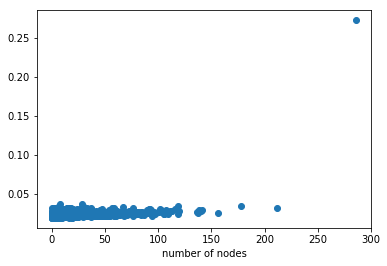

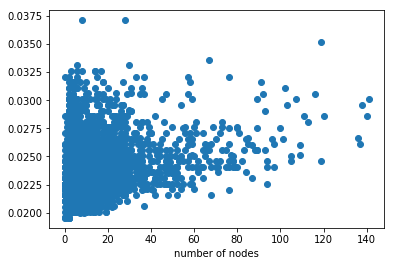

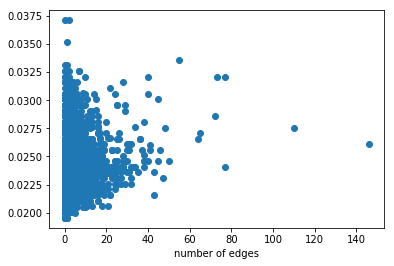

In [217]:
import matplotlib.pyplot as plt
import random

from operator import itemgetter

# remember if you take a slice from a cursor then the slice will get remembered and will overwrite previous instances of slices
cursor.rewind()

n = []
n2 = []

for x in cursor[:]:
    n.append([x['node_count'], x['edge_count'], x['evaluation_time']])
    
    if x['node_count'] <= 150:
        n2.append([x['sparsity'], x['cycles_count'], x['evaluation_time']])

    
n.sort(key=itemgetter(0))
plt.plot([x for x,_,_ in n], [z for x,_,z in n], 'o')
plt.xlabel('number of nodes')
plt.show()    
    
# sort according to number of nodes
n.sort(key=itemgetter(0))
plt.plot([x for x,_,_ in n if x <= 150], [z for x,_,z in n if x <= 150], 'o')
plt.xlabel('number of nodes')
plt.show()

# sort according to number of edges
n.sort(key=itemgetter(1))
plt.plot([y for x,y,_ in n if x <= 150], [z for x,_,z in n if x <= 150], 'o')
plt.xlabel('number of edges')
plt.show()


# sort according to number of eval time
# numbers.sort(key=itemgetter(2))
# plt.plot([y for x,y,_ in numbers if x <= 150], [z for x,_,z in numbers if x <= 150], 'o')
# plt.xlabel('number of edges')
# plt.show()

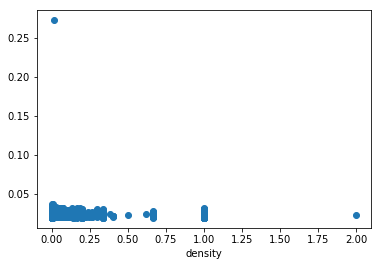

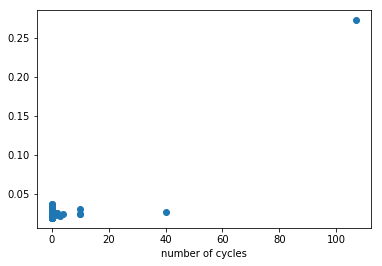

In [216]:
n2.sort(key=itemgetter(0))
plt.plot([x for x,_,_ in n2], [z for _,_,z in n2], 'o')
plt.xlabel('density')
plt.show()    
    
# sort according to number of nodes
n2.sort(key=itemgetter(1))
plt.plot([y for _,y,_ in n2], [z for _,_,z in n2], 'o')
plt.xlabel('number of cycles')
plt.show()

# # sort according to number of edges
# numbers.sort(key=itemgetter(1))
# plt.plot([y for x,y,_ in n2], [z for x,_,z in n2], 'o')
# plt.xlabel('number of edges')
# plt.show()

In [194]:
cursor.count()

7071

In [52]:
import requests

test_link = "http://www.aifdb.org/json/9338"

r = requests.get(test_link)
if r.status_code == requests.codes.ok:
    print('download success')

# test to see we get the string we are looking for
nodessss = map_nodes(r.json())
web_str = get_web_input(r.json(), nodessss)
web_str = web_str.replace('177158^177156', '177158-177156')
print('-----------------------------------------------------------------')
print(web_str)
web_str = rename_nodes(web_str, nodessss)

print('-----------------------------------------------------------------')
result = evaluate(web_str)
print(result)

print('-----------------------------------------------------------------')
result2 = convert_to_abstract(web_str)
print(result2)

print('-----------------------------------------------------------------')
print(len(json.loads(result)['extensions']))

download success
{'transposition': True, 'premises': '177139;177144;177147;177149;177153;177156;177158;177159;177164;177167;177169;177176;177181;177183;177185;177187;177189;177190', 'link': 'last', 'rules': '[r1] 177144=>177143;[r2] 177139=>177143;[r3] 177153=>177150;[r4] 177156=>177155;[r5] 177164=>177165;[r6] 177164=>177168;[r9] 177181=>177180;[r10] 177190=>177192;[r11] 177189=>177192;', 'kbPrefs': '', 'semantics': 'preferred', 'contrariness': '177155-177143;177159^177156;177158^177156;177155^177143;177165^177159;177168^177159;177176^177169;177183^177168;177189^177144;', 'rulePrefs': ''}
-----------------------------------------------------------------
{"transposition": true, "premises": "177139;177144;177147;177149;177153;177156;177158;177159;177164;177167;177169;177176;177181;177183;177185;177187;177189;177190", "link": "last", "rules": "[r1] 177144=>177143;[r2] 177139=>177143;[r3] 177153=>177150;[r4] 177156=>177155;[r5] 177164=>177165;[r6] 177164=>177168;[r9] 177181=>177180;[r10] 

In [14]:
def evaluate(input_string):

    link = 'http://localhost:8080/web_service_war_exploded/helloworld/evaluate/'
    r = requests.post(url=link, data=input_string)
    
    if r.status_code == requests.codes.ok:
        return r.text
    elif r.status_code == 415:
        print('Error ' + str(r.status_code) + ': Wrong input format')
    elif r.status_code == 400:
        print('Error ' + str(r.status_code) + ': Server offline!')

    return None

In [34]:
def convert_to_abstract(input_string):

    link = 'http://localhost:8080/web_service_war_exploded/helloworld/abstract/'
    r = requests.post(url=link, data=input_string)
    
    if r.status_code == requests.codes.ok:
        return r.text
    elif r.status_code == 415:
        print('Error ' + str(r.status_code) + ': Wrong input format')
    elif r.status_code == 400:
        print('Error ' + str(r.status_code) + ': Server offline!')

    return None

In [42]:
rx = requests.post('http://toast.arg-tech.org/api/evaluate', data=web_str)
print(rx.json())

{'transposition': '1', 'wellformed': True, 'result': '', 'extensions': [['A2: Q24', 'A1: Q19', 'A4: Q23', 'A6: Q17', 'A5: Q22', 'A8: Q11', 'A20: A1=>Q18', 'A7: Q21', 'A19: A8=>Q12', 'A18: Q9', 'A11: Q6', 'A10: Q13', 'A27: A11=>Q5', 'A13: Q0', 'A25: A2=>Q25', 'A15: Q20', 'A24: A4=>Q25', 'A17: Q4', 'A16: Q3', 'A21: A13=>Q1']], 'acceptableConclusions': [['Q24', 'Q19', 'Q23', 'Q17', 'Q22', 'Q11', 'Q18', 'Q21', 'Q12', 'Q9', 'Q6', 'Q13', 'Q5', 'Q0', 'Q25', 'Q20', 'Q25', 'Q4', 'Q3', 'Q1']], 'arguments': ['A27: A11=>Q5', 'A26: A12=>Q7', 'A25: A2=>Q25', 'A24: A4=>Q25', 'A23: A14=>Q1', 'A22: A8=>Q14', 'A21: A13=>Q1', 'A20: A1=>Q18', 'A19: A8=>Q12', 'A18: Q9', 'A17: Q4', 'A16: Q3', 'A15: Q20', 'A14: Q2', 'A13: Q0', 'A12: Q8', 'A11: Q6', 'A10: Q13', 'A9: Q10', 'A8: Q11', 'A7: Q21', 'A6: Q17', 'A5: Q22', 'A4: Q23', 'A3: Q15', 'A2: Q24', 'A1: Q19'], 'defeat': ['A4>A23', 'A9>A12', 'A9>A26', 'A23>A26', 'A26>A21', 'A26>A23', 'A4>A14', 'A15>A22', 'A6>A3', 'A18>A26', 'A18>A12', 'A22>A9', 'A19>A9', 'A21>A

In [47]:
rules = '[r1] Q2=>Q1;[r2] Q0=>Q1;[r3] Q6=>Q5;\
         [r4] Q8=>Q7;[r5] Q11=>Q12;[r6] Q11=>Q14;\
         [r9] Q19=>Q18;[r10] Q24=>Q25;[r11] Q23=>Q25;'

rulex = '[r1] 43462=>43453;[r2] 43474=>43488;[r4] 43474=>43468;\
         [r5] 43494=>43488;[r6] 43488=>43500;'

print(len(rules.split(';')))
print(rules.split(';'))
print('--------------------------------------------------------------------')
print(len(rulex.split(';')))
print(rulex.split(';'))

10
['[r1] Q2=>Q1', '[r2] Q0=>Q1', '[r3] Q6=>Q5', '         [r4] Q8=>Q7', '[r5] Q11=>Q12', '[r6] Q11=>Q14', '         [r9] Q19=>Q18', '[r10] Q24=>Q25', '[r11] Q23=>Q25', '']
--------------------------------------------------------------------
6
['[r1] 43462=>43453', '[r2] 43474=>43488', '[r4] 43474=>43468', '         [r5] 43494=>43488', '[r6] 43488=>43500', '']


In [59]:
test = [['A1', 'A4'], ['A1', 'A7'], ['A1', 'A8'], ['A1', 'A9'], 
        ['A3', 'A5'], ['A3', 'A7'], ['A3', 'A8'], ['A3', 'A9'], 
        ['A4', 'A1'], ['A4', 'A3'], ['A4', 'A5'], ['A4', 'A7'], 
        ['A4', 'A8'], ['A4', 'A9'], ['A5', 'A3'], ['A5', 'A4'], 
        ['A5', 'A8'], ['A7', 'A1'], ['A7', 'A3'], ['A7', 'A4'], 
        ['A7', 'A5'], ['A7', 'A8'], ['A7', 'A9'], ['A8', 'A3'], 
        ['A8', 'A4'], ['A9', 'A3'], ['A9', 'A4'], ['A9', 'A8']]
count = 0

for a, b in combinations(test, 2):
    if set(a) == set(b):
        print(set(a))
        count += 1
print(count)

{'A1', 'A4'}
{'A7', 'A1'}
{'A3', 'A5'}
{'A7', 'A3'}
{'A3', 'A8'}
{'A9', 'A3'}
{'A4', 'A5'}
{'A7', 'A4'}
{'A4', 'A8'}
{'A9', 'A4'}
10
